In [1]:
import numpy as np
import matplotlib.pyplot as plt

import ipywidgets as widgets

from IPython.display import display

In [2]:
NUM_STATES = 4
NUM_OBSERVATIONS = 2
NUM_BELIEFS = 2 # TARGET vs. NON TARGET
ANGLE_RANGE = 2*np.pi

STATE_STEP = ANGLE_RANGE/NUM_STATES
STATE_CENTERS = np.arange(0, ANGLE_RANGE, STATE_STEP) + STATE_STEP
ANGL_DIST_BETWEEN_STATES = (STATE_CENTERS[np.newaxis, :] - STATE_CENTERS[:, np.newaxis])

PRIOR_TARGET_PROB = np.array([1/NUM_BELIEFS, 1-(1/NUM_BELIEFS)])
PRIOR_STATE_PROB = np.full(NUM_STATES, 1/NUM_STATES)
LIKELIHOOD_OBS_FROM_NONTARGET = 1/NUM_OBSERVATIONS

In [3]:
STATE_STEP

1.5707963267948966

In [4]:
def get_state_transition_matrix(candidate_step):
    if candidate_step>0:
        mod_basis = 2*np.pi
    else:
        mod_basis = -2*np.pi

    angular_dist_between_states_in_extent = ANGL_DIST_BETWEEN_STATES % mod_basis
    angular_dist_after_action = (angular_dist_between_states_in_extent - candidate_step)
    angular_dist_after_action_in_extent = angular_dist_after_action % mod_basis
    
    sigma = STATE_STEP/10
    magnitude = 1 / np.sqrt((2*np.pi) * (sigma**2))
    state_transition = magnitude * np.exp(-0.5*((angular_dist_after_action_in_extent/sigma)**2))
    state_transition_normed = state_transition / state_transition.sum(axis=1)
    return state_transition_normed

In [5]:
candidate_step = -STATE_STEP
state_transition_matrix = get_state_transition_matrix(candidate_step)
state_transition_matrix.round(3)

array([[0., 0., 0., 1.],
       [1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.]])

In [6]:
candidate_step = 0
state_transition_matrix = get_state_transition_matrix(candidate_step)
state_transition_matrix.round(3)

array([[1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 0., 1.]])

In [7]:
candidate_step = STATE_STEP
state_transition_matrix = get_state_transition_matrix(candidate_step)
state_transition_matrix.round(3)

array([[0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 0., 1.],
       [1., 0., 0., 0.]])

In [8]:
obs1_bounds = np.array([60, 120])

In [9]:
def observe_angle_state_pair(initial_angle):
   plt.figure(figsize=(6, 6))
   radius = 1
   radius_until = 5
   pie = np.pi
   theta_obs1 = np.linspace(np.radians(obs1_bounds[0]), np.radians(obs1_bounds[1]), 30)
   x_inner = radius * np.cos(theta_obs1)
   y_inner =  radius * np.sin(theta_obs1)
   x_poly = np.concatenate([radius_until*x_inner, x_inner[::-1]])
   y_poly = np.concatenate([radius_until*y_inner, y_inner[::-1]])
   plt.fill(x_poly, y_poly, facecolor='blue', alpha=0.25, linewidth=0)
   plt.plot(x_inner, y_inner, color='blue', linewidth=1)

   theta_obs0 = np.linspace(np.radians(obs1_bounds[1]), np.radians(obs1_bounds[0])+2*pie, 30)
   x_inner = radius * np.cos(theta_obs0)
   y_inner =  radius * np.sin(theta_obs0)
   x_poly = np.concatenate([radius_until*x_inner, x_inner[::-1]])
   y_poly = np.concatenate([radius_until*y_inner, y_inner[::-1]])
   plt.fill(x_poly, y_poly, facecolor='orange', alpha=0.25, linewidth=0)
   plt.plot(x_inner, y_inner, color='orange', linewidth=1)

   for theta in STATE_CENTERS:
      r_outer = 4 * radius_until * radius
      plt.plot([radius*np.cos(theta), r_outer*np.cos(theta)], 
               [radius*np.sin(theta), r_outer*np.sin(theta)],
                  color='k', linewidth=1.5, solid_capstyle='round', zorder=1)
      plt.plot([radius*np.cos(theta + (STATE_STEP/2)), r_outer*np.cos(theta + (STATE_STEP/2))], 
               [radius*np.sin(theta + (STATE_STEP/2)), r_outer*np.sin(theta + (STATE_STEP/2))],
                  color='k', linewidth=1, linestyle='dashed', zorder=1)
      
   if initial_angle >= obs1_bounds[0] and initial_angle <= obs1_bounds[1]:
      code_received = 1
   else:
      code_received = 0
   initial_radians = np.radians((initial_angle % 360))
   initial_state = np.floor((initial_radians) / STATE_STEP)
   plt.scatter(radius_until*radius*np.cos(initial_radians), radius_until*radius*np.sin(initial_radians),
            s=200, marker='.', facecolor='r', edgecolor='k', zorder=4, label=f'State={initial_state}\nCode={code_received}')

   plt.gca().set_aspect('equal', adjustable='box')
   plt.xticks([])
   plt.yticks([])
   GRID_EXTENT = 7
   plt.xlim(-GRID_EXTENT, GRID_EXTENT)
   plt.ylim(-GRID_EXTENT, GRID_EXTENT)
   plt.legend()
   plt.show()


In [10]:
initial_angle_slider = widgets.IntSlider(
    value=0,  
    min=0,
    max=360,
    description="Initial Angle",
    style={'description_width': 'initial'},
    continuous_update=True,
    layout=widgets.Layout(width="600px"),
)

interactive_plot = widgets.interactive(
    observe_angle_state_pair, initial_angle=initial_angle_slider)
display(interactive_plot)

interactive(children=(IntSlider(value=0, description='Initial Angle', layout=Layout(width='600px'), max=360, s…

In [11]:
code0_extent_in_states = np.zeros(NUM_STATES) + STATE_STEP
code0_extent_in_states[1] = 0
code1_extent_in_states = np.zeros(NUM_STATES)
code1_extent_in_states[1] = STATE_STEP

prob_code0_in_states = code0_extent_in_states / STATE_STEP
prob_code1_in_states = code1_extent_in_states / STATE_STEP

EMISSION_MATRIX_B = np.vstack([prob_code0_in_states, prob_code1_in_states])
EMISSION_MATRIX_B

array([[1., 0., 1., 1.],
       [0., 1., 0., 0.]])

In [12]:
trial_num = 0
num_trials = 10
max_iter = 50
posterior_across_trials = np.zeros((num_trials, max_iter+1, NUM_BELIEFS))

Current angle: 0.0, Code received: 0.0


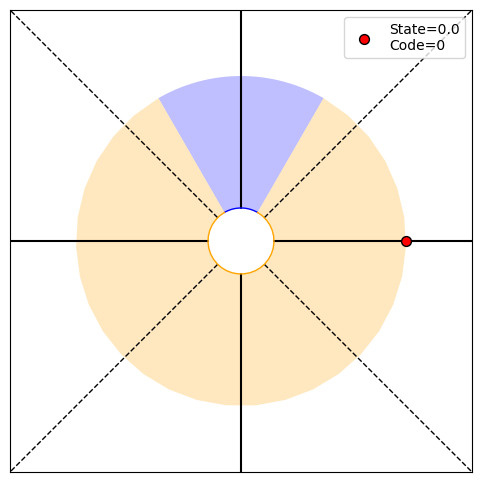

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.04730118 0.04730118], [0.6 0.4]
Choosing randomly
Current angle: 90.0, Code received: 1.0


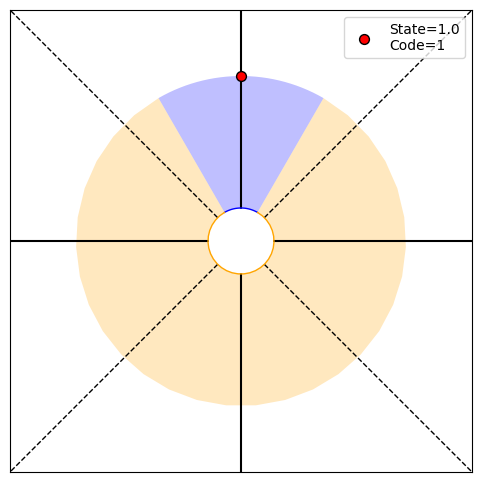

P(O1:2,S2|T)=[0.   0.25 0.   0.  ], P(O1:2|actions,T)=0.25, P(T|O1:2)=[0.42857143 0.57142857], H2=0.99
PRINT 1: 0.9852281360342514, [0.   0.25 0.   0.  ]
PRINT 2: [0.04749944 0.04749944], [0.42857143 0.57142857]
Choosing randomly
Current angle: 0.0, Code received: 0.0


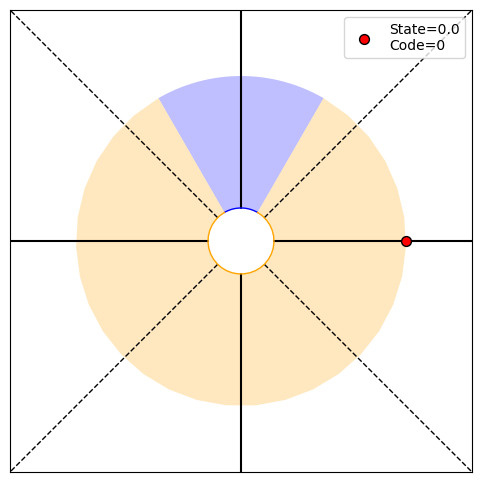

P(O1:3,S3|T)=[0.25 0.   0.25 0.25], P(O1:3|actions,T)=0.75, P(T|O1:3)=[0.52941176 0.47058824], H3=1.00
PRINT 1: 0.9975025463691152, [0.25 0.   0.25 0.25]
PRINT 2: [0.04875988 0.04875988], [0.52941176 0.47058824]
Choosing randomly
Current angle: 90.0, Code received: 1.0


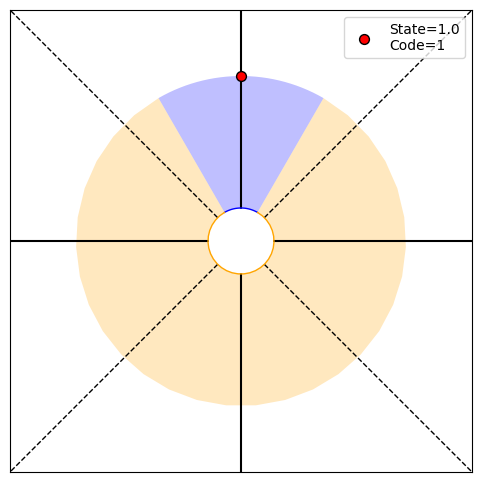

P(O1:4,S4|T)=[0.   0.25 0.   0.  ], P(O1:4|actions,T)=0.25, P(T|O1:4)=[0.36 0.64], H4=0.94
PRINT 1: 0.9426831892554923, [0.   0.25 0.   0.  ]
PRINT 2: [0.04444034 0.04444034], [0.36 0.64]
Choosing randomly
Current angle: 0.0, Code received: 0.0


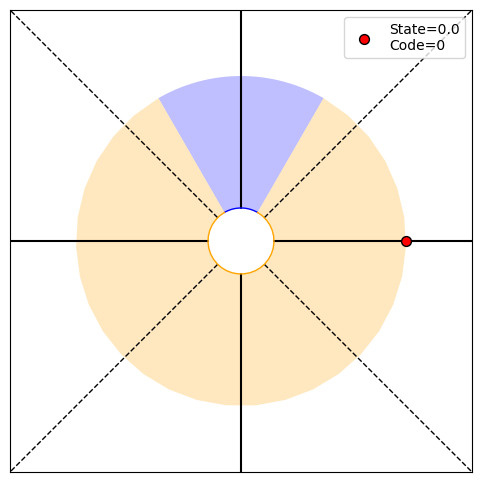

P(O1:5,S5|T)=[0.25 0.   0.25 0.25], P(O1:5|actions,T)=0.75, P(T|O1:5)=[0.45762712 0.54237288], H5=0.99
PRINT 1: 0.9948131754904235, [0.25 0.   0.25 0.25]
PRINT 2: [0.04826098 0.04826098], [0.45762712 0.54237288]
Choosing randomly
Current angle: -90.0, Code received: 0.0


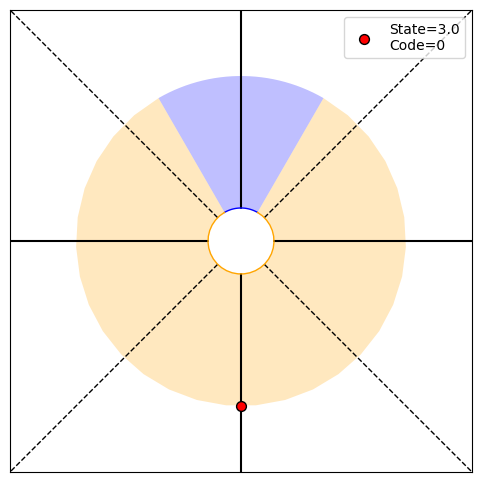

P(O1:6,S6|T)=[0.25 0.   0.25 0.25], P(O1:6|actions,T)=0.75, P(T|O1:6)=[0.55862069 0.44137931], H6=0.99
PRINT 1: 0.9900618470242131, [0.25 0.   0.25 0.25]
PRINT 2: [0.04839299 0.04839299], [0.55862069 0.44137931]
Choosing randomly
Current angle: 0.0, Code received: 0.0


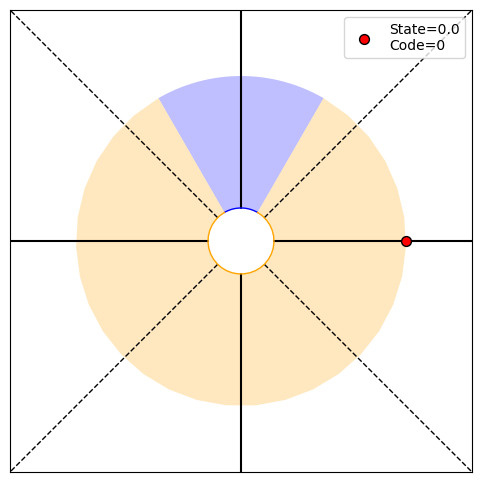

P(O1:7,S7|T)=[0.25 0.   0.25 0.25], P(O1:7|actions,T)=0.75, P(T|O1:7)=[0.65498652 0.34501348], H7=0.93
PRINT 1: 0.9295356505393888, [0.25 0.   0.25 0.25]
PRINT 2: [0.04479852 0.04479852], [0.65498652 0.34501348]
Choosing randomly
Current angle: 90.0, Code received: 1.0


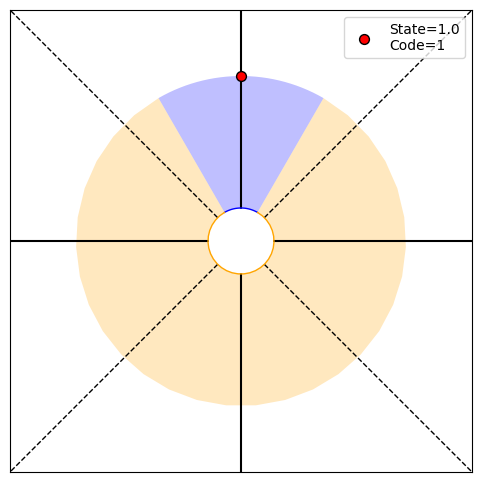

P(O1:8,S8|T)=[0.   0.25 0.   0.  ], P(O1:8|actions,T)=0.25, P(T|O1:8)=[0.48697395 0.51302605], H8=1.00
PRINT 1: 0.999510357288754, [0.   0.25 0.   0.  ]
PRINT 2: [0.04870398 0.04870398], [0.48697395 0.51302605]
Choosing randomly
Current angle: 180.0, Code received: 0.0


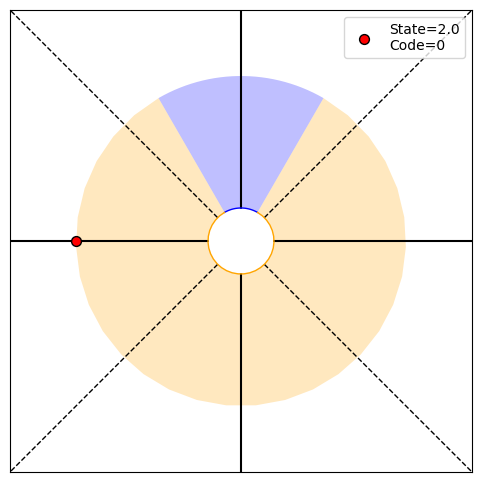

P(O1:9,S9|T)=[0.25 0.   0.25 0.25], P(O1:9|actions,T)=0.75, P(T|O1:9)=[0.58742949 0.41257051], H9=0.98
PRINT 1: 0.9778305281284734, [0.25 0.   0.25 0.25]
PRINT 2: [0.04770421 0.04770421], [0.58742949 0.41257051]
Choosing randomly
Current angle: 270.0, Code received: 0.0


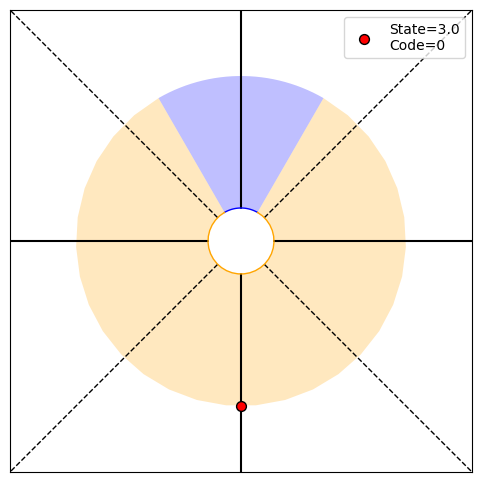

P(O1:10,S10|T)=[0.25 0.   0.25 0.25], P(O1:10|actions,T)=0.75, P(T|O1:10)=[0.68109623 0.31890377], H10=0.90
PRINT 1: 0.9031853603330013, [0.25 0.   0.25 0.25]
PRINT 2: [0.04318388 0.04318388], [0.68109623 0.31890377]
Choosing randomly
Current angle: 360.0, Code received: 0.0


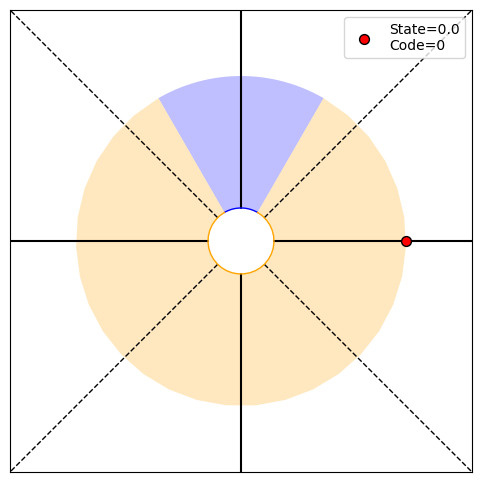

P(O1:11,S11|T)=[0.25 0.   0.25 0.25], P(O1:11|actions,T)=0.75, P(T|O1:11)=[0.76210942 0.23789058], H11=0.79
PRINT 1: 0.7915147543541923, [0.25 0.   0.25 0.25]
PRINT 2: [0.0363905 0.0363905], [0.76210942 0.23789058]
Choosing randomly
Current angle: 270.0, Code received: 0.0


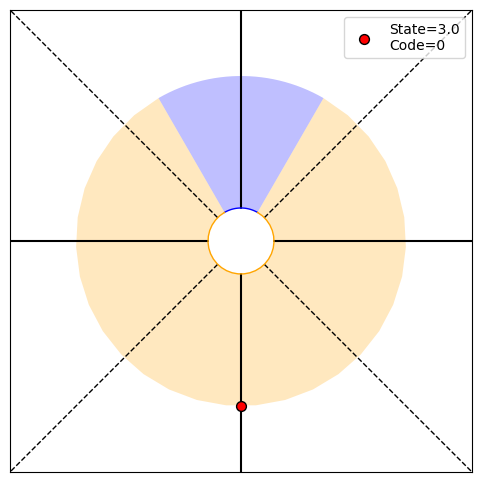

P(O1:12,S12|T)=[0.25 0.   0.25 0.25], P(O1:12|actions,T)=0.75, P(T|O1:12)=[0.82774717 0.17225283], H12=0.66
PRINT 1: 0.662832439939511, [0.25 0.   0.25 0.25]
PRINT 2: [0.02885939 0.02885939], [0.82774717 0.17225283]
Choosing randomly
Current angle: 360.0, Code received: 0.0


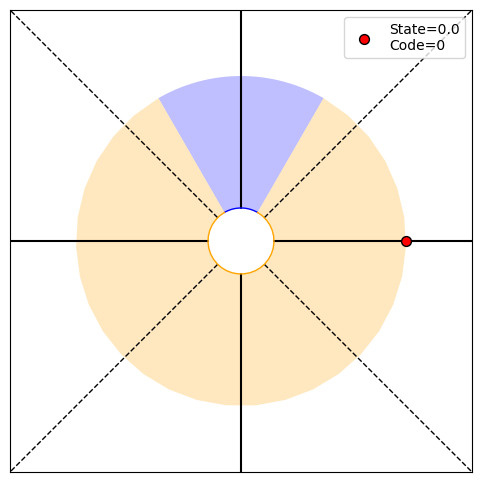

P(O1:13,S13|T)=[0.25 0.   0.25 0.25], P(O1:13|actions,T)=0.75, P(T|O1:13)=[0.87816957 0.12183043], H13=0.53
PRINT 1: 0.5345995950135116, [0.25 0.   0.25 0.25]
PRINT 2: [0.02180339 0.02180339], [0.87816957 0.12183043]
Choosing randomly
Current angle: 270.0, Code received: 0.0


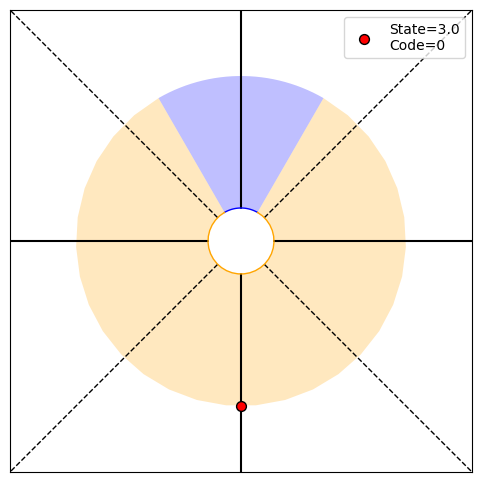

P(O1:14,S14|T)=[0.25 0.   0.25 0.25], P(O1:14|actions,T)=0.75, P(T|O1:14)=[0.91534173 0.08465827], H14=0.42
PRINT 1: 0.4183838865719063, [0.25 0.   0.25 0.25]
PRINT 2: [0.01587577 0.01587577], [0.91534173 0.08465827]
Choosing randomly
Current angle: 180.0, Code received: 0.0


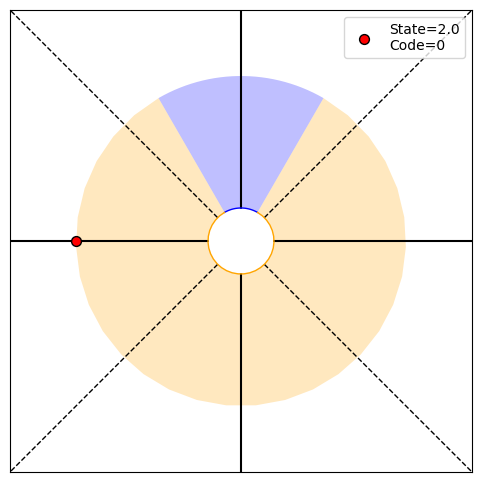

P(O1:15,S15|T)=[0.25 0.   0.25 0.25], P(O1:15|actions,T)=0.75, P(T|O1:15)=[0.94192223 0.05807777], H15=0.32
PRINT 1: 0.31976664219366807, [0.25 0.   0.25 0.25]
PRINT 2: [0.01125131 0.01125131], [0.94192223 0.05807777]
Choosing randomly
Current angle: 90.0, Code received: 1.0


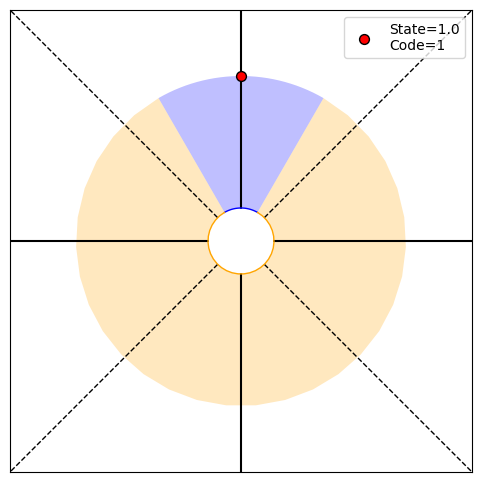

P(O1:16,S16|T)=[0.   0.25 0.   0.  ], P(O1:16|actions,T)=0.25, P(T|O1:16)=[0.89022023 0.10977977], H16=0.50
PRINT 1: 0.4992513317937649, [0.   0.25 0.   0.  ]
PRINT 2: [0.01994999 0.01994999], [0.89022023 0.10977977]
Choosing randomly
Current angle: 180.0, Code received: 0.0


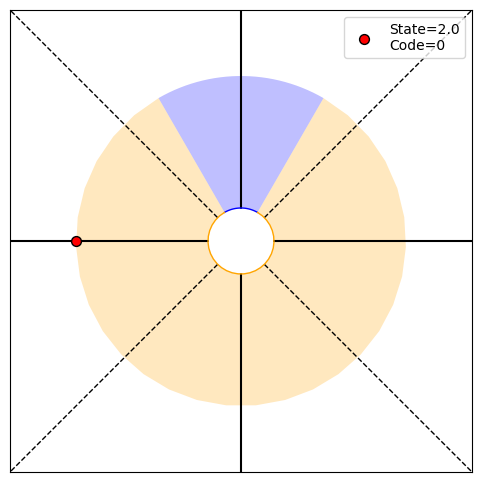

P(O1:17,S17|T)=[0.25 0.   0.25 0.25], P(O1:17|actions,T)=0.75, P(T|O1:17)=[0.92403363 0.07596637], H17=0.39
PRINT 1: 0.3878044817510641, [0.25 0.   0.25 0.25]
PRINT 2: [0.01439927 0.01439927], [0.92403363 0.07596637]
Choosing randomly
Current angle: 270.0, Code received: 0.0


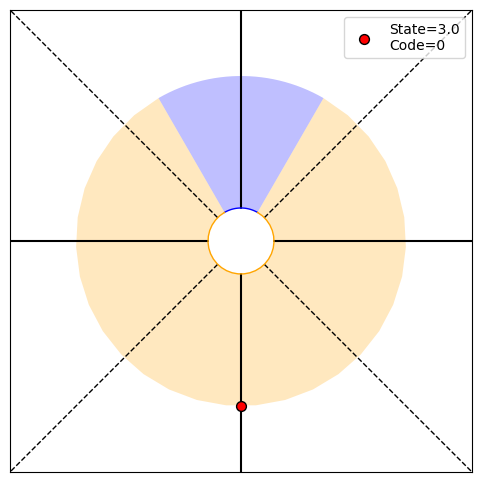

P(O1:18,S18|T)=[0.25 0.   0.25 0.25], P(O1:18|actions,T)=0.75, P(T|O1:18)=[0.94804001 0.05195999], H18=0.29
PRINT 1: 0.2946652044463461, [0.25 0.   0.25 0.25]
PRINT 2: [0.01014077 0.01014077], [0.94804001 0.05195999]
Choosing randomly
Current angle: 180.0, Code received: 0.0


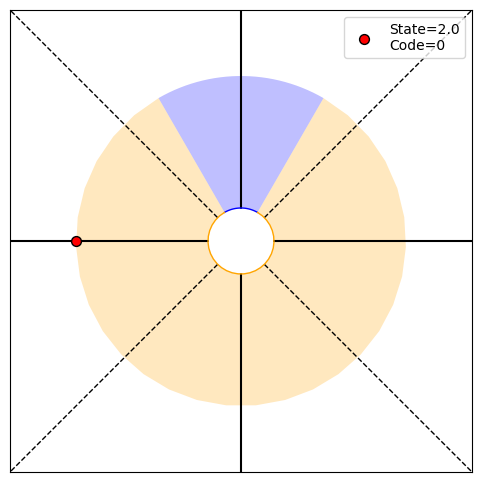

P(O1:19,S19|T)=[0.25 0.   0.25 0.25], P(O1:19|actions,T)=0.75, P(T|O1:19)=[0.96474947 0.03525053], H19=0.22
PRINT 1: 0.2200751986372056, [0.25 0.   0.25 0.25]
PRINT 2: [0.00701866 0.00701866], [0.96474947 0.03525053]
Choosing randomly
Current angle: 270.0, Code received: 0.0


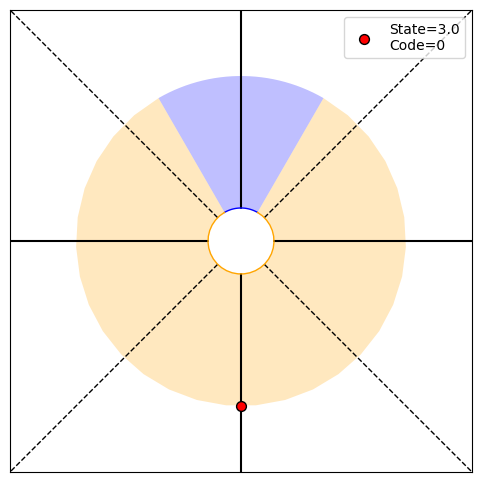

P(O1:20,S20|T)=[0.25 0.   0.25 0.25], P(O1:20|actions,T)=0.75, P(T|O1:20)=[0.97622023 0.02377977], H20=0.16
PRINT 1: 0.1621667425859634, [0.25 0.   0.25 0.25]
PRINT 2: [0.00479949 0.00479949], [0.97622023 0.02377977]
Choosing randomly
Current angle: 360.0, Code received: 0.0


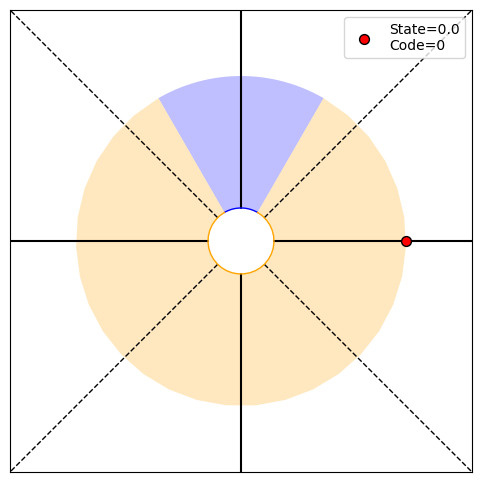

P(O1:21,S21|T)=[0.25 0.   0.25 0.25], P(O1:21|actions,T)=0.75, P(T|O1:21)=[0.98402015 0.01597985], H21=0.12
PRINT 1: 0.11823022358658543, [0.25 0.   0.25 0.25]
PRINT 2: [0.00325493 0.00325493], [0.98402015 0.01597985]
Choosing randomly
Current angle: 270.0, Code received: 0.0


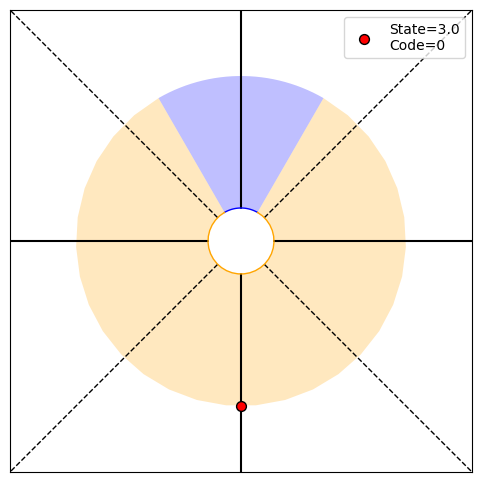

P(O1:22,S22|T)=[0.25 0.   0.25 0.25], P(O1:22|actions,T)=0.75, P(T|O1:22)=[0.98928972 0.01071028], H22=0.09
PRINT 1: 0.08546590665756236, [0.25 0.   0.25 0.25]
PRINT 2: [0.00219507 0.00219507], [0.98928972 0.01071028]
Choosing randomly
Current angle: 360.0, Code received: 0.0


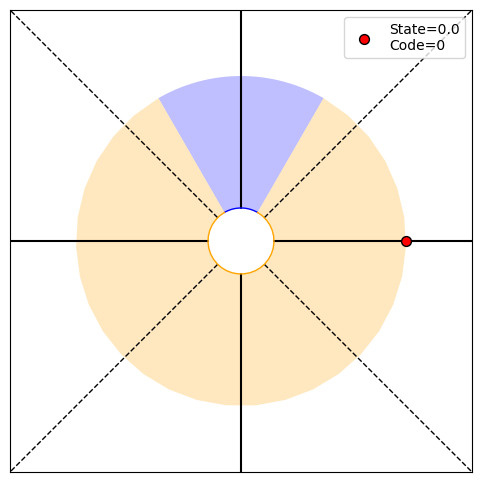

P(O1:23,S23|T)=[0.25 0.   0.25 0.25], P(O1:23|actions,T)=0.75, P(T|O1:23)=[0.99283423 0.00716577], H23=0.06
PRINT 1: 0.061354578029053496, [0.25 0.   0.25 0.25]
PRINT 2: [0.0014747 0.0014747], [0.99283423 0.00716577]
Choosing randomly
Current angle: 270.0, Code received: 0.0


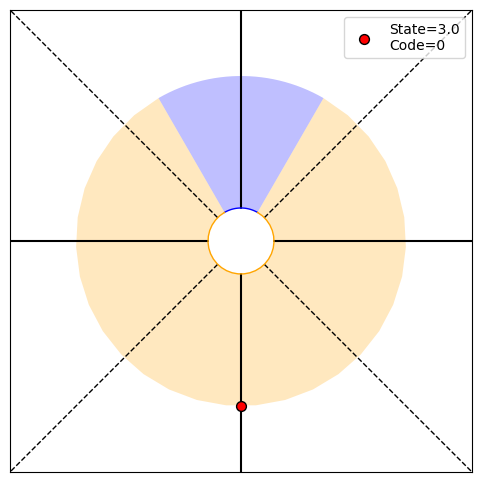

P(O1:24,S24|T)=[0.25 0.   0.25 0.25], P(O1:24|actions,T)=0.75, P(T|O1:24)=[0.99521138 0.00478862], H24=0.04
PRINT 1: 0.04379387095836709, [0.25 0.   0.25 0.25]
PRINT 2: [0.00098822 0.00098822], [0.99521138 0.00478862]
Choosing randomly
Current angle: 360.0, Code received: 0.0


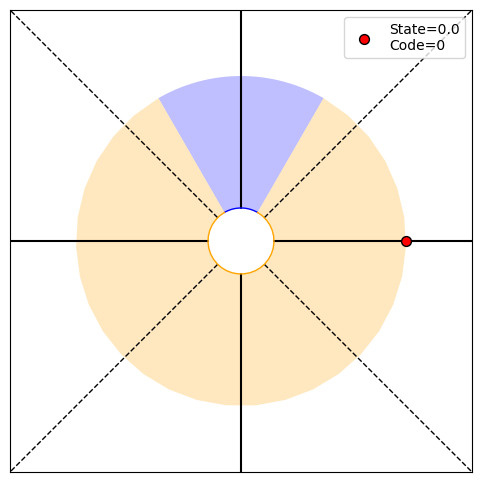

P(O1:25,S25|T)=[0.25 0.   0.25 0.25], P(O1:25|actions,T)=0.75, P(T|O1:25)=[0.99680248 0.00319752], H25=0.03
PRINT 1: 0.031109328274399536, [0.25 0.   0.25 0.25]
PRINT 2: [0.00066109 0.00066109], [0.99680248 0.00319752]
Choosing randomly
Current angle: 450.0, Code received: 1.0


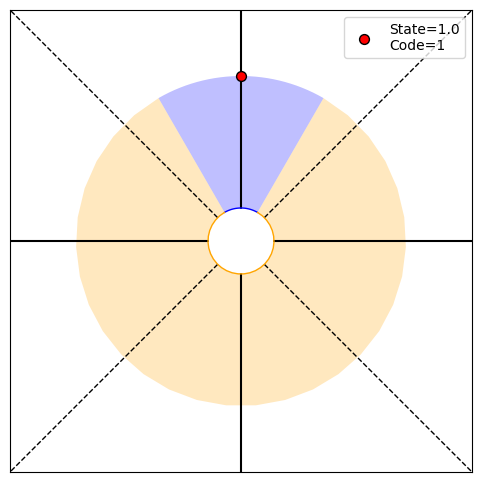

P(O1:26,S26|T)=[0.   0.25 0.   0.  ], P(O1:26|actions,T)=0.25, P(T|O1:26)=[0.99362535 0.00637465], H26=0.06
PRINT 1: 0.055660400907522195, [0.   0.25 0.   0.  ]
PRINT 2: [0.0013131 0.0013131], [0.99362535 0.00637465]
Choosing randomly
Current angle: 360.0, Code received: 0.0


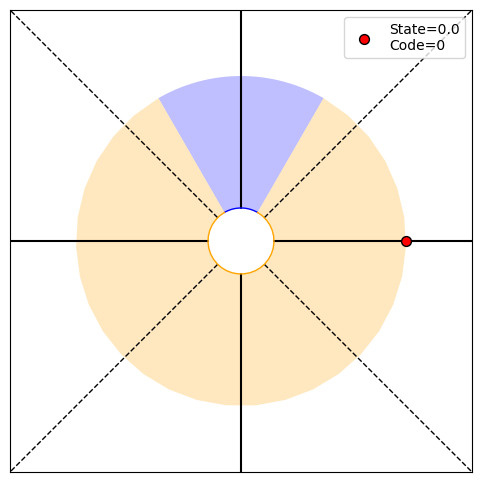

P(O1:27,S27|T)=[0.25 0.   0.25 0.25], P(O1:27|actions,T)=0.75, P(T|O1:27)=[0.99574119 0.00425881], H27=0.04
PRINT 1: 0.03967065026429184, [0.25 0.   0.25 0.25]
PRINT 2: [0.00087943 0.00087943], [0.99574119 0.00425881]
Choosing randomly
Current angle: 450.0, Code received: 1.0


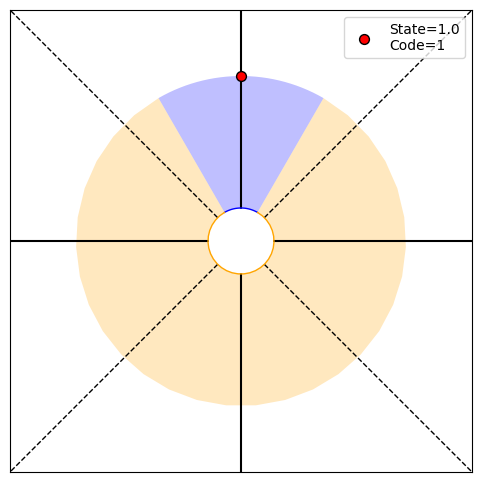

P(O1:28,S28|T)=[0.   0.25 0.   0.  ], P(O1:28|actions,T)=0.25, P(T|O1:28)=[0.99151849 0.00848151], H28=0.07
PRINT 1: 0.07054938124621629, [0.   0.25 0.   0.  ]
PRINT 2: [0.00174281 0.00174281], [0.99151849 0.00848151]
Choosing randomly
Current angle: 360.0, Code received: 0.0


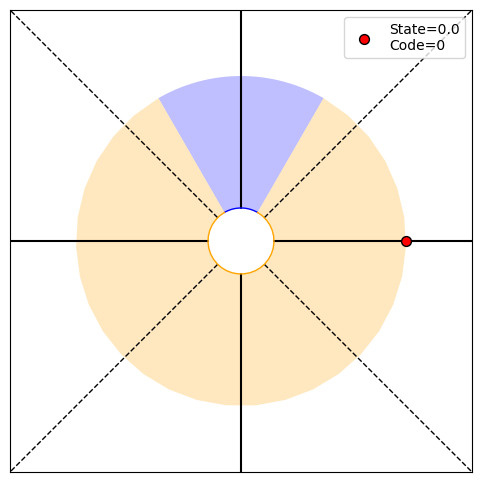

P(O1:29,S29|T)=[0.25 0.   0.25 0.25], P(O1:29|actions,T)=0.75, P(T|O1:29)=[0.99432963 0.00567037], H29=0.05
PRINT 1: 0.05047161388278502, [0.25 0.   0.25 0.25]
PRINT 2: [0.00116899 0.00116899], [0.99432963 0.00567037]
Choosing randomly
Current angle: 270.0, Code received: 0.0


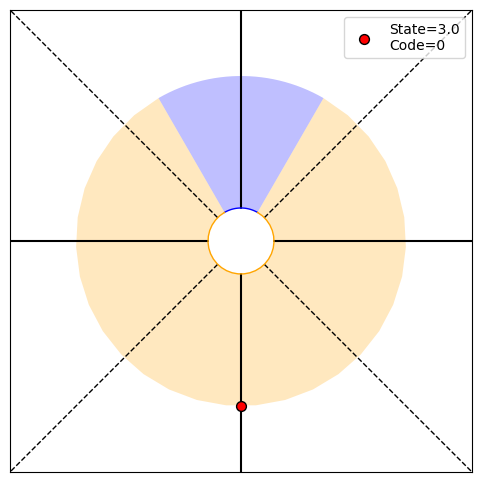

P(O1:30,S30|T)=[0.25 0.   0.25 0.25], P(O1:30|actions,T)=0.75, P(T|O1:30)=[0.99621259 0.00378741], H30=0.04
PRINT 1: 0.035921774556502556, [0.25 0.   0.25 0.25]
PRINT 2: [0.00078251 0.00078251], [0.99621259 0.00378741]
Choosing randomly
Current angle: 360.0, Code received: 0.0


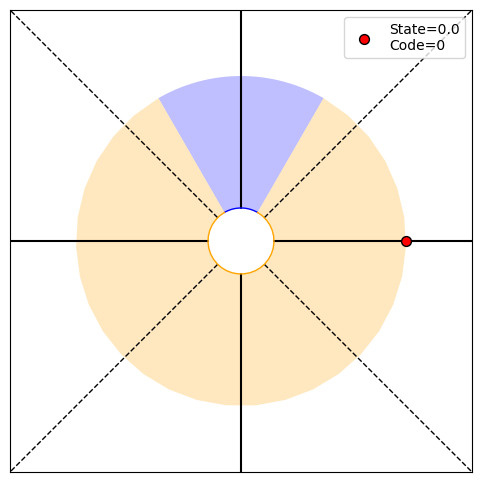

P(O1:31,S31|T)=[0.25 0.   0.25 0.25], P(O1:31|actions,T)=0.75, P(T|O1:31)=[0.99747187 0.00252813], H31=0.03
PRINT 1: 0.025454675535444934, [0.25 0.   0.25 0.25]
PRINT 2: [0.0005231 0.0005231], [0.99747187 0.00252813]
Choosing randomly
Current angle: 270.0, Code received: 0.0


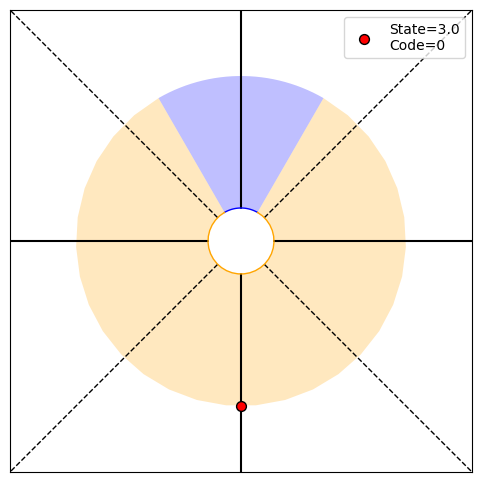

P(O1:32,S32|T)=[0.25 0.   0.25 0.25], P(O1:32|actions,T)=0.75, P(T|O1:32)=[0.99831316 0.00168684], H32=0.02
PRINT 1: 0.01796980825961183, [0.25 0.   0.25 0.25]
PRINT 2: [0.00034937 0.00034937], [0.99831316 0.00168684]
Choosing randomly
Current angle: 180.0, Code received: 0.0


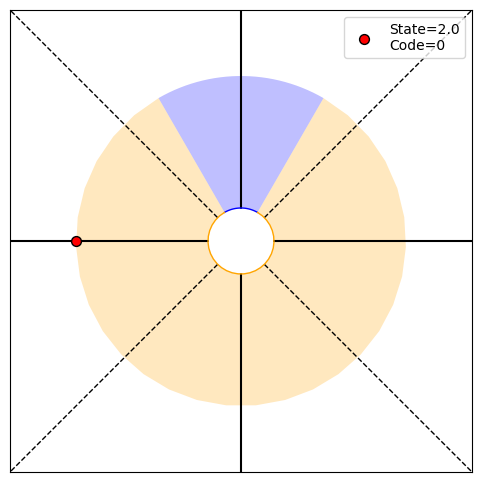

P(O1:33,S33|T)=[0.25 0.   0.25 0.25], P(O1:33|actions,T)=0.75, P(T|O1:33)=[0.99887481 0.00112519], H33=0.01
PRINT 1: 0.0126443510250423, [0.25 0.   0.25 0.25]
PRINT 2: [0.00023319 0.00023319], [0.99887481 0.00112519]
Choosing randomly
Current angle: 270.0, Code received: 0.0


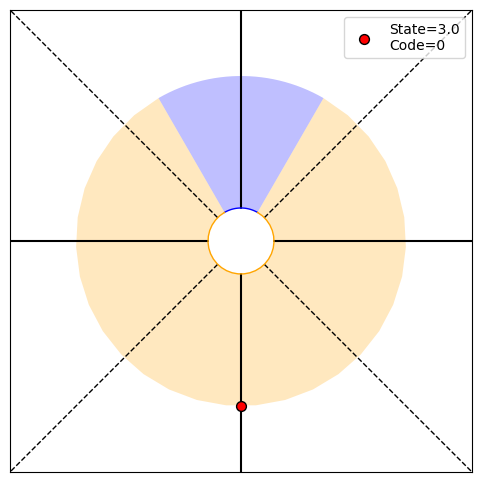

P(O1:34,S34|T)=[0.25 0.   0.25 0.25], P(O1:34|actions,T)=0.75, P(T|O1:34)=[9.99249590e-01 7.50410149e-04], H34=0.01
PRINT 1: 0.008871488837464457, [0.25 0.   0.25 0.25]
PRINT 2: [0.00015559 0.00015559], [9.99249590e-01 7.50410149e-04]
Choosing randomly
Current angle: 360.0, Code received: 0.0


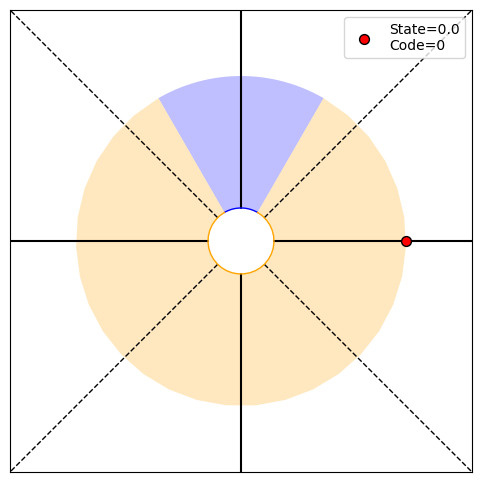

P(O1:35,S35|T)=[0.25 0.   0.25 0.25], P(O1:35|actions,T)=0.75, P(T|O1:35)=[9.99499601e-01 5.00398601e-04], H35=0.01
PRINT 1: 0.00620842974890392, [0.25 0.   0.25 0.25]
PRINT 2: [0.00010378 0.00010378], [9.99499601e-01 5.00398601e-04]
Choosing randomly
Current angle: 270.0, Code received: 0.0


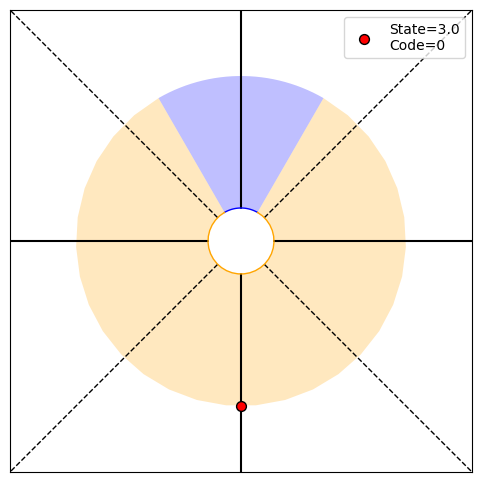

P(O1:36,S36|T)=[0.25 0.   0.25 0.25], P(O1:36|actions,T)=0.75, P(T|O1:36)=[9.99666345e-01 3.33654721e-04], H36=0.00
PRINT 1: 0.00433477900191099, [0.25 0.   0.25 0.25]
PRINT 2: [6.92128443e-05 6.92128443e-05], [9.99666345e-01 3.33654721e-04]
Choosing randomly
Current angle: 180.0, Code received: 0.0


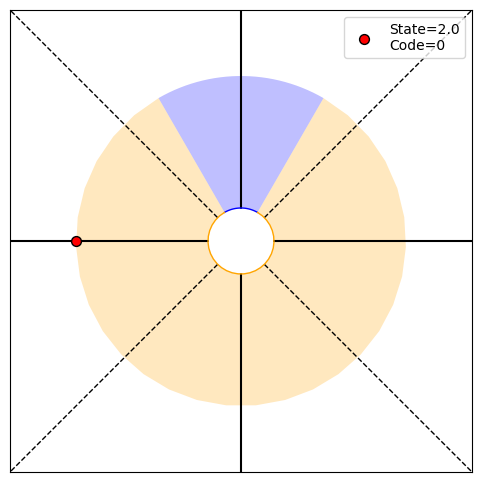

P(O1:37,S37|T)=[0.25 0.   0.25 0.25], P(O1:37|actions,T)=0.75, P(T|O1:37)=[9.99777539e-01 2.22461222e-04], H37=0.00
PRINT 1: 0.003020287730804529, [0.25 0.   0.25 0.25]
PRINT 2: [4.61529757e-05 4.61529757e-05], [9.99777539e-01 2.22461222e-04]
Choosing randomly
Current angle: 270.0, Code received: 0.0


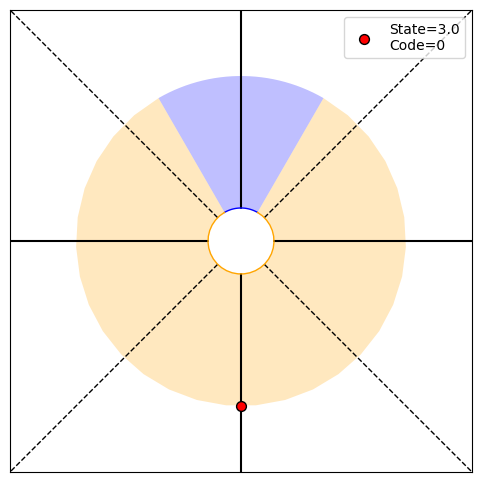

P(O1:38,S38|T)=[0.25 0.   0.25 0.25], P(O1:38|actions,T)=0.75, P(T|O1:38)=[9.99851682e-01 1.48318480e-04], H38=0.00
PRINT 1: 0.0021004272897867807, [0.25 0.   0.25 0.25]
PRINT 2: [3.07735762e-05 3.07735762e-05], [9.99851682e-01 1.48318480e-04]
Choosing randomly
Current angle: 360.0, Code received: 0.0


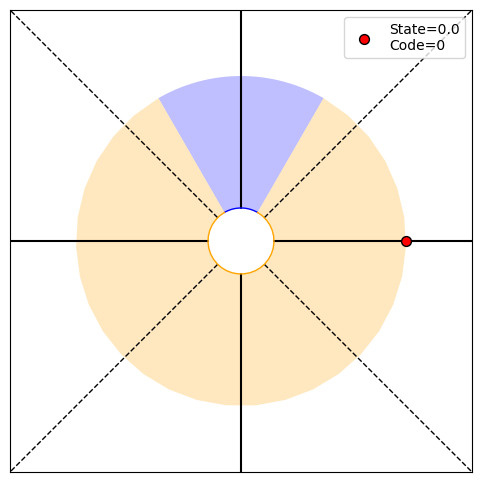

P(O1:39,S39|T)=[0.25 0.   0.25 0.25], P(O1:39|actions,T)=0.75, P(T|O1:39)=[9.99901116e-01 9.88838753e-05], H39=0.00
PRINT 1: 0.0014581939249031835, [0.25 0.   0.25 0.25]
PRINT 2: [2.05179071e-05 2.05179071e-05], [9.99901116e-01 9.88838753e-05]
Choosing randomly
Current angle: 450.0, Code received: 1.0


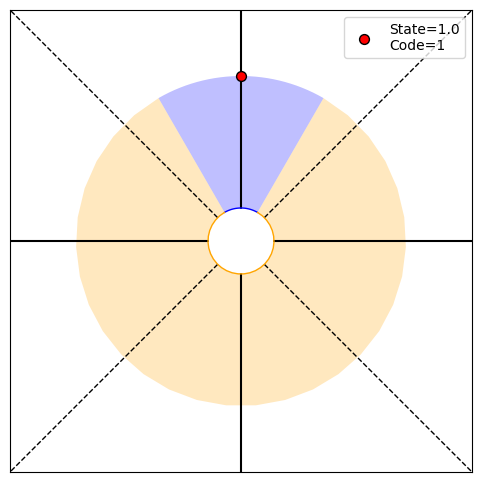

P(O1:40,S40|T)=[0.   0.25 0.   0.  ], P(O1:40|actions,T)=0.25, P(T|O1:40)=[9.99802252e-01 1.97748197e-04], H40=0.00
PRINT 1: 0.002718365403383409, [0.   0.25 0.   0.  ]
PRINT 2: [4.10270563e-05 4.10270563e-05], [9.99802252e-01 1.97748197e-04]
Choosing randomly
Current angle: 540.0, Code received: 0.0


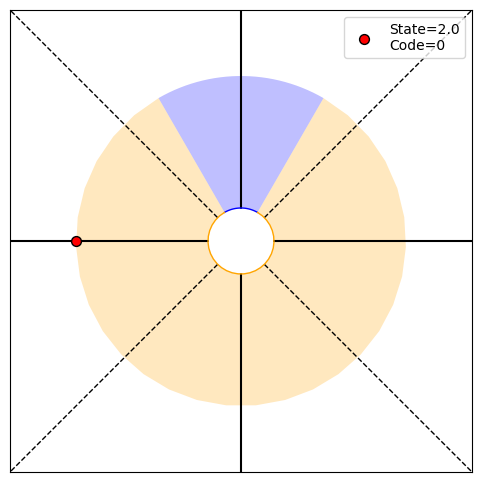

P(O1:41,S41|T)=[0.25 0.   0.25 0.25], P(O1:41|actions,T)=0.75, P(T|O1:41)=[9.99868159e-01 1.31840821e-04], H41=0.00
PRINT 1: 0.0018894787333324447, [0.25 0.   0.25 0.25]
PRINT 2: [2.73552631e-05 2.73552631e-05], [9.99868159e-01 1.31840821e-04]
Choosing randomly
Current angle: 450.0, Code received: 1.0


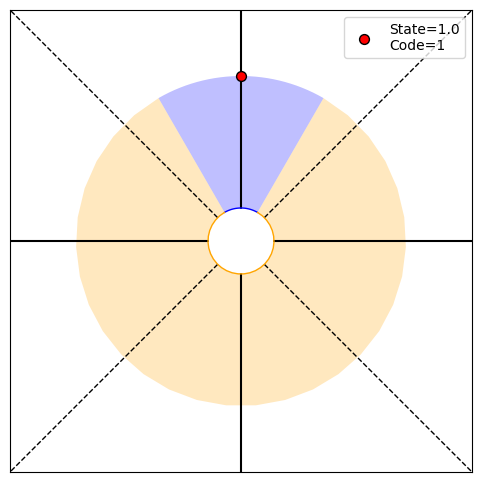

P(O1:42,S42|T)=[0.   0.25 0.   0.  ], P(O1:42|actions,T)=0.25, P(T|O1:42)=[9.99736353e-01 2.63646883e-04], H42=0.00
PRINT 1: 0.003514837501658293, [0.   0.25 0.   0.  ]
PRINT 2: [5.4694959e-05 5.4694959e-05], [9.99736353e-01 2.63646883e-04]
Choosing randomly
Current angle: 540.0, Code received: 0.0


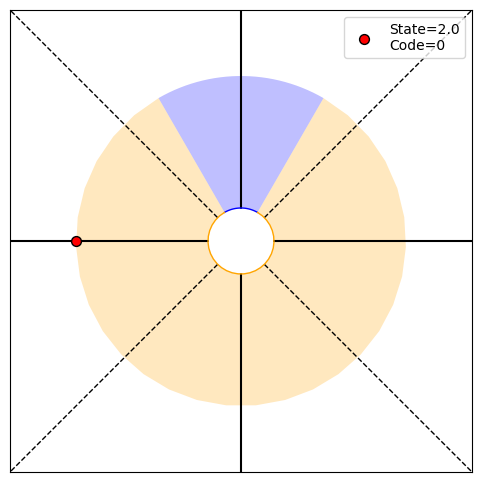

P(O1:43,S43|T)=[0.25 0.   0.25 0.25], P(O1:43|actions,T)=0.75, P(T|O1:43)=[9.99824220e-01 1.75780037e-04], H43=0.00
PRINT 1: 0.002446244532519021, [0.25 0.   0.25 0.25]
PRINT 2: [3.64702242e-05 3.64702242e-05], [9.99824220e-01 1.75780037e-04]
Choosing randomly
Current angle: 450.0, Code received: 1.0


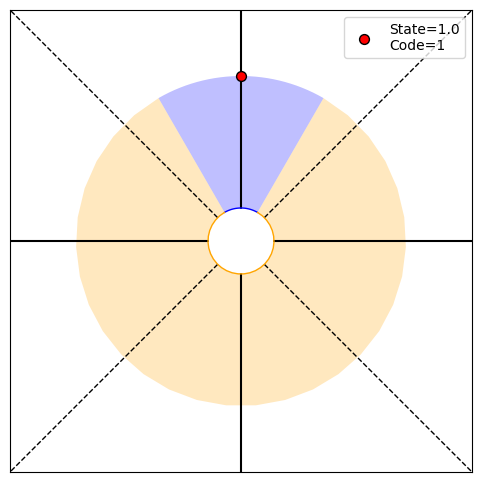

P(O1:44,S44|T)=[0.   0.25 0.   0.  ], P(O1:44|actions,T)=0.25, P(T|O1:44)=[9.99648502e-01 3.51498287e-04], H44=0.00
PRINT 1: 0.004540175496270577, [0.   0.25 0.   0.  ]
PRINT 2: [7.29127797e-05 7.29127797e-05], [9.99648502e-01 3.51498287e-04]
Choosing randomly
Current angle: 540.0, Code received: 0.0


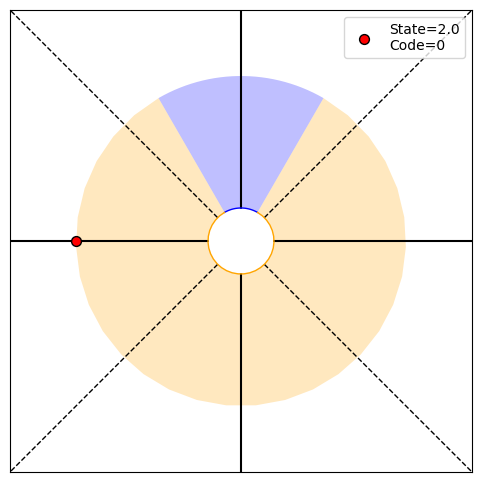

P(O1:45,S45|T)=[0.25 0.   0.25 0.25], P(O1:45|actions,T)=0.75, P(T|O1:45)=[9.99765640e-01 2.34359651e-04], H45=0.00
PRINT 1: 0.0031642101388897953, [0.25 0.   0.25 0.25]
PRINT 2: [4.86208158e-05 4.86208158e-05], [9.99765640e-01 2.34359651e-04]
Choosing randomly
Current angle: 450.0, Code received: 1.0


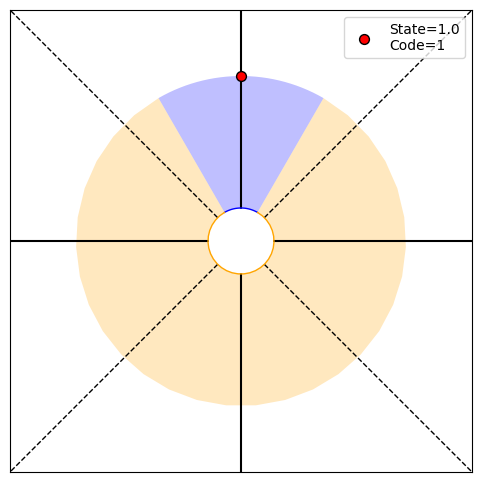

P(O1:46,S46|T)=[0.   0.25 0.   0.  ], P(O1:46|actions,T)=0.25, P(T|O1:46)=[9.99531391e-01 4.68609478e-04], H46=0.01
PRINT 1: 0.005858407241444221, [0.   0.25 0.   0.  ]
PRINT 2: [9.71924571e-05 9.71924571e-05], [9.99531391e-01 4.68609478e-04]
Choosing randomly
Current angle: 360.0, Code received: 0.0


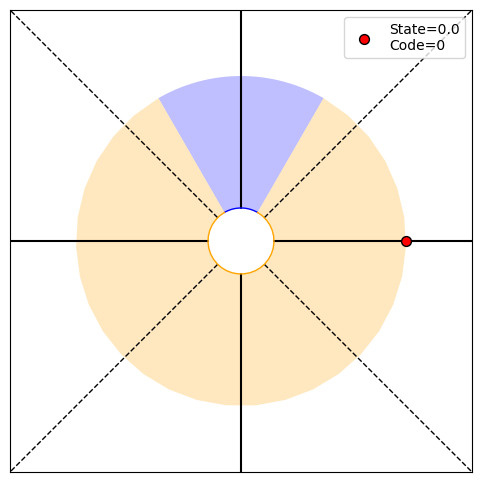

P(O1:47,S47|T)=[0.25 0.   0.25 0.25], P(O1:47|actions,T)=0.75, P(T|O1:47)=[9.99687545e-01 3.12455125e-04], H47=0.00
PRINT 1: 0.004088954308405901, [0.25 0.   0.25 0.25]
PRINT 2: [6.48168239e-05 6.48168239e-05], [9.99687545e-01 3.12455125e-04]
Choosing randomly
Current angle: 270.0, Code received: 0.0


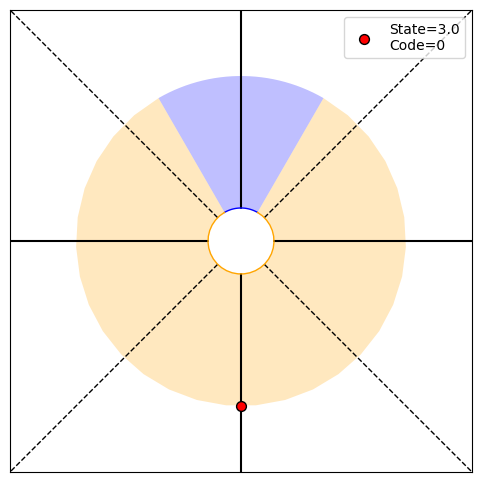

P(O1:48,S48|T)=[0.25 0.   0.25 0.25], P(O1:48|actions,T)=0.75, P(T|O1:48)=[9.99791675e-01 2.08325114e-04], H48=0.00
PRINT 1: 0.002848100209131732, [0.25 0.   0.25 0.25]
PRINT 2: [4.32209324e-05 4.32209324e-05], [9.99791675e-01 2.08325114e-04]
Choosing randomly
Current angle: 180.0, Code received: 0.0


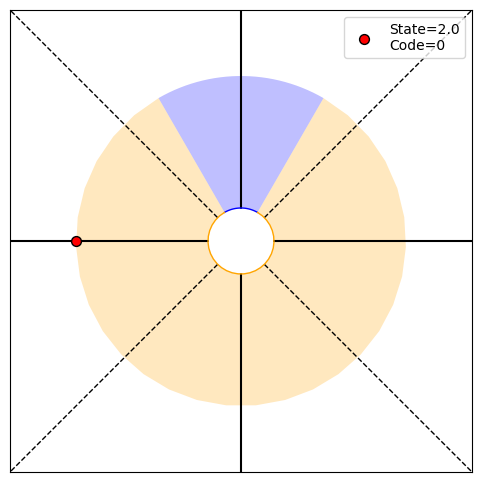

P(O1:49,S49|T)=[0.25 0.   0.25 0.25], P(O1:49|actions,T)=0.75, P(T|O1:49)=[9.99861107e-01 1.38893054e-04], H49=0.00
PRINT 1: 0.0019801056036519845, [0.25 0.   0.25 0.25]
PRINT 2: [2.88182746e-05 2.88182746e-05], [9.99861107e-01 1.38893054e-04]
Choosing randomly
Current angle: 90.0, Code received: 1.0


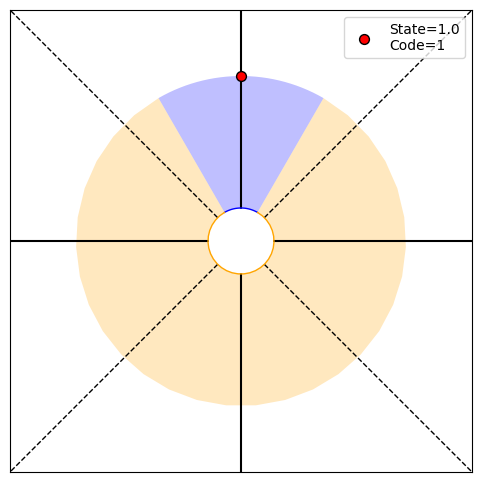

P(O1:50,S50|T)=[0.   0.25 0.   0.  ], P(O1:50|actions,T)=0.25, P(T|O1:50)=[9.99722252e-01 2.77747532e-04], H50=0.00
PRINT 1: 0.0036819415337067452, [0.   0.25 0.   0.  ]
PRINT 2: [5.76192725e-05 5.76192725e-05], [9.99722252e-01 2.77747532e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


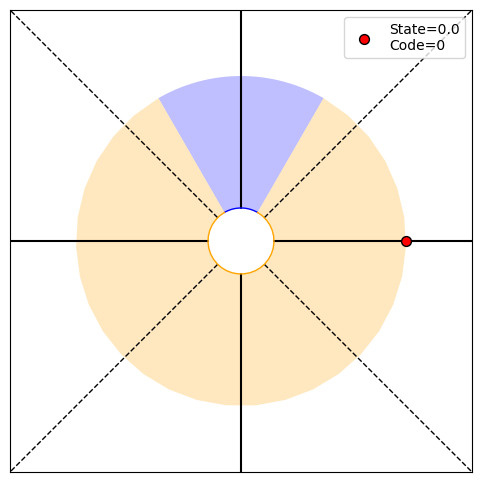

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.04730118 0.04730118], [0.6 0.4]
Choosing randomly
Current angle: -90.0, Code received: 0.0


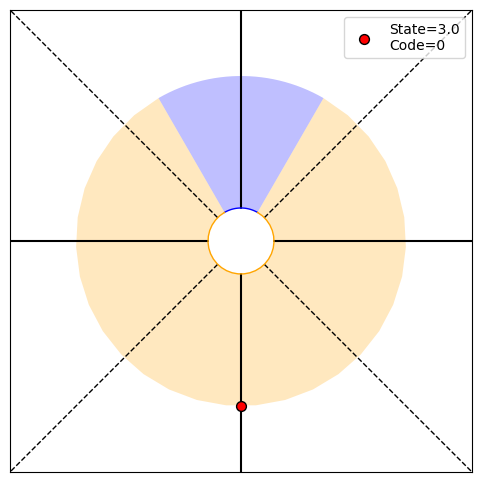

P(O1:2,S2|T)=[0.25 0.   0.25 0.25], P(O1:2|actions,T)=0.75, P(T|O1:2)=[0.69230769 0.30769231], H2=0.89
PRINT 1: 0.8904916402194913, [0.25 0.   0.25 0.25]
PRINT 2: [0.04240536 0.04240536], [0.69230769 0.30769231]
Choosing randomly
Current angle: -180.0, Code received: 0.0


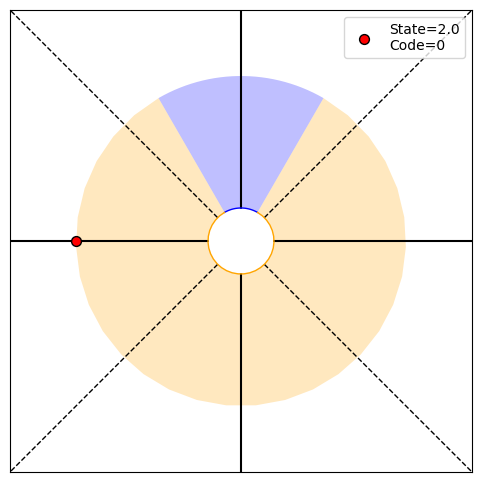

P(O1:3,S3|T)=[0.25 0.   0.25 0.25], P(O1:3|actions,T)=0.75, P(T|O1:3)=[0.77142857 0.22857143], H3=0.78
PRINT 1: 0.775512658133148, [0.25 0.   0.25 0.25]
PRINT 2: [0.03543325 0.03543325], [0.77142857 0.22857143]
Choosing randomly
Current angle: -270.0, Code received: 1.0


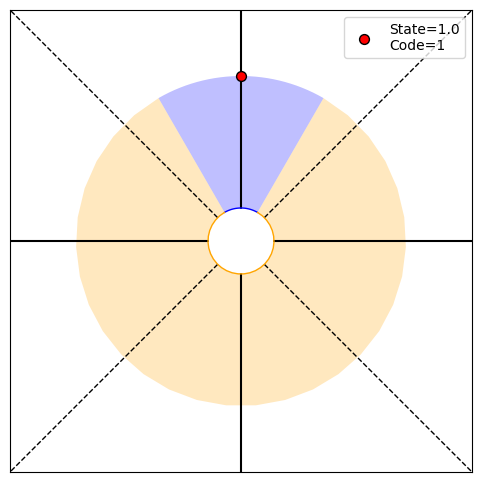

P(O1:4,S4|T)=[0.   0.25 0.   0.  ], P(O1:4|actions,T)=0.25, P(T|O1:4)=[0.62790698 0.37209302], H4=0.95
PRINT 1: 0.9522656254366644, [0.   0.25 0.   0.  ]
PRINT 2: [0.0461822 0.0461822], [0.62790698 0.37209302]
Choosing randomly
Current angle: -360.0, Code received: 0.0


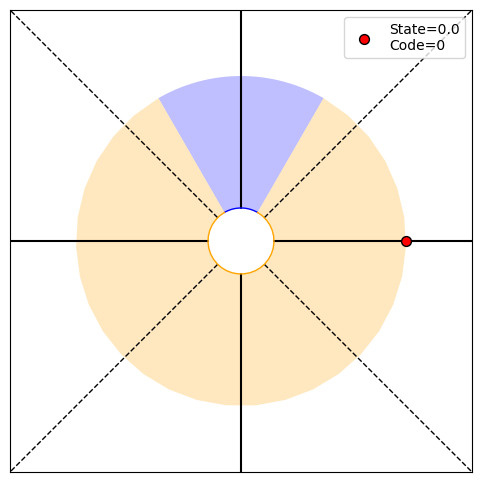

P(O1:5,S5|T)=[0.25 0.   0.25 0.25], P(O1:5|actions,T)=0.75, P(T|O1:5)=[0.71681416 0.28318584], H5=0.86
PRINT 1: 0.8597555090200143, [0.25 0.   0.25 0.25]
PRINT 2: [0.04052399 0.04052399], [0.71681416 0.28318584]
Choosing randomly
Current angle: -270.0, Code received: 1.0


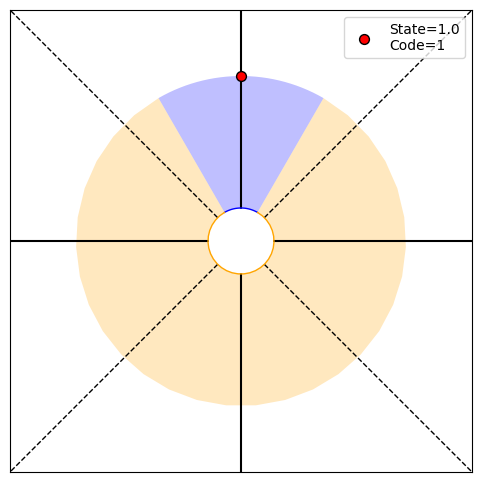

P(O1:6,S6|T)=[0.   0.25 0.   0.  ], P(O1:6|actions,T)=0.25, P(T|O1:6)=[0.55862069 0.44137931], H6=0.99
PRINT 1: 0.9900618470242131, [0.   0.25 0.   0.  ]
PRINT 2: [0.04839299 0.04839299], [0.55862069 0.44137931]
Choosing randomly
Current angle: -360.0, Code received: 0.0


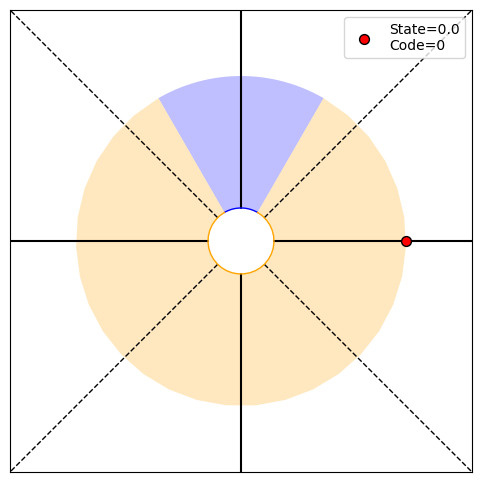

P(O1:7,S7|T)=[0.25 0.   0.25 0.25], P(O1:7|actions,T)=0.75, P(T|O1:7)=[0.65498652 0.34501348], H7=0.93
PRINT 1: 0.9295356505393889, [0.25 0.   0.25 0.25]
PRINT 2: [0.04479852 0.04479852], [0.65498652 0.34501348]
Choosing randomly
Current angle: -270.0, Code received: 1.0


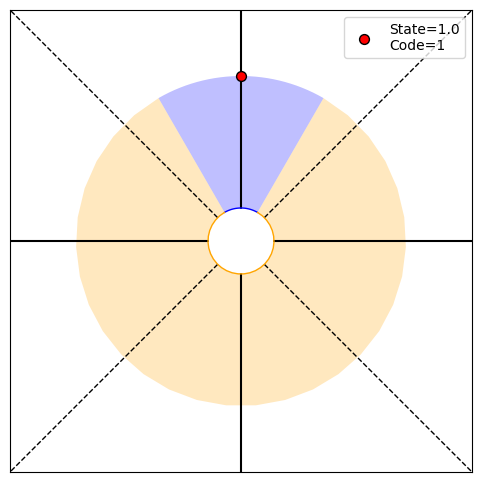

P(O1:8,S8|T)=[0.   0.25 0.   0.  ], P(O1:8|actions,T)=0.25, P(T|O1:8)=[0.48697395 0.51302605], H8=1.00
PRINT 1: 0.999510357288754, [0.   0.25 0.   0.  ]
PRINT 2: [0.04870398 0.04870398], [0.48697395 0.51302605]
Choosing randomly
Current angle: -180.0, Code received: 0.0


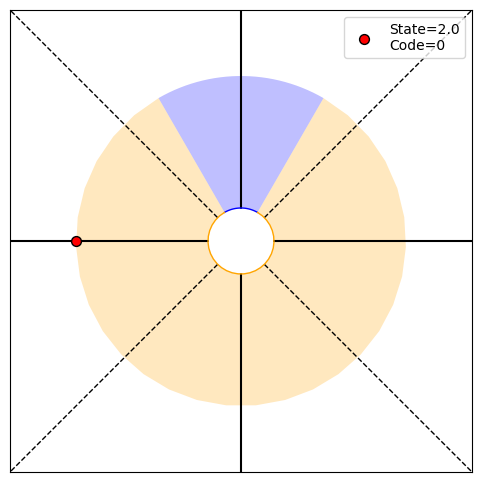

P(O1:9,S9|T)=[0.25 0.   0.25 0.25], P(O1:9|actions,T)=0.75, P(T|O1:9)=[0.58742949 0.41257051], H9=0.98
PRINT 1: 0.9778305281284734, [0.25 0.   0.25 0.25]
PRINT 2: [0.04770421 0.04770421], [0.58742949 0.41257051]
Choosing randomly
Current angle: -90.0, Code received: 0.0


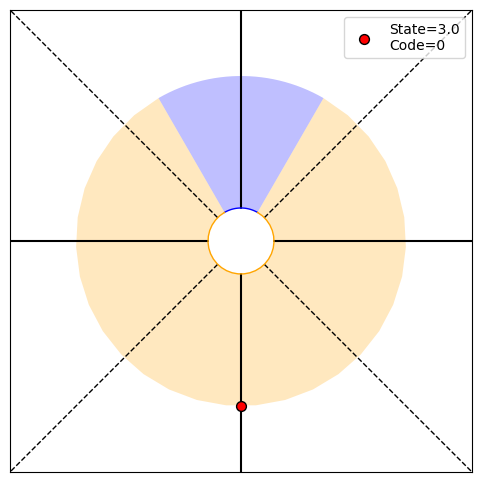

P(O1:10,S10|T)=[0.25 0.   0.25 0.25], P(O1:10|actions,T)=0.75, P(T|O1:10)=[0.68109623 0.31890377], H10=0.90
PRINT 1: 0.9031853603330013, [0.25 0.   0.25 0.25]
PRINT 2: [0.04318388 0.04318388], [0.68109623 0.31890377]
Choosing randomly
Current angle: 0.0, Code received: 0.0


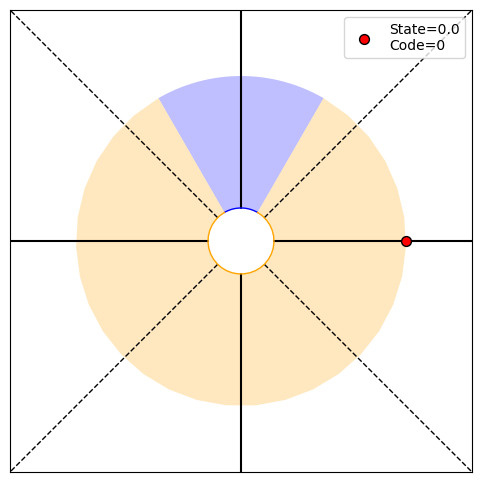

P(O1:11,S11|T)=[0.25 0.   0.25 0.25], P(O1:11|actions,T)=0.75, P(T|O1:11)=[0.76210942 0.23789058], H11=0.79
PRINT 1: 0.7915147543541923, [0.25 0.   0.25 0.25]
PRINT 2: [0.0363905 0.0363905], [0.76210942 0.23789058]
Choosing randomly
Current angle: -90.0, Code received: 0.0


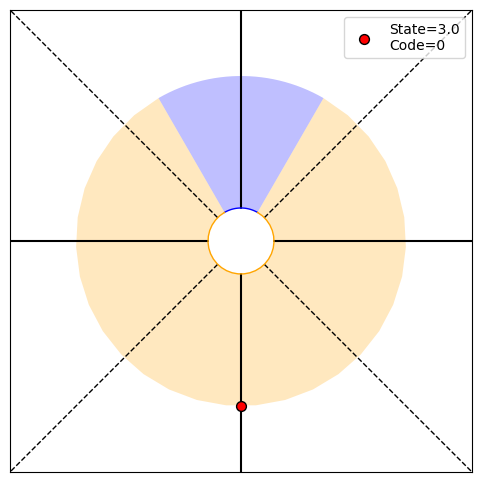

P(O1:12,S12|T)=[0.25 0.   0.25 0.25], P(O1:12|actions,T)=0.75, P(T|O1:12)=[0.82774717 0.17225283], H12=0.66
PRINT 1: 0.662832439939511, [0.25 0.   0.25 0.25]
PRINT 2: [0.02885939 0.02885939], [0.82774717 0.17225283]
Choosing randomly
Current angle: 0.0, Code received: 0.0


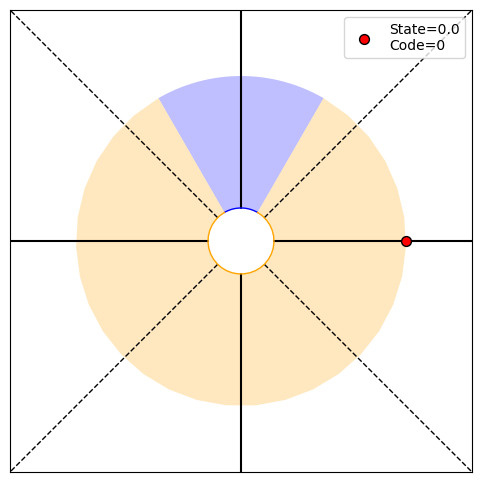

P(O1:13,S13|T)=[0.25 0.   0.25 0.25], P(O1:13|actions,T)=0.75, P(T|O1:13)=[0.87816957 0.12183043], H13=0.53
PRINT 1: 0.5345995950135118, [0.25 0.   0.25 0.25]
PRINT 2: [0.02180339 0.02180339], [0.87816957 0.12183043]
Choosing randomly
Current angle: -90.0, Code received: 0.0


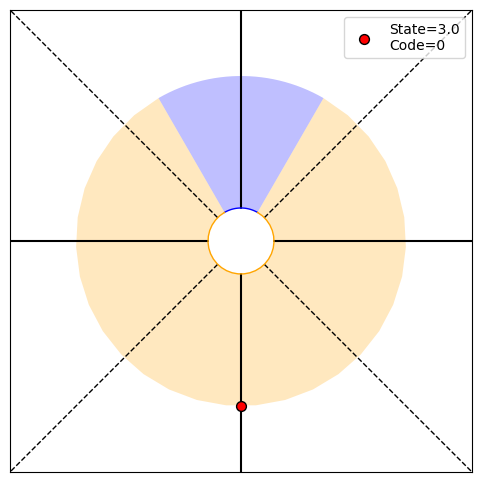

P(O1:14,S14|T)=[0.25 0.   0.25 0.25], P(O1:14|actions,T)=0.75, P(T|O1:14)=[0.91534173 0.08465827], H14=0.42
PRINT 1: 0.41838388657190634, [0.25 0.   0.25 0.25]
PRINT 2: [0.01587577 0.01587577], [0.91534173 0.08465827]
Choosing randomly
Current angle: -180.0, Code received: 0.0


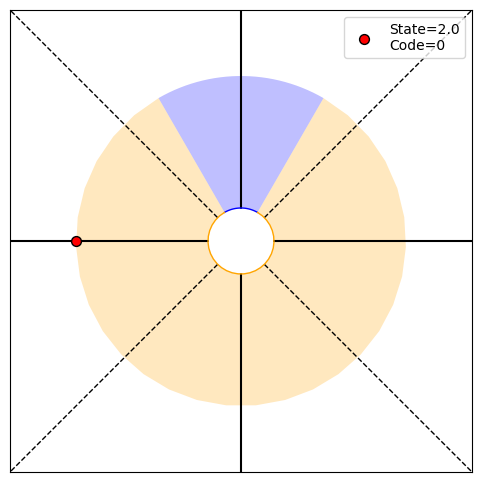

P(O1:15,S15|T)=[0.25 0.   0.25 0.25], P(O1:15|actions,T)=0.75, P(T|O1:15)=[0.94192223 0.05807777], H15=0.32
PRINT 1: 0.3197666421936681, [0.25 0.   0.25 0.25]
PRINT 2: [0.01125131 0.01125131], [0.94192223 0.05807777]
Choosing randomly
Current angle: -270.0, Code received: 1.0


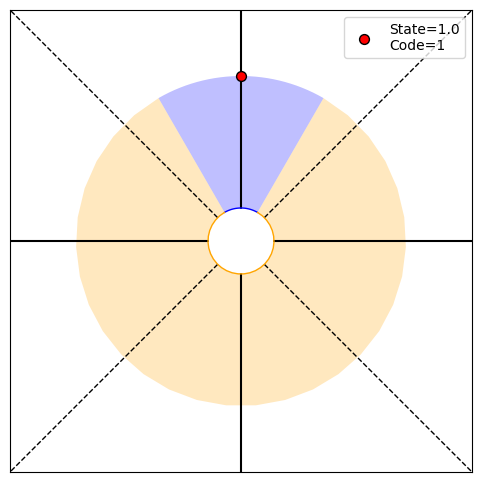

P(O1:16,S16|T)=[0.   0.25 0.   0.  ], P(O1:16|actions,T)=0.25, P(T|O1:16)=[0.89022023 0.10977977], H16=0.50
PRINT 1: 0.4992513317937652, [0.   0.25 0.   0.  ]
PRINT 2: [0.01994999 0.01994999], [0.89022023 0.10977977]
Choosing randomly
Current angle: -180.0, Code received: 0.0


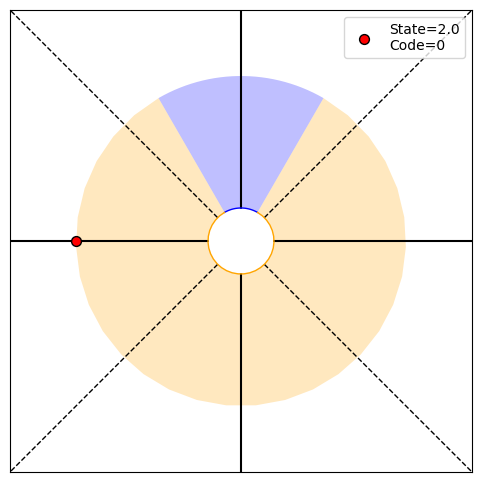

P(O1:17,S17|T)=[0.25 0.   0.25 0.25], P(O1:17|actions,T)=0.75, P(T|O1:17)=[0.92403363 0.07596637], H17=0.39
PRINT 1: 0.3878044817510643, [0.25 0.   0.25 0.25]
PRINT 2: [0.01439927 0.01439927], [0.92403363 0.07596637]
Choosing randomly
Current angle: -90.0, Code received: 0.0


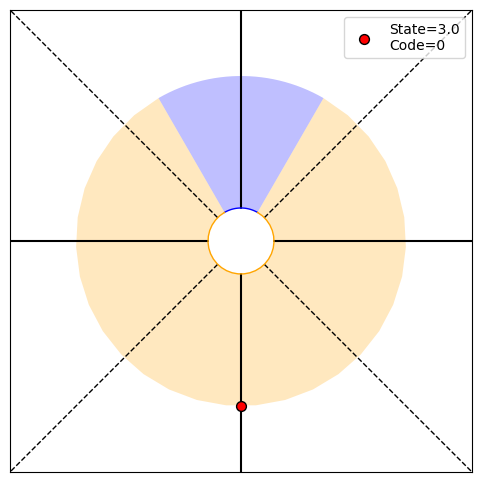

P(O1:18,S18|T)=[0.25 0.   0.25 0.25], P(O1:18|actions,T)=0.75, P(T|O1:18)=[0.94804001 0.05195999], H18=0.29
PRINT 1: 0.29466520444634614, [0.25 0.   0.25 0.25]
PRINT 2: [0.01014077 0.01014077], [0.94804001 0.05195999]
Choosing randomly
Current angle: 0.0, Code received: 0.0


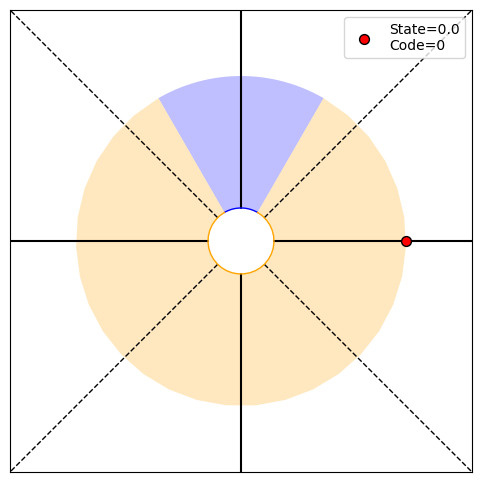

P(O1:19,S19|T)=[0.25 0.   0.25 0.25], P(O1:19|actions,T)=0.75, P(T|O1:19)=[0.96474947 0.03525053], H19=0.22
PRINT 1: 0.22007519863720576, [0.25 0.   0.25 0.25]
PRINT 2: [0.00701866 0.00701866], [0.96474947 0.03525053]
Choosing randomly
Current angle: -90.0, Code received: 0.0


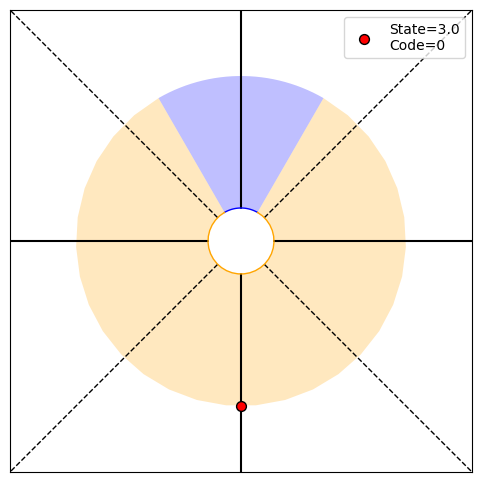

P(O1:20,S20|T)=[0.25 0.   0.25 0.25], P(O1:20|actions,T)=0.75, P(T|O1:20)=[0.97622023 0.02377977], H20=0.16
PRINT 1: 0.16216674258596345, [0.25 0.   0.25 0.25]
PRINT 2: [0.00479949 0.00479949], [0.97622023 0.02377977]
Choosing randomly
Current angle: 0.0, Code received: 0.0


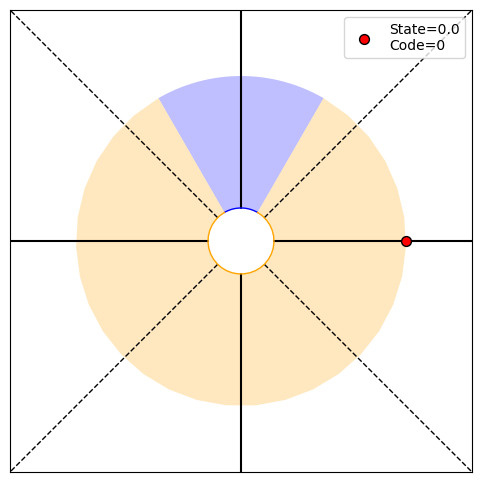

P(O1:21,S21|T)=[0.25 0.   0.25 0.25], P(O1:21|actions,T)=0.75, P(T|O1:21)=[0.98402015 0.01597985], H21=0.12
PRINT 1: 0.11823022358658546, [0.25 0.   0.25 0.25]
PRINT 2: [0.00325493 0.00325493], [0.98402015 0.01597985]
Choosing randomly
Current angle: -90.0, Code received: 0.0


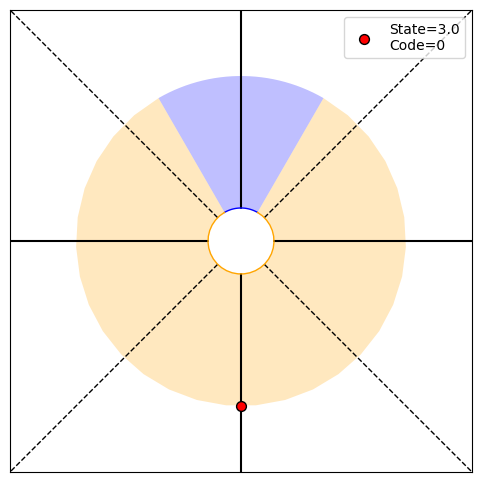

P(O1:22,S22|T)=[0.25 0.   0.25 0.25], P(O1:22|actions,T)=0.75, P(T|O1:22)=[0.98928972 0.01071028], H22=0.09
PRINT 1: 0.08546590665756237, [0.25 0.   0.25 0.25]
PRINT 2: [0.00219507 0.00219507], [0.98928972 0.01071028]
Choosing randomly
Current angle: -180.0, Code received: 0.0


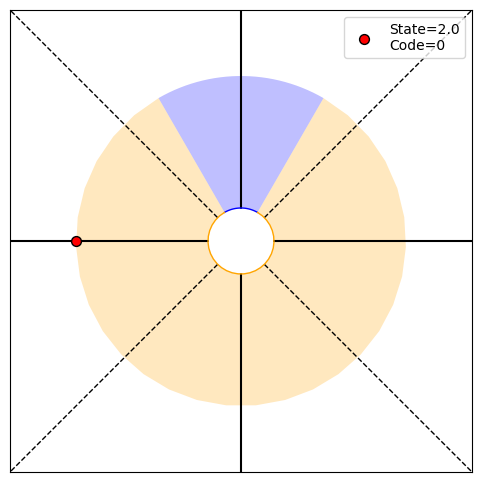

P(O1:23,S23|T)=[0.25 0.   0.25 0.25], P(O1:23|actions,T)=0.75, P(T|O1:23)=[0.99283423 0.00716577], H23=0.06
PRINT 1: 0.06135457802905351, [0.25 0.   0.25 0.25]
PRINT 2: [0.0014747 0.0014747], [0.99283423 0.00716577]
Choosing randomly
Current angle: -270.0, Code received: 1.0


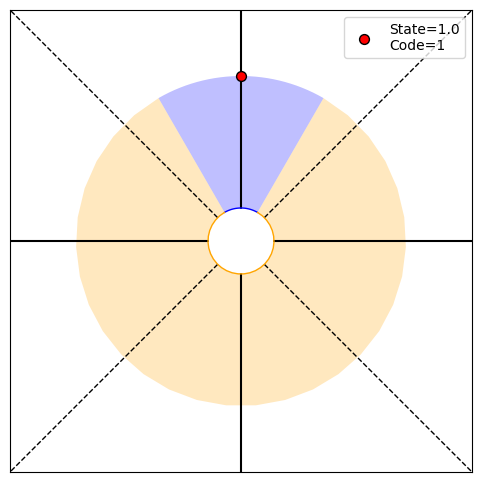

P(O1:24,S24|T)=[0.   0.25 0.   0.  ], P(O1:24|actions,T)=0.25, P(T|O1:24)=[0.98577043 0.01422957], H24=0.11
PRINT 1: 0.10768008794573203, [0.   0.25 0.   0.  ]
PRINT 2: [0.00290437 0.00290437], [0.98577043 0.01422957]
Choosing randomly
Current angle: -180.0, Code received: 0.0


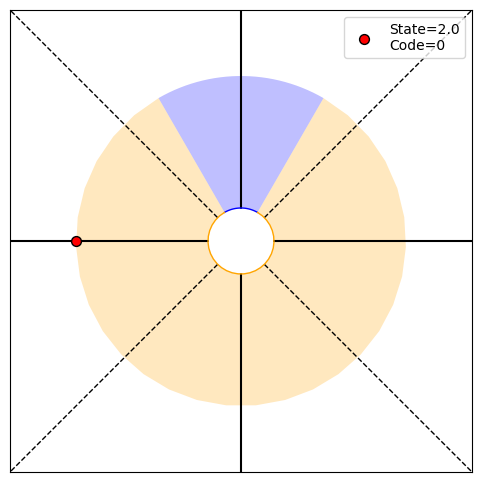

P(O1:25,S25|T)=[0.25 0.   0.25 0.25], P(O1:25|actions,T)=0.75, P(T|O1:25)=[0.99046841 0.00953159], H25=0.08
PRINT 1: 0.07767164973422992, [0.25 0.   0.25 0.25]
PRINT 2: [0.00195618 0.00195618], [0.99046841 0.00953159]
Choosing randomly
Current angle: -90.0, Code received: 0.0


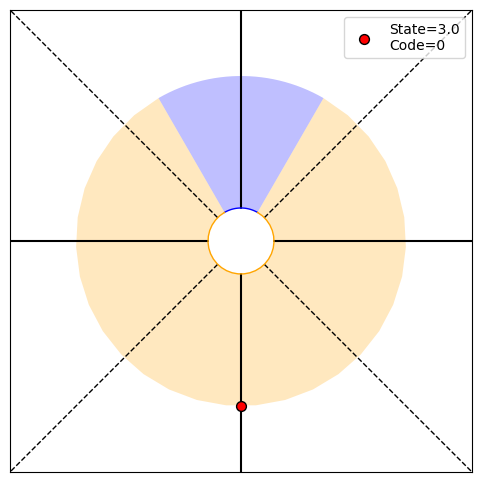

P(O1:26,S26|T)=[0.25 0.   0.25 0.25], P(O1:26|actions,T)=0.75, P(T|O1:26)=[0.99362535 0.00637465], H26=0.06
PRINT 1: 0.0556604009075222, [0.25 0.   0.25 0.25]
PRINT 2: [0.0013131 0.0013131], [0.99362535 0.00637465]
Choosing randomly
Current angle: -180.0, Code received: 0.0


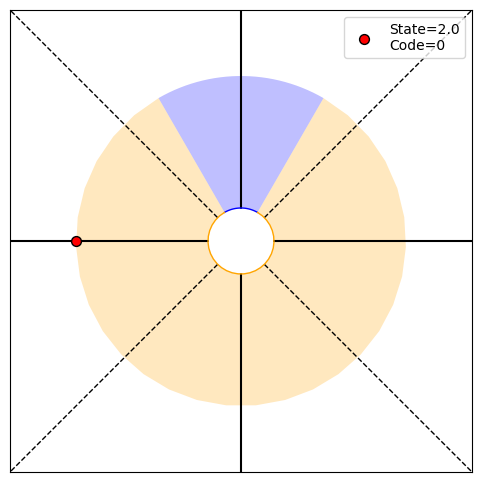

P(O1:27,S27|T)=[0.25 0.   0.25 0.25], P(O1:27|actions,T)=0.75, P(T|O1:27)=[0.99574119 0.00425881], H27=0.04
PRINT 1: 0.03967065026429185, [0.25 0.   0.25 0.25]
PRINT 2: [0.00087943 0.00087943], [0.99574119 0.00425881]
Choosing randomly
Current angle: -90.0, Code received: 0.0


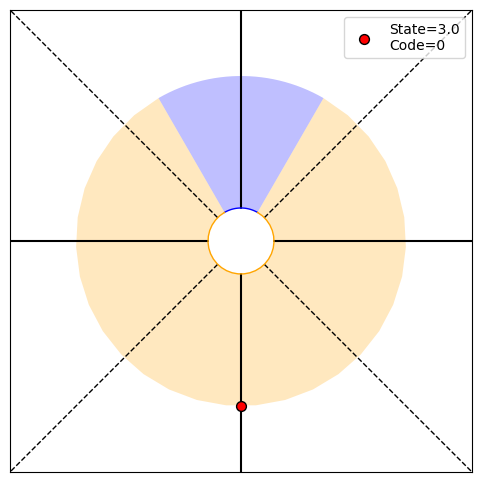

P(O1:28,S28|T)=[0.25 0.   0.25 0.25], P(O1:28|actions,T)=0.75, P(T|O1:28)=[0.99715675 0.00284325], H28=0.03
PRINT 1: 0.02814497325544187, [0.25 0.   0.25 0.25]
PRINT 2: [0.00058808 0.00058808], [0.99715675 0.00284325]
Choosing randomly
Current angle: -180.0, Code received: 0.0


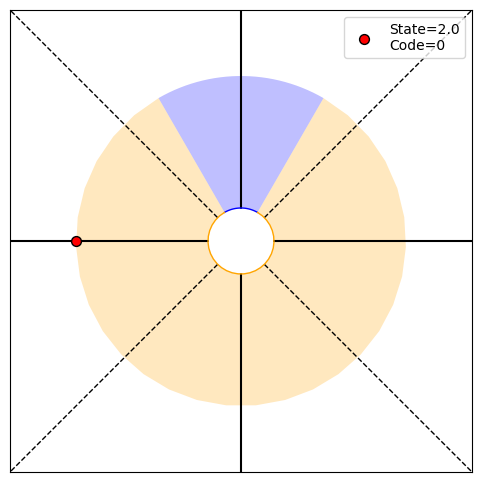

P(O1:29,S29|T)=[0.25 0.   0.25 0.25], P(O1:29|actions,T)=0.75, P(T|O1:29)=[0.9981027 0.0018973], H29=0.02
PRINT 1: 0.019889663304754057, [0.25 0.   0.25 0.25]
PRINT 2: [0.00039286 0.00039286], [0.9981027 0.0018973]
Choosing randomly
Current angle: -270.0, Code received: 1.0


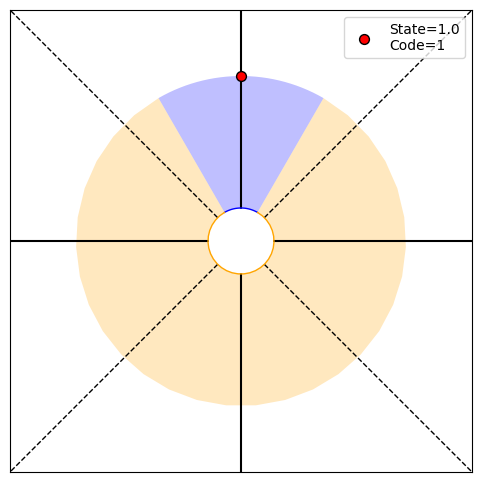

P(O1:30,S30|T)=[0.   0.25 0.   0.  ], P(O1:30|actions,T)=0.25, P(T|O1:30)=[0.99621259 0.00378741], H30=0.04
PRINT 1: 0.03592177455650257, [0.   0.25 0.   0.  ]
PRINT 2: [0.00078251 0.00078251], [0.99621259 0.00378741]
Choosing randomly
Current angle: -180.0, Code received: 0.0


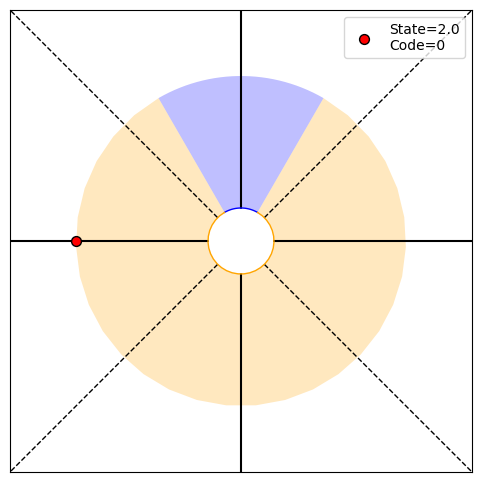

P(O1:31,S31|T)=[0.25 0.   0.25 0.25], P(O1:31|actions,T)=0.75, P(T|O1:31)=[0.99747187 0.00252813], H31=0.03
PRINT 1: 0.02545467553544495, [0.25 0.   0.25 0.25]
PRINT 2: [0.0005231 0.0005231], [0.99747187 0.00252813]
Choosing randomly
Current angle: -270.0, Code received: 1.0


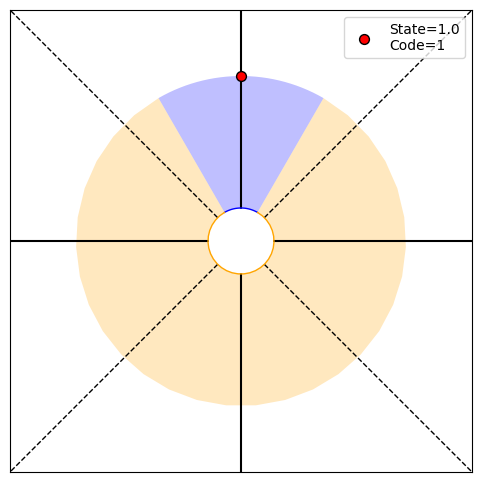

P(O1:32,S32|T)=[0.   0.25 0.   0.  ], P(O1:32|actions,T)=0.25, P(T|O1:32)=[0.99495649 0.00504351], H32=0.05
PRINT 1: 0.04574666140685605, [0.   0.25 0.   0.  ]
PRINT 2: [0.00104051 0.00104051], [0.99495649 0.00504351]
Choosing randomly
Current angle: -180.0, Code received: 0.0


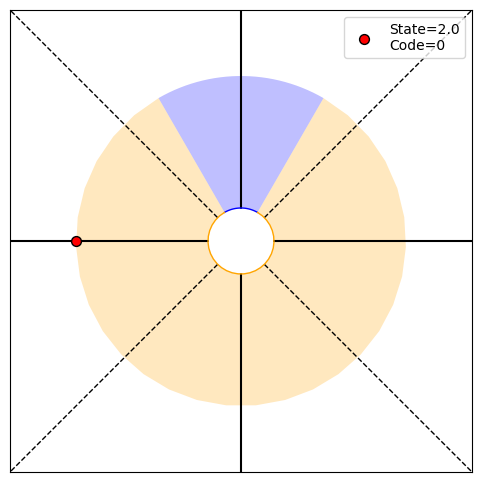

P(O1:33,S33|T)=[0.25 0.   0.25 0.25], P(O1:33|actions,T)=0.75, P(T|O1:33)=[0.996632 0.003368], H33=0.03
PRINT 1: 0.03251519254991218, [0.25 0.   0.25 0.25]
PRINT 2: [0.0006962 0.0006962], [0.996632 0.003368]
Choosing randomly
Current angle: -270.0, Code received: 1.0


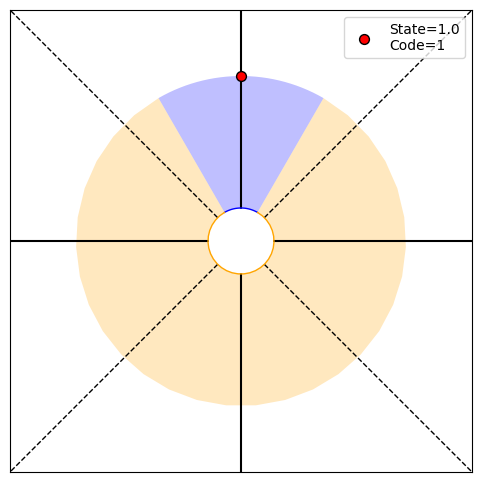

P(O1:34,S34|T)=[0.   0.25 0.   0.  ], P(O1:34|actions,T)=0.25, P(T|O1:34)=[0.99328661 0.00671339], H34=0.06
PRINT 1: 0.05811501918303626, [0.   0.25 0.   0.  ]
PRINT 2: [0.00138233 0.00138233], [0.99328661 0.00671339]
Choosing randomly
Current angle: -180.0, Code received: 0.0


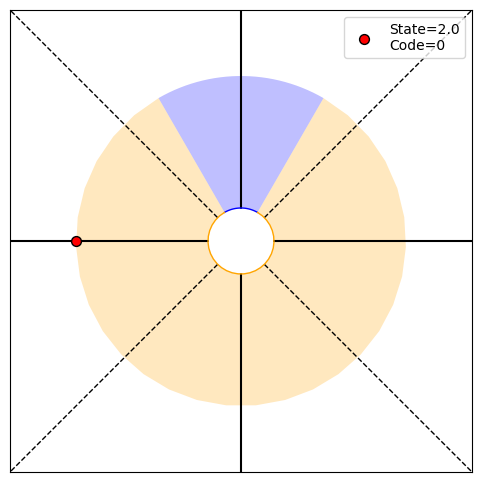

P(O1:35,S35|T)=[0.25 0.   0.25 0.25], P(O1:35|actions,T)=0.75, P(T|O1:35)=[0.99551437 0.00448563], H35=0.04
PRINT 1: 0.041446903455125715, [0.25 0.   0.25 0.25]
PRINT 2: [0.00092602 0.00092602], [0.99551437 0.00448563]
Choosing randomly
Current angle: -270.0, Code received: 1.0


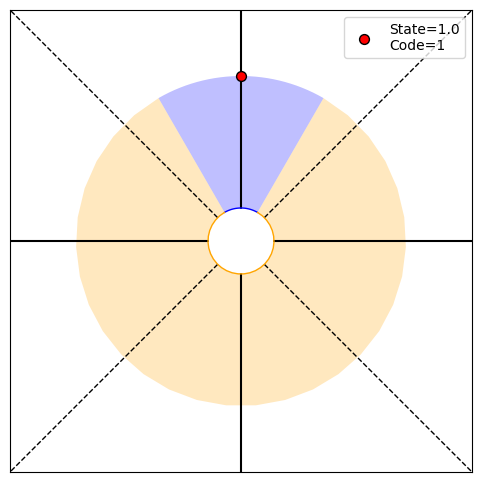

P(O1:36,S36|T)=[0.   0.25 0.   0.  ], P(O1:36|actions,T)=0.25, P(T|O1:36)=[0.9910688 0.0089312], H36=0.07
PRINT 1: 0.07362133602616575, [0.   0.25 0.   0.  ]
PRINT 2: [0.00183425 0.00183425], [0.9910688 0.0089312]
Choosing randomly
Current angle: -360.0, Code received: 0.0


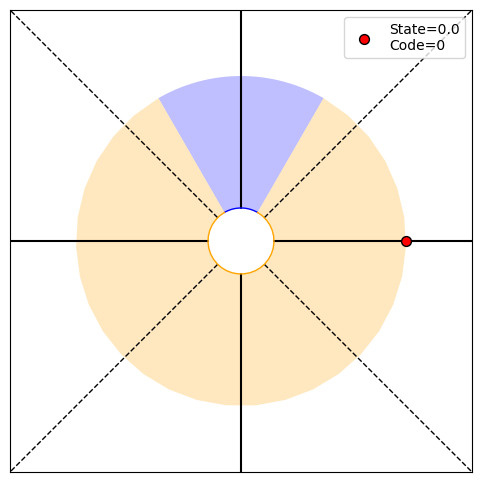

P(O1:37,S37|T)=[0.25 0.   0.25 0.25], P(O1:37|actions,T)=0.75, P(T|O1:37)=[0.99402809 0.00597191], H37=0.05
PRINT 1: 0.05270791251305889, [0.25 0.   0.25 0.25]
PRINT 2: [0.00123072 0.00123072], [0.99402809 0.00597191]
Choosing randomly
Current angle: -270.0, Code received: 1.0


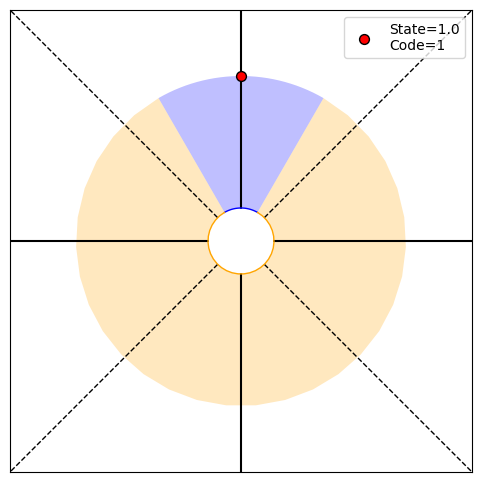

P(O1:38,S38|T)=[0.   0.25 0.   0.  ], P(O1:38|actions,T)=0.25, P(T|O1:38)=[0.98812708 0.01187292], H38=0.09
PRINT 1: 0.0929682559933993, [0.   0.25 0.   0.  ]
PRINT 2: [0.00243005 0.00243005], [0.98812708 0.01187292]
Choosing randomly
Current angle: -360.0, Code received: 0.0


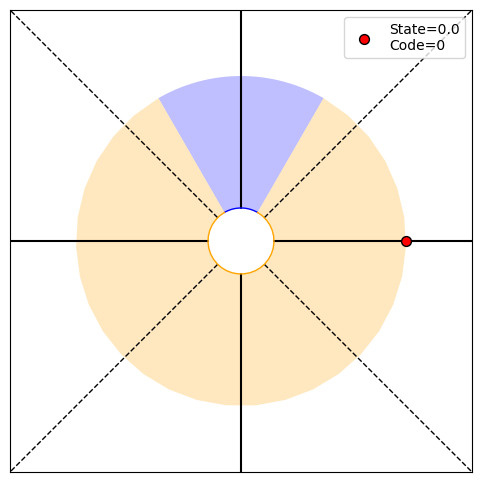

P(O1:39,S39|T)=[0.25 0.   0.25 0.25], P(O1:39|actions,T)=0.75, P(T|O1:39)=[0.99205327 0.00794673], H39=0.07
PRINT 1: 0.06685083361533012, [0.25 0.   0.25 0.25]
PRINT 2: [0.00163394 0.00163394], [0.99205327 0.00794673]
Choosing randomly
Current angle: -450.0, Code received: 0.0


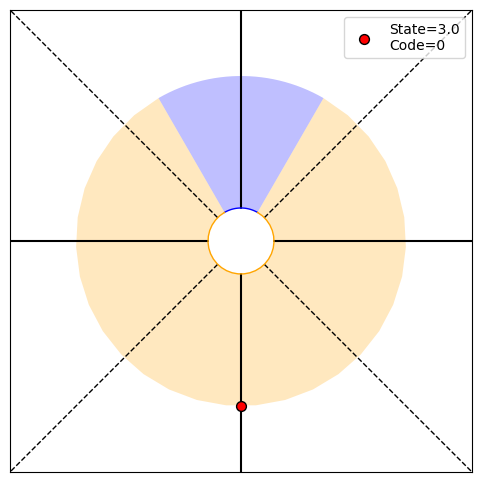

P(O1:40,S40|T)=[0.25 0.   0.25 0.25], P(O1:40|actions,T)=0.75, P(T|O1:40)=[0.99468811 0.00531189], H40=0.05
PRINT 1: 0.04778266136356096, [0.25 0.   0.25 0.25]
PRINT 2: [0.00109554 0.00109554], [0.99468811 0.00531189]
Choosing randomly
Current angle: -540.0, Code received: 0.0


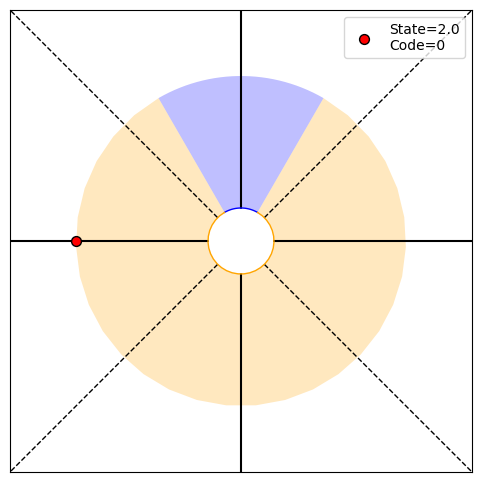

P(O1:41,S41|T)=[0.25 0.   0.25 0.25], P(O1:41|actions,T)=0.75, P(T|O1:41)=[0.99645246 0.00354754], H41=0.03
PRINT 1: 0.033982248310804236, [0.25 0.   0.25 0.25]
PRINT 2: [0.00073316 0.00073316], [0.99645246 0.00354754]
Choosing randomly
Current angle: -450.0, Code received: 0.0


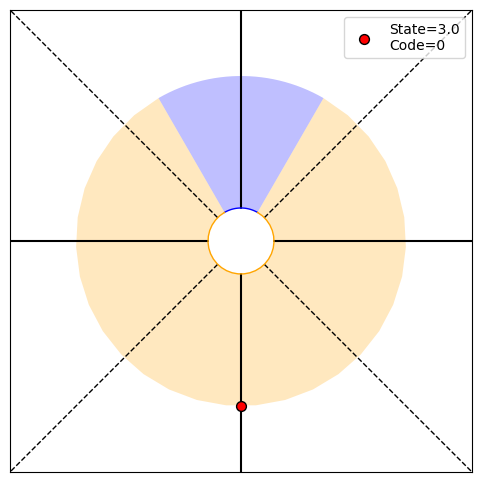

P(O1:42,S42|T)=[0.25 0.   0.25 0.25], P(O1:42|actions,T)=0.75, P(T|O1:42)=[0.99763217 0.00236783], H42=0.02
PRINT 1: 0.02406472108581174, [0.25 0.   0.25 0.25]
PRINT 2: [0.00049002 0.00049002], [0.99763217 0.00236783]
Choosing randomly
Current angle: -540.0, Code received: 0.0


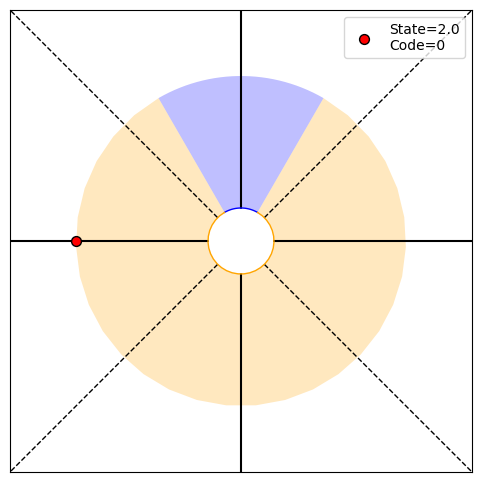

P(O1:43,S43|T)=[0.25 0.   0.25 0.25], P(O1:43|actions,T)=0.75, P(T|O1:43)=[0.9984202 0.0015798], H43=0.02
PRINT 1: 0.01697904249948226, [0.25 0.   0.25 0.25]
PRINT 2: [0.00032724 0.00032724], [0.9984202 0.0015798]
Choosing randomly
Current angle: -450.0, Code received: 0.0


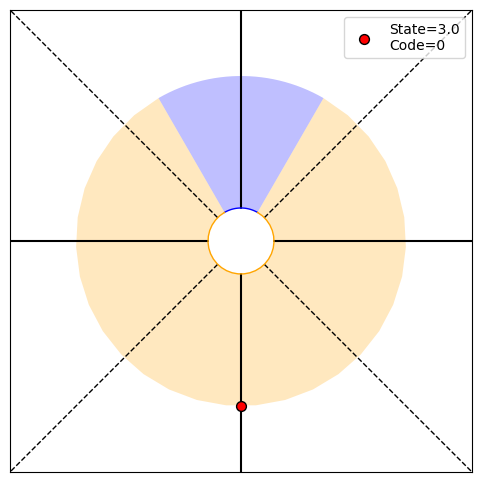

P(O1:44,S44|T)=[0.25 0.   0.25 0.25], P(O1:44|actions,T)=0.75, P(T|O1:44)=[0.99894625 0.00105375], H44=0.01
PRINT 1: 0.011941331636332006, [0.25 0.   0.25 0.25]
PRINT 2: [0.00021841 0.00021841], [0.99894625 0.00105375]
Choosing randomly
Current angle: -540.0, Code received: 0.0


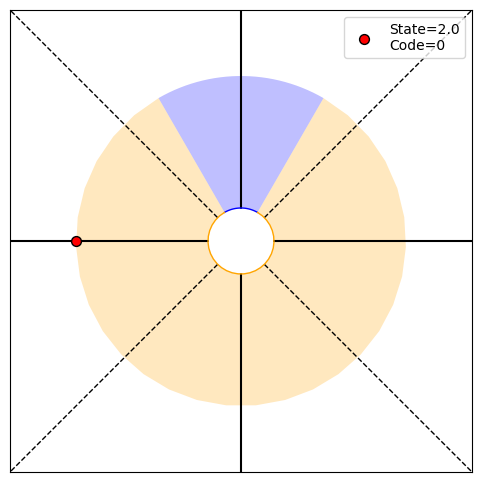

P(O1:45,S45|T)=[0.25 0.   0.25 0.25], P(O1:45|actions,T)=0.75, P(T|O1:45)=[9.9929725e-01 7.0274956e-04], H45=0.01
PRINT 1: 0.008374589010415986, [0.25 0.   0.25 0.25]
PRINT 2: [0.00014571 0.00014571], [9.9929725e-01 7.0274956e-04]
Choosing randomly
Current angle: -630.0, Code received: 1.0


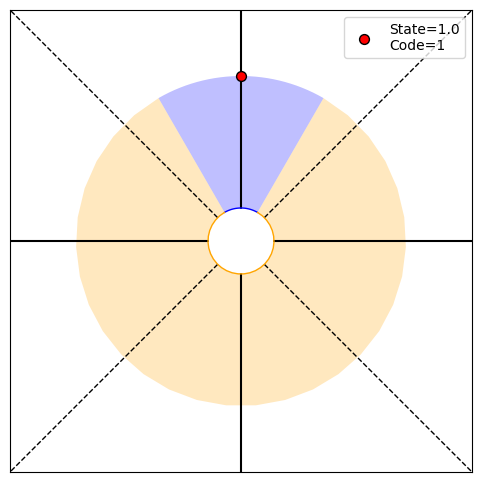

P(O1:46,S46|T)=[0.   0.25 0.   0.  ], P(O1:46|actions,T)=0.25, P(T|O1:46)=[0.99859549 0.00140451], H46=0.02
PRINT 1: 0.01533361569488018, [0.   0.25 0.   0.  ]
PRINT 2: [0.00029099 0.00029099], [0.99859549 0.00140451]
Choosing randomly
Current angle: -540.0, Code received: 0.0


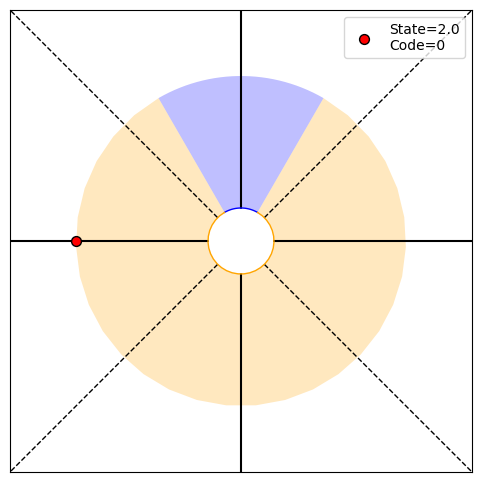

P(O1:47,S47|T)=[0.25 0.   0.25 0.25], P(O1:47|actions,T)=0.75, P(T|O1:47)=[9.99063220e-01 9.36779972e-04], H47=0.01
PRINT 1: 0.010774863132034268, [0.25 0.   0.25 0.25]
PRINT 2: [0.00019419 0.00019419], [9.99063220e-01 9.36779972e-04]
Choosing randomly
Current angle: -630.0, Code received: 1.0


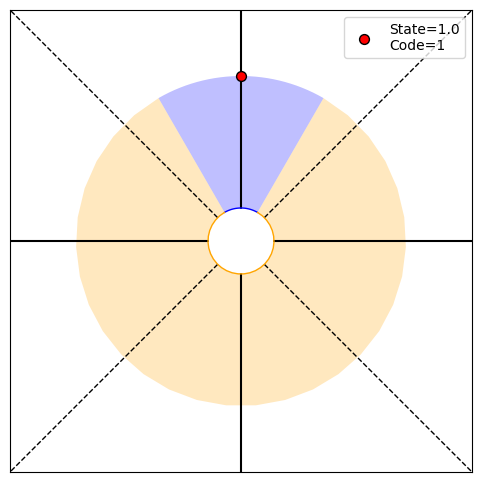

P(O1:48,S48|T)=[0.   0.25 0.   0.  ], P(O1:48|actions,T)=0.25, P(T|O1:48)=[0.99812819 0.00187181], H48=0.02
PRINT 1: 0.019659016193745056, [0.   0.25 0.   0.  ]
PRINT 2: [0.00038759 0.00038759], [0.99812819 0.00187181]
Choosing randomly
Current angle: -540.0, Code received: 0.0


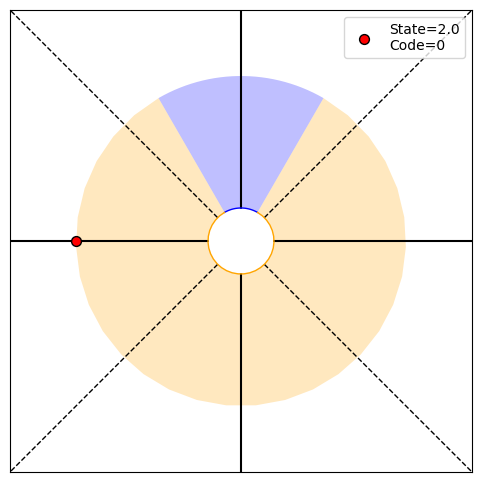

P(O1:49,S49|T)=[0.25 0.   0.25 0.25], P(O1:49|actions,T)=0.75, P(T|O1:49)=[0.99875135 0.00124865], H49=0.01
PRINT 1: 0.013844044214477115, [0.25 0.   0.25 0.25]
PRINT 2: [0.00025874 0.00025874], [0.99875135 0.00124865]
Choosing randomly
Current angle: -450.0, Code received: 0.0


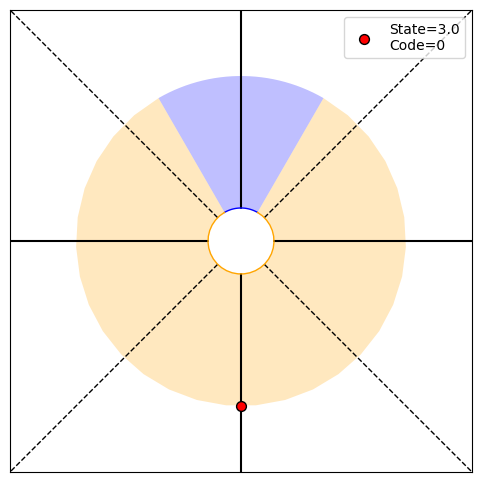

P(O1:50,S50|T)=[0.25 0.   0.25 0.25], P(O1:50|actions,T)=0.75, P(T|O1:50)=[9.9916722e-01 8.3277999e-04], H50=0.01
PRINT 1: 0.009720100719372203, [0.25 0.   0.25 0.25]
PRINT 2: [0.00017265 0.00017265], [9.9916722e-01 8.3277999e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


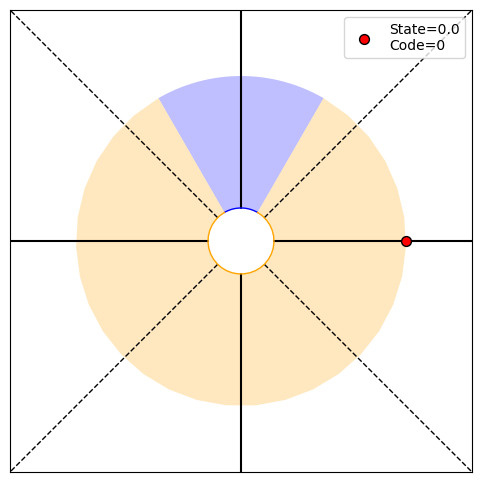

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.04730118 0.04730118], [0.6 0.4]
Choosing randomly
Current angle: -90.0, Code received: 0.0


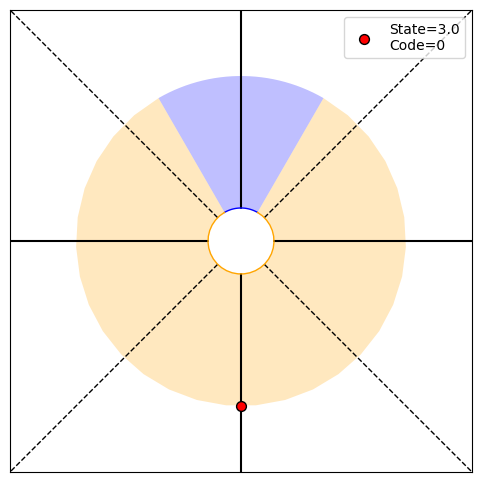

P(O1:2,S2|T)=[0.25 0.   0.25 0.25], P(O1:2|actions,T)=0.75, P(T|O1:2)=[0.69230769 0.30769231], H2=0.89
PRINT 1: 0.8904916402194913, [0.25 0.   0.25 0.25]
PRINT 2: [0.04240536 0.04240536], [0.69230769 0.30769231]
Choosing randomly
Current angle: -180.0, Code received: 0.0


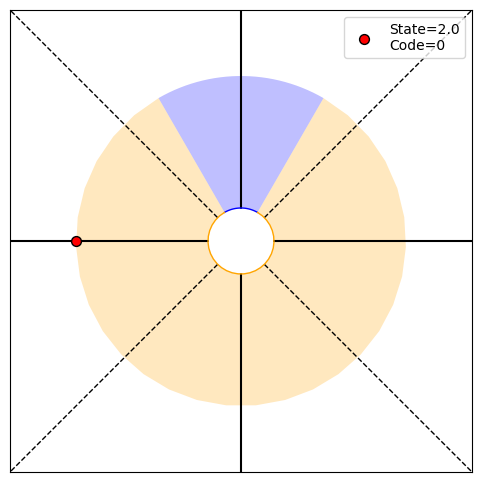

P(O1:3,S3|T)=[0.25 0.   0.25 0.25], P(O1:3|actions,T)=0.75, P(T|O1:3)=[0.77142857 0.22857143], H3=0.78
PRINT 1: 0.775512658133148, [0.25 0.   0.25 0.25]
PRINT 2: [0.03543325 0.03543325], [0.77142857 0.22857143]
Choosing randomly
Current angle: -270.0, Code received: 1.0


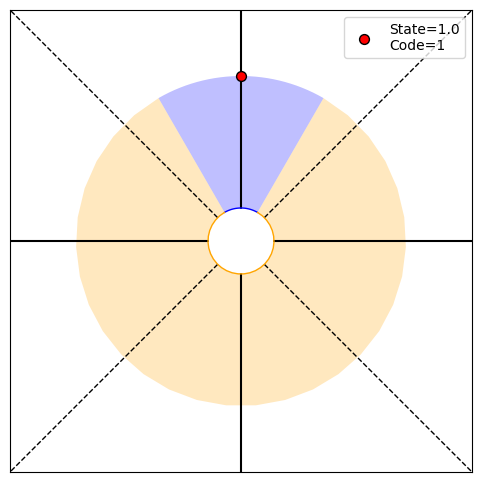

P(O1:4,S4|T)=[0.   0.25 0.   0.  ], P(O1:4|actions,T)=0.25, P(T|O1:4)=[0.62790698 0.37209302], H4=0.95
PRINT 1: 0.9522656254366644, [0.   0.25 0.   0.  ]
PRINT 2: [0.0461822 0.0461822], [0.62790698 0.37209302]
Choosing randomly
Current angle: -360.0, Code received: 0.0


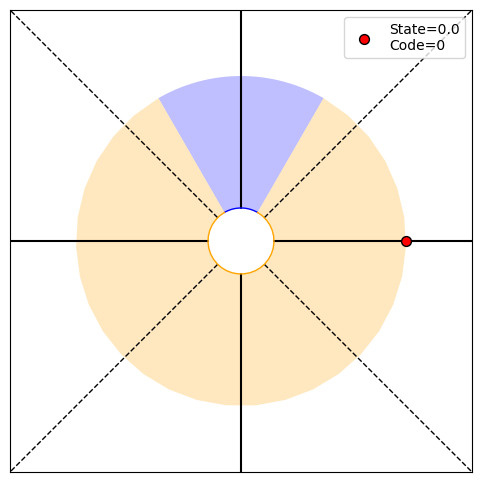

P(O1:5,S5|T)=[0.25 0.   0.25 0.25], P(O1:5|actions,T)=0.75, P(T|O1:5)=[0.71681416 0.28318584], H5=0.86
PRINT 1: 0.8597555090200143, [0.25 0.   0.25 0.25]
PRINT 2: [0.04052399 0.04052399], [0.71681416 0.28318584]
Choosing randomly
Current angle: -450.0, Code received: 0.0


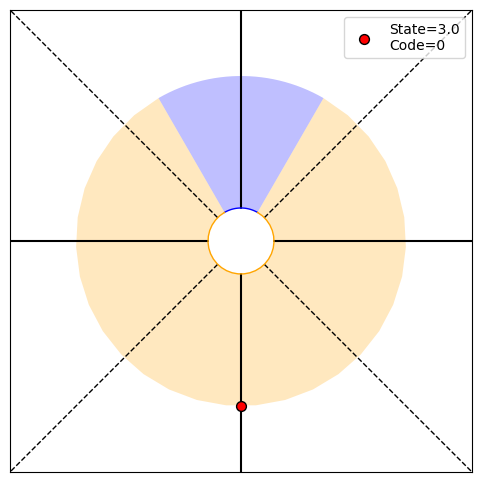

P(O1:6,S6|T)=[0.25 0.   0.25 0.25], P(O1:6|actions,T)=0.75, P(T|O1:6)=[0.79153094 0.20846906], H6=0.74
PRINT 1: 0.7385461861643008, [0.25 0.   0.25 0.25]
PRINT 2: [0.03324285 0.03324285], [0.79153094 0.20846906]
Choosing randomly
Current angle: -540.0, Code received: 0.0


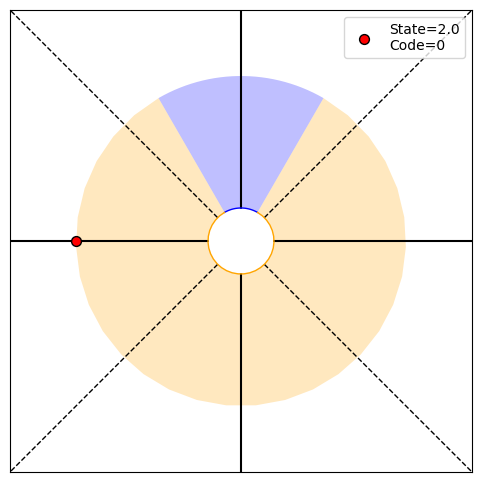

P(O1:7,S7|T)=[0.25 0.   0.25 0.25], P(O1:7|actions,T)=0.75, P(T|O1:7)=[0.85064177 0.14935823], H7=0.61
PRINT 1: 0.6082319330222582, [0.25 0.   0.25 0.25]
PRINT 2: [0.02579444 0.02579444], [0.85064177 0.14935823]
Choosing randomly
Current angle: -450.0, Code received: 0.0


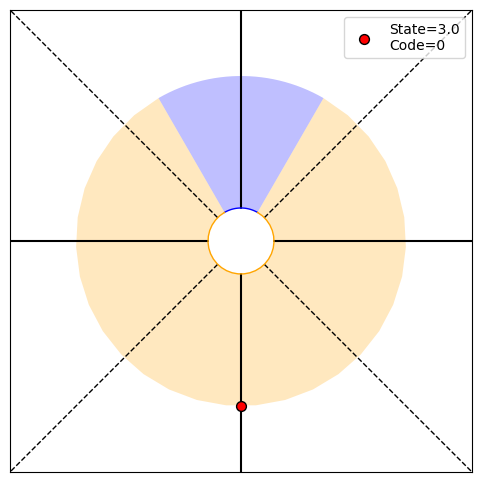

P(O1:8,S8|T)=[0.25 0.   0.25 0.25], P(O1:8|actions,T)=0.75, P(T|O1:8)=[0.89521081 0.10478919], H8=0.48
PRINT 1: 0.48399569082141936, [0.25 0.   0.25 0.25]
PRINT 2: [0.01916334 0.01916334], [0.89521081 0.10478919]
Choosing randomly
Current angle: -360.0, Code received: 0.0


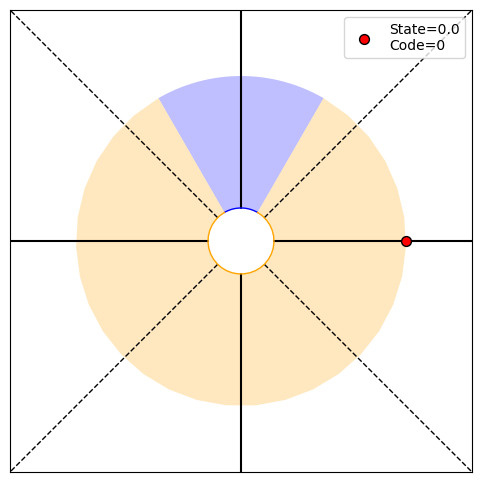

P(O1:9,S9|T)=[0.25 0.   0.25 0.25], P(O1:9|actions,T)=0.75, P(T|O1:9)=[0.92761205 0.07238795], H9=0.37
PRINT 1: 0.3747724956539134, [0.25 0.   0.25 0.25]
PRINT 2: [0.01378135 0.01378135], [0.92761205 0.07238795]
Choosing randomly
Current angle: -450.0, Code received: 0.0


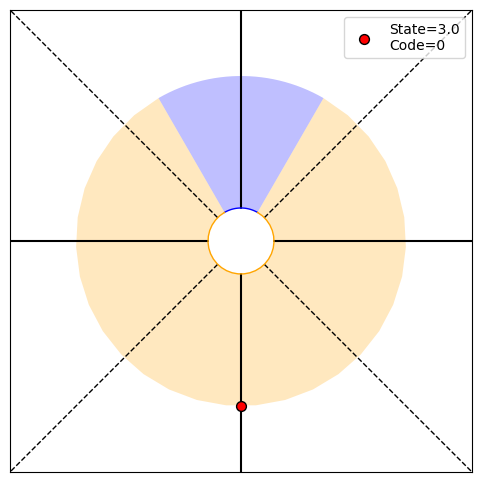

P(O1:10,S10|T)=[0.25 0.   0.25 0.25], P(O1:10|actions,T)=0.75, P(T|O1:10)=[0.95054812 0.04945188], H10=0.28
PRINT 1: 0.28406398840896735, [0.25 0.   0.25 0.25]
PRINT 2: [0.00968046 0.00968046], [0.95054812 0.04945188]
Choosing randomly
Current angle: -360.0, Code received: 0.0


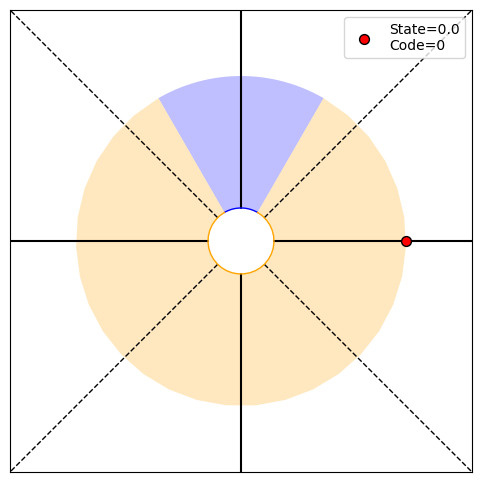

P(O1:11,S11|T)=[0.25 0.   0.25 0.25], P(O1:11|actions,T)=0.75, P(T|O1:11)=[0.96647953 0.03352047], H11=0.21
PRINT 1: 0.21175061176782764, [0.25 0.   0.25 0.25]
PRINT 2: [0.00668793 0.00668793], [0.96647953 0.03352047]
Choosing randomly
Current angle: -450.0, Code received: 0.0


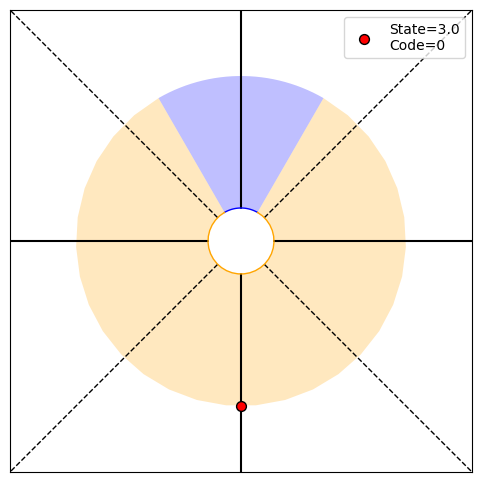

P(O1:12,S12|T)=[0.25 0.   0.25 0.25], P(O1:12|actions,T)=0.75, P(T|O1:12)=[0.97740051 0.02259949], H12=0.16
PRINT 1: 0.15579716772636337, [0.25 0.   0.25 0.25]
PRINT 2: [0.00456762 0.00456762], [0.97740051 0.02259949]
Choosing randomly
Current angle: -360.0, Code received: 0.0


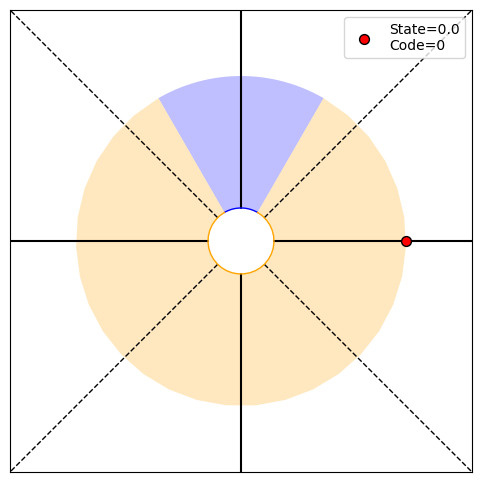

P(O1:13,S13|T)=[0.25 0.   0.25 0.25], P(O1:13|actions,T)=0.75, P(T|O1:13)=[0.98481931 0.01518069], H13=0.11
PRINT 1: 0.11344994969093523, [0.25 0.   0.25 0.25]
PRINT 2: [0.00309505 0.00309505], [0.98481931 0.01518069]
Choosing randomly
Current angle: -270.0, Code received: 1.0


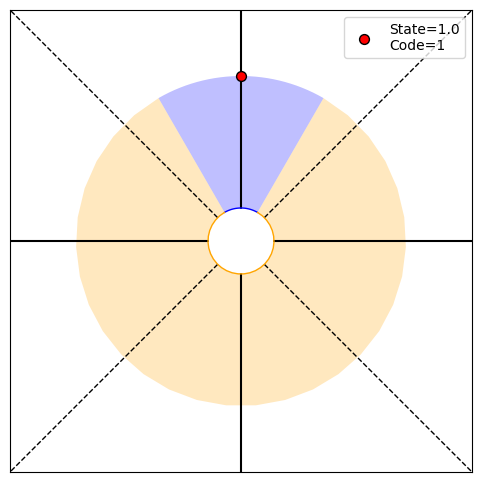

P(O1:14,S14|T)=[0.   0.25 0.   0.  ], P(O1:14|actions,T)=0.25, P(T|O1:14)=[0.97009264 0.02990736], H14=0.19
PRINT 1: 0.19392706453430145, [0.   0.25 0.   0.  ]
PRINT 2: [0.00599267 0.00599267], [0.97009264 0.02990736]
Choosing randomly
Current angle: -360.0, Code received: 0.0


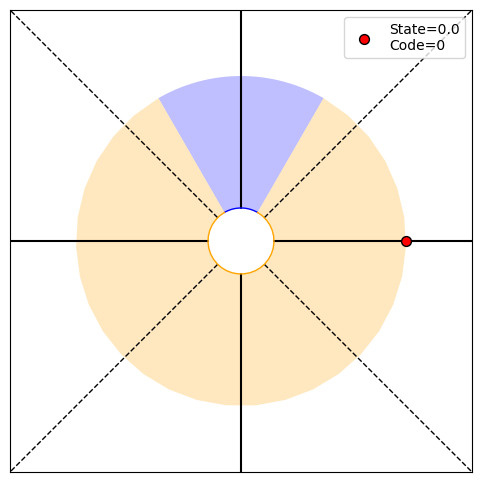

P(O1:15,S15|T)=[0.25 0.   0.25 0.25], P(O1:15|actions,T)=0.75, P(T|O1:15)=[0.97986099 0.02013901], H15=0.14
PRINT 1: 0.14222032717092223, [0.25 0.   0.25 0.25]
PRINT 2: [0.00408213 0.00408213], [0.97986099 0.02013901]
Choosing randomly
Current angle: -270.0, Code received: 1.0


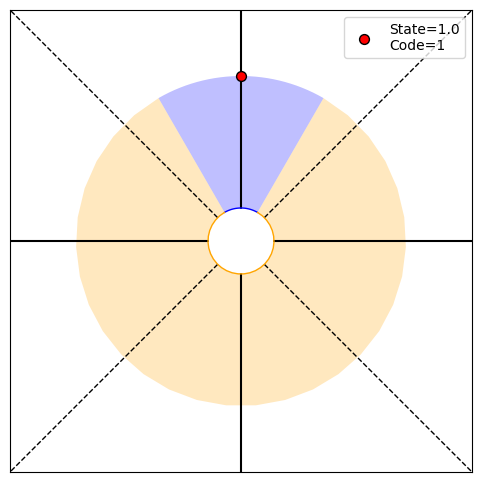

P(O1:16,S16|T)=[0.   0.25 0.   0.  ], P(O1:16|actions,T)=0.25, P(T|O1:16)=[0.96051713 0.03948287], H16=0.24
PRINT 1: 0.2399161309707755, [0.   0.25 0.   0.  ]
PRINT 2: [0.00782182 0.00782182], [0.96051713 0.03948287]
Choosing randomly
Current angle: -360.0, Code received: 0.0


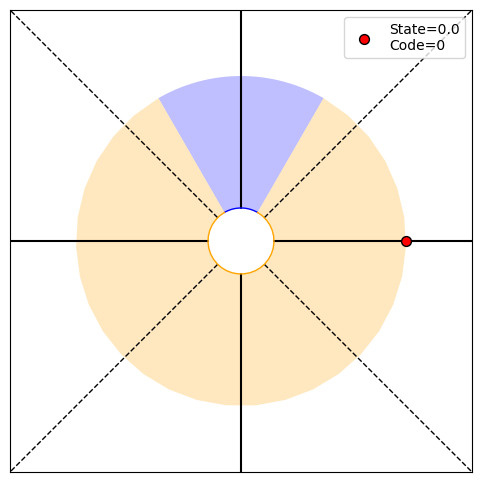

P(O1:17,S17|T)=[0.25 0.   0.25 0.25], P(O1:17|actions,T)=0.75, P(T|O1:17)=[0.97332704 0.02667296], H17=0.18
PRINT 1: 0.17742209328317993, [0.25 0.   0.25 0.25]
PRINT 2: [0.00536507 0.00536507], [0.97332704 0.02667296]
Choosing randomly
Current angle: -270.0, Code received: 1.0


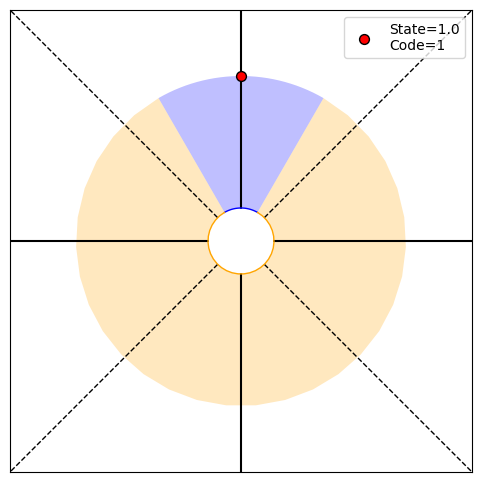

P(O1:18,S18|T)=[0.   0.25 0.   0.  ], P(O1:18|actions,T)=0.25, P(T|O1:18)=[0.94804001 0.05195999], H18=0.29
PRINT 1: 0.2946652044463459, [0.   0.25 0.   0.  ]
PRINT 2: [0.01014077 0.01014077], [0.94804001 0.05195999]
Choosing randomly
Current angle: -180.0, Code received: 0.0


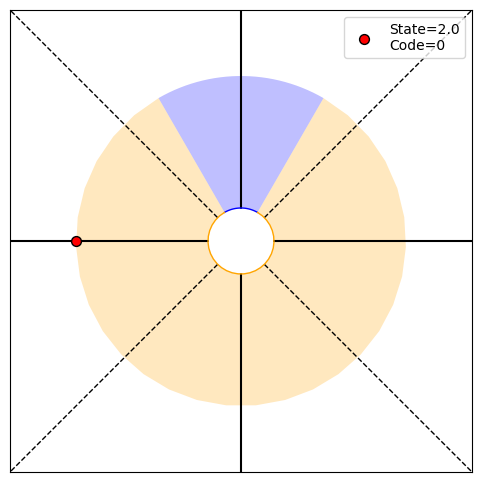

P(O1:19,S19|T)=[0.25 0.   0.25 0.25], P(O1:19|actions,T)=0.75, P(T|O1:19)=[0.96474947 0.03525053], H19=0.22
PRINT 1: 0.2200751986372056, [0.25 0.   0.25 0.25]
PRINT 2: [0.00701866 0.00701866], [0.96474947 0.03525053]
Choosing randomly
Current angle: -270.0, Code received: 1.0


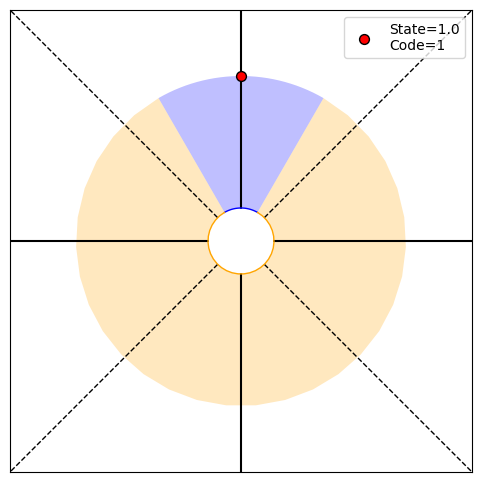

P(O1:20,S20|T)=[0.   0.25 0.   0.  ], P(O1:20|actions,T)=0.25, P(T|O1:20)=[0.93189952 0.06810048], H20=0.36
PRINT 1: 0.3587946990783934, [0.   0.25 0.   0.  ]
PRINT 2: [0.01303323 0.01303323], [0.93189952 0.06810048]
Choosing randomly
Current angle: -360.0, Code received: 0.0


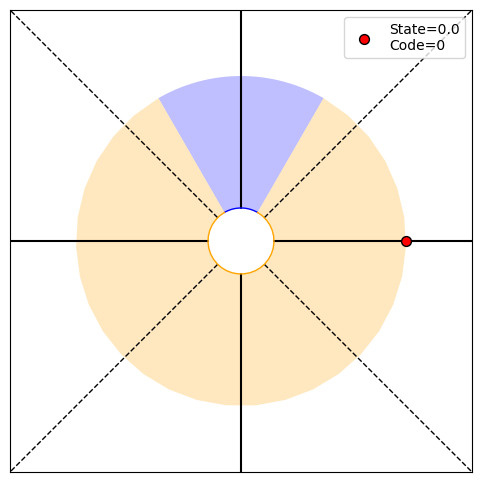

P(O1:21,S21|T)=[0.25 0.   0.25 0.25], P(O1:21|actions,T)=0.75, P(T|O1:21)=[0.95354515 0.04645485], H21=0.27
PRINT 1: 0.27114213698675205, [0.25 0.   0.25 0.25]
PRINT 2: [0.00912657 0.00912657], [0.95354515 0.04645485]
Choosing randomly
Current angle: -450.0, Code received: 0.0


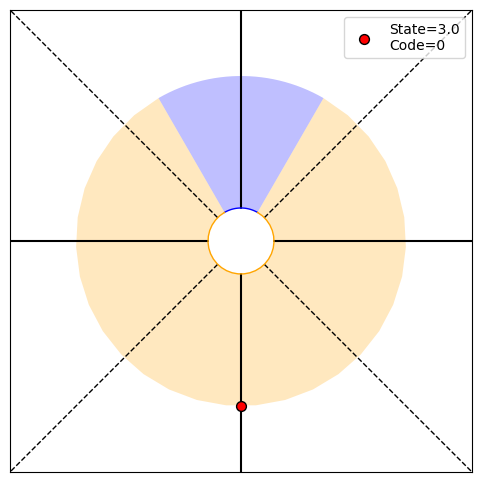

P(O1:22,S22|T)=[0.25 0.   0.25 0.25], P(O1:22|actions,T)=0.75, P(T|O1:22)=[0.96854299 0.03145701], H22=0.20
PRINT 1: 0.20164688611491816, [0.25 0.   0.25 0.25]
PRINT 2: [0.00629162 0.00629162], [0.96854299 0.03145701]
Choosing randomly
Current angle: -360.0, Code received: 0.0


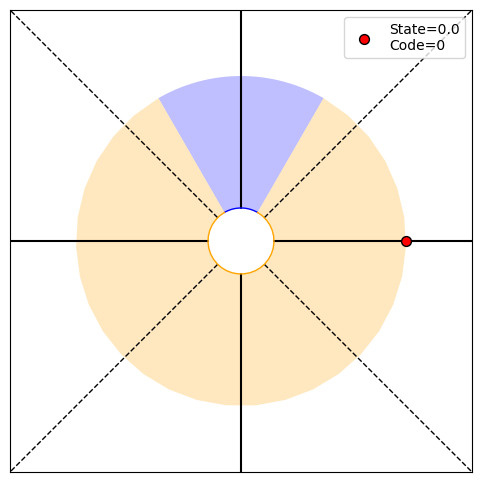

P(O1:23,S23|T)=[0.25 0.   0.25 0.25], P(O1:23|actions,T)=0.75, P(T|O1:23)=[0.97880643 0.02119357], H23=0.15
PRINT 1: 0.14809065623506237, [0.25 0.   0.25 0.25]
PRINT 2: [0.00429056 0.00429056], [0.97880643 0.02119357]
Choosing randomly
Current angle: -270.0, Code received: 1.0


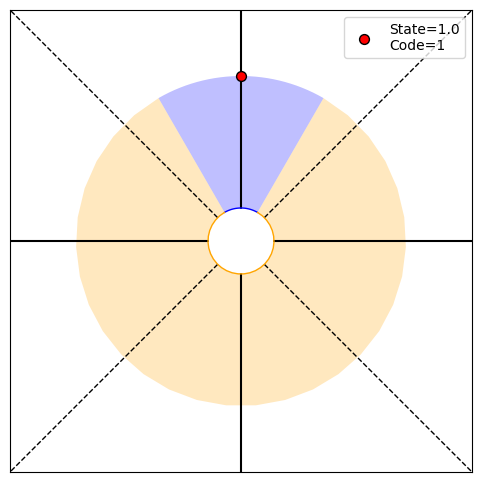

P(O1:24,S24|T)=[0.   0.25 0.   0.  ], P(O1:24|actions,T)=0.25, P(T|O1:24)=[0.95849255 0.04150745], H24=0.25
PRINT 1: 0.24916160752930652, [0.   0.25 0.   0.  ]
PRINT 2: [0.00820304 0.00820304], [0.95849255 0.04150745]
Choosing randomly
Current angle: -180.0, Code received: 0.0


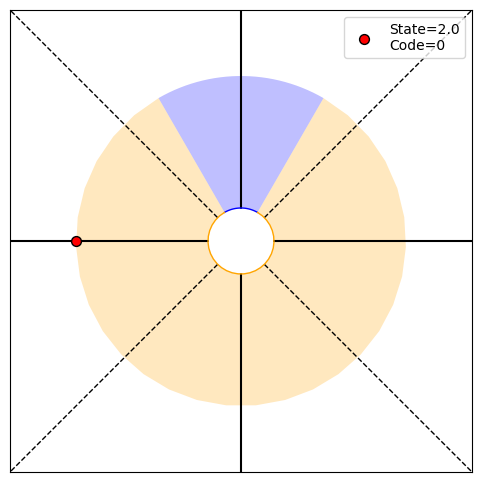

P(O1:25,S25|T)=[0.25 0.   0.25 0.25], P(O1:25|actions,T)=0.75, P(T|O1:25)=[0.97194014 0.02805986], H25=0.18
PRINT 1: 0.18456685206160264, [0.25 0.   0.25 0.25]
PRINT 2: [0.00563479 0.00563479], [0.97194014 0.02805986]
Choosing randomly
Current angle: -90.0, Code received: 0.0


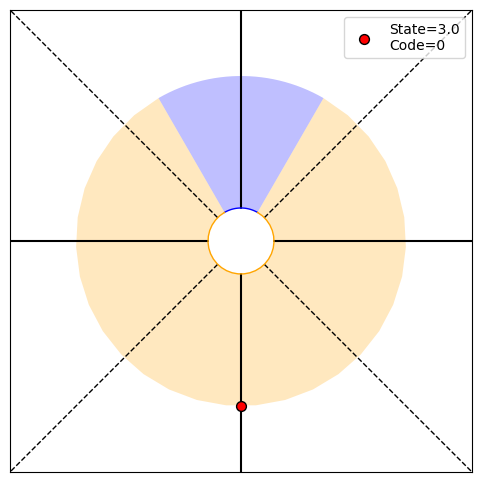

P(O1:26,S26|T)=[0.25 0.   0.25 0.25], P(O1:26|actions,T)=0.75, P(T|O1:26)=[0.9811168 0.0188832], H26=0.14
PRINT 1: 0.13512324928626673, [0.25 0.   0.25 0.25]
PRINT 2: [0.00383323 0.00383323], [0.9811168 0.0188832]
Choosing randomly
Current angle: -180.0, Code received: 0.0


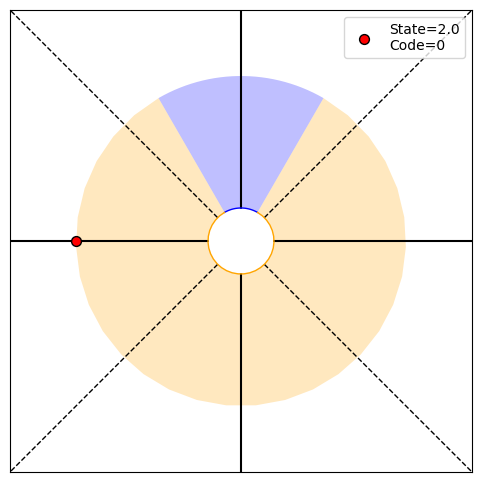

P(O1:27,S27|T)=[0.25 0.   0.25 0.25], P(O1:27|actions,T)=0.75, P(T|O1:27)=[0.98733146 0.01266854], H27=0.10
PRINT 1: 0.09800538215190052, [0.25 0.   0.25 0.25]
PRINT 2: [0.00259048 0.00259048], [0.98733146 0.01266854]
Choosing randomly
Current angle: -270.0, Code received: 1.0


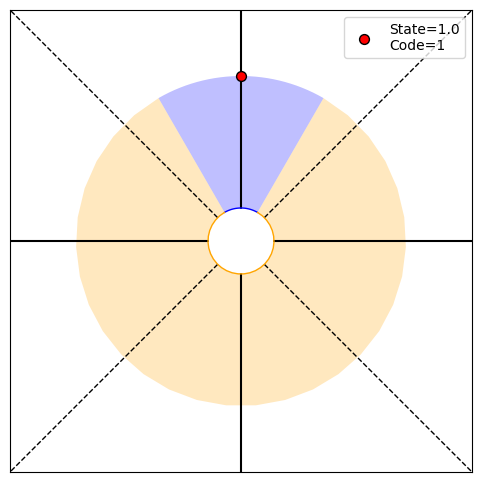

P(O1:28,S28|T)=[0.   0.25 0.   0.  ], P(O1:28|actions,T)=0.25, P(T|O1:28)=[0.97497989 0.02502011], H28=0.17
PRINT 1: 0.16876720088555974, [0.   0.25 0.   0.  ]
PRINT 2: [0.00504244 0.00504244], [0.97497989 0.02502011]
Choosing randomly
Current angle: -180.0, Code received: 0.0


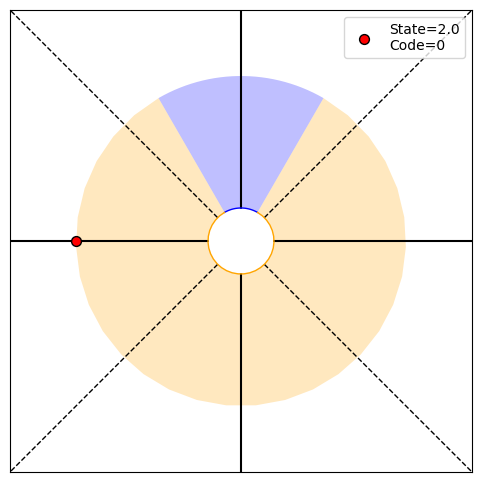

P(O1:29,S29|T)=[0.25 0.   0.25 0.25], P(O1:29|actions,T)=0.75, P(T|O1:29)=[0.98317965 0.01682035], H29=0.12
PRINT 1: 0.1231946522960734, [0.25 0.   0.25 0.25]
PRINT 2: [0.00342276 0.00342276], [0.98317965 0.01682035]
Choosing randomly
Current angle: -90.0, Code received: 0.0


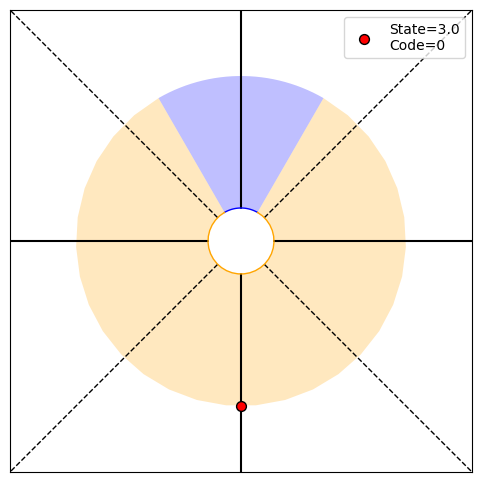

P(O1:30,S30|T)=[0.25 0.   0.25 0.25], P(O1:30|actions,T)=0.75, P(T|O1:30)=[0.9887232 0.0112768], H30=0.09
PRINT 1: 0.0891433991060945, [0.25 0.   0.25 0.25]
PRINT 2: [0.00230965 0.00230965], [0.9887232 0.0112768]
Choosing randomly
Current angle: 0.0, Code received: 0.0


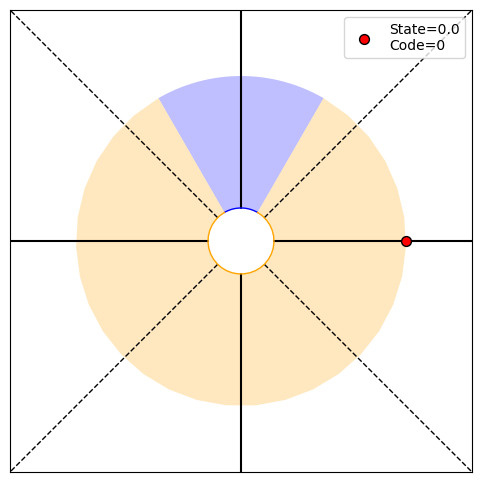

P(O1:31,S31|T)=[0.25 0.   0.25 0.25], P(O1:31|actions,T)=0.75, P(T|O1:31)=[0.99245377 0.00754623], H31=0.06
PRINT 1: 0.06404686175219168, [0.25 0.   0.25 0.25]
PRINT 2: [0.00155231 0.00155231], [0.99245377 0.00754623]
Choosing randomly
Current angle: -90.0, Code received: 0.0


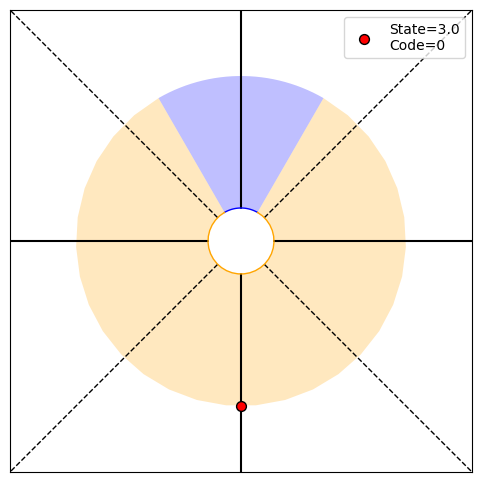

P(O1:32,S32|T)=[0.25 0.   0.25 0.25], P(O1:32|actions,T)=0.75, P(T|O1:32)=[0.99495649 0.00504351], H32=0.05
PRINT 1: 0.04574666140685571, [0.25 0.   0.25 0.25]
PRINT 2: [0.00104051 0.00104051], [0.99495649 0.00504351]
Choosing randomly
Current angle: 0.0, Code received: 0.0


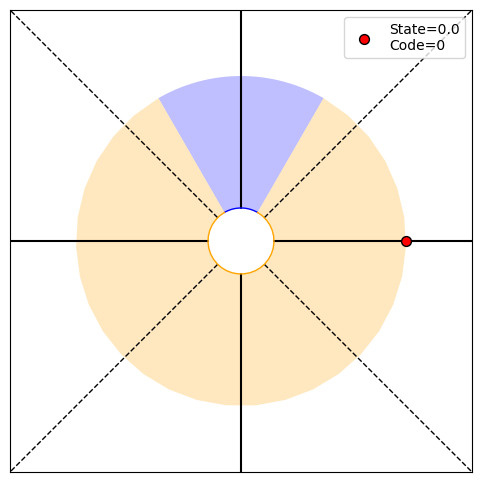

P(O1:33,S33|T)=[0.25 0.   0.25 0.25], P(O1:33|actions,T)=0.75, P(T|O1:33)=[0.996632 0.003368], H33=0.03
PRINT 1: 0.03251519254991216, [0.25 0.   0.25 0.25]
PRINT 2: [0.0006962 0.0006962], [0.996632 0.003368]
Choosing randomly
Current angle: 90.0, Code received: 1.0


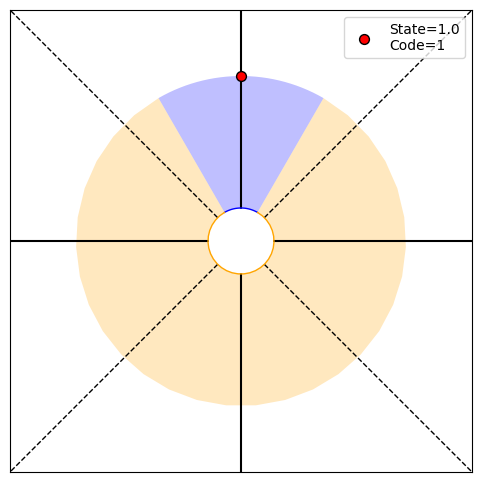

P(O1:34,S34|T)=[0.   0.25 0.   0.  ], P(O1:34|actions,T)=0.25, P(T|O1:34)=[0.99328661 0.00671339], H34=0.06
PRINT 1: 0.058115019183036236, [0.   0.25 0.   0.  ]
PRINT 2: [0.00138233 0.00138233], [0.99328661 0.00671339]
Choosing randomly
Current angle: 180.0, Code received: 0.0


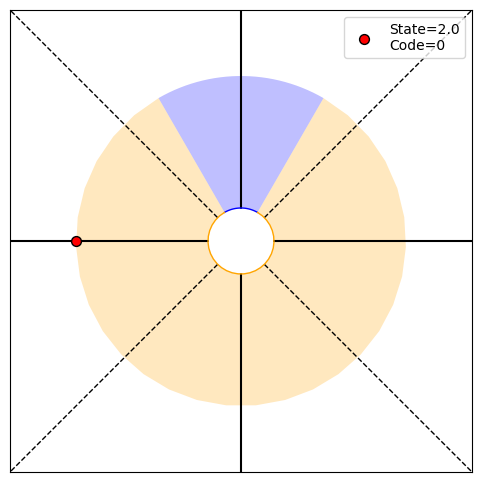

P(O1:35,S35|T)=[0.25 0.   0.25 0.25], P(O1:35|actions,T)=0.75, P(T|O1:35)=[0.99551437 0.00448563], H35=0.04
PRINT 1: 0.041446903455125694, [0.25 0.   0.25 0.25]
PRINT 2: [0.00092602 0.00092602], [0.99551437 0.00448563]
Choosing randomly
Current angle: 90.0, Code received: 1.0


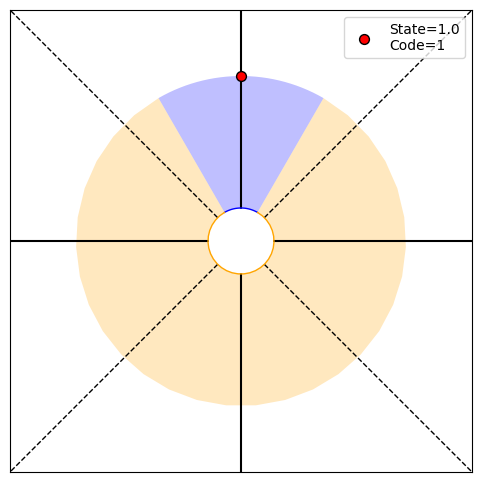

P(O1:36,S36|T)=[0.   0.25 0.   0.  ], P(O1:36|actions,T)=0.25, P(T|O1:36)=[0.9910688 0.0089312], H36=0.07
PRINT 1: 0.07362133602616572, [0.   0.25 0.   0.  ]
PRINT 2: [0.00183425 0.00183425], [0.9910688 0.0089312]
Choosing randomly
Current angle: 180.0, Code received: 0.0


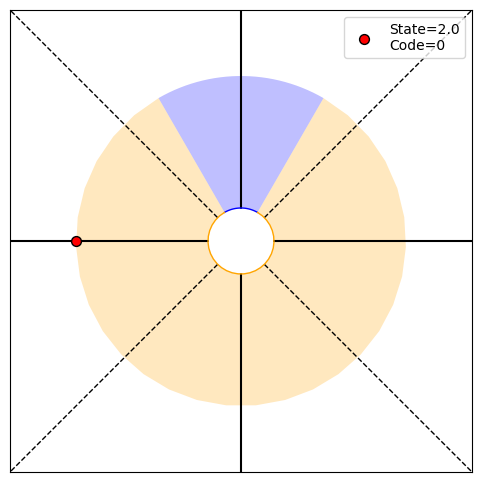

P(O1:37,S37|T)=[0.25 0.   0.25 0.25], P(O1:37|actions,T)=0.75, P(T|O1:37)=[0.99402809 0.00597191], H37=0.05
PRINT 1: 0.05270791251305886, [0.25 0.   0.25 0.25]
PRINT 2: [0.00123072 0.00123072], [0.99402809 0.00597191]
Choosing randomly
Current angle: 90.0, Code received: 1.0


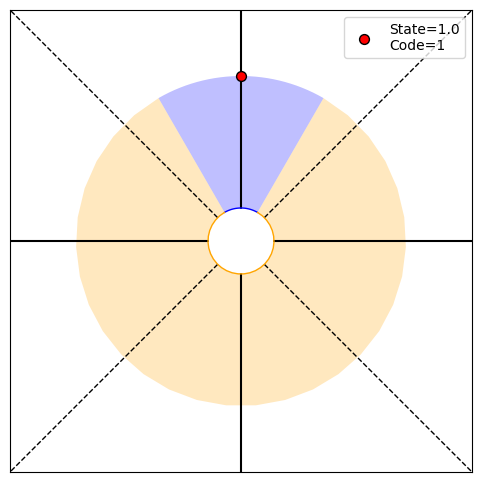

P(O1:38,S38|T)=[0.   0.25 0.   0.  ], P(O1:38|actions,T)=0.25, P(T|O1:38)=[0.98812708 0.01187292], H38=0.09
PRINT 1: 0.09296825599339925, [0.   0.25 0.   0.  ]
PRINT 2: [0.00243005 0.00243005], [0.98812708 0.01187292]
Choosing randomly
Current angle: 180.0, Code received: 0.0


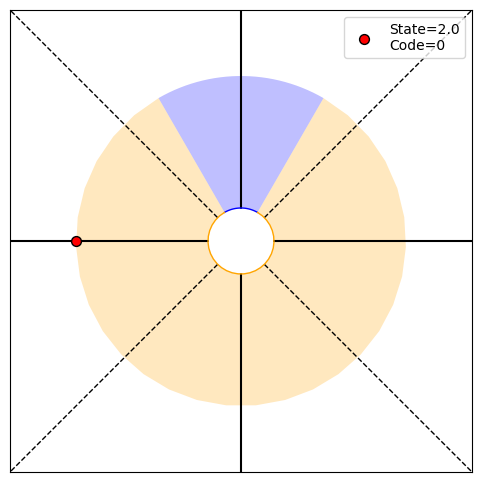

P(O1:39,S39|T)=[0.25 0.   0.25 0.25], P(O1:39|actions,T)=0.75, P(T|O1:39)=[0.99205327 0.00794673], H39=0.07
PRINT 1: 0.06685083361533006, [0.25 0.   0.25 0.25]
PRINT 2: [0.00163394 0.00163394], [0.99205327 0.00794673]
Choosing randomly
Current angle: 270.0, Code received: 0.0


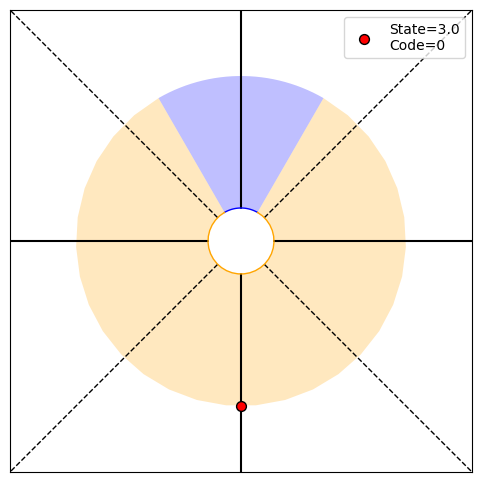

P(O1:40,S40|T)=[0.25 0.   0.25 0.25], P(O1:40|actions,T)=0.75, P(T|O1:40)=[0.99468811 0.00531189], H40=0.05
PRINT 1: 0.04778266136356093, [0.25 0.   0.25 0.25]
PRINT 2: [0.00109554 0.00109554], [0.99468811 0.00531189]
Choosing randomly
Current angle: 180.0, Code received: 0.0


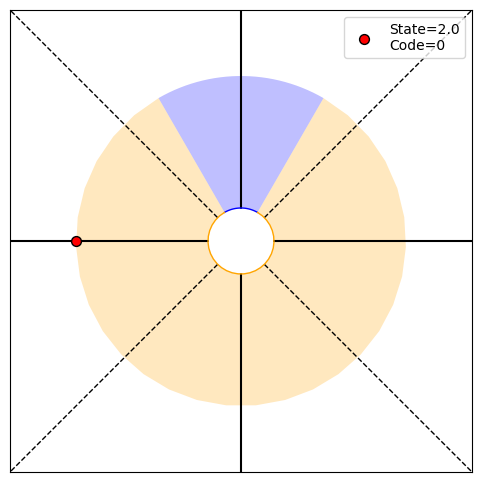

P(O1:41,S41|T)=[0.25 0.   0.25 0.25], P(O1:41|actions,T)=0.75, P(T|O1:41)=[0.99645246 0.00354754], H41=0.03
PRINT 1: 0.03398224831080421, [0.25 0.   0.25 0.25]
PRINT 2: [0.00073316 0.00073316], [0.99645246 0.00354754]
Choosing randomly
Current angle: 270.0, Code received: 0.0


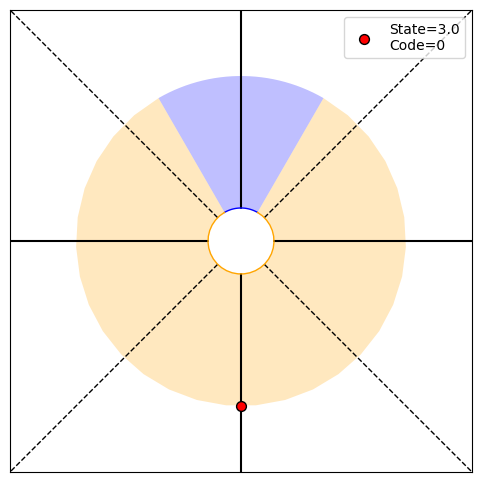

P(O1:42,S42|T)=[0.25 0.   0.25 0.25], P(O1:42|actions,T)=0.75, P(T|O1:42)=[0.99763217 0.00236783], H42=0.02
PRINT 1: 0.02406472108581172, [0.25 0.   0.25 0.25]
PRINT 2: [0.00049002 0.00049002], [0.99763217 0.00236783]
Choosing randomly
Current angle: 180.0, Code received: 0.0


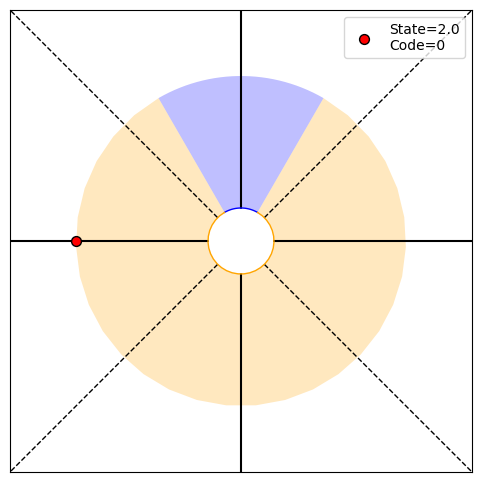

P(O1:43,S43|T)=[0.25 0.   0.25 0.25], P(O1:43|actions,T)=0.75, P(T|O1:43)=[0.9984202 0.0015798], H43=0.02
PRINT 1: 0.016979042499482247, [0.25 0.   0.25 0.25]
PRINT 2: [0.00032724 0.00032724], [0.9984202 0.0015798]
Choosing randomly
Current angle: 270.0, Code received: 0.0


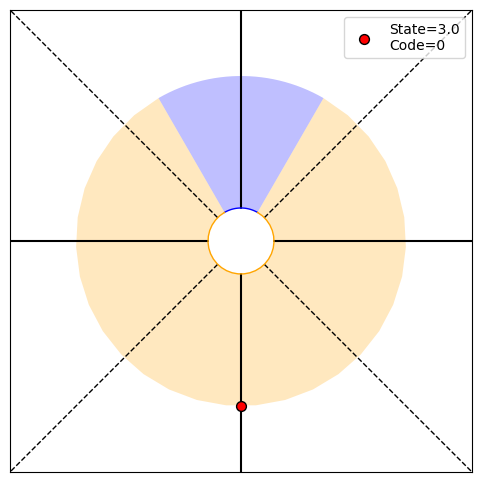

P(O1:44,S44|T)=[0.25 0.   0.25 0.25], P(O1:44|actions,T)=0.75, P(T|O1:44)=[0.99894625 0.00105375], H44=0.01
PRINT 1: 0.011941331636331997, [0.25 0.   0.25 0.25]
PRINT 2: [0.00021841 0.00021841], [0.99894625 0.00105375]
Choosing randomly
Current angle: 180.0, Code received: 0.0


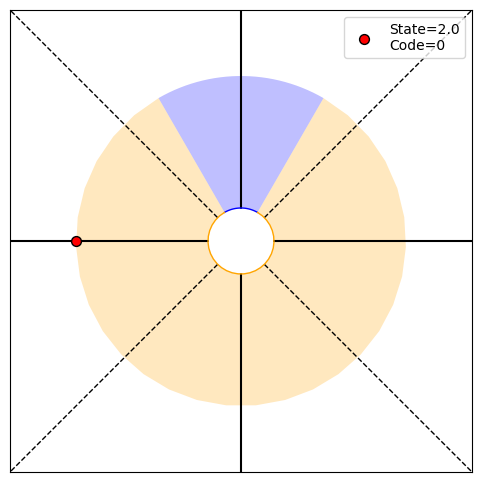

P(O1:45,S45|T)=[0.25 0.   0.25 0.25], P(O1:45|actions,T)=0.75, P(T|O1:45)=[9.9929725e-01 7.0274956e-04], H45=0.01
PRINT 1: 0.008374589010415979, [0.25 0.   0.25 0.25]
PRINT 2: [0.00014571 0.00014571], [9.9929725e-01 7.0274956e-04]
Choosing randomly
Current angle: 270.0, Code received: 0.0


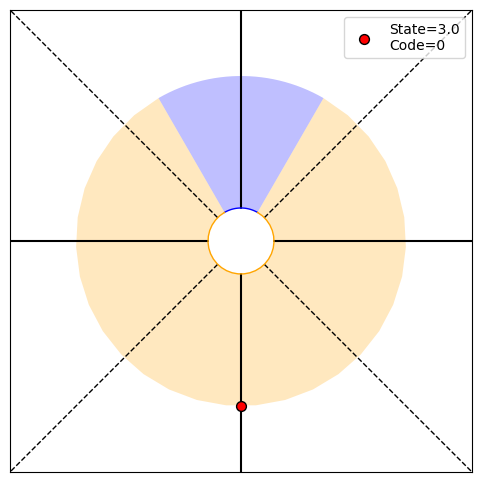

P(O1:46,S46|T)=[0.25 0.   0.25 0.25], P(O1:46|actions,T)=0.75, P(T|O1:46)=[9.99531391e-01 4.68609478e-04], H46=0.01
PRINT 1: 0.0058584072414440596, [0.25 0.   0.25 0.25]
PRINT 2: [9.71924571e-05 9.71924571e-05], [9.99531391e-01 4.68609478e-04]
Choosing randomly
Current angle: 180.0, Code received: 0.0


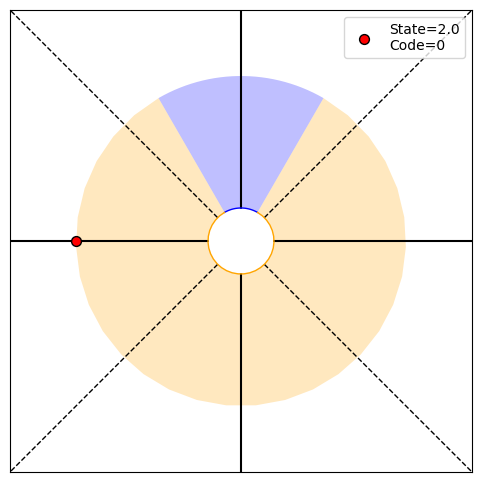

P(O1:47,S47|T)=[0.25 0.   0.25 0.25], P(O1:47|actions,T)=0.75, P(T|O1:47)=[9.99687545e-01 3.12455125e-04], H47=0.00
PRINT 1: 0.004088954308405901, [0.25 0.   0.25 0.25]
PRINT 2: [6.48168239e-05 6.48168239e-05], [9.99687545e-01 3.12455125e-04]
Choosing randomly
Current angle: 270.0, Code received: 0.0


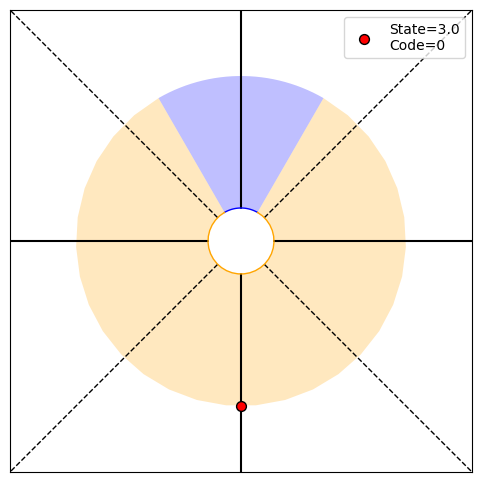

P(O1:48,S48|T)=[0.25 0.   0.25 0.25], P(O1:48|actions,T)=0.75, P(T|O1:48)=[9.99791675e-01 2.08325114e-04], H48=0.00
PRINT 1: 0.0028481002091317316, [0.25 0.   0.25 0.25]
PRINT 2: [4.32209324e-05 4.32209324e-05], [9.99791675e-01 2.08325114e-04]
Choosing randomly
Current angle: 360.0, Code received: 0.0


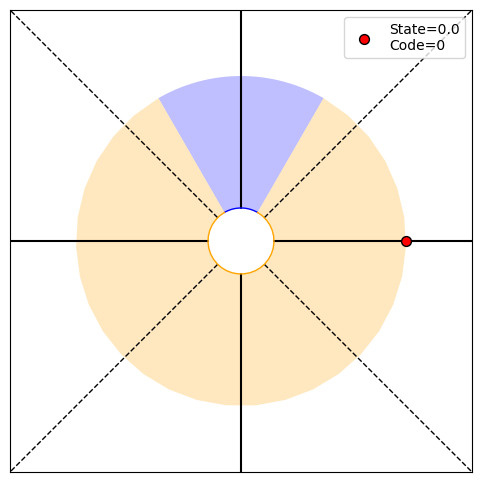

P(O1:49,S49|T)=[0.25 0.   0.25 0.25], P(O1:49|actions,T)=0.75, P(T|O1:49)=[9.99861107e-01 1.38893054e-04], H49=0.00
PRINT 1: 0.0019801056036519845, [0.25 0.   0.25 0.25]
PRINT 2: [2.88182746e-05 2.88182746e-05], [9.99861107e-01 1.38893054e-04]
Choosing randomly
Current angle: 270.0, Code received: 0.0


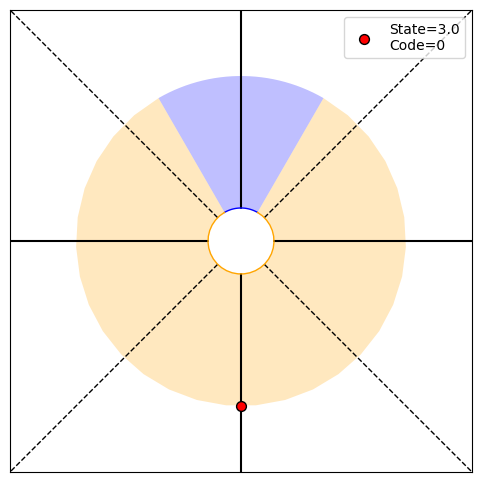

P(O1:50,S50|T)=[0.25 0.   0.25 0.25], P(O1:50|actions,T)=0.75, P(T|O1:50)=[9.99907400e-01 9.25996568e-05], H50=0.00
PRINT 1: 0.0013742957555548775, [0.25 0.   0.25 0.25]
PRINT 2: [1.92141033e-05 1.92141033e-05], [9.99907400e-01 9.25996568e-05]
Choosing randomly
Current angle: 0.0, Code received: 0.0


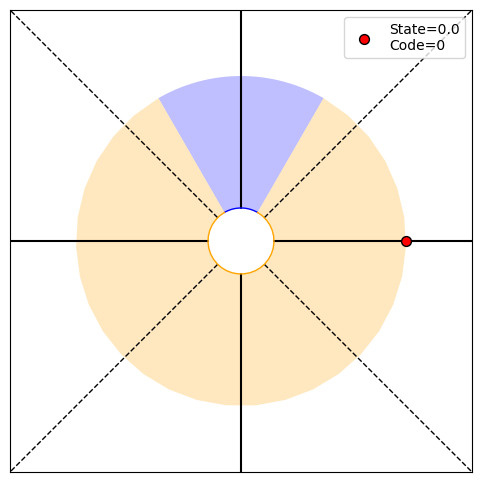

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.04730118 0.04730118], [0.6 0.4]
Choosing randomly
Current angle: -90.0, Code received: 0.0


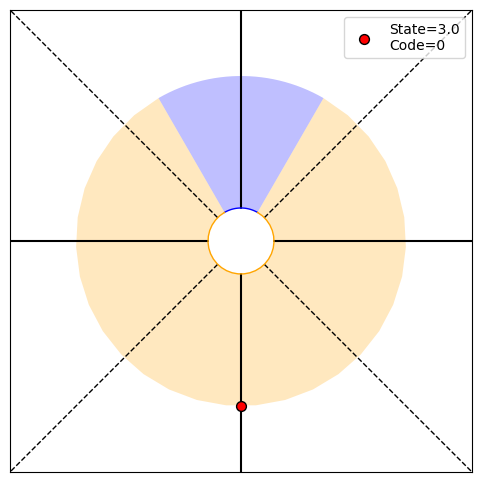

P(O1:2,S2|T)=[0.25 0.   0.25 0.25], P(O1:2|actions,T)=0.75, P(T|O1:2)=[0.69230769 0.30769231], H2=0.89
PRINT 1: 0.8904916402194913, [0.25 0.   0.25 0.25]
PRINT 2: [0.04240536 0.04240536], [0.69230769 0.30769231]
Choosing randomly
Current angle: 0.0, Code received: 0.0


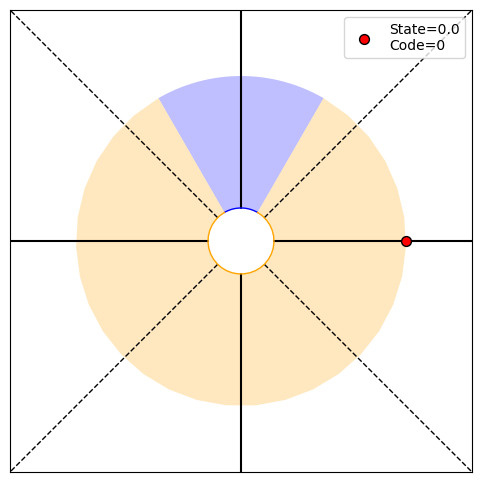

P(O1:3,S3|T)=[0.25 0.   0.25 0.25], P(O1:3|actions,T)=0.75, P(T|O1:3)=[0.77142857 0.22857143], H3=0.78
PRINT 1: 0.775512658133148, [0.25 0.   0.25 0.25]
PRINT 2: [0.03543325 0.03543325], [0.77142857 0.22857143]
Choosing randomly
Current angle: -90.0, Code received: 0.0


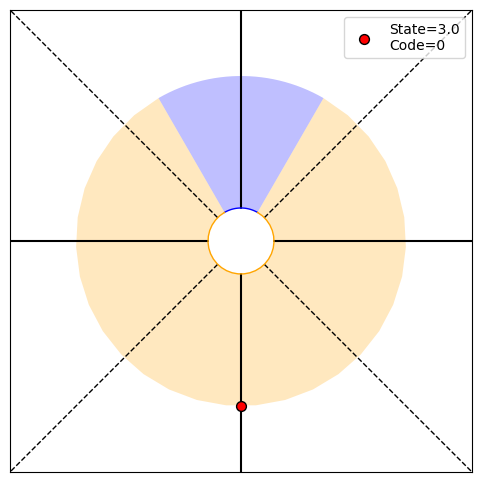

P(O1:4,S4|T)=[0.25 0.   0.25 0.25], P(O1:4|actions,T)=0.75, P(T|O1:4)=[0.83505155 0.16494845], H4=0.65
PRINT 1: 0.6460174789535753, [0.25 0.   0.25 0.25]
PRINT 2: [0.02790644 0.02790644], [0.83505155 0.16494845]
Choosing randomly
Current angle: 0.0, Code received: 0.0


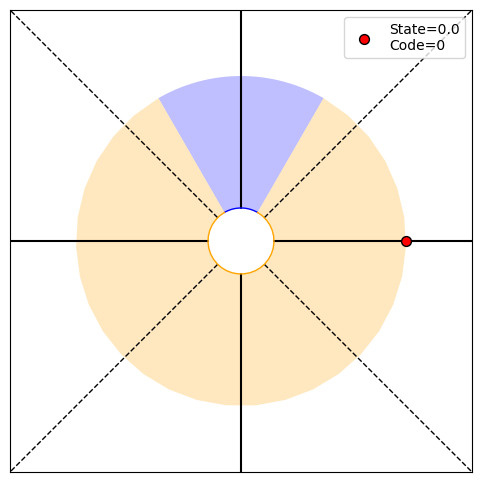

P(O1:5,S5|T)=[0.25 0.   0.25 0.25], P(O1:5|actions,T)=0.75, P(T|O1:5)=[0.88363636 0.11636364], H5=0.52
PRINT 1: 0.5188171234076412, [0.25 0.   0.25 0.25]
PRINT 2: [0.02097066 0.02097066], [0.88363636 0.11636364]
Choosing randomly
Current angle: 90.0, Code received: 1.0


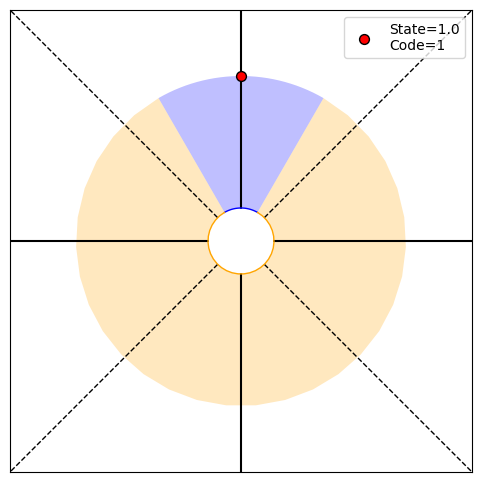

P(O1:6,S6|T)=[0.   0.25 0.   0.  ], P(O1:6|actions,T)=0.25, P(T|O1:6)=[0.79153094 0.20846906], H6=0.74
PRINT 1: 0.7385461861643008, [0.   0.25 0.   0.  ]
PRINT 2: [0.03324285 0.03324285], [0.79153094 0.20846906]
Choosing randomly
Current angle: 180.0, Code received: 0.0


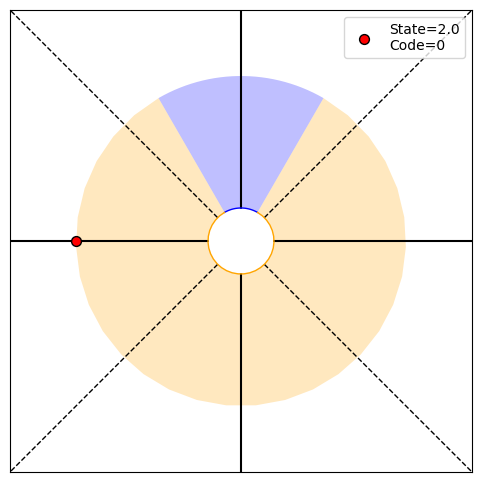

P(O1:7,S7|T)=[0.25 0.   0.25 0.25], P(O1:7|actions,T)=0.75, P(T|O1:7)=[0.85064177 0.14935823], H7=0.61
PRINT 1: 0.6082319330222582, [0.25 0.   0.25 0.25]
PRINT 2: [0.02579444 0.02579444], [0.85064177 0.14935823]
Choosing randomly
Current angle: 90.0, Code received: 1.0


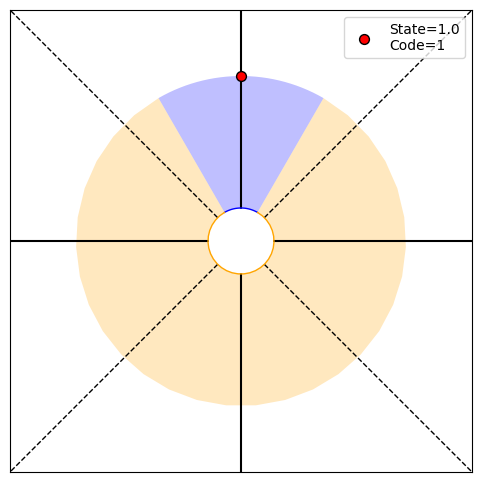

P(O1:8,S8|T)=[0.   0.25 0.   0.  ], P(O1:8|actions,T)=0.25, P(T|O1:8)=[0.74010152 0.25989848], H8=0.83
PRINT 1: 0.8265931344916198, [0.   0.25 0.   0.  ]
PRINT 2: [0.03850594 0.03850594], [0.74010152 0.25989848]
Choosing randomly
Current angle: 0.0, Code received: 0.0


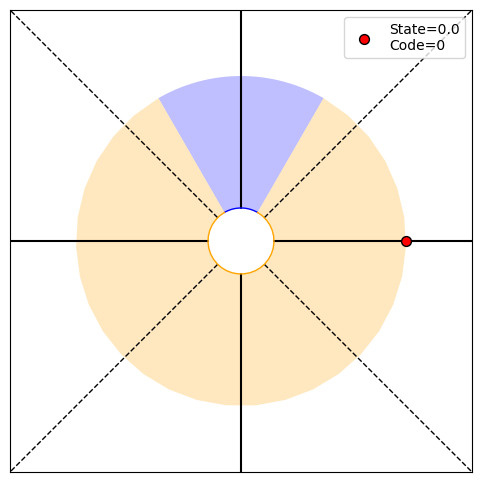

P(O1:9,S9|T)=[0.25 0.   0.25 0.25], P(O1:9|actions,T)=0.75, P(T|O1:9)=[0.81030011 0.18969989], H9=0.70
PRINT 1: 0.7008432282915349, [0.25 0.   0.25 0.25]
PRINT 2: [0.03104175 0.03104175], [0.81030011 0.18969989]
Choosing randomly
Current angle: -90.0, Code received: 0.0


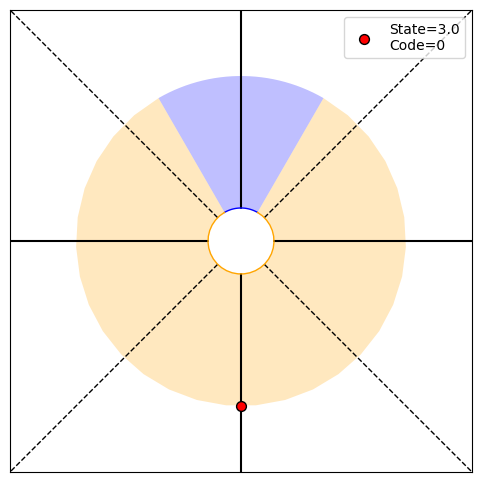

P(O1:10,S10|T)=[0.25 0.   0.25 0.25], P(O1:10|actions,T)=0.75, P(T|O1:10)=[0.8649967 0.1350033], H10=0.57
PRINT 1: 0.5710017923786879, [0.25 0.   0.25 0.25]
PRINT 2: [0.02375517 0.02375517], [0.8649967 0.1350033]
Choosing randomly
Current angle: -180.0, Code received: 0.0


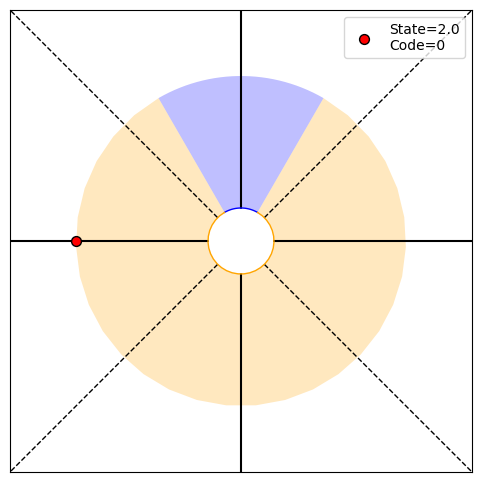

P(O1:11,S11|T)=[0.25 0.   0.25 0.25], P(O1:11|actions,T)=0.75, P(T|O1:11)=[0.90575675 0.09424325], H11=0.45
PRINT 1: 0.4504768327942288, [0.25 0.   0.25 0.25]
PRINT 2: [0.01746401 0.01746401], [0.90575675 0.09424325]
Choosing randomly
Current angle: -90.0, Code received: 0.0


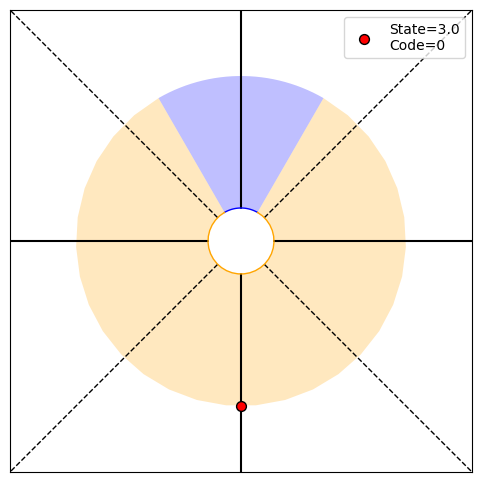

P(O1:12,S12|T)=[0.25 0.   0.25 0.25], P(O1:12|actions,T)=0.75, P(T|O1:12)=[0.93513342 0.06486658], H12=0.35
PRINT 1: 0.34646787085955577, [0.25 0.   0.25 0.25]
PRINT 2: [0.01246335 0.01246335], [0.93513342 0.06486658]
Choosing randomly
Current angle: 0.0, Code received: 0.0


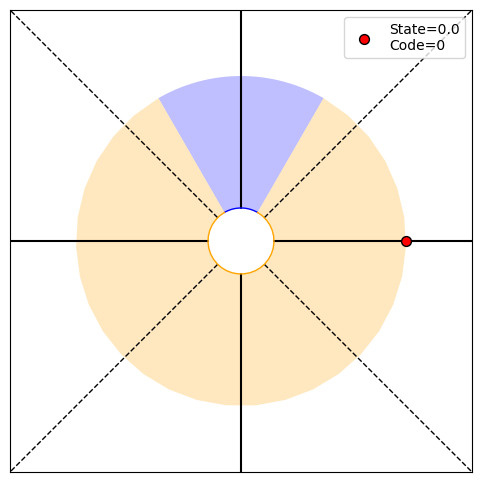

P(O1:13,S13|T)=[0.25 0.   0.25 0.25], P(O1:13|actions,T)=0.75, P(T|O1:13)=[0.95579991 0.04420009], H13=0.26
PRINT 1: 0.26122861470306796, [0.25 0.   0.25 0.25]
PRINT 2: [0.00870709 0.00870709], [0.95579991 0.04420009]
Choosing randomly
Current angle: -90.0, Code received: 0.0


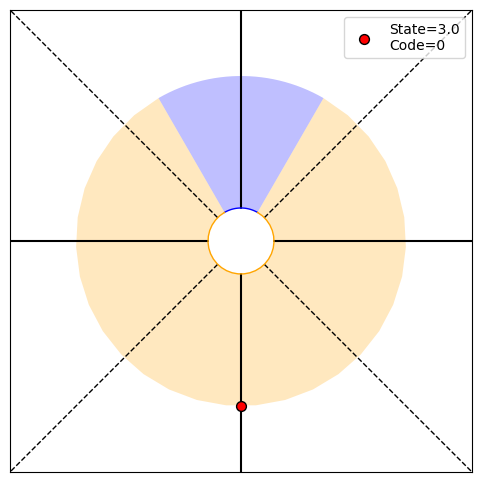

P(O1:14,S14|T)=[0.25 0.   0.25 0.25], P(O1:14|actions,T)=0.75, P(T|O1:14)=[0.97009264 0.02990736], H14=0.19
PRINT 1: 0.19392706453430134, [0.25 0.   0.25 0.25]
PRINT 2: [0.00599267 0.00599267], [0.97009264 0.02990736]
Choosing randomly
Current angle: 0.0, Code received: 0.0


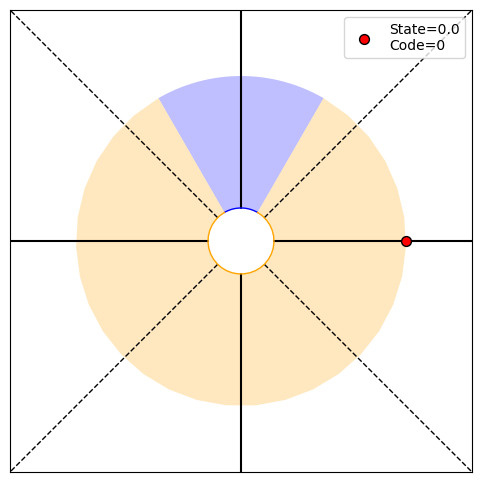

P(O1:15,S15|T)=[0.25 0.   0.25 0.25], P(O1:15|actions,T)=0.75, P(T|O1:15)=[0.97986099 0.02013901], H15=0.14
PRINT 1: 0.14222032717092226, [0.25 0.   0.25 0.25]
PRINT 2: [0.00408213 0.00408213], [0.97986099 0.02013901]
Choosing randomly
Current angle: 90.0, Code received: 1.0


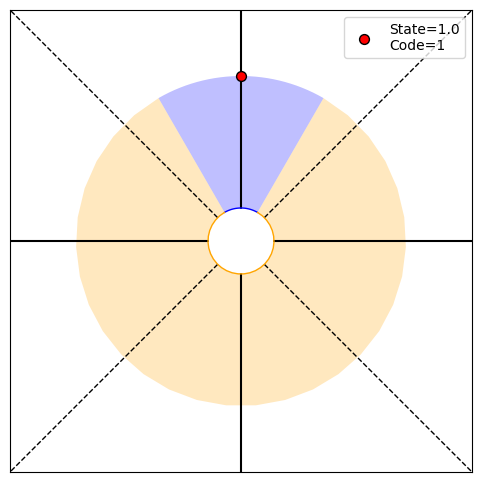

P(O1:16,S16|T)=[0.   0.25 0.   0.  ], P(O1:16|actions,T)=0.25, P(T|O1:16)=[0.96051713 0.03948287], H16=0.24
PRINT 1: 0.23991613097077552, [0.   0.25 0.   0.  ]
PRINT 2: [0.00782182 0.00782182], [0.96051713 0.03948287]
Choosing randomly
Current angle: 180.0, Code received: 0.0


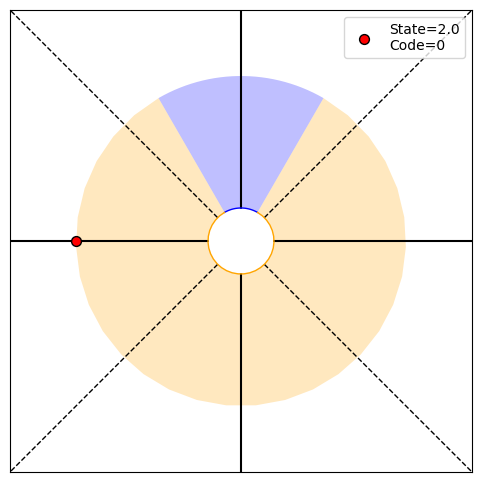

P(O1:17,S17|T)=[0.25 0.   0.25 0.25], P(O1:17|actions,T)=0.75, P(T|O1:17)=[0.97332704 0.02667296], H17=0.18
PRINT 1: 0.17742209328317998, [0.25 0.   0.25 0.25]
PRINT 2: [0.00536507 0.00536507], [0.97332704 0.02667296]
Choosing randomly
Current angle: 90.0, Code received: 1.0


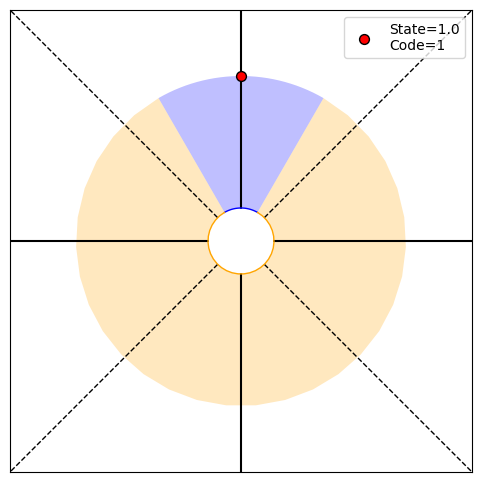

P(O1:18,S18|T)=[0.   0.25 0.   0.  ], P(O1:18|actions,T)=0.25, P(T|O1:18)=[0.94804001 0.05195999], H18=0.29
PRINT 1: 0.294665204446346, [0.   0.25 0.   0.  ]
PRINT 2: [0.01014077 0.01014077], [0.94804001 0.05195999]
Choosing randomly
Current angle: 180.0, Code received: 0.0


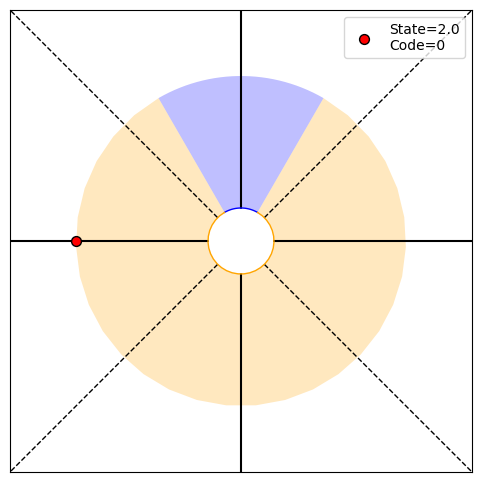

P(O1:19,S19|T)=[0.25 0.   0.25 0.25], P(O1:19|actions,T)=0.75, P(T|O1:19)=[0.96474947 0.03525053], H19=0.22
PRINT 1: 0.22007519863720576, [0.25 0.   0.25 0.25]
PRINT 2: [0.00701866 0.00701866], [0.96474947 0.03525053]
Choosing randomly
Current angle: 270.0, Code received: 0.0


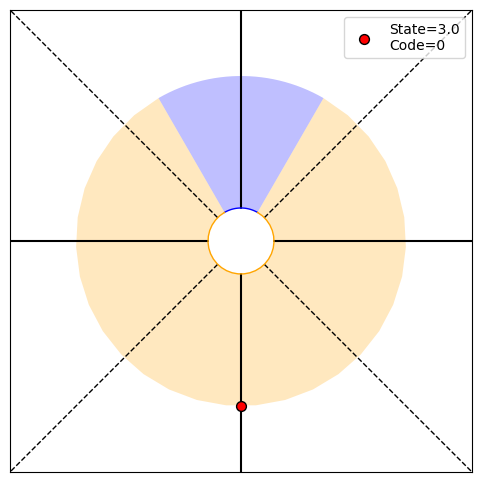

P(O1:20,S20|T)=[0.25 0.   0.25 0.25], P(O1:20|actions,T)=0.75, P(T|O1:20)=[0.97622023 0.02377977], H20=0.16
PRINT 1: 0.16216674258596345, [0.25 0.   0.25 0.25]
PRINT 2: [0.00479949 0.00479949], [0.97622023 0.02377977]
Choosing randomly
Current angle: 360.0, Code received: 0.0


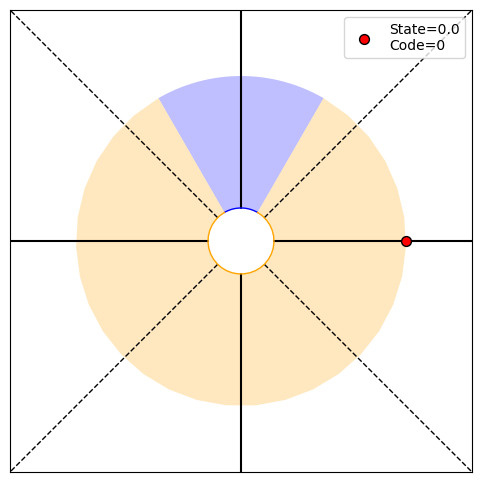

P(O1:21,S21|T)=[0.25 0.   0.25 0.25], P(O1:21|actions,T)=0.75, P(T|O1:21)=[0.98402015 0.01597985], H21=0.12
PRINT 1: 0.11823022358658546, [0.25 0.   0.25 0.25]
PRINT 2: [0.00325493 0.00325493], [0.98402015 0.01597985]
Choosing randomly
Current angle: 270.0, Code received: 0.0


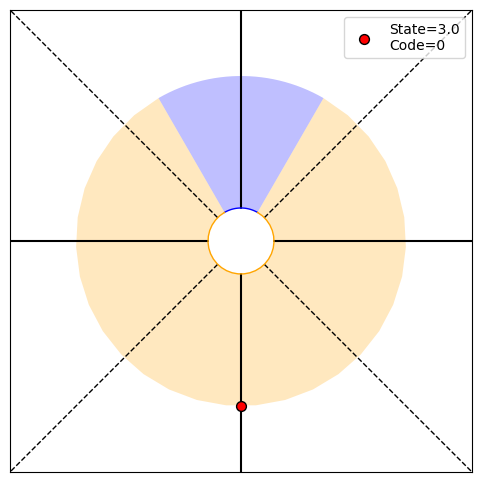

P(O1:22,S22|T)=[0.25 0.   0.25 0.25], P(O1:22|actions,T)=0.75, P(T|O1:22)=[0.98928972 0.01071028], H22=0.09
PRINT 1: 0.08546590665756237, [0.25 0.   0.25 0.25]
PRINT 2: [0.00219507 0.00219507], [0.98928972 0.01071028]
Choosing randomly
Current angle: 360.0, Code received: 0.0


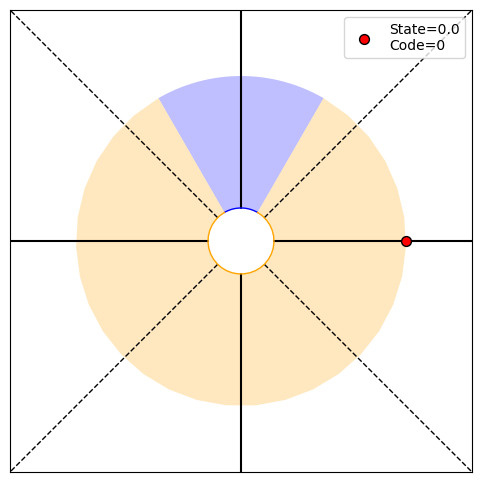

P(O1:23,S23|T)=[0.25 0.   0.25 0.25], P(O1:23|actions,T)=0.75, P(T|O1:23)=[0.99283423 0.00716577], H23=0.06
PRINT 1: 0.06135457802905351, [0.25 0.   0.25 0.25]
PRINT 2: [0.0014747 0.0014747], [0.99283423 0.00716577]
Choosing randomly
Current angle: 450.0, Code received: 1.0


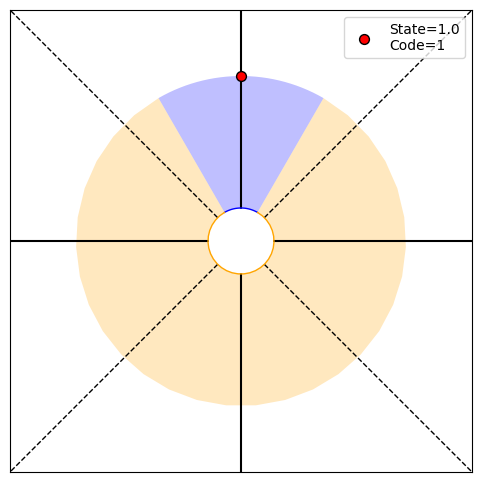

P(O1:24,S24|T)=[0.   0.25 0.   0.  ], P(O1:24|actions,T)=0.25, P(T|O1:24)=[0.98577043 0.01422957], H24=0.11
PRINT 1: 0.10768008794573203, [0.   0.25 0.   0.  ]
PRINT 2: [0.00290437 0.00290437], [0.98577043 0.01422957]
Choosing randomly
Current angle: 540.0, Code received: 0.0


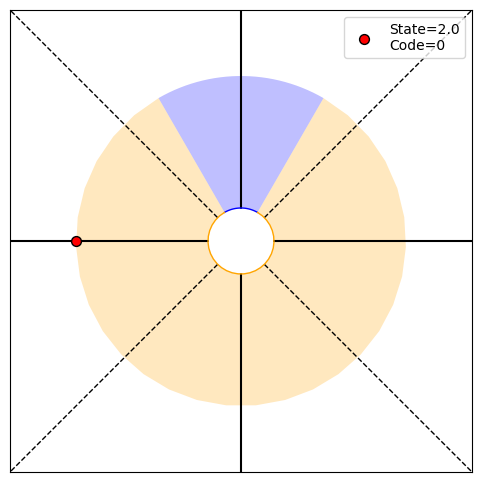

P(O1:25,S25|T)=[0.25 0.   0.25 0.25], P(O1:25|actions,T)=0.75, P(T|O1:25)=[0.99046841 0.00953159], H25=0.08
PRINT 1: 0.07767164973422992, [0.25 0.   0.25 0.25]
PRINT 2: [0.00195618 0.00195618], [0.99046841 0.00953159]
Choosing randomly
Current angle: 630.0, Code received: 0.0


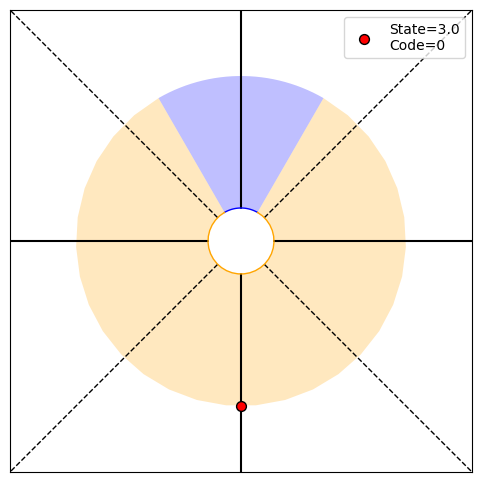

P(O1:26,S26|T)=[0.25 0.   0.25 0.25], P(O1:26|actions,T)=0.75, P(T|O1:26)=[0.99362535 0.00637465], H26=0.06
PRINT 1: 0.0556604009075222, [0.25 0.   0.25 0.25]
PRINT 2: [0.0013131 0.0013131], [0.99362535 0.00637465]
Choosing randomly
Current angle: 540.0, Code received: 0.0


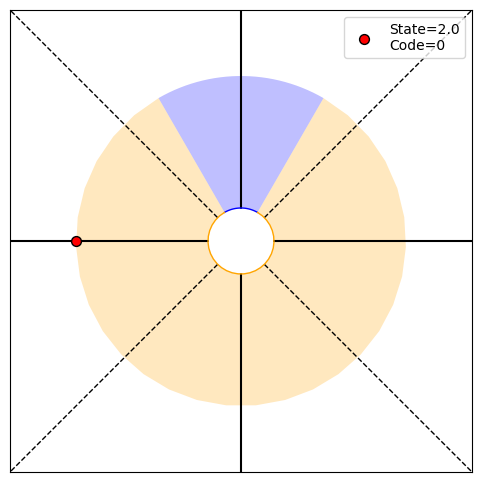

P(O1:27,S27|T)=[0.25 0.   0.25 0.25], P(O1:27|actions,T)=0.75, P(T|O1:27)=[0.99574119 0.00425881], H27=0.04
PRINT 1: 0.03967065026429185, [0.25 0.   0.25 0.25]
PRINT 2: [0.00087943 0.00087943], [0.99574119 0.00425881]
Choosing randomly
Current angle: 450.0, Code received: 1.0


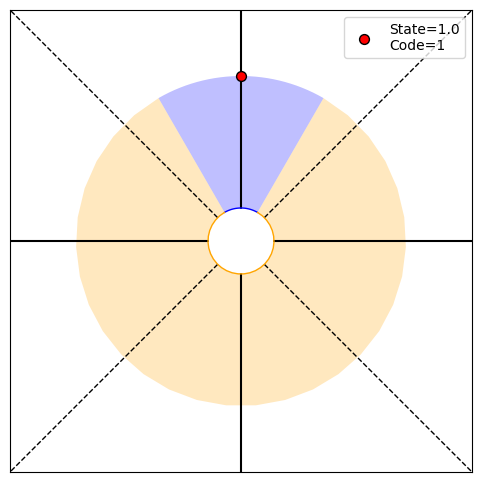

P(O1:28,S28|T)=[0.   0.25 0.   0.  ], P(O1:28|actions,T)=0.25, P(T|O1:28)=[0.99151849 0.00848151], H28=0.07
PRINT 1: 0.07054938124621629, [0.   0.25 0.   0.  ]
PRINT 2: [0.00174281 0.00174281], [0.99151849 0.00848151]
Choosing randomly
Current angle: 360.0, Code received: 0.0


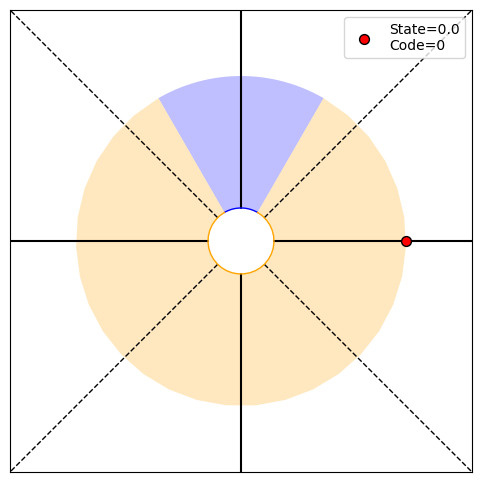

P(O1:29,S29|T)=[0.25 0.   0.25 0.25], P(O1:29|actions,T)=0.75, P(T|O1:29)=[0.99432963 0.00567037], H29=0.05
PRINT 1: 0.050471613882785024, [0.25 0.   0.25 0.25]
PRINT 2: [0.00116899 0.00116899], [0.99432963 0.00567037]
Choosing randomly
Current angle: 270.0, Code received: 0.0


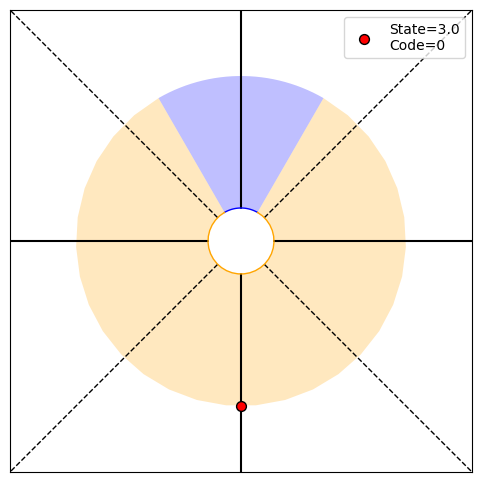

P(O1:30,S30|T)=[0.25 0.   0.25 0.25], P(O1:30|actions,T)=0.75, P(T|O1:30)=[0.99621259 0.00378741], H30=0.04
PRINT 1: 0.035921774556502556, [0.25 0.   0.25 0.25]
PRINT 2: [0.00078251 0.00078251], [0.99621259 0.00378741]
Choosing randomly
Current angle: 180.0, Code received: 0.0


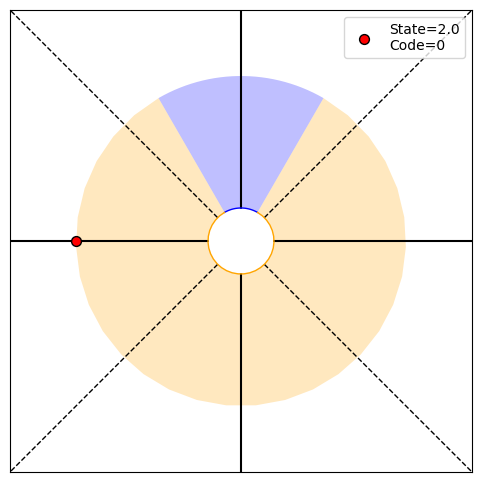

P(O1:31,S31|T)=[0.25 0.   0.25 0.25], P(O1:31|actions,T)=0.75, P(T|O1:31)=[0.99747187 0.00252813], H31=0.03
PRINT 1: 0.02545467553544494, [0.25 0.   0.25 0.25]
PRINT 2: [0.0005231 0.0005231], [0.99747187 0.00252813]
Choosing randomly
Current angle: 270.0, Code received: 0.0


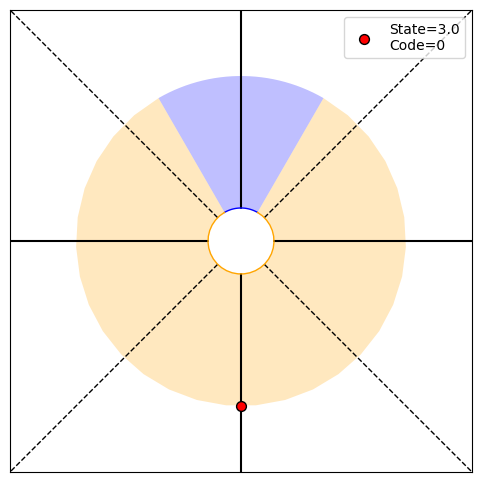

P(O1:32,S32|T)=[0.25 0.   0.25 0.25], P(O1:32|actions,T)=0.75, P(T|O1:32)=[0.99831316 0.00168684], H32=0.02
PRINT 1: 0.017969808259611832, [0.25 0.   0.25 0.25]
PRINT 2: [0.00034937 0.00034937], [0.99831316 0.00168684]
Choosing randomly
Current angle: 180.0, Code received: 0.0


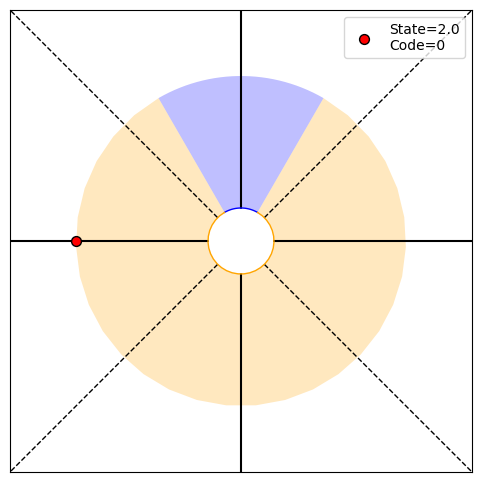

P(O1:33,S33|T)=[0.25 0.   0.25 0.25], P(O1:33|actions,T)=0.75, P(T|O1:33)=[0.99887481 0.00112519], H33=0.01
PRINT 1: 0.0126443510250423, [0.25 0.   0.25 0.25]
PRINT 2: [0.00023319 0.00023319], [0.99887481 0.00112519]
Choosing randomly
Current angle: 90.0, Code received: 1.0


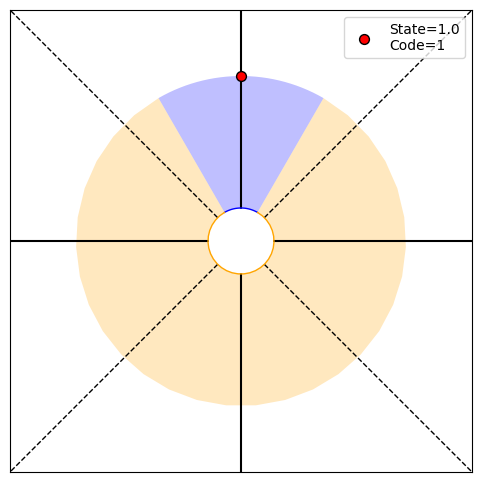

P(O1:34,S34|T)=[0.   0.25 0.   0.  ], P(O1:34|actions,T)=0.25, P(T|O1:34)=[0.99775214 0.00224786], H34=0.02
PRINT 1: 0.02301424702651783, [0.   0.25 0.   0.  ]
PRINT 2: [0.00046526 0.00046526], [0.99775214 0.00224786]
Choosing randomly
Current angle: 180.0, Code received: 0.0


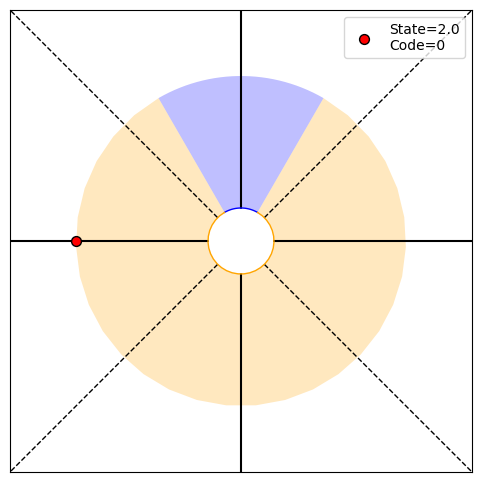

P(O1:35,S35|T)=[0.25 0.   0.25 0.25], P(O1:35|actions,T)=0.75, P(T|O1:35)=[0.99850031 0.00149969], H35=0.02
PRINT 1: 0.016230790031131283, [0.25 0.   0.25 0.25]
PRINT 2: [0.00031067 0.00031067], [0.99850031 0.00149969]
Choosing randomly
Current angle: 90.0, Code received: 1.0


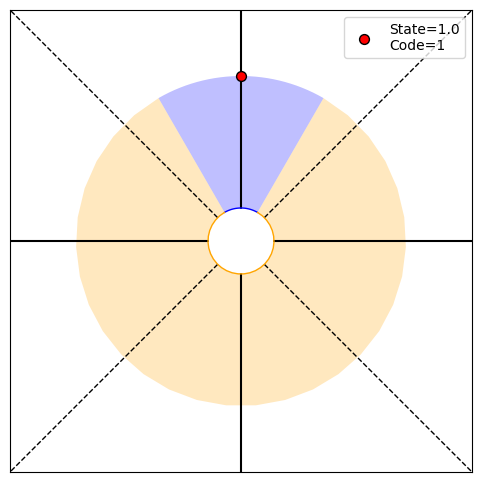

P(O1:36,S36|T)=[0.   0.25 0.   0.  ], P(O1:36|actions,T)=0.25, P(T|O1:36)=[0.9970051 0.0029949], H36=0.03
PRINT 1: 0.029421311991498583, [0.   0.25 0.   0.  ]
PRINT 2: [0.00061934 0.00061934], [0.9970051 0.0029949]
Choosing randomly
Current angle: 180.0, Code received: 0.0


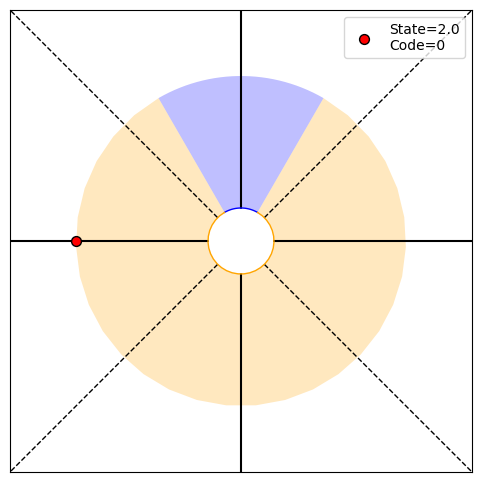

P(O1:37,S37|T)=[0.25 0.   0.25 0.25], P(O1:37|actions,T)=0.75, P(T|O1:37)=[0.99800141 0.00199859], H37=0.02
PRINT 1: 0.020801469882121285, [0.25 0.   0.25 0.25]
PRINT 2: [0.00041379 0.00041379], [0.99800141 0.00199859]
Choosing randomly
Current angle: 270.0, Code received: 0.0


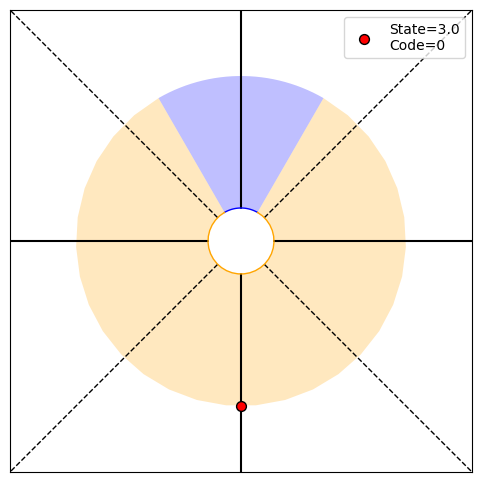

P(O1:38,S38|T)=[0.25 0.   0.25 0.25], P(O1:38|actions,T)=0.75, P(T|O1:38)=[0.99866672 0.00133328], H38=0.01
PRINT 1: 0.014656171378362063, [0.25 0.   0.25 0.25]
PRINT 2: [0.00027625 0.00027625], [0.99866672 0.00133328]
Choosing randomly
Current angle: 360.0, Code received: 0.0


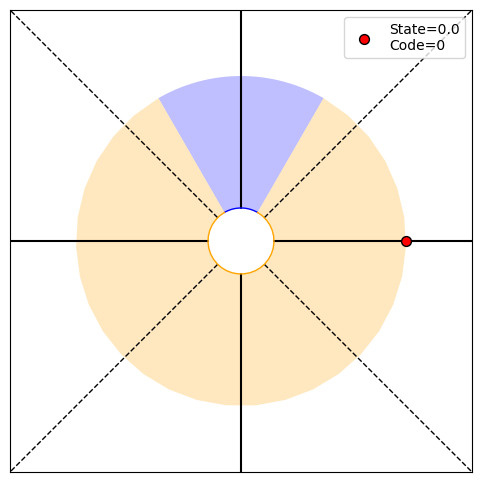

P(O1:39,S39|T)=[0.25 0.   0.25 0.25], P(O1:39|actions,T)=0.75, P(T|O1:39)=[9.99110749e-01 8.89251417e-04], H39=0.01
PRINT 1: 0.010295018740227478, [0.25 0.   0.25 0.25]
PRINT 2: [0.00018435 0.00018435], [9.99110749e-01 8.89251417e-04]
Choosing randomly
Current angle: 450.0, Code received: 1.0


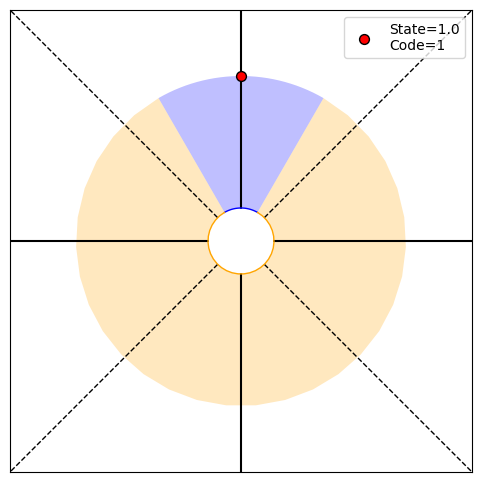

P(O1:40,S40|T)=[0.   0.25 0.   0.  ], P(O1:40|actions,T)=0.25, P(T|O1:40)=[0.99822308 0.00177692], H40=0.02
PRINT 1: 0.018795961149158703, [0.   0.25 0.   0.  ]
PRINT 2: [0.00036799 0.00036799], [0.99822308 0.00177692]
Choosing randomly
Current angle: 360.0, Code received: 0.0


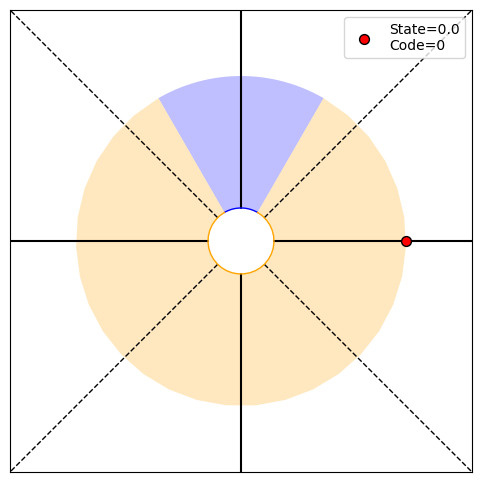

P(O1:41,S41|T)=[0.25 0.   0.25 0.25], P(O1:41|actions,T)=0.75, P(T|O1:41)=[0.99881468 0.00118532], H41=0.01
PRINT 1: 0.013230926437444003, [0.25 0.   0.25 0.25]
PRINT 2: [0.00024564 0.00024564], [0.99881468 0.00118532]
Choosing randomly
Current angle: 270.0, Code received: 0.0


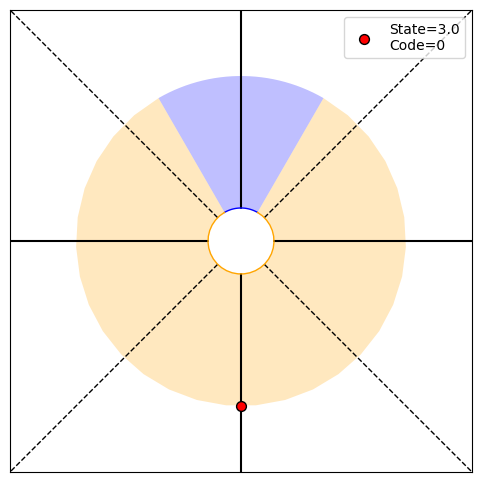

P(O1:42,S42|T)=[0.25 0.   0.25 0.25], P(O1:42|actions,T)=0.75, P(T|O1:42)=[9.99209476e-01 7.90523812e-04], H42=0.01
PRINT 1: 0.009286305440277656, [0.25 0.   0.25 0.25]
PRINT 2: [0.0001639 0.0001639], [9.99209476e-01 7.90523812e-04]
Choosing randomly
Current angle: 180.0, Code received: 0.0


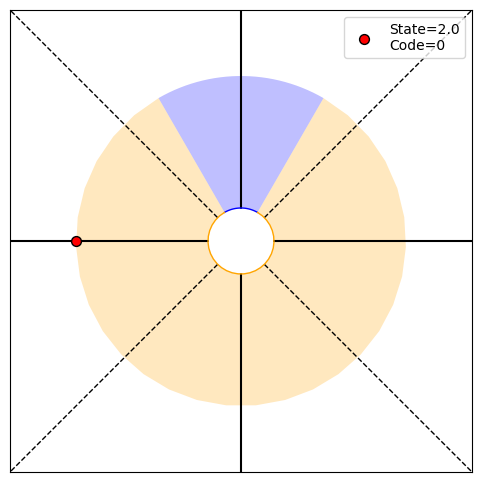

P(O1:43,S43|T)=[0.25 0.   0.25 0.25], P(O1:43|actions,T)=0.75, P(T|O1:43)=[9.99472845e-01 5.27154784e-04], H43=0.01
PRINT 1: 0.006500767610566481, [0.25 0.   0.25 0.25]
PRINT 2: [0.00010933 0.00010933], [9.99472845e-01 5.27154784e-04]
Choosing randomly
Current angle: 90.0, Code received: 1.0


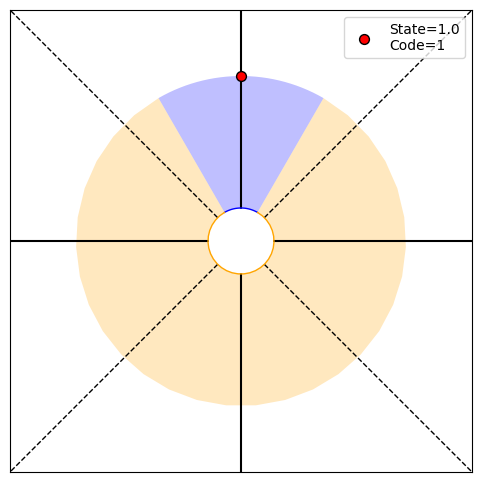

P(O1:44,S44|T)=[0.   0.25 0.   0.  ], P(O1:44|actions,T)=0.25, P(T|O1:44)=[0.99894625 0.00105375], H44=0.01
PRINT 1: 0.011941331636332, [0.   0.25 0.   0.  ]
PRINT 2: [0.00021841 0.00021841], [0.99894625 0.00105375]
Choosing randomly
Current angle: 0.0, Code received: 0.0


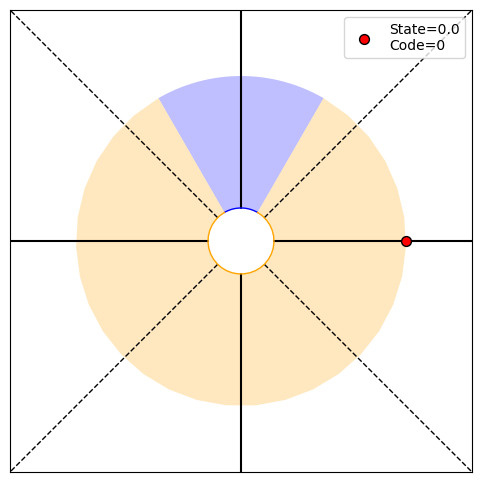

P(O1:45,S45|T)=[0.25 0.   0.25 0.25], P(O1:45|actions,T)=0.75, P(T|O1:45)=[9.9929725e-01 7.0274956e-04], H45=0.01
PRINT 1: 0.00837458901041598, [0.25 0.   0.25 0.25]
PRINT 2: [0.00014571 0.00014571], [9.9929725e-01 7.0274956e-04]
Choosing randomly
Current angle: -90.0, Code received: 0.0


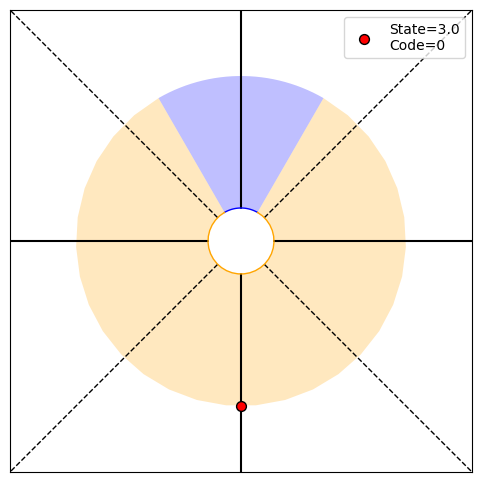

P(O1:46,S46|T)=[0.25 0.   0.25 0.25], P(O1:46|actions,T)=0.75, P(T|O1:46)=[9.99531391e-01 4.68609478e-04], H46=0.01
PRINT 1: 0.00585840724144406, [0.25 0.   0.25 0.25]
PRINT 2: [9.71924571e-05 9.71924571e-05], [9.99531391e-01 4.68609478e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


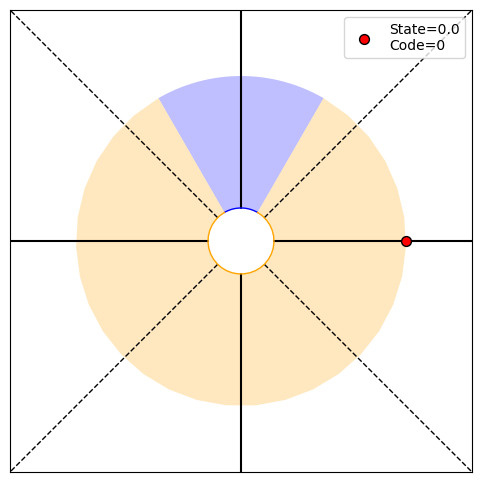

P(O1:47,S47|T)=[0.25 0.   0.25 0.25], P(O1:47|actions,T)=0.75, P(T|O1:47)=[9.99687545e-01 3.12455125e-04], H47=0.00
PRINT 1: 0.004088954308405901, [0.25 0.   0.25 0.25]
PRINT 2: [6.48168239e-05 6.48168239e-05], [9.99687545e-01 3.12455125e-04]
Choosing randomly
Current angle: 90.0, Code received: 1.0


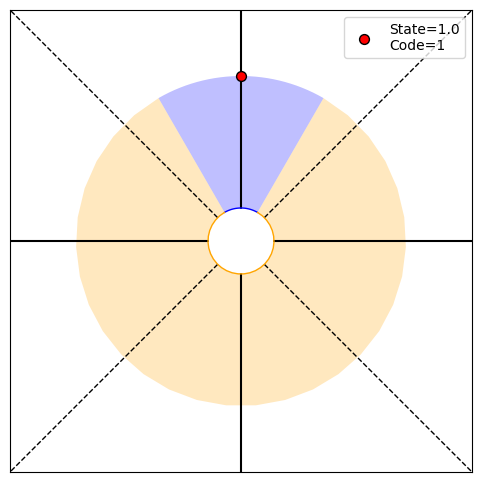

P(O1:48,S48|T)=[0.   0.25 0.   0.  ], P(O1:48|actions,T)=0.25, P(T|O1:48)=[9.99375285e-01 6.24715055e-04], H48=0.01
PRINT 1: 0.007550779934184766, [0.   0.25 0.   0.  ]
PRINT 2: [0.00012955 0.00012955], [9.99375285e-01 6.24715055e-04]
Choosing randomly
Current angle: 180.0, Code received: 0.0


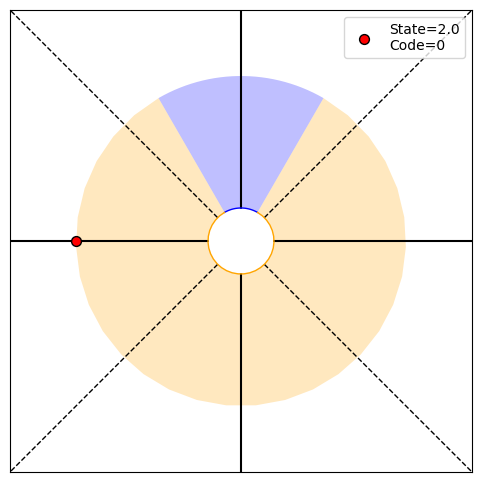

P(O1:49,S49|T)=[0.25 0.   0.25 0.25], P(O1:49|actions,T)=0.75, P(T|O1:49)=[9.99583437e-01 4.16563448e-04], H49=0.01
PRINT 1: 0.0052785131549619585, [0.25 0.   0.25 0.25]
PRINT 2: [8.64030057e-05 8.64030057e-05], [9.99583437e-01 4.16563448e-04]
Choosing randomly
Current angle: 90.0, Code received: 1.0


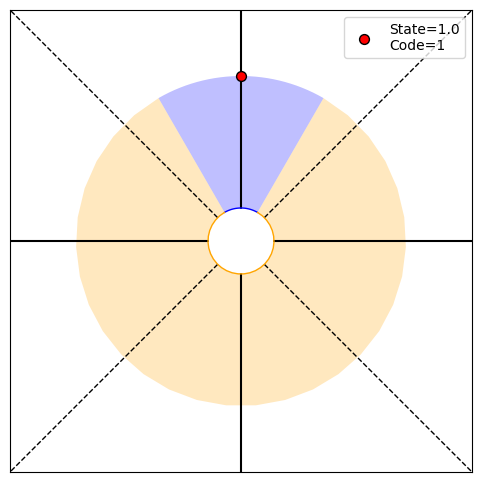

P(O1:50,S50|T)=[0.   0.25 0.   0.  ], P(O1:50|actions,T)=0.25, P(T|O1:50)=[9.9916722e-01 8.3277999e-04], H50=0.01
PRINT 1: 0.009720100719372042, [0.   0.25 0.   0.  ]
PRINT 2: [0.00017265 0.00017265], [9.9916722e-01 8.3277999e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


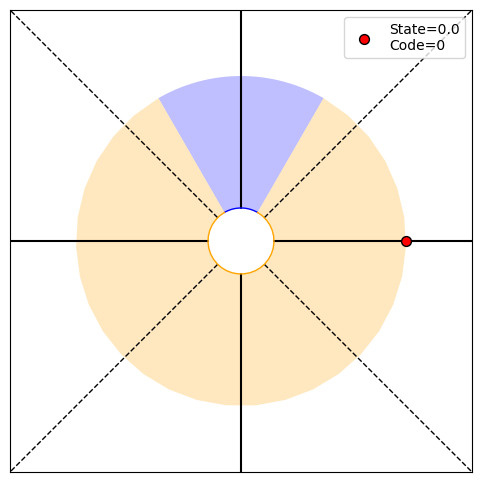

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.04730118 0.04730118], [0.6 0.4]
Choosing randomly
Current angle: -90.0, Code received: 0.0


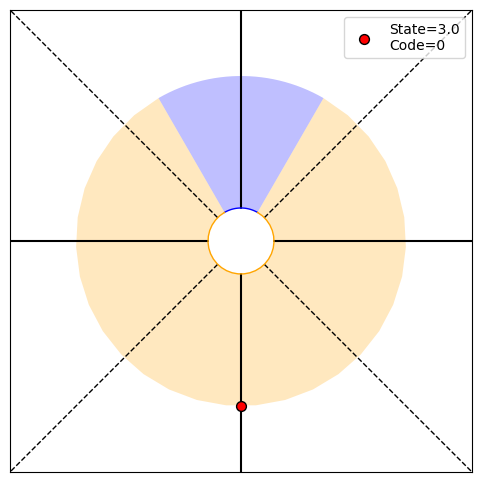

P(O1:2,S2|T)=[0.25 0.   0.25 0.25], P(O1:2|actions,T)=0.75, P(T|O1:2)=[0.69230769 0.30769231], H2=0.89
PRINT 1: 0.8904916402194913, [0.25 0.   0.25 0.25]
PRINT 2: [0.04240536 0.04240536], [0.69230769 0.30769231]
Choosing randomly
Current angle: 0.0, Code received: 0.0


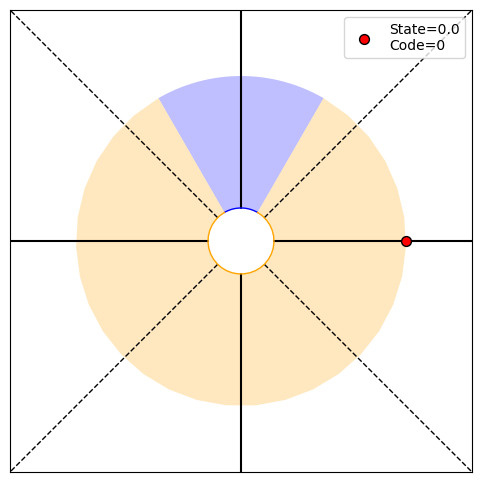

P(O1:3,S3|T)=[0.25 0.   0.25 0.25], P(O1:3|actions,T)=0.75, P(T|O1:3)=[0.77142857 0.22857143], H3=0.78
PRINT 1: 0.775512658133148, [0.25 0.   0.25 0.25]
PRINT 2: [0.03543325 0.03543325], [0.77142857 0.22857143]
Choosing randomly
Current angle: -90.0, Code received: 0.0


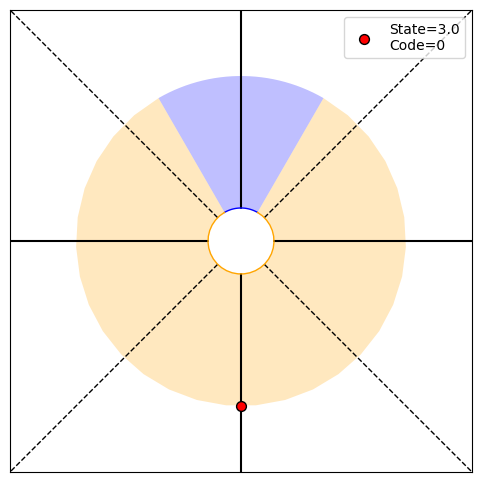

P(O1:4,S4|T)=[0.25 0.   0.25 0.25], P(O1:4|actions,T)=0.75, P(T|O1:4)=[0.83505155 0.16494845], H4=0.65
PRINT 1: 0.6460174789535753, [0.25 0.   0.25 0.25]
PRINT 2: [0.02790644 0.02790644], [0.83505155 0.16494845]
Choosing randomly
Current angle: 0.0, Code received: 0.0


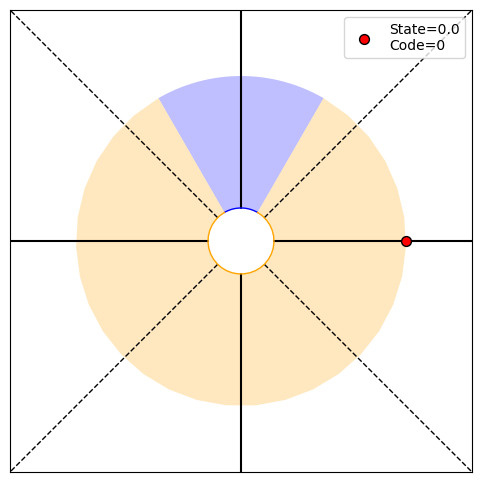

P(O1:5,S5|T)=[0.25 0.   0.25 0.25], P(O1:5|actions,T)=0.75, P(T|O1:5)=[0.88363636 0.11636364], H5=0.52
PRINT 1: 0.5188171234076412, [0.25 0.   0.25 0.25]
PRINT 2: [0.02097066 0.02097066], [0.88363636 0.11636364]
Choosing randomly
Current angle: -90.0, Code received: 0.0


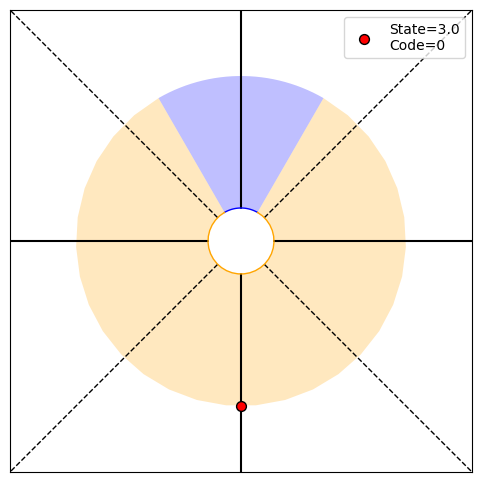

P(O1:6,S6|T)=[0.25 0.   0.25 0.25], P(O1:6|actions,T)=0.75, P(T|O1:6)=[0.91929382 0.08070618], H6=0.40
PRINT 1: 0.40466258136055216, [0.25 0.   0.25 0.25]
PRINT 2: [0.01520871 0.01520871], [0.91929382 0.08070618]
Choosing randomly
Current angle: 0.0, Code received: 0.0


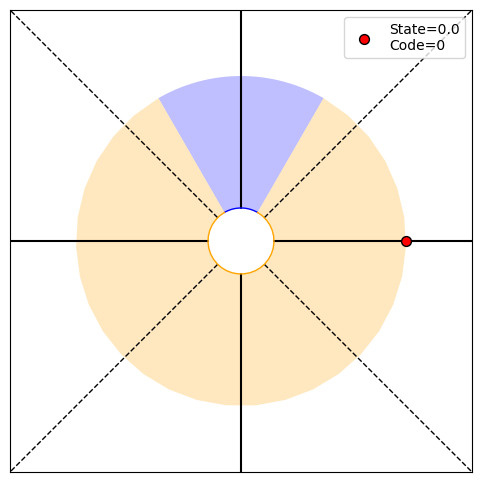

P(O1:7,S7|T)=[0.25 0.   0.25 0.25], P(O1:7|actions,T)=0.75, P(T|O1:7)=[0.94470842 0.05529158], H7=0.31
PRINT 1: 0.3084634658192273, [0.25 0.   0.25 0.25]
PRINT 2: [0.0107477 0.0107477], [0.94470842 0.05529158]
Choosing randomly
Current angle: -90.0, Code received: 0.0


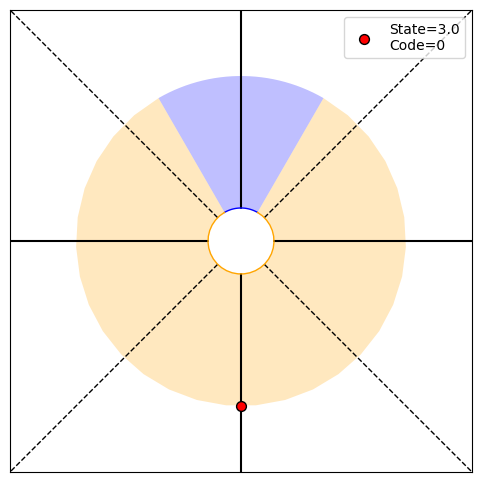

P(O1:8,S8|T)=[0.25 0.   0.25 0.25], P(O1:8|actions,T)=0.75, P(T|O1:8)=[0.96244682 0.03755318], H8=0.23
PRINT 1: 0.23095885933617583, [0.25 0.   0.25 0.25]
PRINT 2: [0.00745667 0.00745667], [0.96244682 0.03755318]
Choosing randomly
Current angle: -180.0, Code received: 0.0


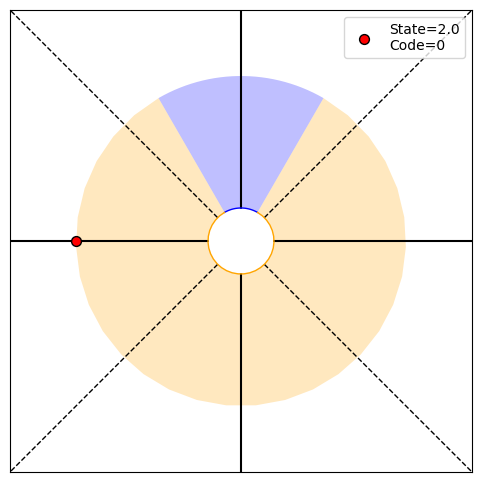

P(O1:9,S9|T)=[0.25 0.   0.25 0.25], P(O1:9|actions,T)=0.75, P(T|O1:9)=[0.97464719 0.02535281], H9=0.17
PRINT 1: 0.17052200787563565, [0.25 0.   0.25 0.25]
PRINT 2: [0.00510749 0.00510749], [0.97464719 0.02535281]
Choosing randomly
Current angle: -90.0, Code received: 0.0


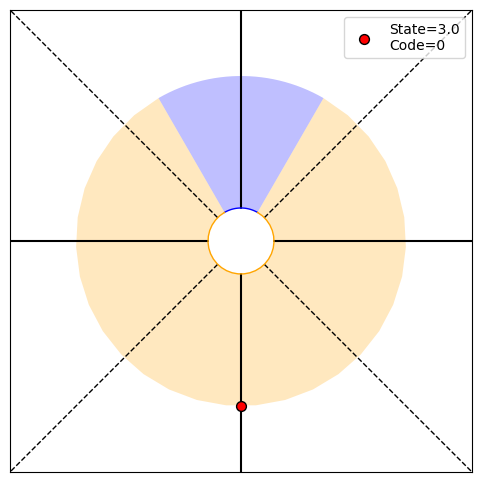

P(O1:10,S10|T)=[0.25 0.   0.25 0.25], P(O1:10|actions,T)=0.75, P(T|O1:10)=[0.98295407 0.01704593], H10=0.12
PRINT 1: 0.12451636860753656, [0.25 0.   0.25 0.25]
PRINT 2: [0.00346775 0.00346775], [0.98295407 0.01704593]
Choosing randomly
Current angle: 0.0, Code received: 0.0


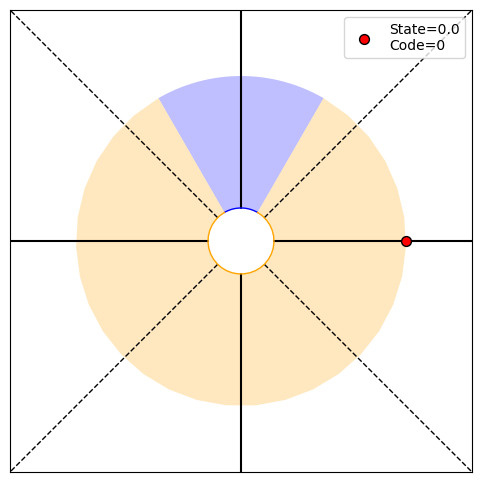

P(O1:11,S11|T)=[0.25 0.   0.25 0.25], P(O1:11|actions,T)=0.75, P(T|O1:11)=[0.98857111 0.01142889], H11=0.09
PRINT 1: 0.09012354442070314, [0.25 0.   0.25 0.25]
PRINT 2: [0.00234038 0.00234038], [0.98857111 0.01142889]
Choosing randomly
Current angle: 90.0, Code received: 1.0


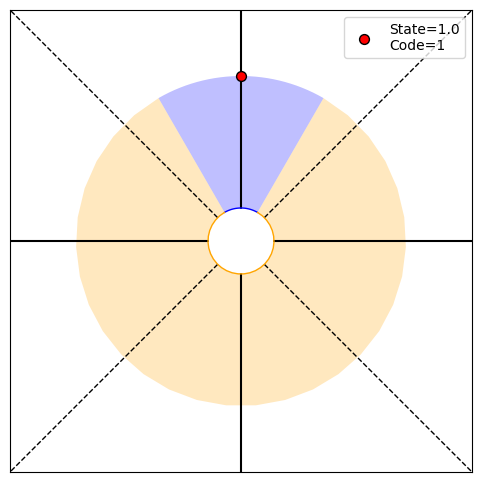

P(O1:12,S12|T)=[0.   0.25 0.   0.  ], P(O1:12|actions,T)=0.25, P(T|O1:12)=[0.97740051 0.02259949], H12=0.16
PRINT 1: 0.15579716772636354, [0.   0.25 0.   0.  ]
PRINT 2: [0.00456762 0.00456762], [0.97740051 0.02259949]
Choosing randomly
Current angle: 180.0, Code received: 0.0


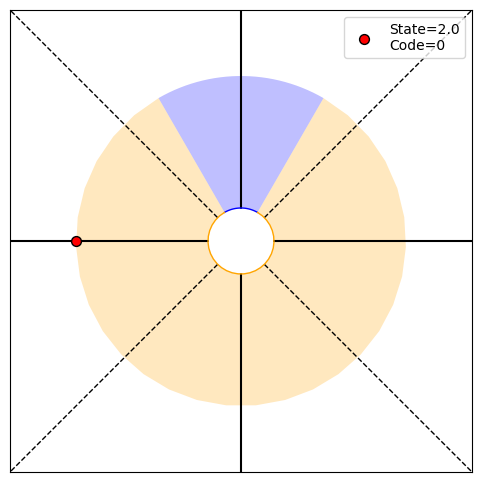

P(O1:13,S13|T)=[0.25 0.   0.25 0.25], P(O1:13|actions,T)=0.75, P(T|O1:13)=[0.98481931 0.01518069], H13=0.11
PRINT 1: 0.11344994969093523, [0.25 0.   0.25 0.25]
PRINT 2: [0.00309505 0.00309505], [0.98481931 0.01518069]
Choosing randomly
Current angle: 90.0, Code received: 1.0


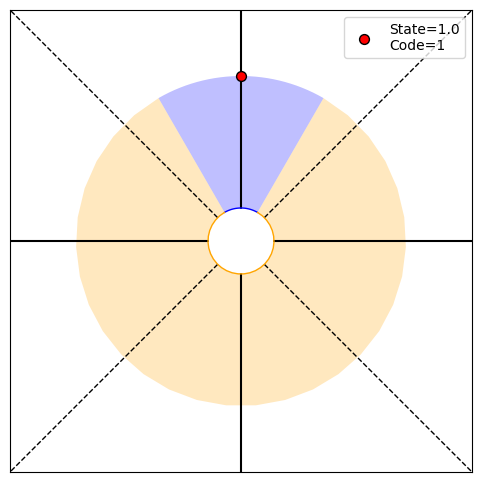

P(O1:14,S14|T)=[0.   0.25 0.   0.  ], P(O1:14|actions,T)=0.25, P(T|O1:14)=[0.97009264 0.02990736], H14=0.19
PRINT 1: 0.19392706453430145, [0.   0.25 0.   0.  ]
PRINT 2: [0.00599267 0.00599267], [0.97009264 0.02990736]
Choosing randomly
Current angle: 0.0, Code received: 0.0


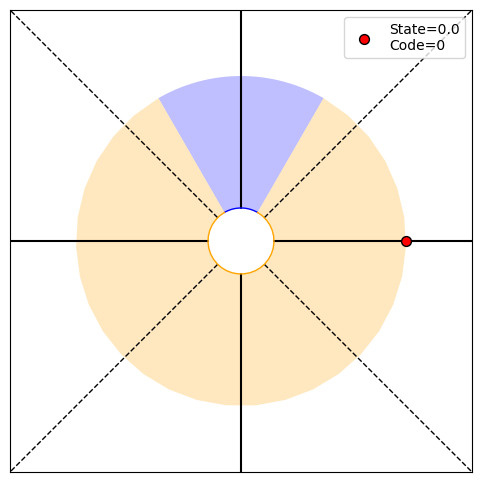

P(O1:15,S15|T)=[0.25 0.   0.25 0.25], P(O1:15|actions,T)=0.75, P(T|O1:15)=[0.97986099 0.02013901], H15=0.14
PRINT 1: 0.14222032717092223, [0.25 0.   0.25 0.25]
PRINT 2: [0.00408213 0.00408213], [0.97986099 0.02013901]
Choosing randomly
Current angle: -90.0, Code received: 0.0


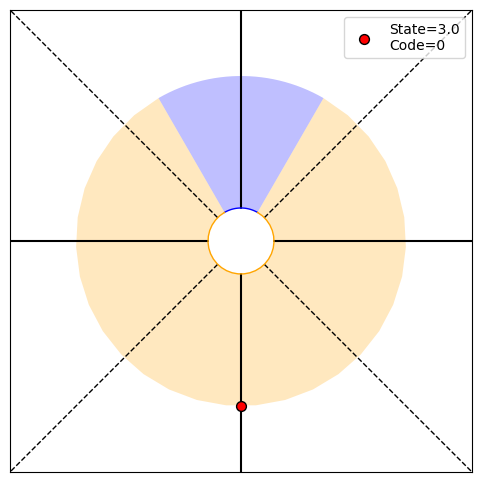

P(O1:16,S16|T)=[0.25 0.   0.25 0.25], P(O1:16|actions,T)=0.75, P(T|O1:16)=[0.98648326 0.01351674], H16=0.10
PRINT 1: 0.1032950790438582, [0.25 0.   0.25 0.25]
PRINT 2: [0.00276118 0.00276118], [0.98648326 0.01351674]
Choosing randomly
Current angle: -180.0, Code received: 0.0


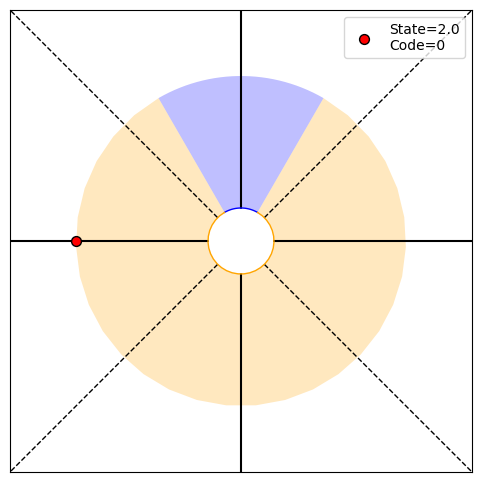

P(O1:17,S17|T)=[0.25 0.   0.25 0.25], P(O1:17|actions,T)=0.75, P(T|O1:17)=[0.99094805 0.00905195], H17=0.07
PRINT 1: 0.0744405116550106, [0.25 0.   0.25 0.25]
PRINT 2: [0.00185879 0.00185879], [0.99094805 0.00905195]
Choosing randomly
Current angle: -90.0, Code received: 0.0


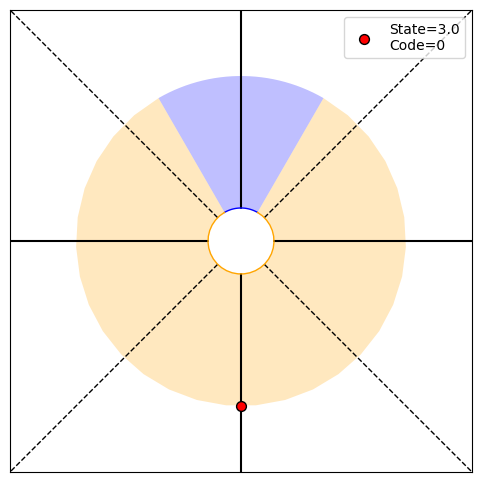

P(O1:18,S18|T)=[0.25 0.   0.25 0.25], P(O1:18|actions,T)=0.75, P(T|O1:18)=[0.99394711 0.00605289], H18=0.05
PRINT 1: 0.053304690135926744, [0.25 0.   0.25 0.25]
PRINT 2: [0.00124729 0.00124729], [0.99394711 0.00605289]
Choosing randomly
Current angle: -180.0, Code received: 0.0


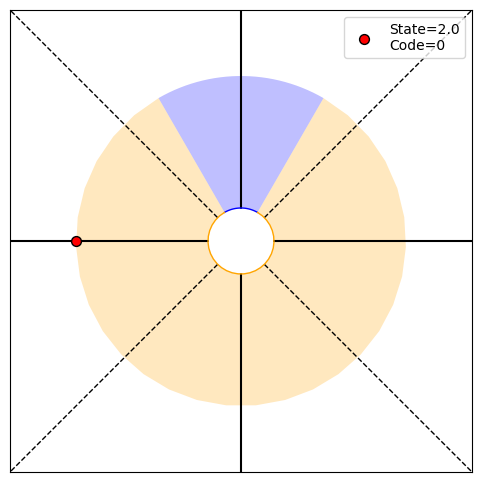

P(O1:19,S19|T)=[0.25 0.   0.25 0.25], P(O1:19|actions,T)=0.75, P(T|O1:19)=[0.99595658 0.00404342], H19=0.04
PRINT 1: 0.03796765361808056, [0.25 0.   0.25 0.25]
PRINT 2: [0.00083516 0.00083516], [0.99595658 0.00404342]
Choosing randomly
Current angle: -270.0, Code received: 1.0


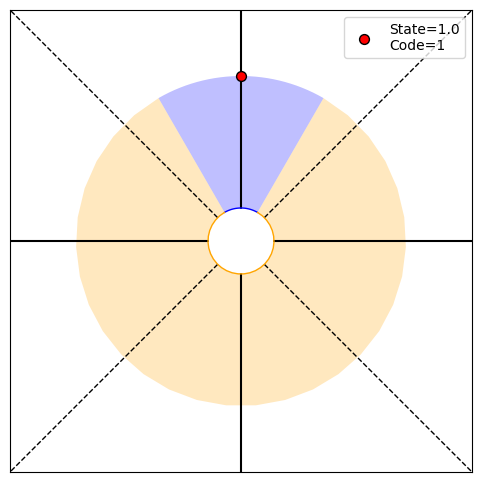

P(O1:20,S20|T)=[0.   0.25 0.   0.  ], P(O1:20|actions,T)=0.25, P(T|O1:20)=[0.99194572 0.00805428], H20=0.07
PRINT 1: 0.06759872162781187, [0.   0.25 0.   0.  ]
PRINT 2: [0.00165584 0.00165584], [0.99194572 0.00805428]
Choosing randomly
Current angle: -360.0, Code received: 0.0


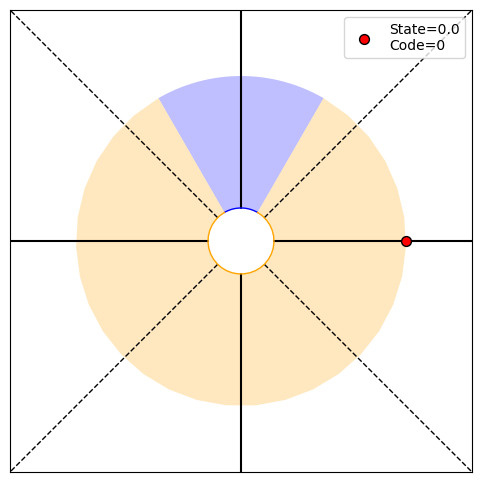

P(O1:21,S21|T)=[0.25 0.   0.25 0.25], P(O1:21|actions,T)=0.75, P(T|O1:21)=[0.99461603 0.00538397], H21=0.05
PRINT 1: 0.04832608824690479, [0.25 0.   0.25 0.25]
PRINT 2: [0.00111031 0.00111031], [0.99461603 0.00538397]
Choosing randomly
Current angle: -450.0, Code received: 0.0


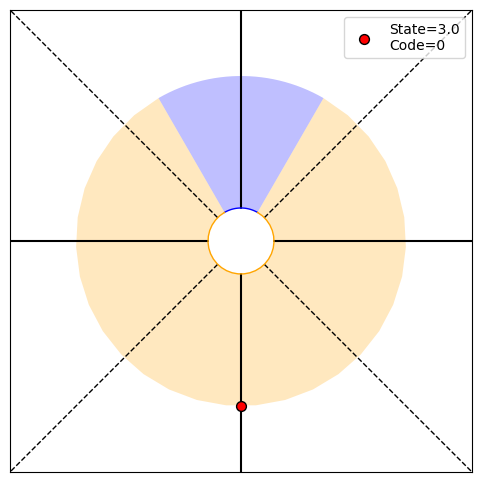

P(O1:22,S22|T)=[0.25 0.   0.25 0.25], P(O1:22|actions,T)=0.75, P(T|O1:22)=[0.99640423 0.00359577], H22=0.03
PRINT 1: 0.034374038417237504, [0.25 0.   0.25 0.25]
PRINT 2: [0.00074308 0.00074308], [0.99640423 0.00359577]
Choosing randomly
Current angle: -540.0, Code received: 0.0


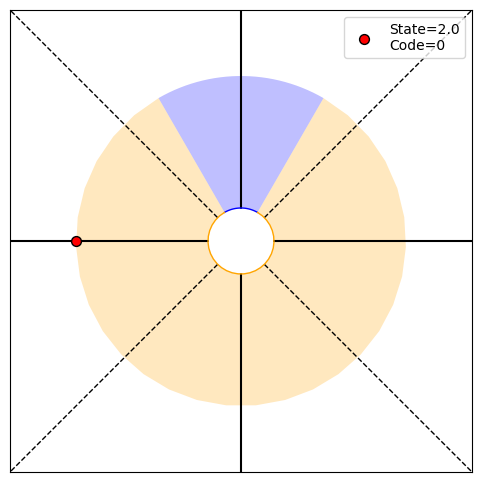

P(O1:23,S23|T)=[0.25 0.   0.25 0.25], P(O1:23|actions,T)=0.75, P(T|O1:23)=[0.99759994 0.00240006], H23=0.02
PRINT 1: 0.024345389330998928, [0.25 0.   0.25 0.25]
PRINT 2: [0.00049667 0.00049667], [0.99759994 0.00240006]
Choosing randomly
Current angle: -630.0, Code received: 1.0


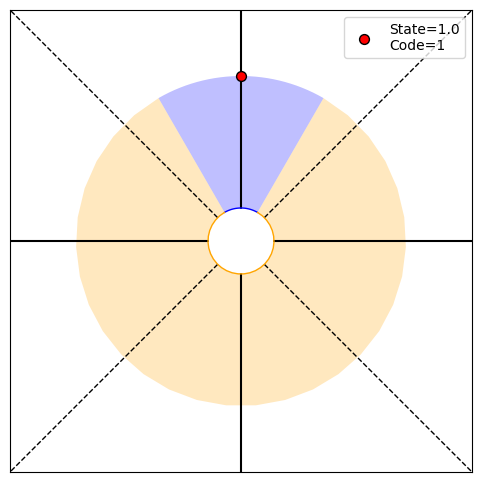

P(O1:24,S24|T)=[0.   0.25 0.   0.  ], P(O1:24|actions,T)=0.25, P(T|O1:24)=[0.99521138 0.00478862], H24=0.04
PRINT 1: 0.0437938709583671, [0.   0.25 0.   0.  ]
PRINT 2: [0.00098822 0.00098822], [0.99521138 0.00478862]
Choosing randomly
Current angle: -720.0, Code received: 0.0


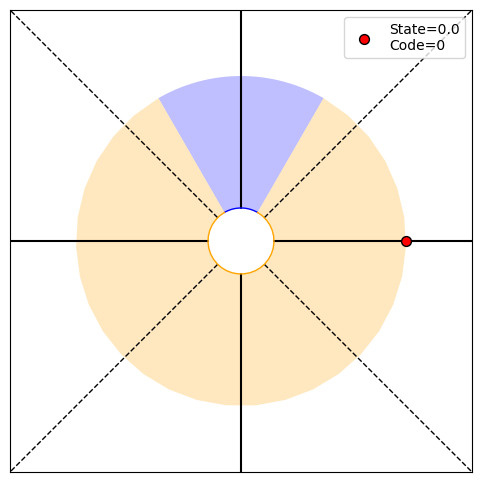

P(O1:25,S25|T)=[0.25 0.   0.25 0.25], P(O1:25|actions,T)=0.75, P(T|O1:25)=[0.99680248 0.00319752], H25=0.03
PRINT 1: 0.03110932827439954, [0.25 0.   0.25 0.25]
PRINT 2: [0.00066109 0.00066109], [0.99680248 0.00319752]
Choosing randomly
Current angle: -630.0, Code received: 1.0


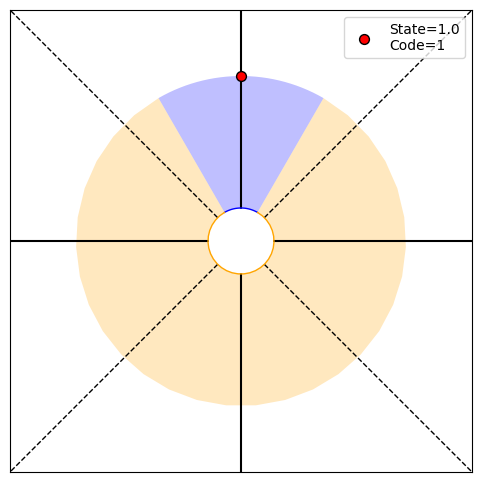

P(O1:26,S26|T)=[0.   0.25 0.   0.  ], P(O1:26|actions,T)=0.25, P(T|O1:26)=[0.99362535 0.00637465], H26=0.06
PRINT 1: 0.05566040090752221, [0.   0.25 0.   0.  ]
PRINT 2: [0.0013131 0.0013131], [0.99362535 0.00637465]
Choosing randomly
Current angle: -540.0, Code received: 0.0


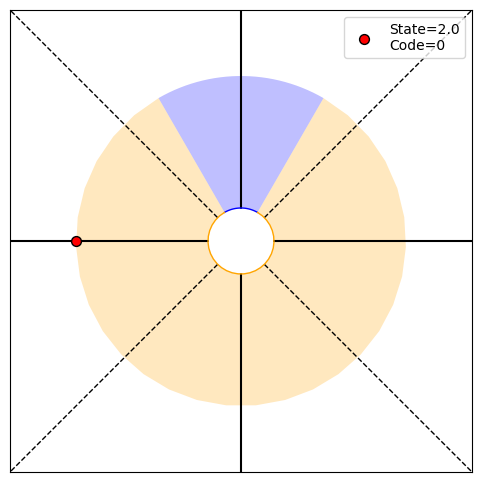

P(O1:27,S27|T)=[0.25 0.   0.25 0.25], P(O1:27|actions,T)=0.75, P(T|O1:27)=[0.99574119 0.00425881], H27=0.04
PRINT 1: 0.03967065026429185, [0.25 0.   0.25 0.25]
PRINT 2: [0.00087943 0.00087943], [0.99574119 0.00425881]
Choosing randomly
Current angle: -450.0, Code received: 0.0


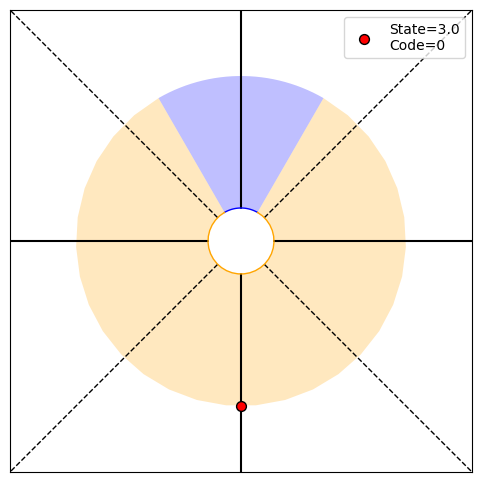

P(O1:28,S28|T)=[0.25 0.   0.25 0.25], P(O1:28|actions,T)=0.75, P(T|O1:28)=[0.99715675 0.00284325], H28=0.03
PRINT 1: 0.02814497325544187, [0.25 0.   0.25 0.25]
PRINT 2: [0.00058808 0.00058808], [0.99715675 0.00284325]
Choosing randomly
Current angle: -360.0, Code received: 0.0


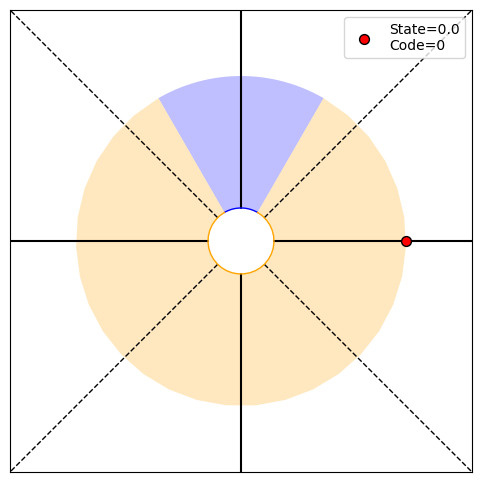

P(O1:29,S29|T)=[0.25 0.   0.25 0.25], P(O1:29|actions,T)=0.75, P(T|O1:29)=[0.9981027 0.0018973], H29=0.02
PRINT 1: 0.019889663304754057, [0.25 0.   0.25 0.25]
PRINT 2: [0.00039286 0.00039286], [0.9981027 0.0018973]
Choosing randomly
Current angle: -270.0, Code received: 1.0


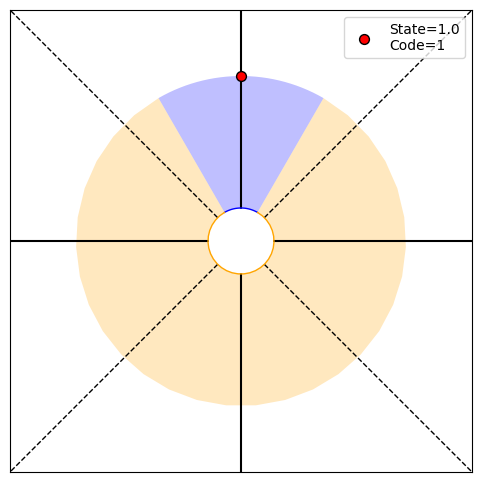

P(O1:30,S30|T)=[0.   0.25 0.   0.  ], P(O1:30|actions,T)=0.25, P(T|O1:30)=[0.99621259 0.00378741], H30=0.04
PRINT 1: 0.03592177455650257, [0.   0.25 0.   0.  ]
PRINT 2: [0.00078251 0.00078251], [0.99621259 0.00378741]
Choosing randomly
Current angle: -360.0, Code received: 0.0


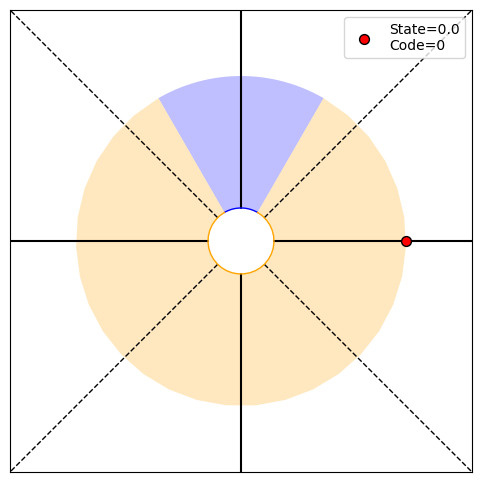

P(O1:31,S31|T)=[0.25 0.   0.25 0.25], P(O1:31|actions,T)=0.75, P(T|O1:31)=[0.99747187 0.00252813], H31=0.03
PRINT 1: 0.02545467553544495, [0.25 0.   0.25 0.25]
PRINT 2: [0.0005231 0.0005231], [0.99747187 0.00252813]
Choosing randomly
Current angle: -270.0, Code received: 1.0


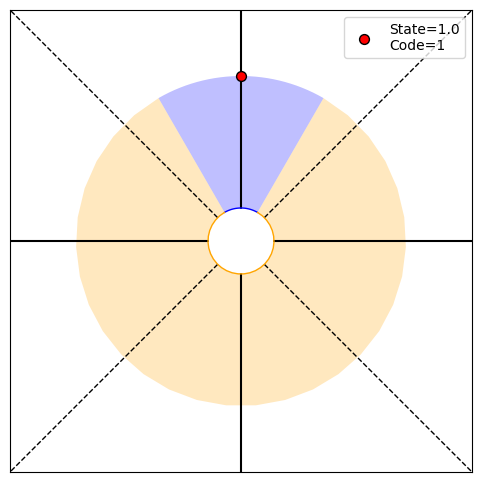

P(O1:32,S32|T)=[0.   0.25 0.   0.  ], P(O1:32|actions,T)=0.25, P(T|O1:32)=[0.99495649 0.00504351], H32=0.05
PRINT 1: 0.04574666140685605, [0.   0.25 0.   0.  ]
PRINT 2: [0.00104051 0.00104051], [0.99495649 0.00504351]
Choosing randomly
Current angle: -360.0, Code received: 0.0


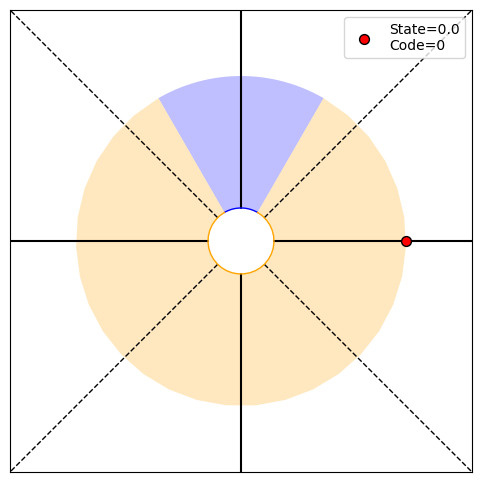

P(O1:33,S33|T)=[0.25 0.   0.25 0.25], P(O1:33|actions,T)=0.75, P(T|O1:33)=[0.996632 0.003368], H33=0.03
PRINT 1: 0.03251519254991218, [0.25 0.   0.25 0.25]
PRINT 2: [0.0006962 0.0006962], [0.996632 0.003368]
Choosing randomly
Current angle: -450.0, Code received: 0.0


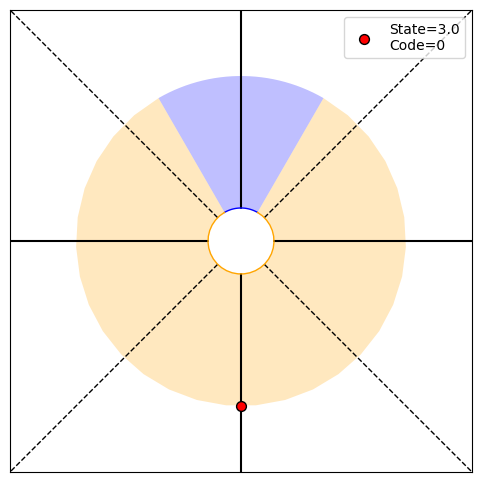

P(O1:34,S34|T)=[0.25 0.   0.25 0.25], P(O1:34|actions,T)=0.75, P(T|O1:34)=[0.99775214 0.00224786], H34=0.02
PRINT 1: 0.02301424702651784, [0.25 0.   0.25 0.25]
PRINT 2: [0.00046526 0.00046526], [0.99775214 0.00224786]
Choosing randomly
Current angle: -360.0, Code received: 0.0


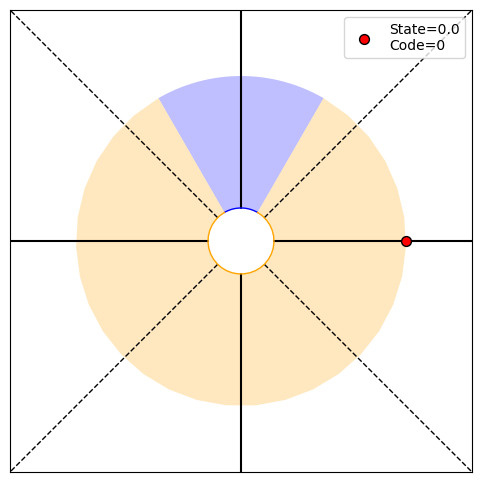

P(O1:35,S35|T)=[0.25 0.   0.25 0.25], P(O1:35|actions,T)=0.75, P(T|O1:35)=[0.99850031 0.00149969], H35=0.02
PRINT 1: 0.01623079003113129, [0.25 0.   0.25 0.25]
PRINT 2: [0.00031067 0.00031067], [0.99850031 0.00149969]
Choosing randomly
Current angle: -270.0, Code received: 1.0


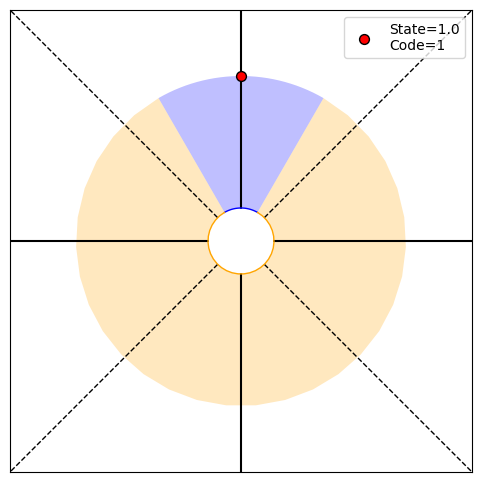

P(O1:36,S36|T)=[0.   0.25 0.   0.  ], P(O1:36|actions,T)=0.25, P(T|O1:36)=[0.9970051 0.0029949], H36=0.03
PRINT 1: 0.029421311991498594, [0.   0.25 0.   0.  ]
PRINT 2: [0.00061934 0.00061934], [0.9970051 0.0029949]
Choosing randomly
Current angle: -180.0, Code received: 0.0


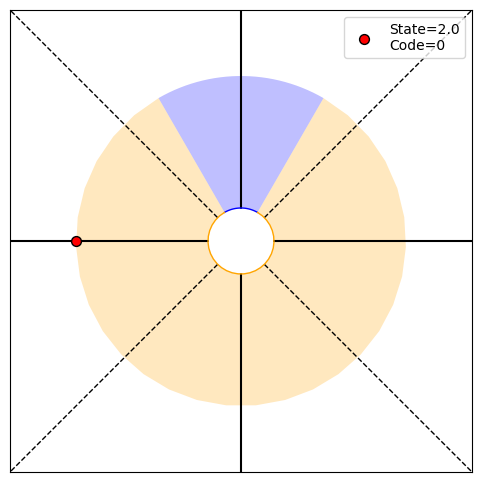

P(O1:37,S37|T)=[0.25 0.   0.25 0.25], P(O1:37|actions,T)=0.75, P(T|O1:37)=[0.99800141 0.00199859], H37=0.02
PRINT 1: 0.02080146988212129, [0.25 0.   0.25 0.25]
PRINT 2: [0.00041379 0.00041379], [0.99800141 0.00199859]
Choosing randomly
Current angle: -90.0, Code received: 0.0


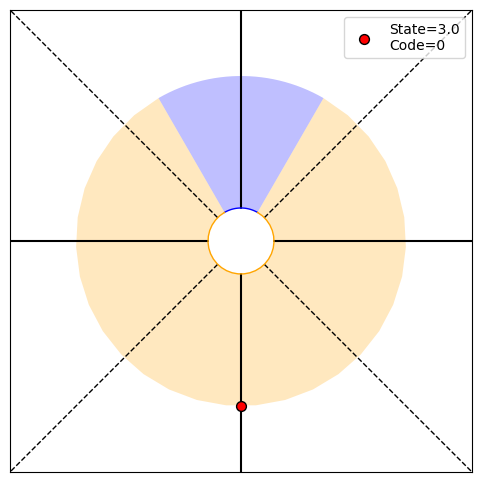

P(O1:38,S38|T)=[0.25 0.   0.25 0.25], P(O1:38|actions,T)=0.75, P(T|O1:38)=[0.99866672 0.00133328], H38=0.01
PRINT 1: 0.01465617137836207, [0.25 0.   0.25 0.25]
PRINT 2: [0.00027625 0.00027625], [0.99866672 0.00133328]
Choosing randomly
Current angle: 0.0, Code received: 0.0


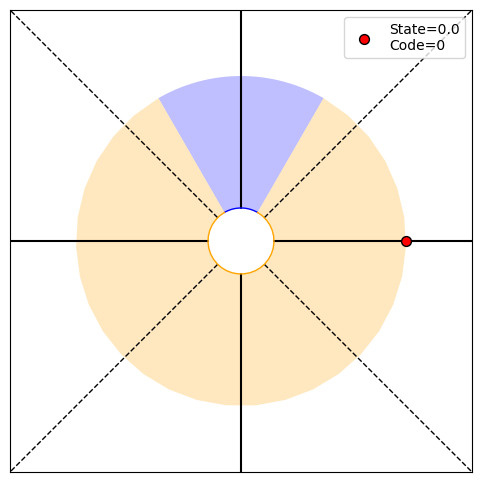

P(O1:39,S39|T)=[0.25 0.   0.25 0.25], P(O1:39|actions,T)=0.75, P(T|O1:39)=[9.99110749e-01 8.89251417e-04], H39=0.01
PRINT 1: 0.01029501874022748, [0.25 0.   0.25 0.25]
PRINT 2: [0.00018435 0.00018435], [9.99110749e-01 8.89251417e-04]
Choosing randomly
Current angle: 90.0, Code received: 1.0


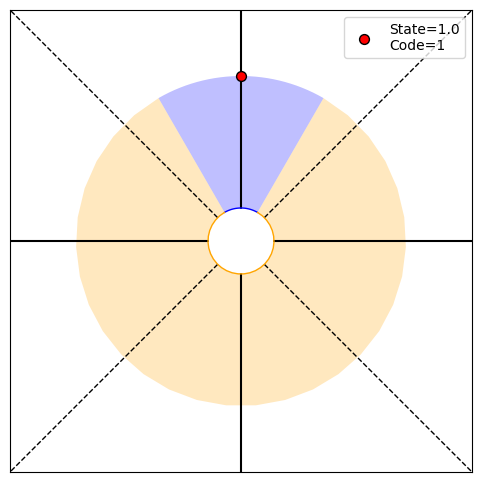

P(O1:40,S40|T)=[0.   0.25 0.   0.  ], P(O1:40|actions,T)=0.25, P(T|O1:40)=[0.99822308 0.00177692], H40=0.02
PRINT 1: 0.01879596114915871, [0.   0.25 0.   0.  ]
PRINT 2: [0.00036799 0.00036799], [0.99822308 0.00177692]
Choosing randomly
Current angle: 0.0, Code received: 0.0


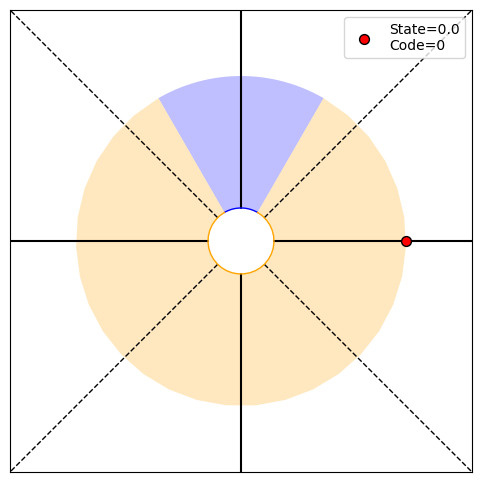

P(O1:41,S41|T)=[0.25 0.   0.25 0.25], P(O1:41|actions,T)=0.75, P(T|O1:41)=[0.99881468 0.00118532], H41=0.01
PRINT 1: 0.013230926437444009, [0.25 0.   0.25 0.25]
PRINT 2: [0.00024564 0.00024564], [0.99881468 0.00118532]
Choosing randomly
Current angle: -90.0, Code received: 0.0


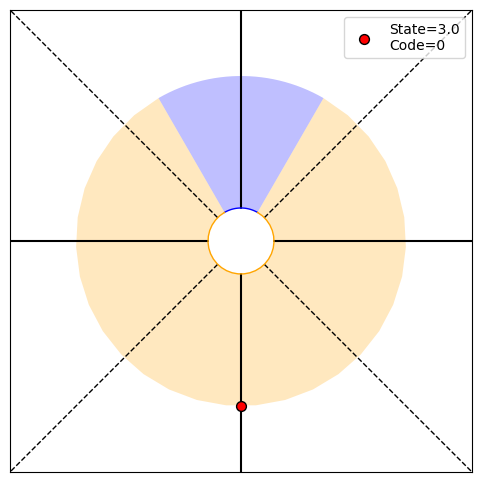

P(O1:42,S42|T)=[0.25 0.   0.25 0.25], P(O1:42|actions,T)=0.75, P(T|O1:42)=[9.99209476e-01 7.90523812e-04], H42=0.01
PRINT 1: 0.00928630544027766, [0.25 0.   0.25 0.25]
PRINT 2: [0.0001639 0.0001639], [9.99209476e-01 7.90523812e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


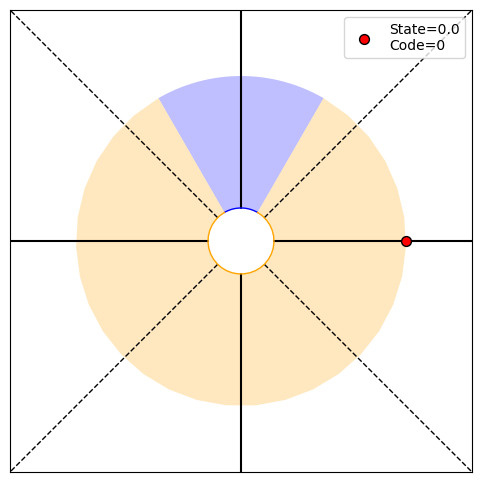

P(O1:43,S43|T)=[0.25 0.   0.25 0.25], P(O1:43|actions,T)=0.75, P(T|O1:43)=[9.99472845e-01 5.27154784e-04], H43=0.01
PRINT 1: 0.006500767610566483, [0.25 0.   0.25 0.25]
PRINT 2: [0.00010933 0.00010933], [9.99472845e-01 5.27154784e-04]
Choosing randomly
Current angle: -90.0, Code received: 0.0


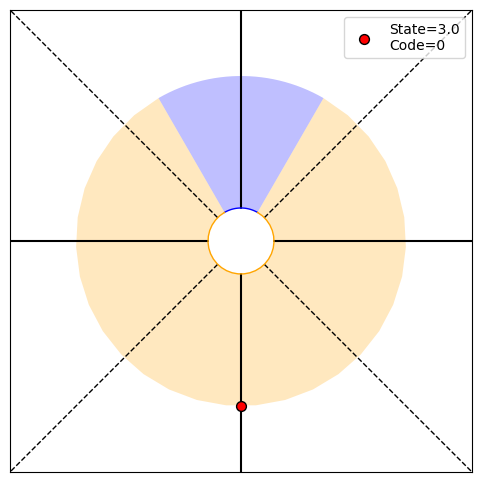

P(O1:44,S44|T)=[0.25 0.   0.25 0.25], P(O1:44|actions,T)=0.75, P(T|O1:44)=[9.99648502e-01 3.51498287e-04], H44=0.00
PRINT 1: 0.004540175496270579, [0.25 0.   0.25 0.25]
PRINT 2: [7.29127797e-05 7.29127797e-05], [9.99648502e-01 3.51498287e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


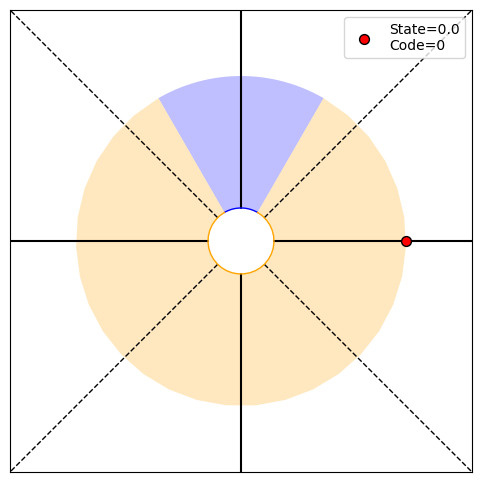

P(O1:45,S45|T)=[0.25 0.   0.25 0.25], P(O1:45|actions,T)=0.75, P(T|O1:45)=[9.99765640e-01 2.34359651e-04], H45=0.00
PRINT 1: 0.003164210138889797, [0.25 0.   0.25 0.25]
PRINT 2: [4.86208158e-05 4.86208158e-05], [9.99765640e-01 2.34359651e-04]
Choosing randomly
Current angle: 90.0, Code received: 1.0


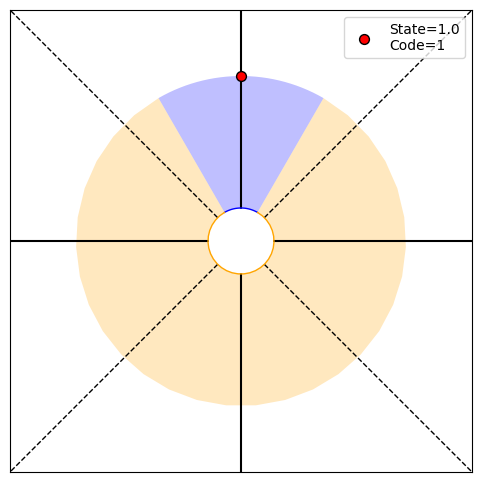

P(O1:46,S46|T)=[0.   0.25 0.   0.  ], P(O1:46|actions,T)=0.25, P(T|O1:46)=[9.99531391e-01 4.68609478e-04], H46=0.01
PRINT 1: 0.005858407241444224, [0.   0.25 0.   0.  ]
PRINT 2: [9.71924571e-05 9.71924571e-05], [9.99531391e-01 4.68609478e-04]
Choosing randomly
Current angle: 180.0, Code received: 0.0


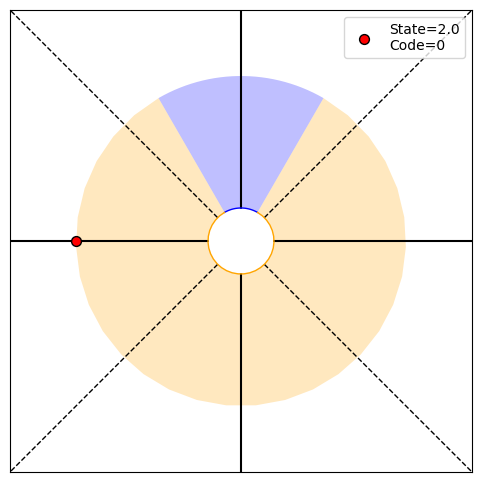

P(O1:47,S47|T)=[0.25 0.   0.25 0.25], P(O1:47|actions,T)=0.75, P(T|O1:47)=[9.99687545e-01 3.12455125e-04], H47=0.00
PRINT 1: 0.004088954308405904, [0.25 0.   0.25 0.25]
PRINT 2: [6.48168239e-05 6.48168239e-05], [9.99687545e-01 3.12455125e-04]
Choosing randomly
Current angle: 90.0, Code received: 1.0


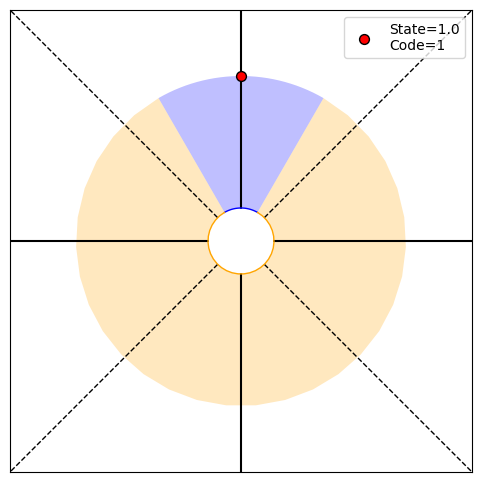

P(O1:48,S48|T)=[0.   0.25 0.   0.  ], P(O1:48|actions,T)=0.25, P(T|O1:48)=[9.99375285e-01 6.24715055e-04], H48=0.01
PRINT 1: 0.007550779934184769, [0.   0.25 0.   0.  ]
PRINT 2: [0.00012955 0.00012955], [9.99375285e-01 6.24715055e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


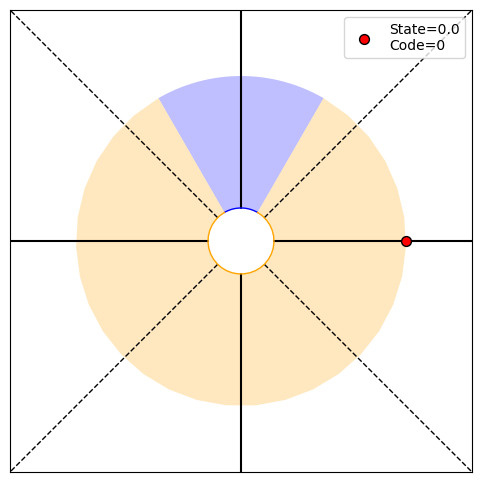

P(O1:49,S49|T)=[0.25 0.   0.25 0.25], P(O1:49|actions,T)=0.75, P(T|O1:49)=[9.99583437e-01 4.16563448e-04], H49=0.01
PRINT 1: 0.00527851315496196, [0.25 0.   0.25 0.25]
PRINT 2: [8.64030057e-05 8.64030057e-05], [9.99583437e-01 4.16563448e-04]
Choosing randomly
Current angle: 90.0, Code received: 1.0


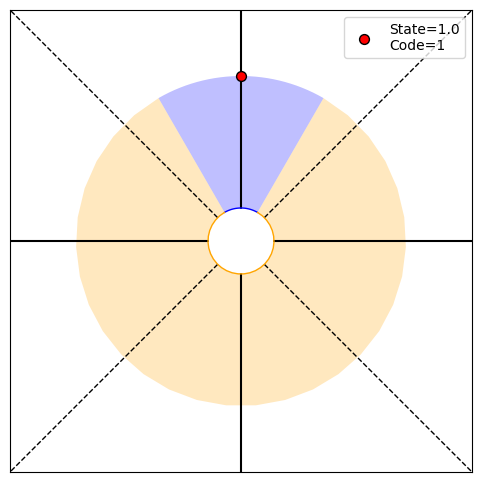

P(O1:50,S50|T)=[0.   0.25 0.   0.  ], P(O1:50|actions,T)=0.25, P(T|O1:50)=[9.9916722e-01 8.3277999e-04], H50=0.01
PRINT 1: 0.009720100719372049, [0.   0.25 0.   0.  ]
PRINT 2: [0.00017265 0.00017265], [9.9916722e-01 8.3277999e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


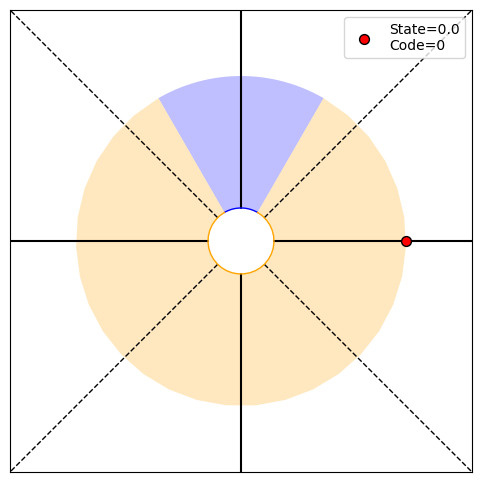

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.04730118 0.04730118], [0.6 0.4]
Choosing randomly
Current angle: -90.0, Code received: 0.0


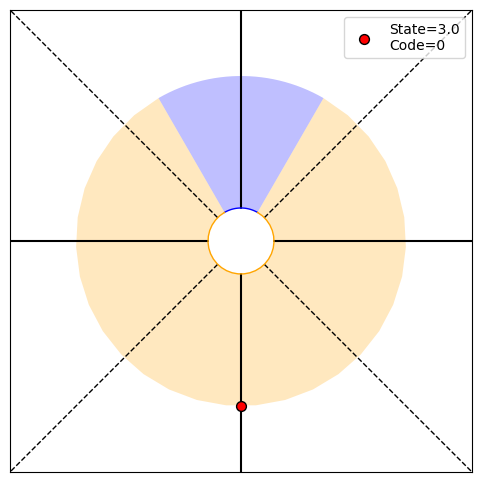

P(O1:2,S2|T)=[0.25 0.   0.25 0.25], P(O1:2|actions,T)=0.75, P(T|O1:2)=[0.69230769 0.30769231], H2=0.89
PRINT 1: 0.8904916402194913, [0.25 0.   0.25 0.25]
PRINT 2: [0.04240536 0.04240536], [0.69230769 0.30769231]
Choosing randomly
Current angle: -180.0, Code received: 0.0


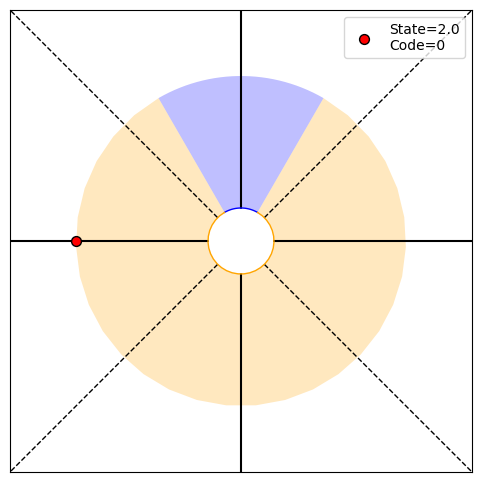

P(O1:3,S3|T)=[0.25 0.   0.25 0.25], P(O1:3|actions,T)=0.75, P(T|O1:3)=[0.77142857 0.22857143], H3=0.78
PRINT 1: 0.775512658133148, [0.25 0.   0.25 0.25]
PRINT 2: [0.03543325 0.03543325], [0.77142857 0.22857143]
Choosing randomly
Current angle: -270.0, Code received: 1.0


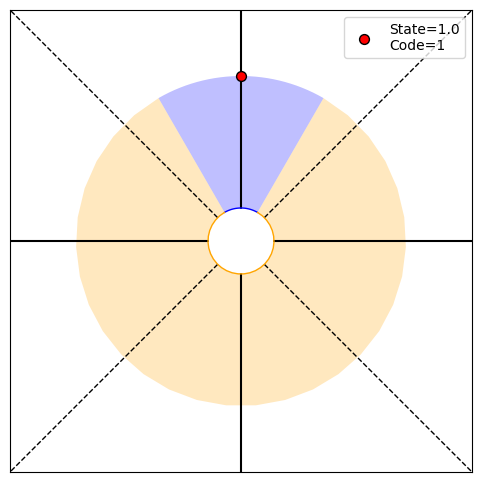

P(O1:4,S4|T)=[0.   0.25 0.   0.  ], P(O1:4|actions,T)=0.25, P(T|O1:4)=[0.62790698 0.37209302], H4=0.95
PRINT 1: 0.9522656254366644, [0.   0.25 0.   0.  ]
PRINT 2: [0.0461822 0.0461822], [0.62790698 0.37209302]
Choosing randomly
Current angle: -180.0, Code received: 0.0


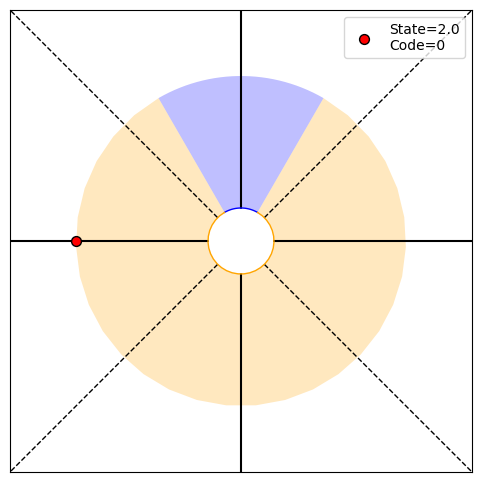

P(O1:5,S5|T)=[0.25 0.   0.25 0.25], P(O1:5|actions,T)=0.75, P(T|O1:5)=[0.71681416 0.28318584], H5=0.86
PRINT 1: 0.8597555090200143, [0.25 0.   0.25 0.25]
PRINT 2: [0.04052399 0.04052399], [0.71681416 0.28318584]
Choosing randomly
Current angle: -270.0, Code received: 1.0


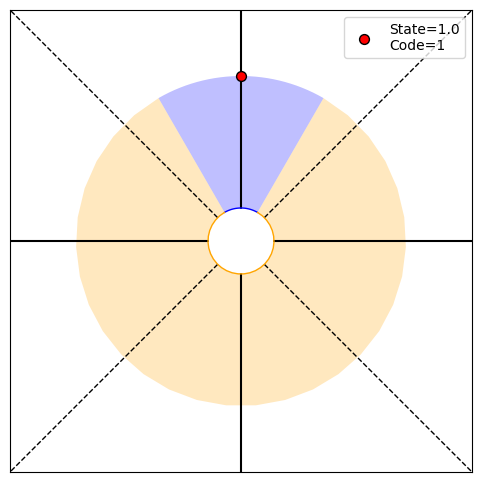

P(O1:6,S6|T)=[0.   0.25 0.   0.  ], P(O1:6|actions,T)=0.25, P(T|O1:6)=[0.55862069 0.44137931], H6=0.99
PRINT 1: 0.9900618470242131, [0.   0.25 0.   0.  ]
PRINT 2: [0.04839299 0.04839299], [0.55862069 0.44137931]
Choosing randomly
Current angle: -180.0, Code received: 0.0


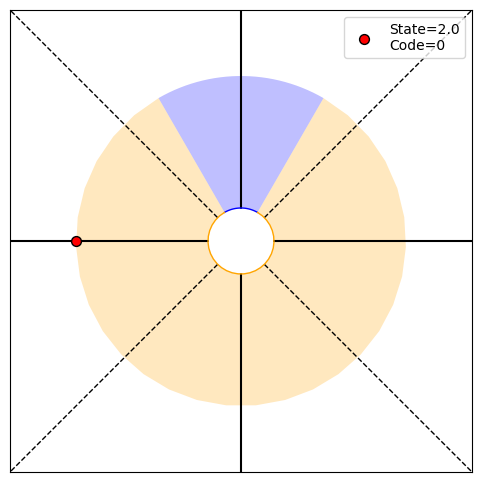

P(O1:7,S7|T)=[0.25 0.   0.25 0.25], P(O1:7|actions,T)=0.75, P(T|O1:7)=[0.65498652 0.34501348], H7=0.93
PRINT 1: 0.9295356505393889, [0.25 0.   0.25 0.25]
PRINT 2: [0.04479852 0.04479852], [0.65498652 0.34501348]
Choosing randomly
Current angle: -90.0, Code received: 0.0


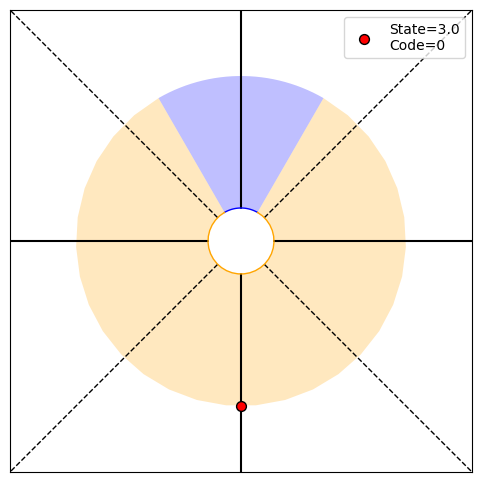

P(O1:8,S8|T)=[0.25 0.   0.25 0.25], P(O1:8|actions,T)=0.75, P(T|O1:8)=[0.74010152 0.25989848], H8=0.83
PRINT 1: 0.8265931344916198, [0.25 0.   0.25 0.25]
PRINT 2: [0.03850594 0.03850594], [0.74010152 0.25989848]
Choosing randomly
Current angle: -180.0, Code received: 0.0


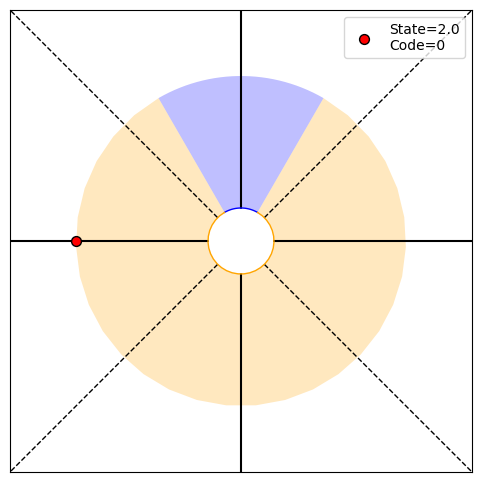

P(O1:9,S9|T)=[0.25 0.   0.25 0.25], P(O1:9|actions,T)=0.75, P(T|O1:9)=[0.81030011 0.18969989], H9=0.70
PRINT 1: 0.700843228291535, [0.25 0.   0.25 0.25]
PRINT 2: [0.03104175 0.03104175], [0.81030011 0.18969989]
Choosing randomly
Current angle: -90.0, Code received: 0.0


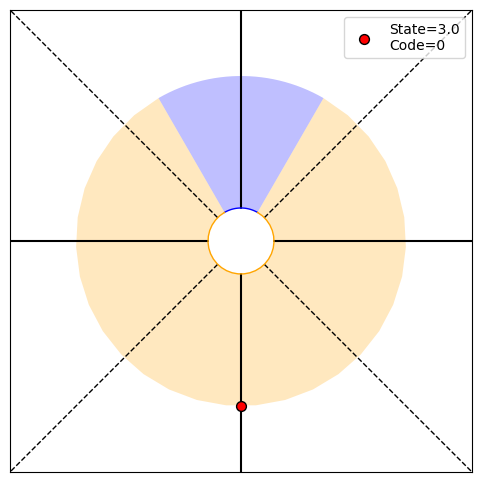

P(O1:10,S10|T)=[0.25 0.   0.25 0.25], P(O1:10|actions,T)=0.75, P(T|O1:10)=[0.8649967 0.1350033], H10=0.57
PRINT 1: 0.5710017923786879, [0.25 0.   0.25 0.25]
PRINT 2: [0.02375517 0.02375517], [0.8649967 0.1350033]
Choosing randomly
Current angle: -180.0, Code received: 0.0


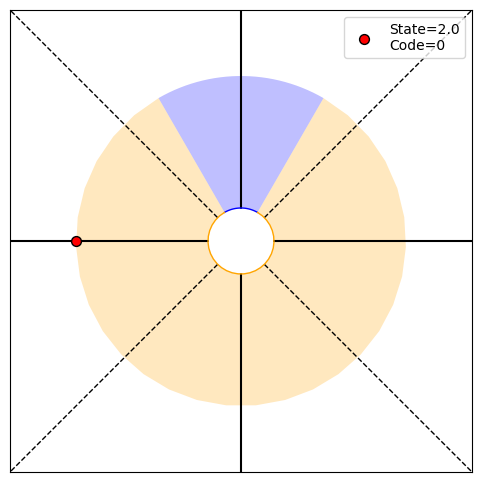

P(O1:11,S11|T)=[0.25 0.   0.25 0.25], P(O1:11|actions,T)=0.75, P(T|O1:11)=[0.90575675 0.09424325], H11=0.45
PRINT 1: 0.4504768327942288, [0.25 0.   0.25 0.25]
PRINT 2: [0.01746401 0.01746401], [0.90575675 0.09424325]
Choosing randomly
Current angle: -90.0, Code received: 0.0


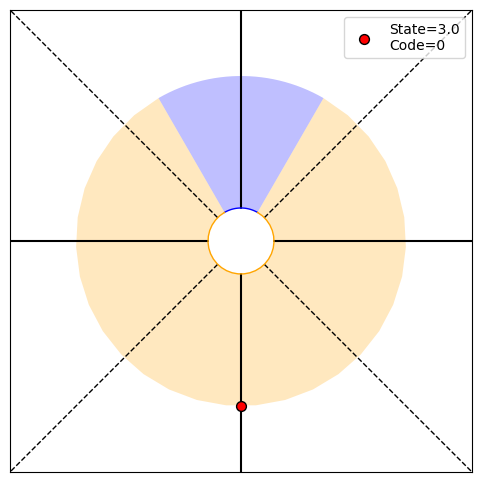

P(O1:12,S12|T)=[0.25 0.   0.25 0.25], P(O1:12|actions,T)=0.75, P(T|O1:12)=[0.93513342 0.06486658], H12=0.35
PRINT 1: 0.34646787085955577, [0.25 0.   0.25 0.25]
PRINT 2: [0.01246335 0.01246335], [0.93513342 0.06486658]
Choosing randomly
Current angle: -180.0, Code received: 0.0


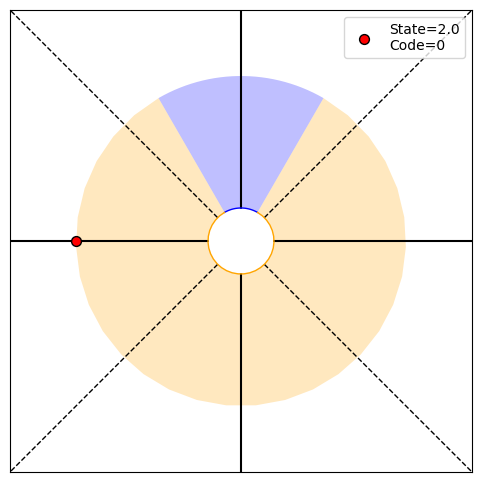

P(O1:13,S13|T)=[0.25 0.   0.25 0.25], P(O1:13|actions,T)=0.75, P(T|O1:13)=[0.95579991 0.04420009], H13=0.26
PRINT 1: 0.26122861470306796, [0.25 0.   0.25 0.25]
PRINT 2: [0.00870709 0.00870709], [0.95579991 0.04420009]
Choosing randomly
Current angle: -90.0, Code received: 0.0


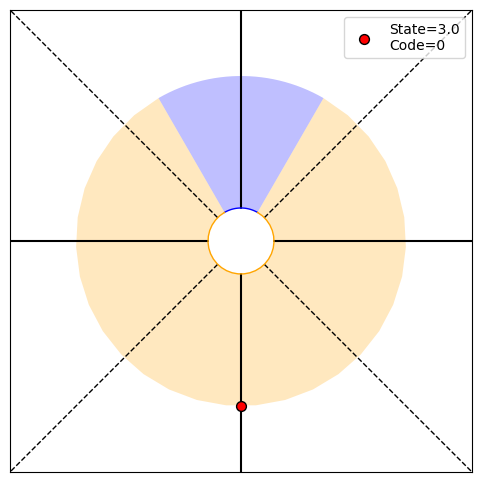

P(O1:14,S14|T)=[0.25 0.   0.25 0.25], P(O1:14|actions,T)=0.75, P(T|O1:14)=[0.97009264 0.02990736], H14=0.19
PRINT 1: 0.19392706453430134, [0.25 0.   0.25 0.25]
PRINT 2: [0.00599267 0.00599267], [0.97009264 0.02990736]
Choosing randomly
Current angle: 0.0, Code received: 0.0


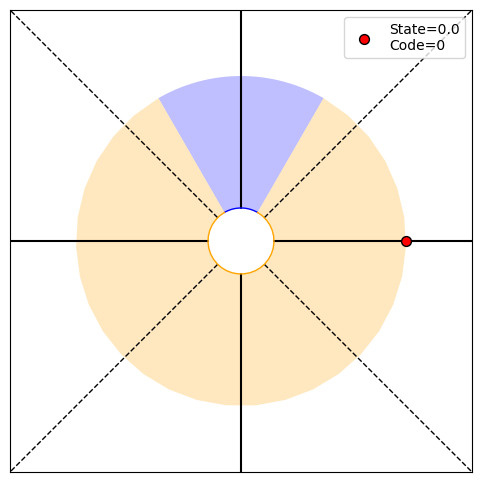

P(O1:15,S15|T)=[0.25 0.   0.25 0.25], P(O1:15|actions,T)=0.75, P(T|O1:15)=[0.97986099 0.02013901], H15=0.14
PRINT 1: 0.14222032717092226, [0.25 0.   0.25 0.25]
PRINT 2: [0.00408213 0.00408213], [0.97986099 0.02013901]
Choosing randomly
Current angle: -90.0, Code received: 0.0


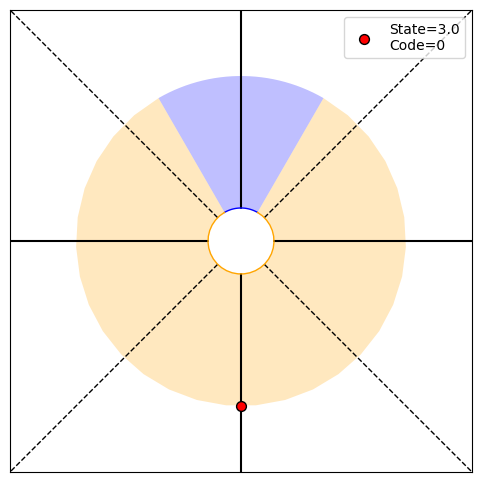

P(O1:16,S16|T)=[0.25 0.   0.25 0.25], P(O1:16|actions,T)=0.75, P(T|O1:16)=[0.98648326 0.01351674], H16=0.10
PRINT 1: 0.10329507904385823, [0.25 0.   0.25 0.25]
PRINT 2: [0.00276118 0.00276118], [0.98648326 0.01351674]
Choosing randomly
Current angle: 0.0, Code received: 0.0


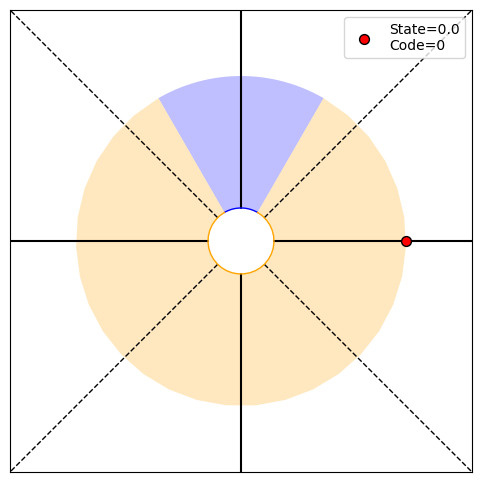

P(O1:17,S17|T)=[0.25 0.   0.25 0.25], P(O1:17|actions,T)=0.75, P(T|O1:17)=[0.99094805 0.00905195], H17=0.07
PRINT 1: 0.07444051165501062, [0.25 0.   0.25 0.25]
PRINT 2: [0.00185879 0.00185879], [0.99094805 0.00905195]
Choosing randomly
Current angle: 90.0, Code received: 1.0


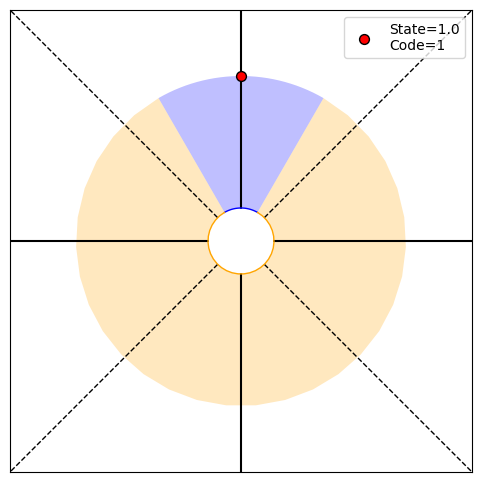

P(O1:18,S18|T)=[0.   0.25 0.   0.  ], P(O1:18|actions,T)=0.25, P(T|O1:18)=[0.98205851 0.01794149], H18=0.13
PRINT 1: 0.12972111381372003, [0.   0.25 0.   0.  ]
PRINT 2: [0.0036461 0.0036461], [0.98205851 0.01794149]
Choosing randomly
Current angle: 0.0, Code received: 0.0


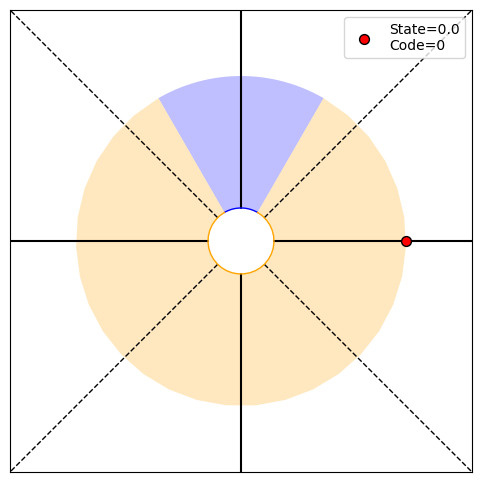

P(O1:19,S19|T)=[0.25 0.   0.25 0.25], P(O1:19|actions,T)=0.75, P(T|O1:19)=[0.98796704 0.01203296], H19=0.09
PRINT 1: 0.09398755120529412, [0.25 0.   0.25 0.25]
PRINT 2: [0.00246234 0.00246234], [0.98796704 0.01203296]
Choosing randomly
Current angle: -90.0, Code received: 0.0


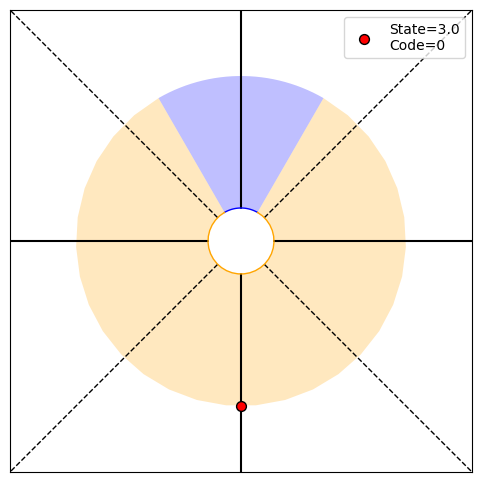

P(O1:20,S20|T)=[0.25 0.   0.25 0.25], P(O1:20|actions,T)=0.75, P(T|O1:20)=[0.99194572 0.00805428], H20=0.07
PRINT 1: 0.06759872162781173, [0.25 0.   0.25 0.25]
PRINT 2: [0.00165584 0.00165584], [0.99194572 0.00805428]
Choosing randomly
Current angle: -180.0, Code received: 0.0


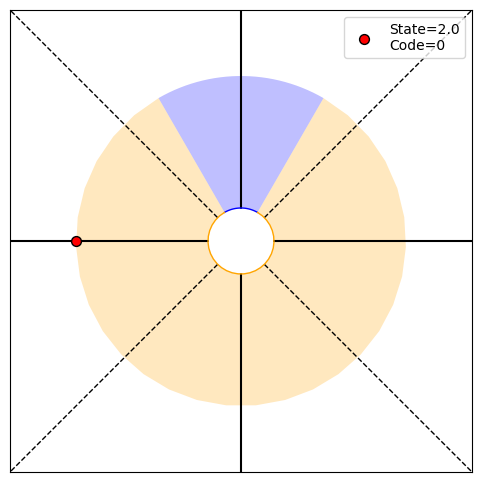

P(O1:21,S21|T)=[0.25 0.   0.25 0.25], P(O1:21|actions,T)=0.75, P(T|O1:21)=[0.99461603 0.00538397], H21=0.05
PRINT 1: 0.048326088246904805, [0.25 0.   0.25 0.25]
PRINT 2: [0.00111031 0.00111031], [0.99461603 0.00538397]
Choosing randomly
Current angle: -90.0, Code received: 0.0


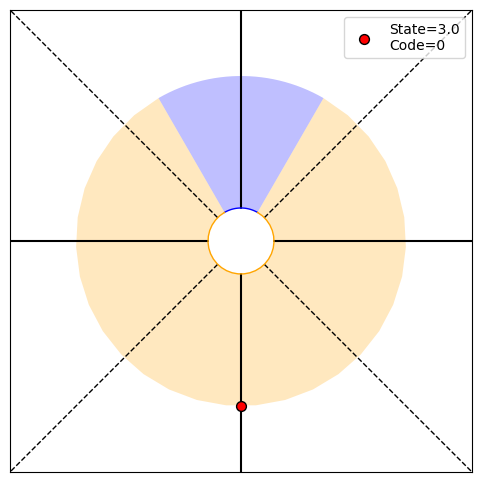

P(O1:22,S22|T)=[0.25 0.   0.25 0.25], P(O1:22|actions,T)=0.75, P(T|O1:22)=[0.99640423 0.00359577], H22=0.03
PRINT 1: 0.03437403841723751, [0.25 0.   0.25 0.25]
PRINT 2: [0.00074308 0.00074308], [0.99640423 0.00359577]
Choosing randomly
Current angle: -180.0, Code received: 0.0


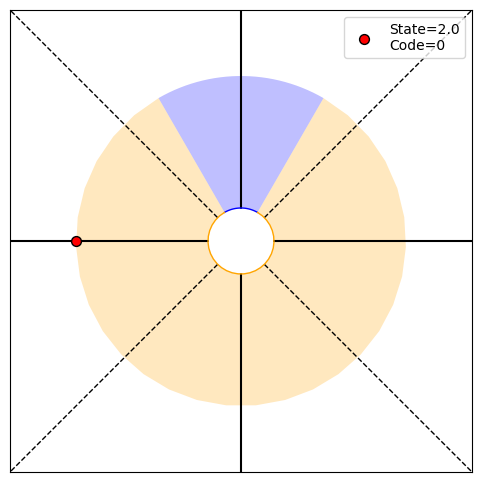

P(O1:23,S23|T)=[0.25 0.   0.25 0.25], P(O1:23|actions,T)=0.75, P(T|O1:23)=[0.99759994 0.00240006], H23=0.02
PRINT 1: 0.024345389330998928, [0.25 0.   0.25 0.25]
PRINT 2: [0.00049667 0.00049667], [0.99759994 0.00240006]
Choosing randomly
Current angle: -270.0, Code received: 1.0


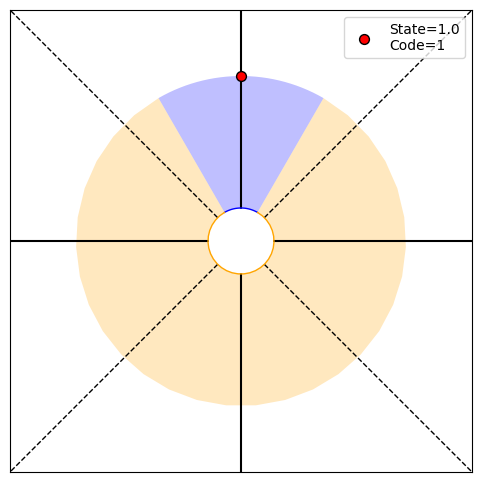

P(O1:24,S24|T)=[0.   0.25 0.   0.  ], P(O1:24|actions,T)=0.25, P(T|O1:24)=[0.99521138 0.00478862], H24=0.04
PRINT 1: 0.043793870958367107, [0.   0.25 0.   0.  ]
PRINT 2: [0.00098822 0.00098822], [0.99521138 0.00478862]
Choosing randomly
Current angle: -360.0, Code received: 0.0


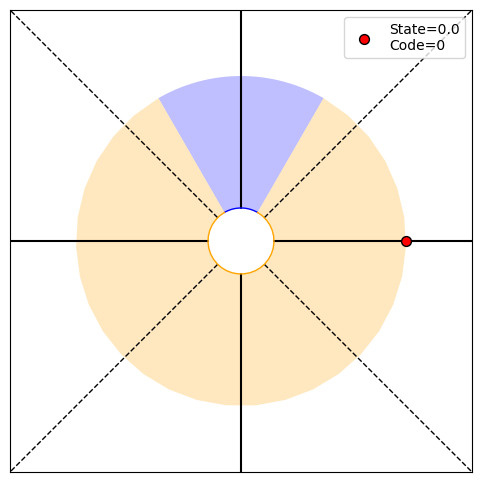

P(O1:25,S25|T)=[0.25 0.   0.25 0.25], P(O1:25|actions,T)=0.75, P(T|O1:25)=[0.99680248 0.00319752], H25=0.03
PRINT 1: 0.031109328274399547, [0.25 0.   0.25 0.25]
PRINT 2: [0.00066109 0.00066109], [0.99680248 0.00319752]
Choosing randomly
Current angle: -450.0, Code received: 0.0


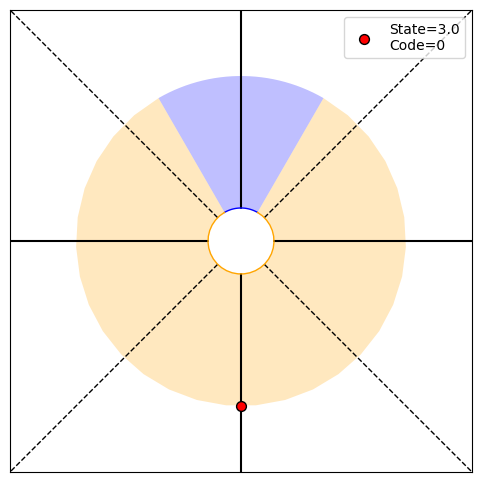

P(O1:26,S26|T)=[0.25 0.   0.25 0.25], P(O1:26|actions,T)=0.75, P(T|O1:26)=[0.99786605 0.00213395], H26=0.02
PRINT 1: 0.022008319342034958, [0.25 0.   0.25 0.25]
PRINT 2: [0.00044174 0.00044174], [0.99786605 0.00213395]
Choosing randomly
Current angle: -360.0, Code received: 0.0


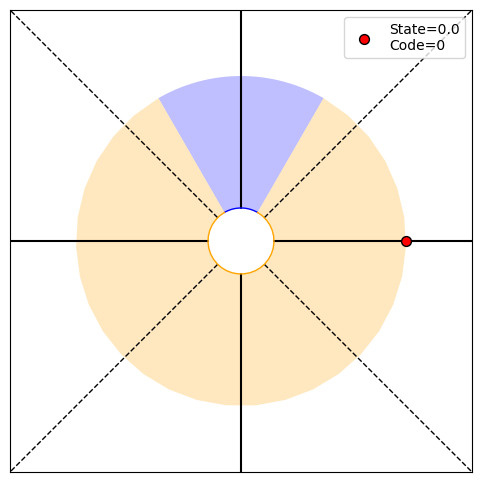

P(O1:27,S27|T)=[0.25 0.   0.25 0.25], P(O1:27|actions,T)=0.75, P(T|O1:27)=[0.99857635 0.00142365], H27=0.02
PRINT 1: 0.015514705823280637, [0.25 0.   0.25 0.25]
PRINT 2: [0.00029495 0.00029495], [0.99857635 0.00142365]
Choosing randomly
Current angle: -270.0, Code received: 1.0


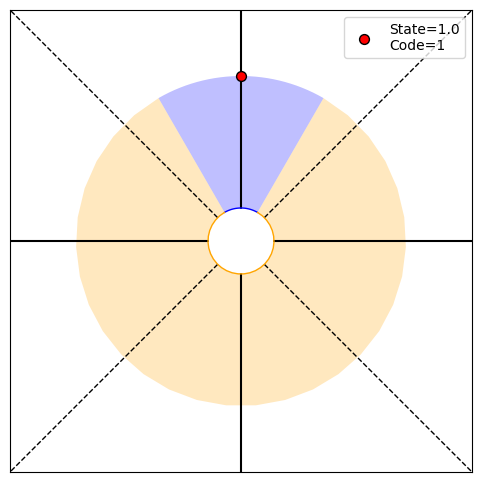

P(O1:28,S28|T)=[0.   0.25 0.   0.  ], P(O1:28|actions,T)=0.25, P(T|O1:28)=[0.99715675 0.00284325], H28=0.03
PRINT 1: 0.028144973255441873, [0.   0.25 0.   0.  ]
PRINT 2: [0.00058808 0.00058808], [0.99715675 0.00284325]
Choosing randomly
Current angle: -360.0, Code received: 0.0


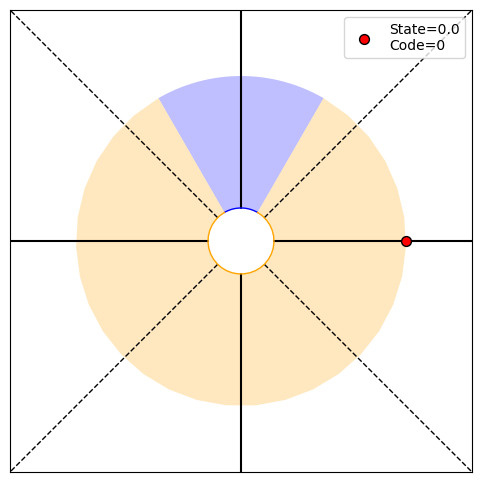

P(O1:29,S29|T)=[0.25 0.   0.25 0.25], P(O1:29|actions,T)=0.75, P(T|O1:29)=[0.9981027 0.0018973], H29=0.02
PRINT 1: 0.019889663304754064, [0.25 0.   0.25 0.25]
PRINT 2: [0.00039286 0.00039286], [0.9981027 0.0018973]
Choosing randomly
Current angle: -270.0, Code received: 1.0


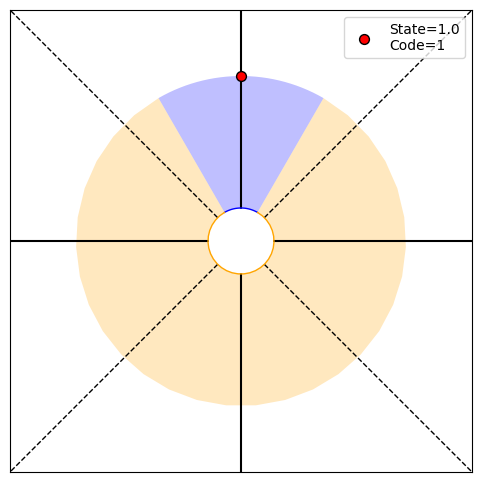

P(O1:30,S30|T)=[0.   0.25 0.   0.  ], P(O1:30|actions,T)=0.25, P(T|O1:30)=[0.99621259 0.00378741], H30=0.04
PRINT 1: 0.03592177455650257, [0.   0.25 0.   0.  ]
PRINT 2: [0.00078251 0.00078251], [0.99621259 0.00378741]
Choosing randomly
Current angle: -360.0, Code received: 0.0


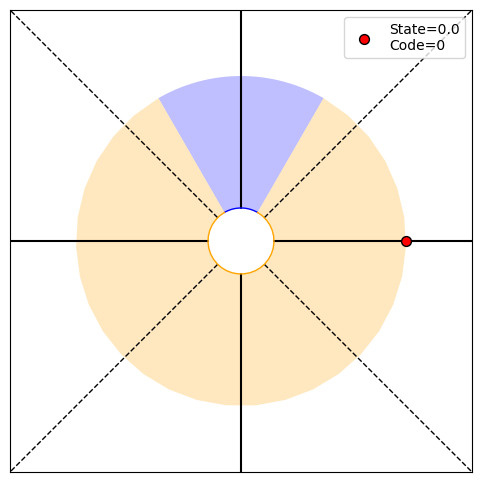

P(O1:31,S31|T)=[0.25 0.   0.25 0.25], P(O1:31|actions,T)=0.75, P(T|O1:31)=[0.99747187 0.00252813], H31=0.03
PRINT 1: 0.02545467553544495, [0.25 0.   0.25 0.25]
PRINT 2: [0.0005231 0.0005231], [0.99747187 0.00252813]
Choosing randomly
Current angle: -450.0, Code received: 0.0


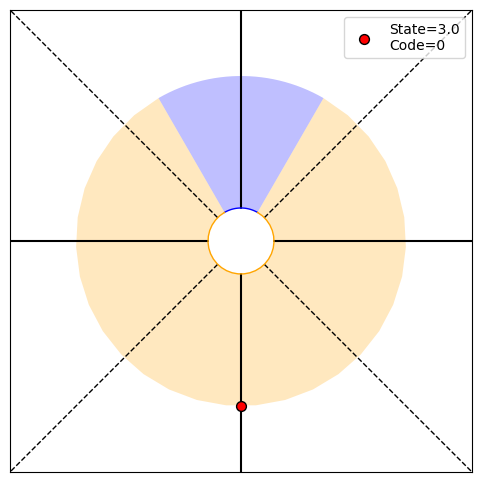

P(O1:32,S32|T)=[0.25 0.   0.25 0.25], P(O1:32|actions,T)=0.75, P(T|O1:32)=[0.99831316 0.00168684], H32=0.02
PRINT 1: 0.017969808259611836, [0.25 0.   0.25 0.25]
PRINT 2: [0.00034937 0.00034937], [0.99831316 0.00168684]
Choosing randomly
Current angle: -540.0, Code received: 0.0


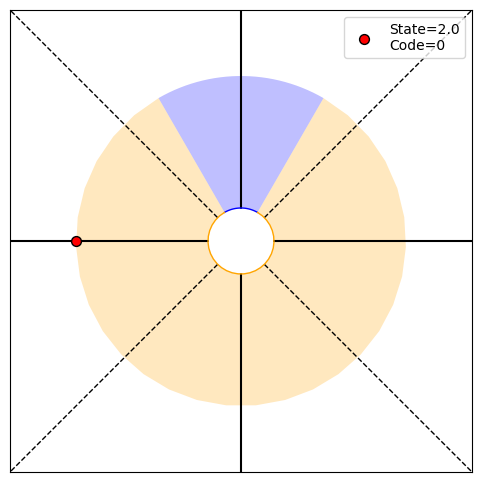

P(O1:33,S33|T)=[0.25 0.   0.25 0.25], P(O1:33|actions,T)=0.75, P(T|O1:33)=[0.99887481 0.00112519], H33=0.01
PRINT 1: 0.012644351025042303, [0.25 0.   0.25 0.25]
PRINT 2: [0.00023319 0.00023319], [0.99887481 0.00112519]
Choosing randomly
Current angle: -450.0, Code received: 0.0


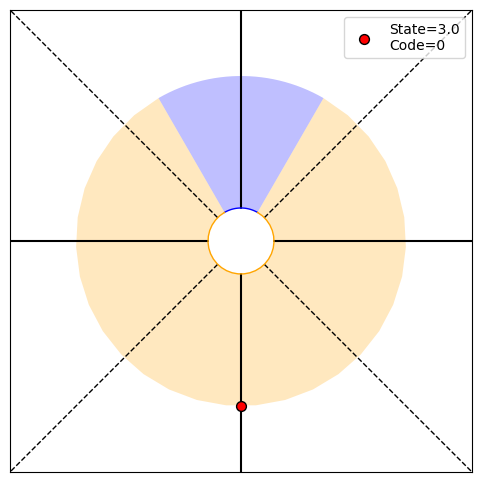

P(O1:34,S34|T)=[0.25 0.   0.25 0.25], P(O1:34|actions,T)=0.75, P(T|O1:34)=[9.99249590e-01 7.50410149e-04], H34=0.01
PRINT 1: 0.008871488837464461, [0.25 0.   0.25 0.25]
PRINT 2: [0.00015559 0.00015559], [9.99249590e-01 7.50410149e-04]
Choosing randomly
Current angle: -540.0, Code received: 0.0


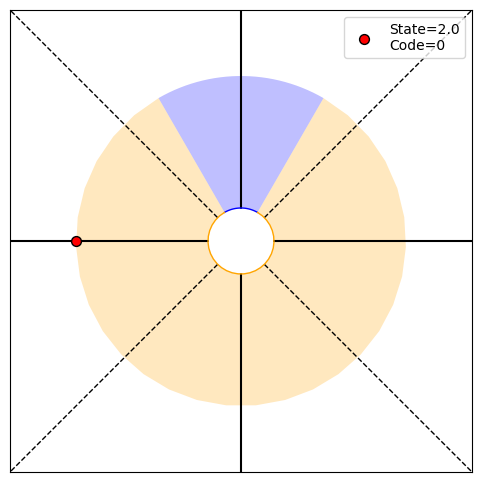

P(O1:35,S35|T)=[0.25 0.   0.25 0.25], P(O1:35|actions,T)=0.75, P(T|O1:35)=[9.99499601e-01 5.00398601e-04], H35=0.01
PRINT 1: 0.006208429748903923, [0.25 0.   0.25 0.25]
PRINT 2: [0.00010378 0.00010378], [9.99499601e-01 5.00398601e-04]
Choosing randomly
Current angle: -630.0, Code received: 1.0


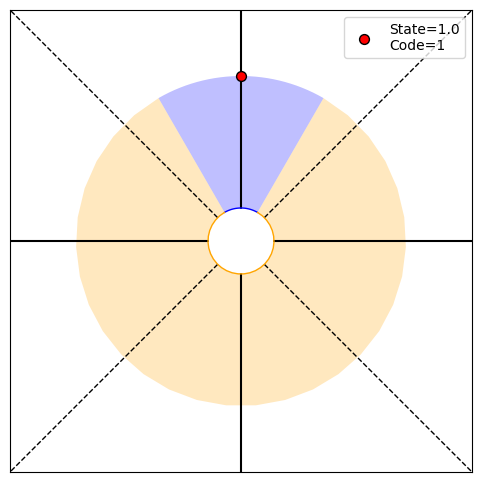

P(O1:36,S36|T)=[0.   0.25 0.   0.  ], P(O1:36|actions,T)=0.25, P(T|O1:36)=[0.9989997 0.0010003], H36=0.01
PRINT 1: 0.011410713640213035, [0.   0.25 0.   0.  ]
PRINT 2: [0.00020734 0.00020734], [0.9989997 0.0010003]
Choosing randomly
Current angle: -540.0, Code received: 0.0


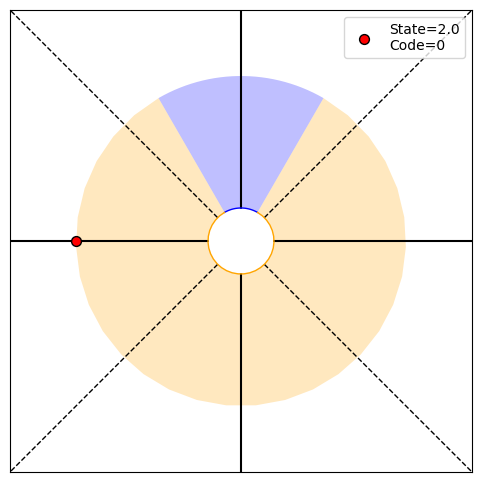

P(O1:37,S37|T)=[0.25 0.   0.25 0.25], P(O1:37|actions,T)=0.75, P(T|O1:37)=[9.99332913e-01 6.67086865e-04], H37=0.01
PRINT 1: 0.00799974002026101, [0.25 0.   0.25 0.25]
PRINT 2: [0.00013833 0.00013833], [9.99332913e-01 6.67086865e-04]
Choosing randomly
Current angle: -630.0, Code received: 1.0


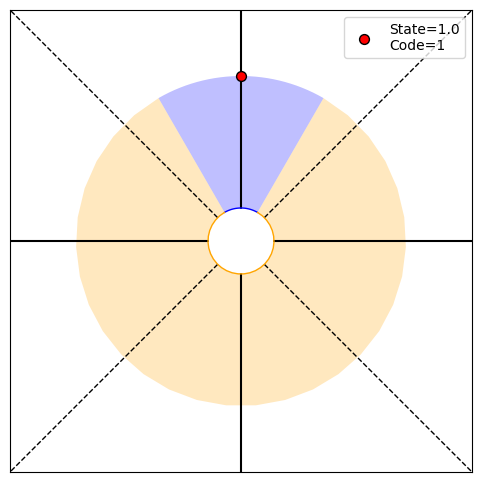

P(O1:38,S38|T)=[0.   0.25 0.   0.  ], P(O1:38|actions,T)=0.25, P(T|O1:38)=[0.99866672 0.00133328], H38=0.01
PRINT 1: 0.014656171378362066, [0.   0.25 0.   0.  ]
PRINT 2: [0.00027625 0.00027625], [0.99866672 0.00133328]
Choosing randomly
Current angle: -540.0, Code received: 0.0


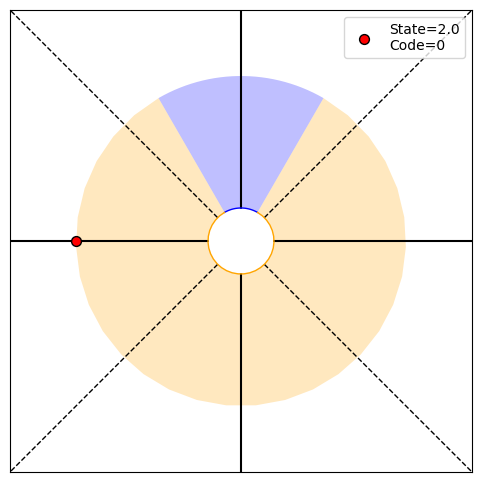

P(O1:39,S39|T)=[0.25 0.   0.25 0.25], P(O1:39|actions,T)=0.75, P(T|O1:39)=[9.99110749e-01 8.89251417e-04], H39=0.01
PRINT 1: 0.010295018740227476, [0.25 0.   0.25 0.25]
PRINT 2: [0.00018435 0.00018435], [9.99110749e-01 8.89251417e-04]
Choosing randomly
Current angle: -630.0, Code received: 1.0


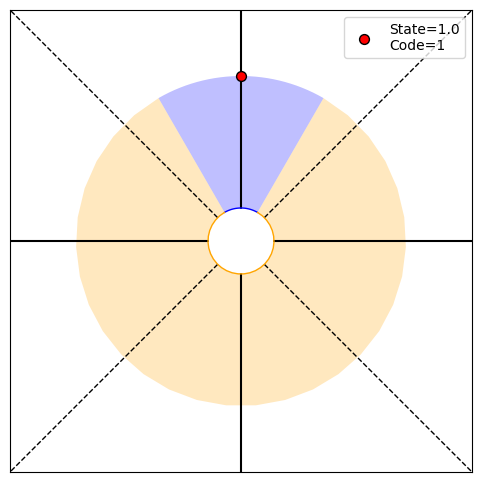

P(O1:40,S40|T)=[0.   0.25 0.   0.  ], P(O1:40|actions,T)=0.25, P(T|O1:40)=[0.99822308 0.00177692], H40=0.02
PRINT 1: 0.018795961149158703, [0.   0.25 0.   0.  ]
PRINT 2: [0.00036799 0.00036799], [0.99822308 0.00177692]
Choosing randomly
Current angle: -720.0, Code received: 0.0


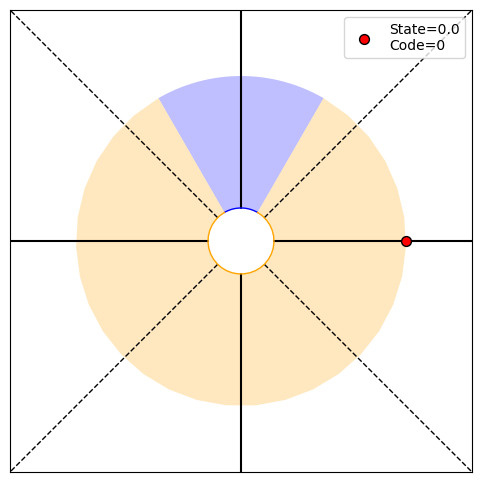

P(O1:41,S41|T)=[0.25 0.   0.25 0.25], P(O1:41|actions,T)=0.75, P(T|O1:41)=[0.99881468 0.00118532], H41=0.01
PRINT 1: 0.013230926437444005, [0.25 0.   0.25 0.25]
PRINT 2: [0.00024564 0.00024564], [0.99881468 0.00118532]
Choosing randomly
Current angle: -810.0, Code received: 0.0


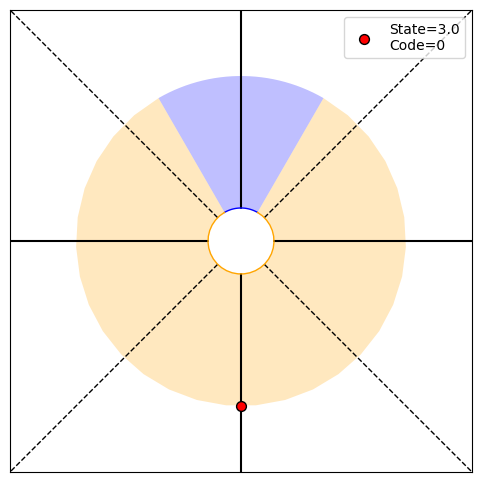

P(O1:42,S42|T)=[0.25 0.   0.25 0.25], P(O1:42|actions,T)=0.75, P(T|O1:42)=[9.99209476e-01 7.90523812e-04], H42=0.01
PRINT 1: 0.009286305440277658, [0.25 0.   0.25 0.25]
PRINT 2: [0.0001639 0.0001639], [9.99209476e-01 7.90523812e-04]
Choosing randomly
Current angle: -720.0, Code received: 0.0


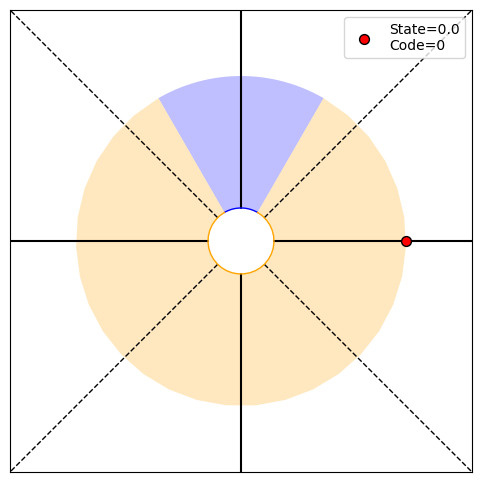

P(O1:43,S43|T)=[0.25 0.   0.25 0.25], P(O1:43|actions,T)=0.75, P(T|O1:43)=[9.99472845e-01 5.27154784e-04], H43=0.01
PRINT 1: 0.006500767610566482, [0.25 0.   0.25 0.25]
PRINT 2: [0.00010933 0.00010933], [9.99472845e-01 5.27154784e-04]
Choosing randomly
Current angle: -630.0, Code received: 1.0


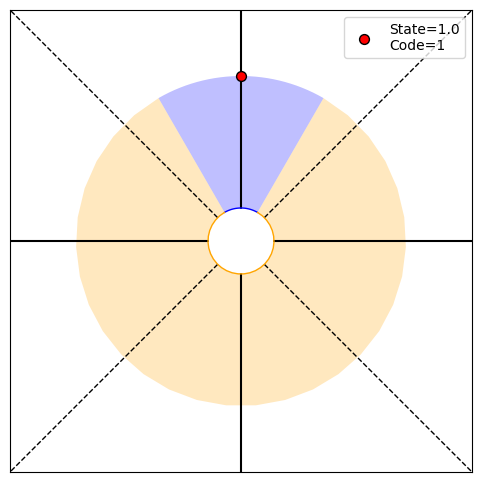

P(O1:44,S44|T)=[0.   0.25 0.   0.  ], P(O1:44|actions,T)=0.25, P(T|O1:44)=[0.99894625 0.00105375], H44=0.01
PRINT 1: 0.011941331636332002, [0.   0.25 0.   0.  ]
PRINT 2: [0.00021841 0.00021841], [0.99894625 0.00105375]
Choosing randomly
Current angle: -540.0, Code received: 0.0


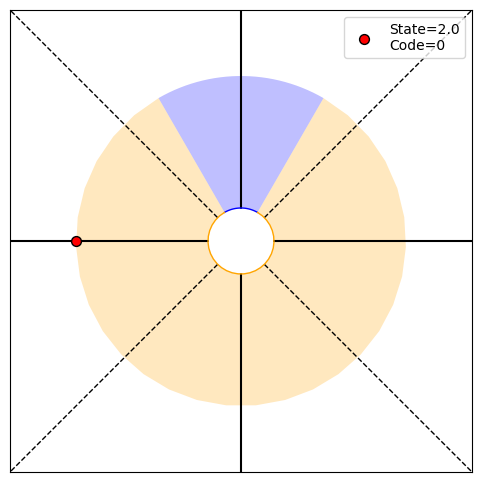

P(O1:45,S45|T)=[0.25 0.   0.25 0.25], P(O1:45|actions,T)=0.75, P(T|O1:45)=[9.9929725e-01 7.0274956e-04], H45=0.01
PRINT 1: 0.008374589010415982, [0.25 0.   0.25 0.25]
PRINT 2: [0.00014571 0.00014571], [9.9929725e-01 7.0274956e-04]
Choosing randomly
Current angle: -630.0, Code received: 1.0


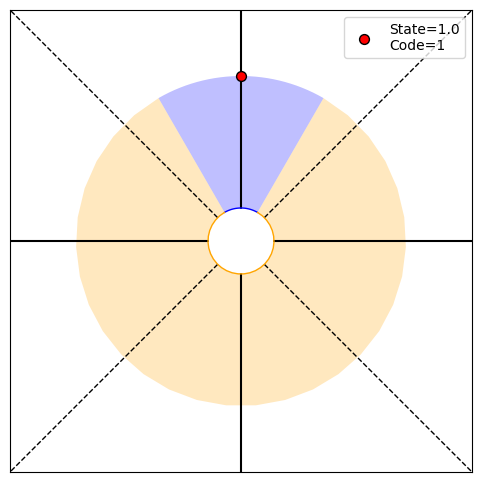

P(O1:46,S46|T)=[0.   0.25 0.   0.  ], P(O1:46|actions,T)=0.25, P(T|O1:46)=[0.99859549 0.00140451], H46=0.02
PRINT 1: 0.015333615694880176, [0.   0.25 0.   0.  ]
PRINT 2: [0.00029099 0.00029099], [0.99859549 0.00140451]
Choosing randomly
Current angle: -540.0, Code received: 0.0


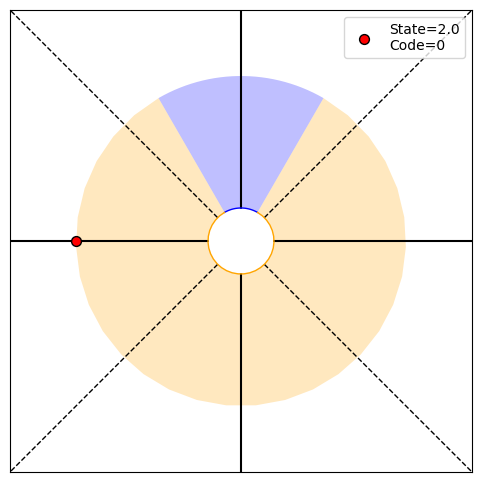

P(O1:47,S47|T)=[0.25 0.   0.25 0.25], P(O1:47|actions,T)=0.75, P(T|O1:47)=[9.99063220e-01 9.36779972e-04], H47=0.01
PRINT 1: 0.010774863132034266, [0.25 0.   0.25 0.25]
PRINT 2: [0.00019419 0.00019419], [9.99063220e-01 9.36779972e-04]
Choosing randomly
Current angle: -450.0, Code received: 0.0


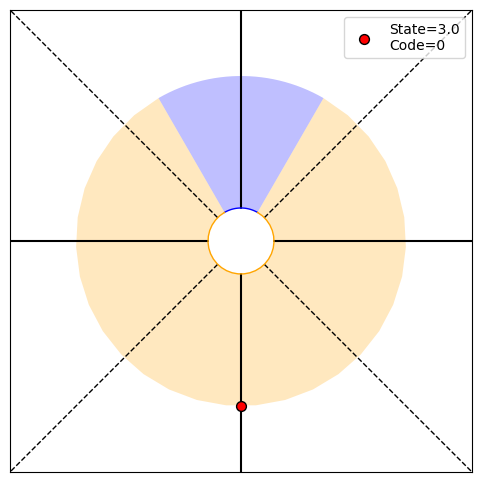

P(O1:48,S48|T)=[0.25 0.   0.25 0.25], P(O1:48|actions,T)=0.75, P(T|O1:48)=[9.99375285e-01 6.24715055e-04], H48=0.01
PRINT 1: 0.007550779934184767, [0.25 0.   0.25 0.25]
PRINT 2: [0.00012955 0.00012955], [9.99375285e-01 6.24715055e-04]
Choosing randomly
Current angle: -540.0, Code received: 0.0


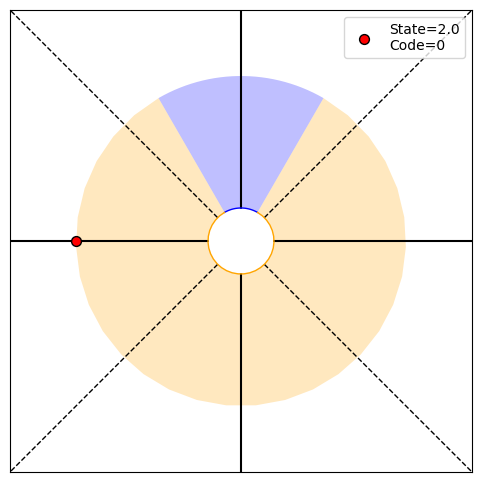

P(O1:49,S49|T)=[0.25 0.   0.25 0.25], P(O1:49|actions,T)=0.75, P(T|O1:49)=[9.99583437e-01 4.16563448e-04], H49=0.01
PRINT 1: 0.0052785131549619585, [0.25 0.   0.25 0.25]
PRINT 2: [8.64030057e-05 8.64030057e-05], [9.99583437e-01 4.16563448e-04]
Choosing randomly
Current angle: -630.0, Code received: 1.0


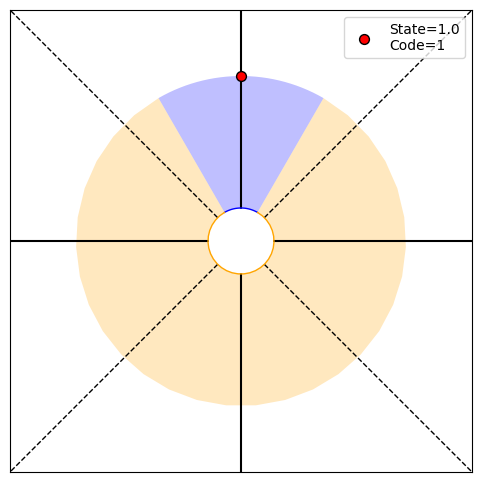

P(O1:50,S50|T)=[0.   0.25 0.   0.  ], P(O1:50|actions,T)=0.25, P(T|O1:50)=[9.9916722e-01 8.3277999e-04], H50=0.01
PRINT 1: 0.009720100719372043, [0.   0.25 0.   0.  ]
PRINT 2: [0.00017265 0.00017265], [9.9916722e-01 8.3277999e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


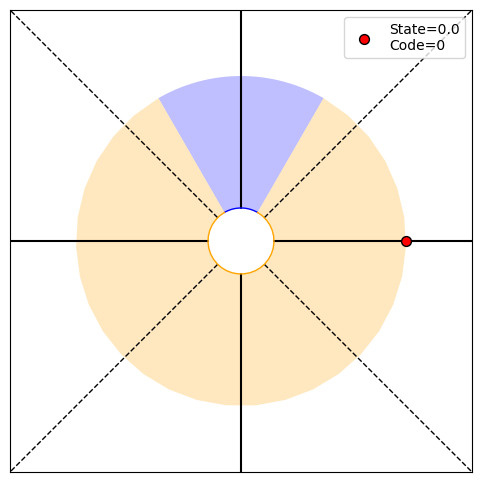

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.04730118 0.04730118], [0.6 0.4]
Choosing randomly
Current angle: 90.0, Code received: 1.0


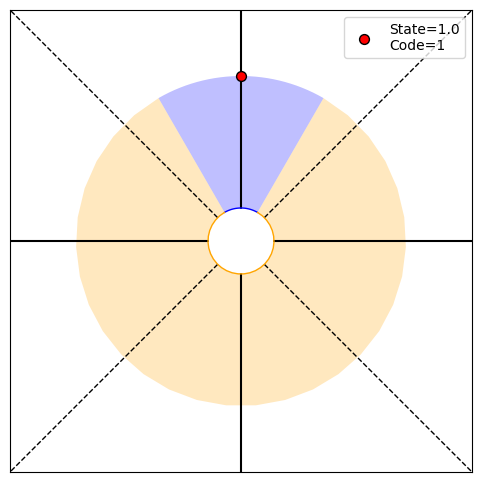

P(O1:2,S2|T)=[0.   0.25 0.   0.  ], P(O1:2|actions,T)=0.25, P(T|O1:2)=[0.42857143 0.57142857], H2=0.99
PRINT 1: 0.9852281360342514, [0.   0.25 0.   0.  ]
PRINT 2: [0.04749944 0.04749944], [0.42857143 0.57142857]
Choosing randomly
Current angle: 0.0, Code received: 0.0


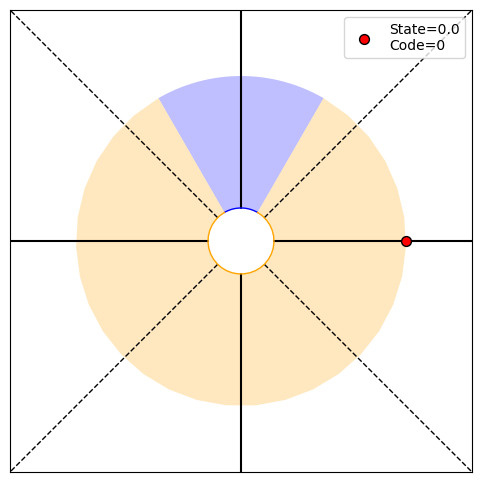

P(O1:3,S3|T)=[0.25 0.   0.25 0.25], P(O1:3|actions,T)=0.75, P(T|O1:3)=[0.52941176 0.47058824], H3=1.00
PRINT 1: 0.9975025463691152, [0.25 0.   0.25 0.25]
PRINT 2: [0.04875988 0.04875988], [0.52941176 0.47058824]
Choosing randomly
Current angle: 90.0, Code received: 1.0


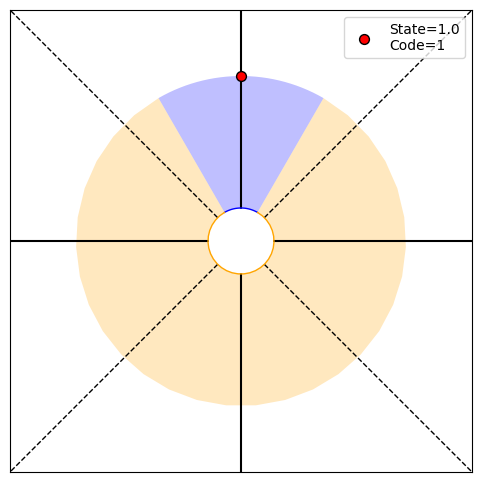

P(O1:4,S4|T)=[0.   0.25 0.   0.  ], P(O1:4|actions,T)=0.25, P(T|O1:4)=[0.36 0.64], H4=0.94
PRINT 1: 0.9426831892554923, [0.   0.25 0.   0.  ]
PRINT 2: [0.04444034 0.04444034], [0.36 0.64]
Choosing randomly
Current angle: 0.0, Code received: 0.0


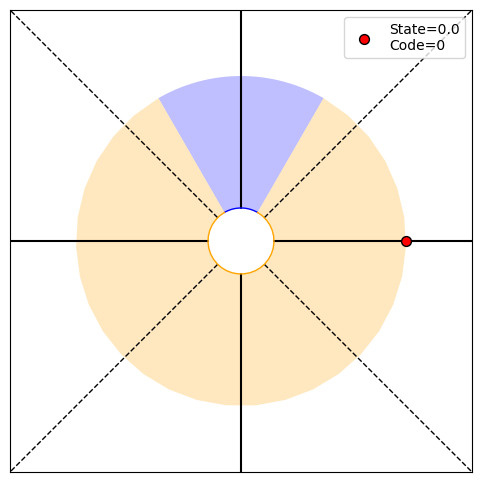

P(O1:5,S5|T)=[0.25 0.   0.25 0.25], P(O1:5|actions,T)=0.75, P(T|O1:5)=[0.45762712 0.54237288], H5=0.99
PRINT 1: 0.9948131754904235, [0.25 0.   0.25 0.25]
PRINT 2: [0.04826098 0.04826098], [0.45762712 0.54237288]
Choosing randomly
Current angle: 90.0, Code received: 1.0


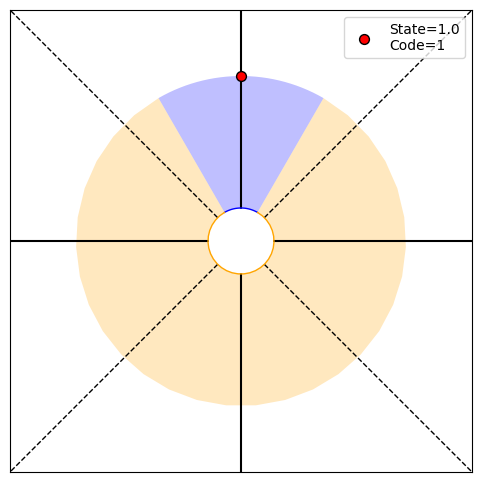

P(O1:6,S6|T)=[0.   0.25 0.   0.  ], P(O1:6|actions,T)=0.25, P(T|O1:6)=[0.2967033 0.7032967], H6=0.88
PRINT 1: 0.8772236230732715, [0.   0.25 0.   0.  ]
PRINT 2: [0.04006008 0.04006008], [0.2967033 0.7032967]
Choosing randomly
Current angle: 0.0, Code received: 0.0


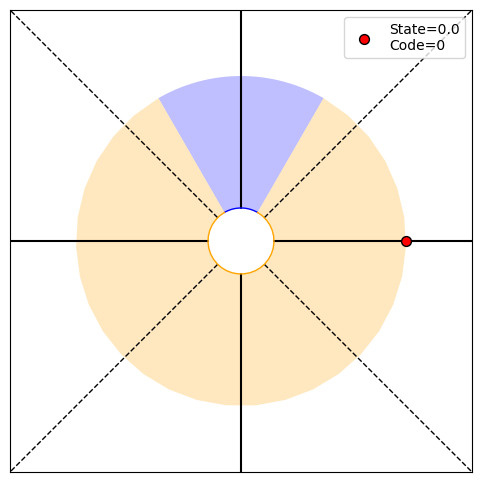

P(O1:7,S7|T)=[0.25 0.   0.25 0.25], P(O1:7|actions,T)=0.75, P(T|O1:7)=[0.38755981 0.61244019], H7=0.96
PRINT 1: 0.9632067386184207, [0.25 0.   0.25 0.25]
PRINT 2: [0.04588182 0.04588182], [0.38755981 0.61244019]
Choosing randomly
Current angle: 90.0, Code received: 1.0


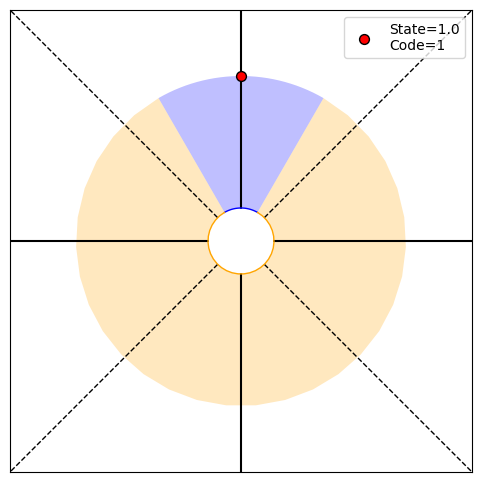

P(O1:8,S8|T)=[0.   0.25 0.   0.  ], P(O1:8|actions,T)=0.25, P(T|O1:8)=[0.24035608 0.75964392], H8=0.80
PRINT 1: 0.795631931823833, [0.   0.25 0.   0.  ]
PRINT 2: [0.03491698 0.03491698], [0.24035608 0.75964392]
Choosing randomly
Current angle: 0.0, Code received: 0.0


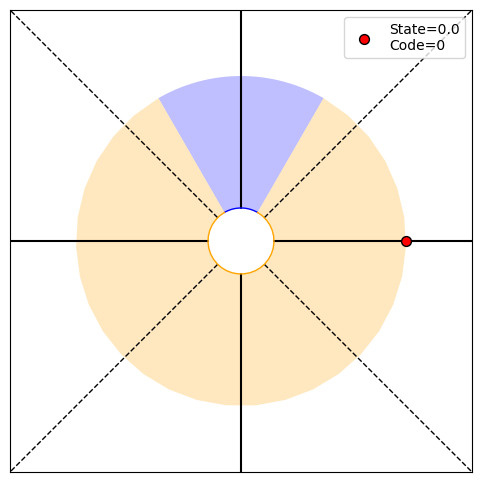

P(O1:9,S9|T)=[0.25 0.   0.25 0.25], P(O1:9|actions,T)=0.75, P(T|O1:9)=[0.3218543 0.6781457], H9=0.91
PRINT 1: 0.9063865582174682, [0.25 0.   0.25 0.25]
PRINT 2: [0.04197834 0.04197834], [0.3218543 0.6781457]
Choosing randomly
Current angle: -90.0, Code received: 0.0


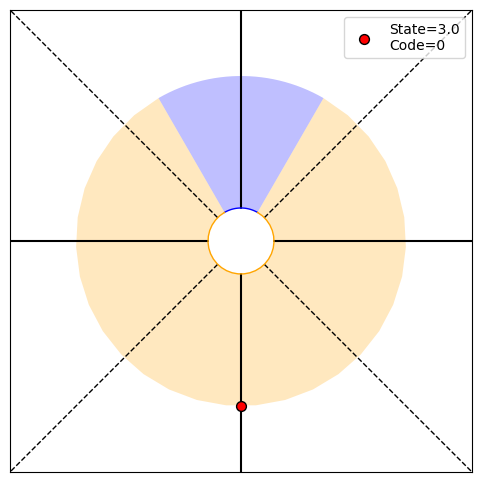

P(O1:10,S10|T)=[0.25 0.   0.25 0.25], P(O1:10|actions,T)=0.75, P(T|O1:10)=[0.41585853 0.58414147], H10=0.98
PRINT 1: 0.9794745259652784, [0.25 0.   0.25 0.25]
PRINT 2: [0.04706574 0.04706574], [0.41585853 0.58414147]
Choosing randomly
Current angle: -180.0, Code received: 0.0


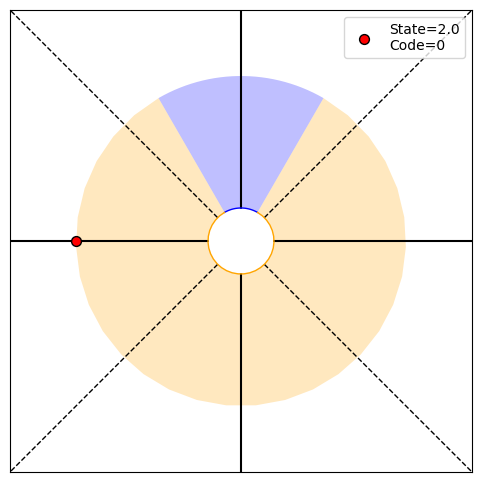

P(O1:11,S11|T)=[0.25 0.   0.25 0.25], P(O1:11|actions,T)=0.75, P(T|O1:11)=[0.51641086 0.48358914], H11=1.00
PRINT 1: 0.9992227775866966, [0.25 0.   0.25 0.25]
PRINT 2: [0.04881659 0.04881659], [0.51641086 0.48358914]
Choosing randomly
Current angle: -90.0, Code received: 0.0


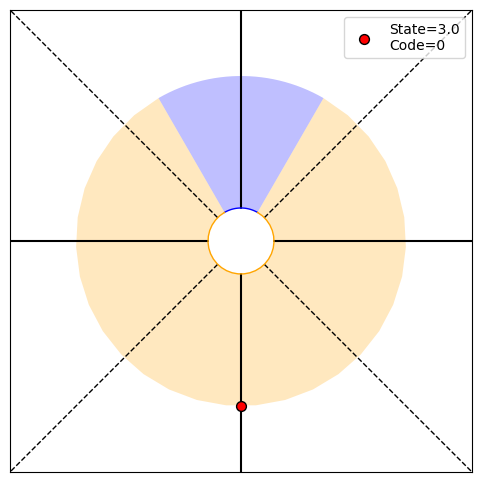

P(O1:12,S12|T)=[0.25 0.   0.25 0.25], P(O1:12|actions,T)=0.75, P(T|O1:12)=[0.61565168 0.38434832], H12=0.96
PRINT 1: 0.961055295370103, [0.25 0.   0.25 0.25]
PRINT 2: [0.04671179 0.04671179], [0.61565168 0.38434832]
Choosing randomly
Current angle: -180.0, Code received: 0.0


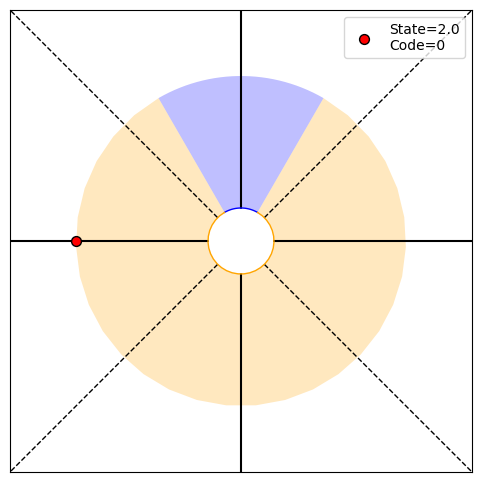

P(O1:13,S13|T)=[0.25 0.   0.25 0.25], P(O1:13|actions,T)=0.75, P(T|O1:13)=[0.70611659 0.29388341], H13=0.87
PRINT 1: 0.8736850055599468, [0.25 0.   0.25 0.25]
PRINT 2: [0.04137567 0.04137567], [0.70611659 0.29388341]
Choosing randomly
Current angle: -270.0, Code received: 1.0


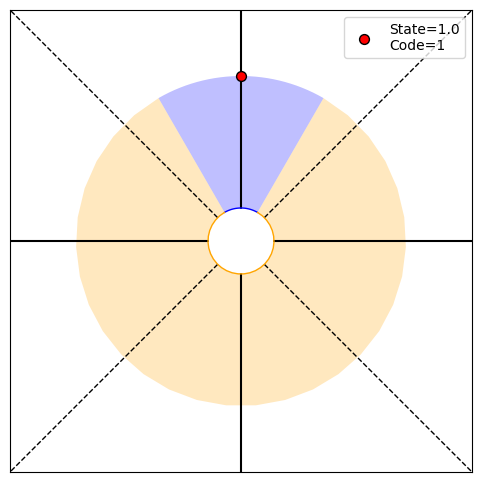

P(O1:14,S14|T)=[0.   0.25 0.   0.  ], P(O1:14|actions,T)=0.25, P(T|O1:14)=[0.54573433 0.45426567], H14=0.99
PRINT 1: 0.993956391346532, [0.   0.25 0.   0.  ]
PRINT 2: [0.04859582 0.04859582], [0.54573433 0.45426567]
Choosing randomly
Current angle: -360.0, Code received: 0.0


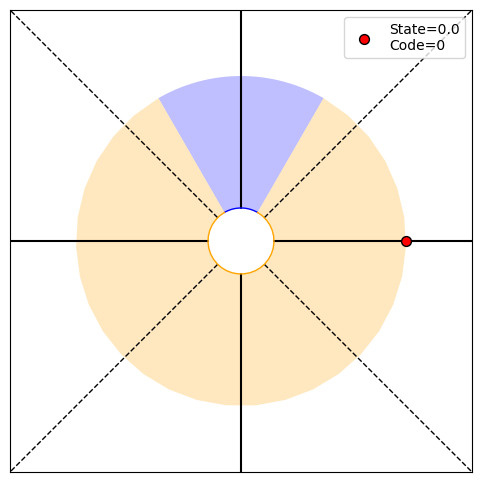

P(O1:15,S15|T)=[0.25 0.   0.25 0.25], P(O1:15|actions,T)=0.75, P(T|O1:15)=[0.6431162 0.3568838], H15=0.94
PRINT 1: 0.9400660693923761, [0.25 0.   0.25 0.25]
PRINT 2: [0.04544135 0.04544135], [0.6431162 0.3568838]
Choosing randomly
Current angle: -450.0, Code received: 0.0


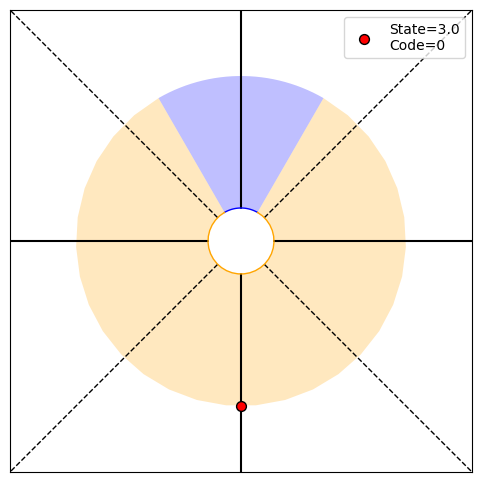

P(O1:16,S16|T)=[0.25 0.   0.25 0.25], P(O1:16|actions,T)=0.75, P(T|O1:16)=[0.72995224 0.27004776], H16=0.84
PRINT 1: 0.841533157261626, [0.25 0.   0.25 0.25]
PRINT 2: [0.03941319 0.03941319], [0.72995224 0.27004776]
Choosing randomly
Current angle: -360.0, Code received: 0.0


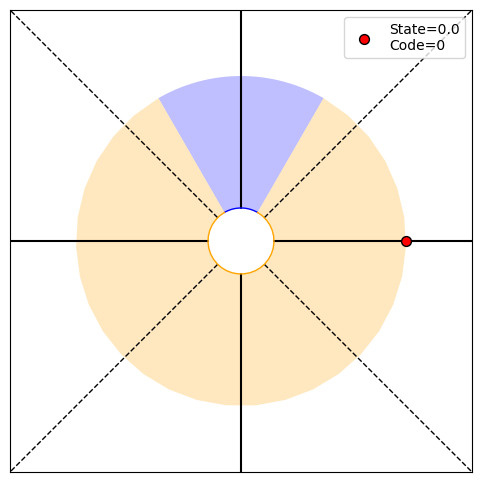

P(O1:17,S17|T)=[0.25 0.   0.25 0.25], P(O1:17|actions,T)=0.75, P(T|O1:17)=[0.80215935 0.19784065], H17=0.72
PRINT 1: 0.7175883081918434, [0.25 0.   0.25 0.25]
PRINT 2: [0.03201502 0.03201502], [0.80215935 0.19784065]
Choosing randomly
Current angle: -450.0, Code received: 0.0


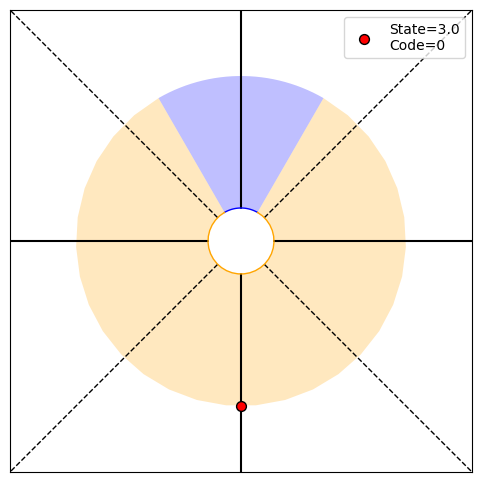

P(O1:18,S18|T)=[0.25 0.   0.25 0.25], P(O1:18|actions,T)=0.75, P(T|O1:18)=[0.85879415 0.14120585], H18=0.59
PRINT 1: 0.5873881321508871, [0.25 0.   0.25 0.25]
PRINT 2: [0.02464749 0.02464749], [0.85879415 0.14120585]
Choosing randomly
Current angle: -540.0, Code received: 0.0


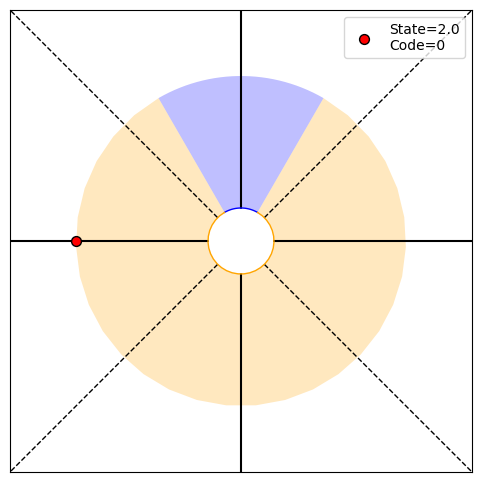

P(O1:19,S19|T)=[0.25 0.   0.25 0.25], P(O1:19|actions,T)=0.75, P(T|O1:19)=[0.901213 0.098787], H19=0.47
PRINT 1: 0.4651386405803837, [0.25 0.   0.25 0.25]
PRINT 2: [0.01820234 0.01820234], [0.901213 0.098787]
Choosing randomly
Current angle: -450.0, Code received: 0.0


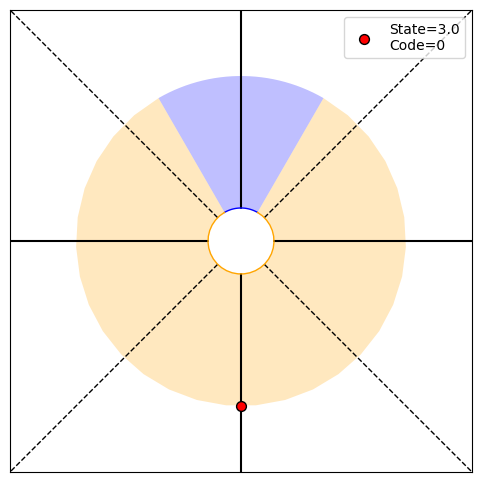

P(O1:20,S20|T)=[0.25 0.   0.25 0.25], P(O1:20|actions,T)=0.75, P(T|O1:20)=[0.93189952 0.06810048], H20=0.36
PRINT 1: 0.3587946990783934, [0.25 0.   0.25 0.25]
PRINT 2: [0.01303323 0.01303323], [0.93189952 0.06810048]
Choosing randomly
Current angle: -540.0, Code received: 0.0


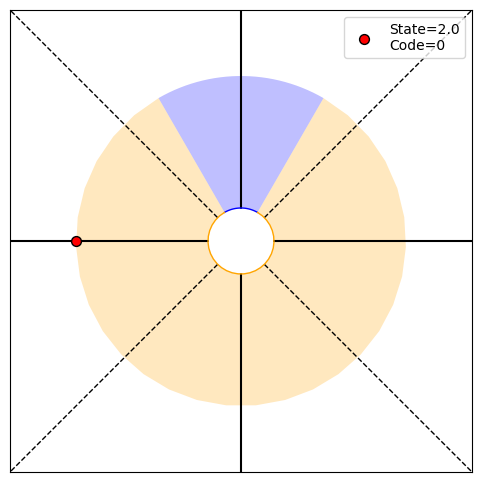

P(O1:21,S21|T)=[0.25 0.   0.25 0.25], P(O1:21|actions,T)=0.75, P(T|O1:21)=[0.95354515 0.04645485], H21=0.27
PRINT 1: 0.27114213698675205, [0.25 0.   0.25 0.25]
PRINT 2: [0.00912657 0.00912657], [0.95354515 0.04645485]
Choosing randomly
Current angle: -630.0, Code received: 1.0


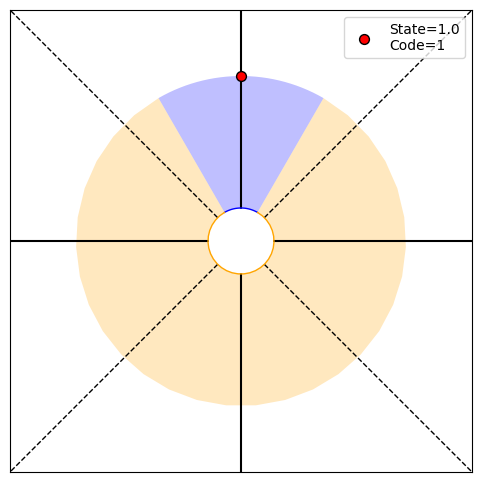

P(O1:22,S22|T)=[0.   0.25 0.   0.  ], P(O1:22|actions,T)=0.25, P(T|O1:22)=[0.9112148 0.0887852], H22=0.43
PRINT 1: 0.43240193262259874, [0.   0.25 0.   0.  ]
PRINT 2: [0.01656473 0.01656473], [0.9112148 0.0887852]
Choosing randomly
Current angle: -720.0, Code received: 0.0


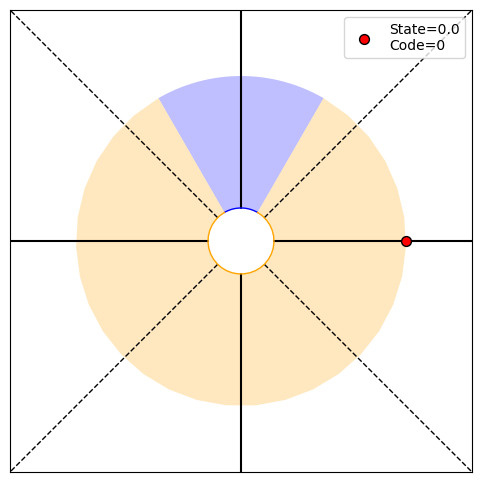

P(O1:23,S23|T)=[0.25 0.   0.25 0.25], P(O1:23|actions,T)=0.75, P(T|O1:23)=[0.9390047 0.0609953], H23=0.33
PRINT 1: 0.33138326487777103, [0.25 0.   0.25 0.25]
PRINT 2: [0.0117748 0.0117748], [0.9390047 0.0609953]
Choosing randomly
Current angle: -630.0, Code received: 1.0


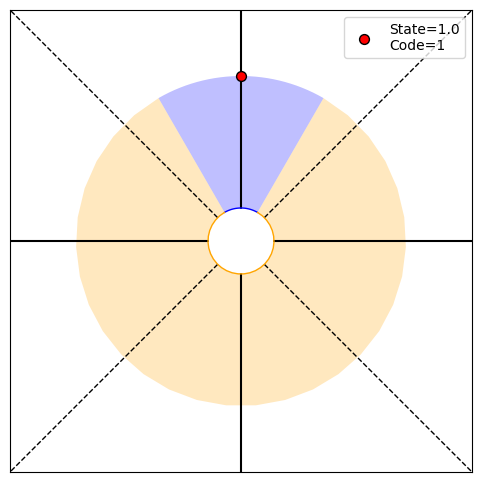

P(O1:24,S24|T)=[0.   0.25 0.   0.  ], P(O1:24|actions,T)=0.25, P(T|O1:24)=[0.8850225 0.1149775], H24=0.51
PRINT 1: 0.5147494196551956, [0.   0.25 0.   0.  ]
PRINT 2: [0.02075739 0.02075739], [0.8850225 0.1149775]
Choosing randomly
Current angle: -720.0, Code received: 0.0


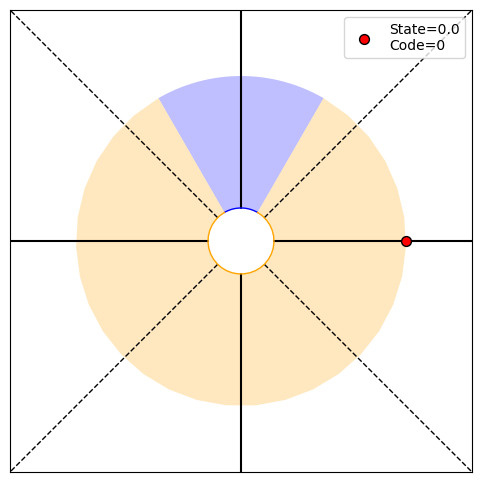

P(O1:25,S25|T)=[0.25 0.   0.25 0.25], P(O1:25|actions,T)=0.75, P(T|O1:25)=[0.92029351 0.07970649], H25=0.40
PRINT 1: 0.40114413309923114, [0.25 0.   0.25 0.25]
PRINT 2: [0.01503884 0.01503884], [0.92029351 0.07970649]
Choosing randomly
Current angle: -630.0, Code received: 1.0


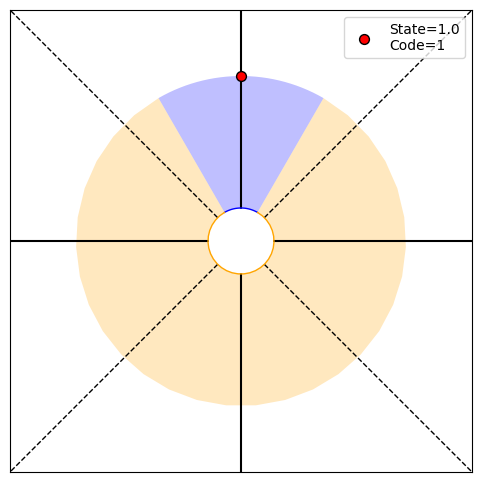

P(O1:26,S26|T)=[0.   0.25 0.   0.  ], P(O1:26|actions,T)=0.25, P(T|O1:26)=[0.85235527 0.14764473], H26=0.60
PRINT 1: 0.6039147220322787, [0.   0.25 0.   0.  ]
PRINT 2: [0.02555581 0.02555581], [0.85235527 0.14764473]
Choosing randomly
Current angle: -540.0, Code received: 0.0


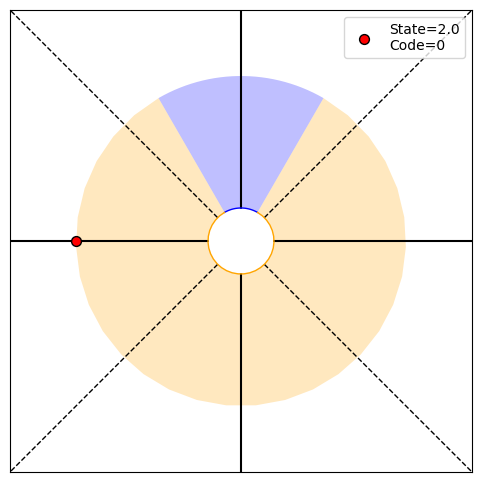

P(O1:27,S27|T)=[0.25 0.   0.25 0.25], P(O1:27|actions,T)=0.75, P(T|O1:27)=[0.89647522 0.10352478], H27=0.48
PRINT 1: 0.48007033596434506, [0.25 0.   0.25 0.25]
PRINT 2: [0.01896225 0.01896225], [0.89647522 0.10352478]
Choosing randomly
Current angle: -450.0, Code received: 0.0


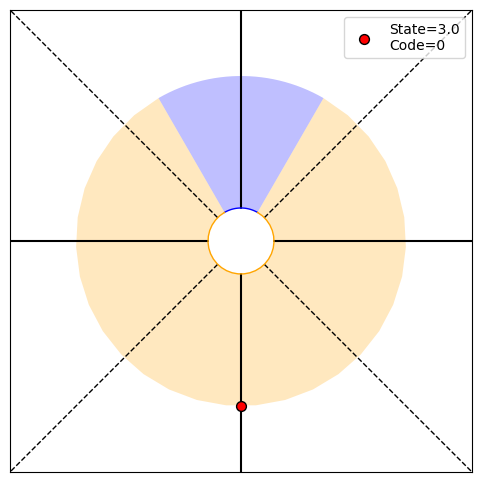

P(O1:28,S28|T)=[0.25 0.   0.25 0.25], P(O1:28|actions,T)=0.75, P(T|O1:28)=[0.92851671 0.07148329], H28=0.37
PRINT 1: 0.3714347630181506, [0.25 0.   0.25 0.25]
PRINT 2: [0.0136242 0.0136242], [0.92851671 0.07148329]
Choosing randomly
Current angle: -360.0, Code received: 0.0


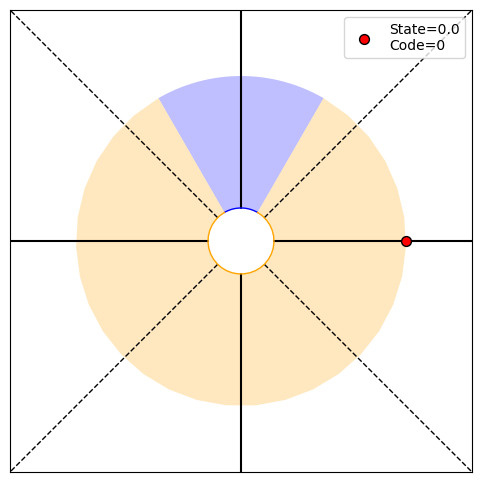

P(O1:29,S29|T)=[0.25 0.   0.25 0.25], P(O1:29|actions,T)=0.75, P(T|O1:29)=[0.95118123 0.04881877], H29=0.28
PRINT 1: 0.2813578116204947, [0.25 0.   0.25 0.25]
PRINT 2: [0.0095638 0.0095638], [0.95118123 0.04881877]
Choosing randomly
Current angle: -270.0, Code received: 1.0


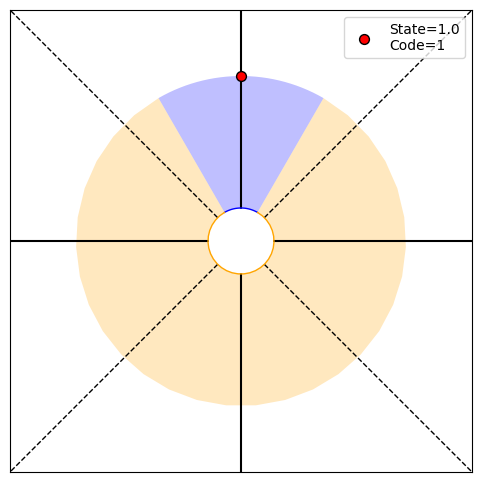

P(O1:30,S30|T)=[0.   0.25 0.   0.  ], P(O1:30|actions,T)=0.25, P(T|O1:30)=[0.90690715 0.09309285], H30=0.45
PRINT 1: 0.44670996342087343, [0.   0.25 0.   0.  ]
PRINT 2: [0.0172756 0.0172756], [0.90690715 0.09309285]
Choosing randomly
Current angle: -180.0, Code received: 0.0


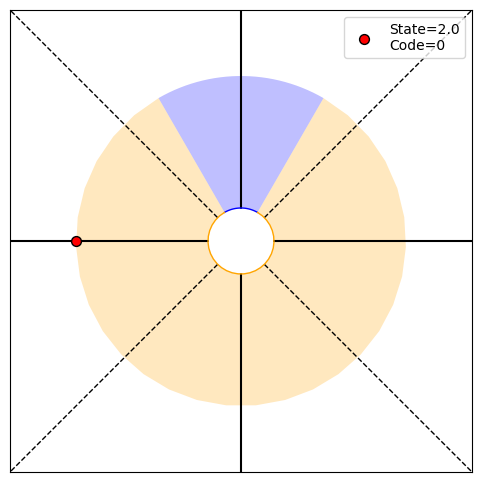

P(O1:31,S31|T)=[0.25 0.   0.25 0.25], P(O1:31|actions,T)=0.75, P(T|O1:31)=[0.93595058 0.06404942], H31=0.34
PRINT 1: 0.3433141394917898, [0.25 0.   0.25 0.25]
PRINT 2: [0.01231859 0.01231859], [0.93595058 0.06404942]
Choosing randomly
Current angle: -90.0, Code received: 0.0


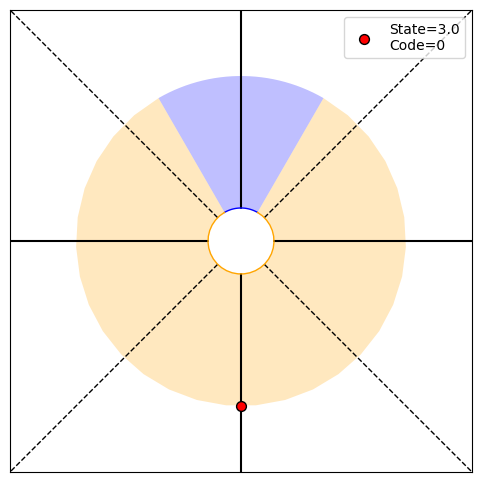

P(O1:32,S32|T)=[0.25 0.   0.25 0.25], P(O1:32|actions,T)=0.75, P(T|O1:32)=[0.95636887 0.04363113], H32=0.26
PRINT 1: 0.25869996169998866, [0.25 0.   0.25 0.25]
PRINT 2: [0.00860087 0.00860087], [0.95636887 0.04363113]
Choosing randomly
Current angle: -180.0, Code received: 0.0


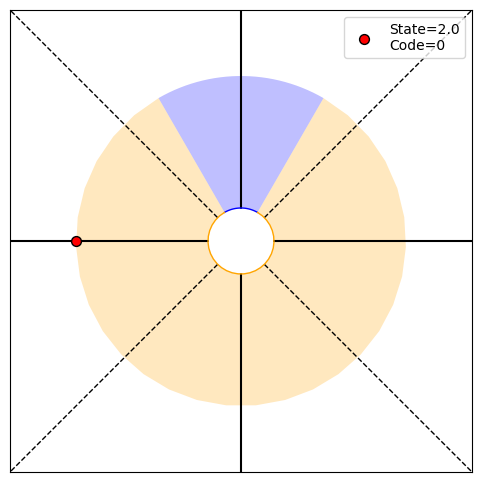

P(O1:33,S33|T)=[0.25 0.   0.25 0.25], P(O1:33|actions,T)=0.75, P(T|O1:33)=[0.9704833 0.0295167], H33=0.19
PRINT 1: 0.19196231481406723, [0.25 0.   0.25 0.25]
PRINT 2: [0.00591713 0.00591713], [0.9704833 0.0295167]
Choosing randomly
Current angle: -90.0, Code received: 0.0


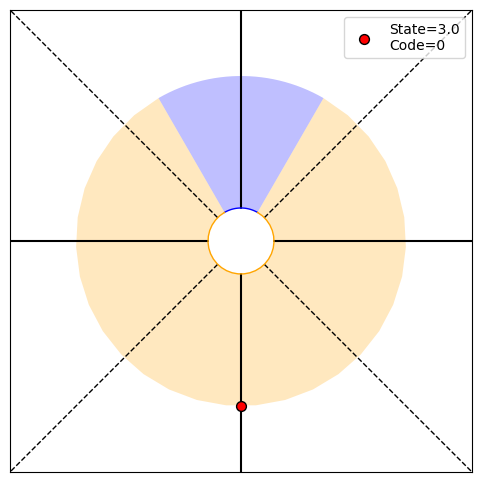

P(O1:34,S34|T)=[0.25 0.   0.25 0.25], P(O1:34|actions,T)=0.75, P(T|O1:34)=[0.98012667 0.01987333], H34=0.14
PRINT 1: 0.14072874742818167, [0.25 0.   0.25 0.25]
PRINT 2: [0.00402954 0.00402954], [0.98012667 0.01987333]
Choosing randomly
Current angle: -180.0, Code received: 0.0


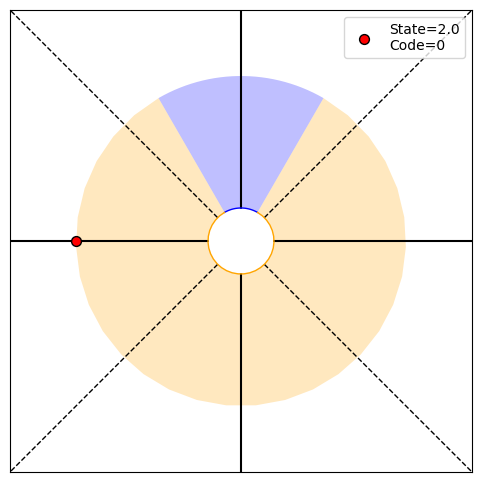

P(O1:35,S35|T)=[0.25 0.   0.25 0.25], P(O1:35|actions,T)=0.75, P(T|O1:35)=[0.98666276 0.01333724], H35=0.10
PRINT 1: 0.10218229309121422, [0.25 0.   0.25 0.25]
PRINT 2: [0.00272508 0.00272508], [0.98666276 0.01333724]
Choosing randomly
Current angle: -90.0, Code received: 0.0


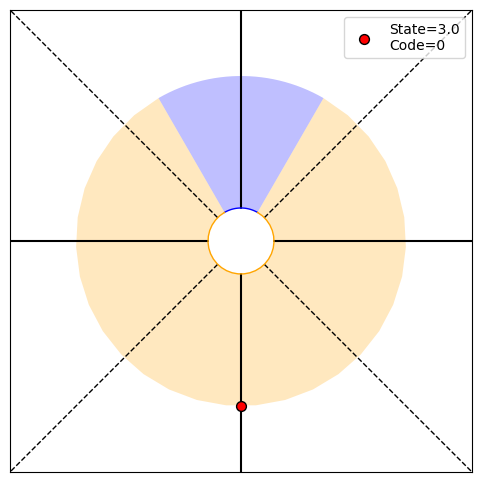

P(O1:36,S36|T)=[0.25 0.   0.25 0.25], P(O1:36|actions,T)=0.75, P(T|O1:36)=[0.9910688 0.0089312], H36=0.07
PRINT 1: 0.07362133602616586, [0.25 0.   0.25 0.25]
PRINT 2: [0.00183425 0.00183425], [0.9910688 0.0089312]
Choosing randomly
Current angle: 0.0, Code received: 0.0


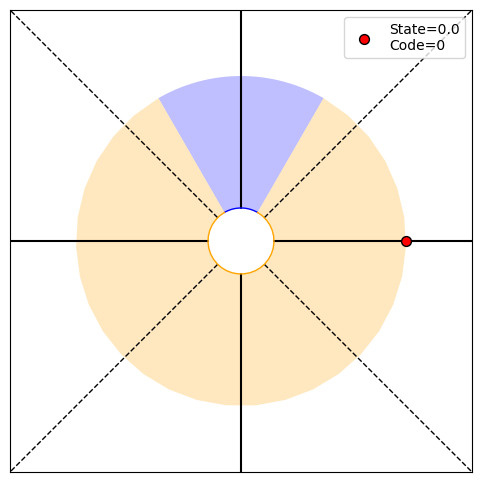

P(O1:37,S37|T)=[0.25 0.   0.25 0.25], P(O1:37|actions,T)=0.75, P(T|O1:37)=[0.99402809 0.00597191], H37=0.05
PRINT 1: 0.052707912513058855, [0.25 0.   0.25 0.25]
PRINT 2: [0.00123072 0.00123072], [0.99402809 0.00597191]
Choosing randomly
Current angle: -90.0, Code received: 0.0


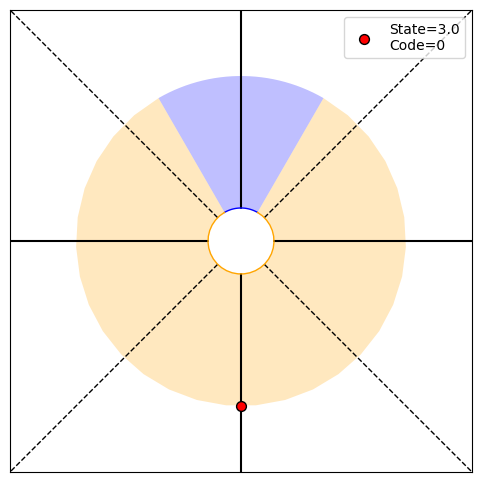

P(O1:38,S38|T)=[0.25 0.   0.25 0.25], P(O1:38|actions,T)=0.75, P(T|O1:38)=[0.99601078 0.00398922], H38=0.04
PRINT 1: 0.037536493977993225, [0.25 0.   0.25 0.25]
PRINT 2: [0.00082401 0.00082401], [0.99601078 0.00398922]
Choosing randomly
Current angle: -180.0, Code received: 0.0


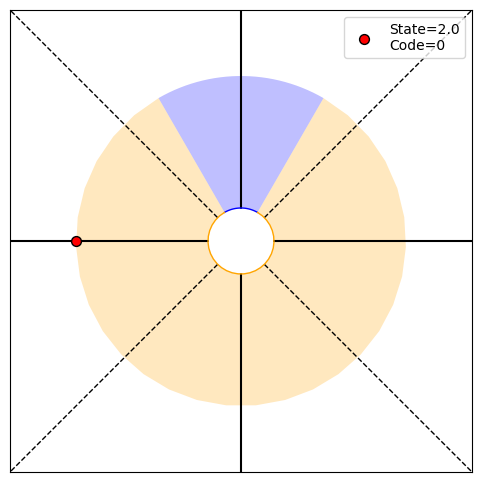

P(O1:39,S39|T)=[0.25 0.   0.25 0.25], P(O1:39|actions,T)=0.75, P(T|O1:39)=[0.99733698 0.00266302], H39=0.03
PRINT 1: 0.026612856230980874, [0.25 0.   0.25 0.25]
PRINT 2: [0.00055092 0.00055092], [0.99733698 0.00266302]
Choosing randomly
Current angle: -90.0, Code received: 0.0


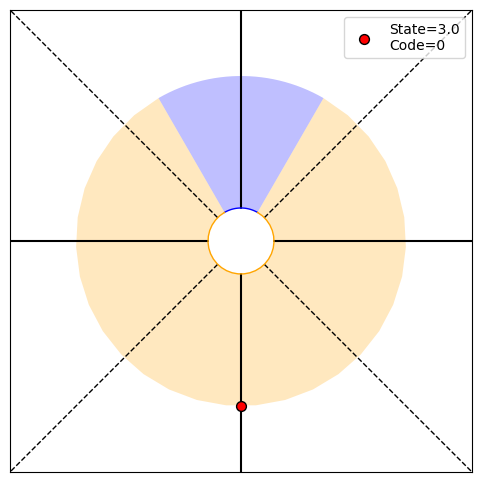

P(O1:40,S40|T)=[0.25 0.   0.25 0.25], P(O1:40|actions,T)=0.75, P(T|O1:40)=[0.99822308 0.00177692], H40=0.02
PRINT 1: 0.018795961149158543, [0.25 0.   0.25 0.25]
PRINT 2: [0.00036799 0.00036799], [0.99822308 0.00177692]
Choosing randomly
Current angle: 0.0, Code received: 0.0


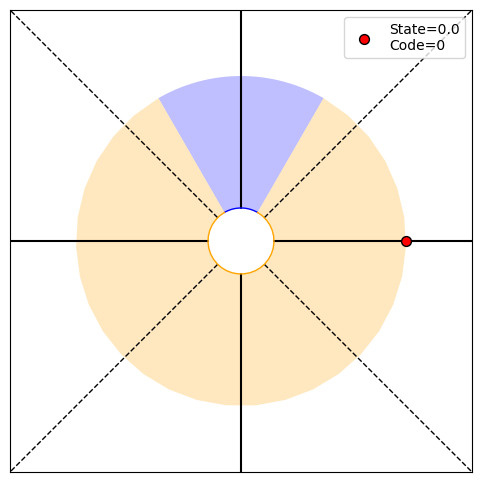

P(O1:41,S41|T)=[0.25 0.   0.25 0.25], P(O1:41|actions,T)=0.75, P(T|O1:41)=[0.99881468 0.00118532], H41=0.01
PRINT 1: 0.013230926437444003, [0.25 0.   0.25 0.25]
PRINT 2: [0.00024564 0.00024564], [0.99881468 0.00118532]
Choosing randomly
Current angle: 90.0, Code received: 1.0


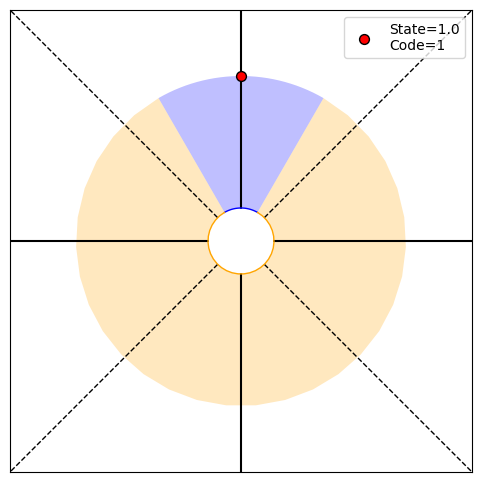

P(O1:42,S42|T)=[0.   0.25 0.   0.  ], P(O1:42|actions,T)=0.25, P(T|O1:42)=[0.99763217 0.00236783], H42=0.02
PRINT 1: 0.02406472108581188, [0.   0.25 0.   0.  ]
PRINT 2: [0.00049002 0.00049002], [0.99763217 0.00236783]
Choosing randomly
Current angle: 0.0, Code received: 0.0


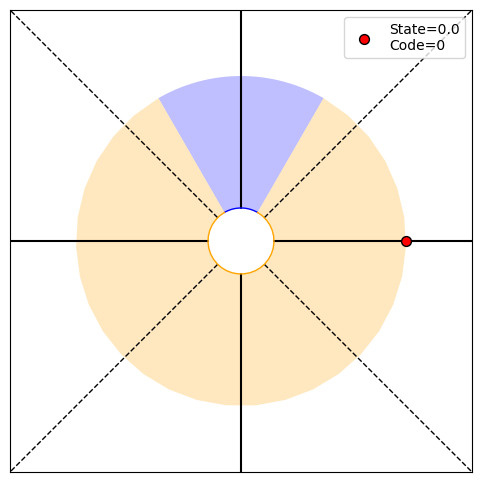

P(O1:43,S43|T)=[0.25 0.   0.25 0.25], P(O1:43|actions,T)=0.75, P(T|O1:43)=[0.9984202 0.0015798], H43=0.02
PRINT 1: 0.01697904249948225, [0.25 0.   0.25 0.25]
PRINT 2: [0.00032724 0.00032724], [0.9984202 0.0015798]
Choosing randomly
Current angle: -90.0, Code received: 0.0


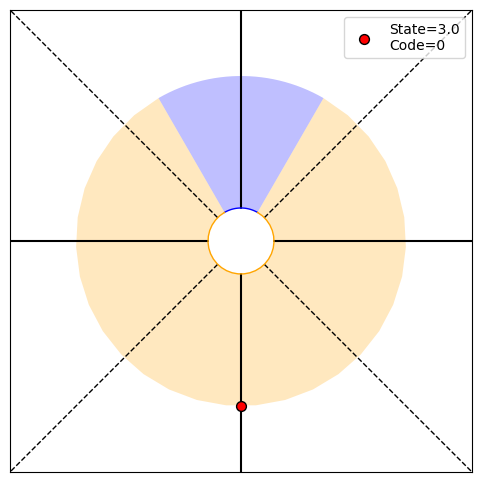

P(O1:44,S44|T)=[0.25 0.   0.25 0.25], P(O1:44|actions,T)=0.75, P(T|O1:44)=[0.99894625 0.00105375], H44=0.01
PRINT 1: 0.011941331636332, [0.25 0.   0.25 0.25]
PRINT 2: [0.00021841 0.00021841], [0.99894625 0.00105375]
Choosing randomly
Current angle: -180.0, Code received: 0.0


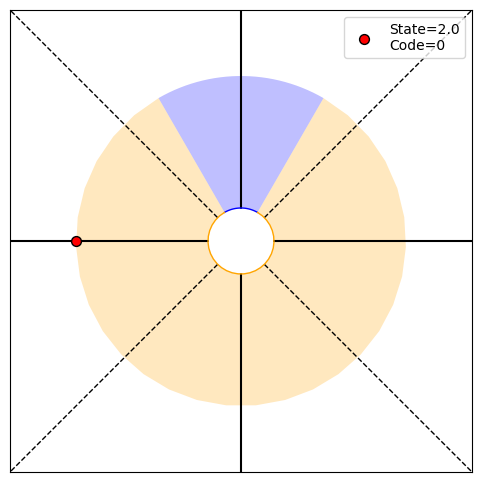

P(O1:45,S45|T)=[0.25 0.   0.25 0.25], P(O1:45|actions,T)=0.75, P(T|O1:45)=[9.9929725e-01 7.0274956e-04], H45=0.01
PRINT 1: 0.00837458901041598, [0.25 0.   0.25 0.25]
PRINT 2: [0.00014571 0.00014571], [9.9929725e-01 7.0274956e-04]
Choosing randomly
Current angle: -270.0, Code received: 1.0


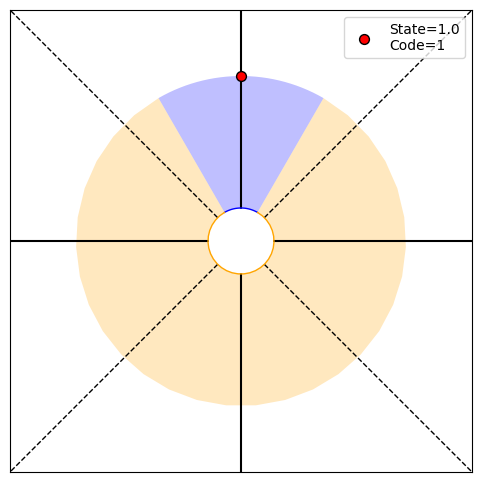

P(O1:46,S46|T)=[0.   0.25 0.   0.  ], P(O1:46|actions,T)=0.25, P(T|O1:46)=[0.99859549 0.00140451], H46=0.02
PRINT 1: 0.015333615694880173, [0.   0.25 0.   0.  ]
PRINT 2: [0.00029099 0.00029099], [0.99859549 0.00140451]
Choosing randomly
Current angle: -180.0, Code received: 0.0


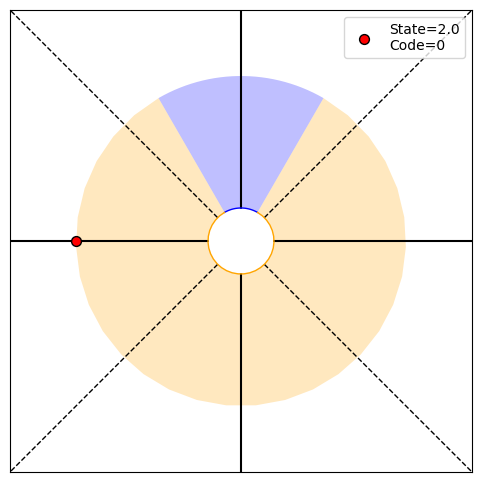

P(O1:47,S47|T)=[0.25 0.   0.25 0.25], P(O1:47|actions,T)=0.75, P(T|O1:47)=[9.99063220e-01 9.36779972e-04], H47=0.01
PRINT 1: 0.010774863132034263, [0.25 0.   0.25 0.25]
PRINT 2: [0.00019419 0.00019419], [9.99063220e-01 9.36779972e-04]
Choosing randomly
Current angle: -90.0, Code received: 0.0


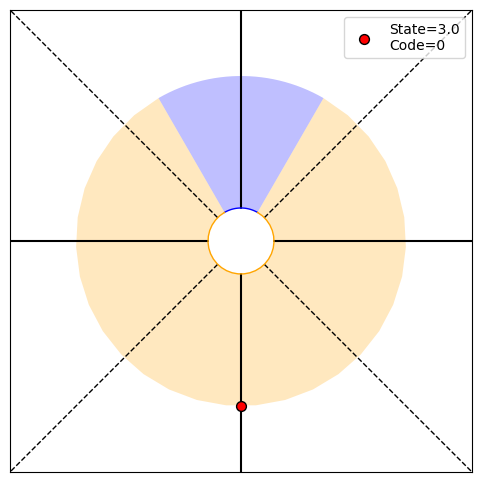

P(O1:48,S48|T)=[0.25 0.   0.25 0.25], P(O1:48|actions,T)=0.75, P(T|O1:48)=[9.99375285e-01 6.24715055e-04], H48=0.01
PRINT 1: 0.007550779934184765, [0.25 0.   0.25 0.25]
PRINT 2: [0.00012955 0.00012955], [9.99375285e-01 6.24715055e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


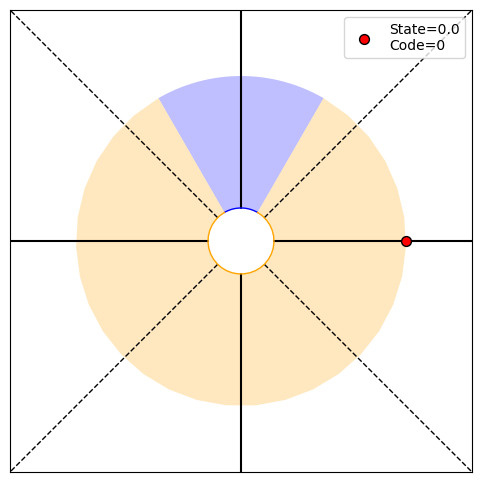

P(O1:49,S49|T)=[0.25 0.   0.25 0.25], P(O1:49|actions,T)=0.75, P(T|O1:49)=[9.99583437e-01 4.16563448e-04], H49=0.01
PRINT 1: 0.005278513154961957, [0.25 0.   0.25 0.25]
PRINT 2: [8.64030057e-05 8.64030057e-05], [9.99583437e-01 4.16563448e-04]
Choosing randomly
Current angle: 90.0, Code received: 1.0


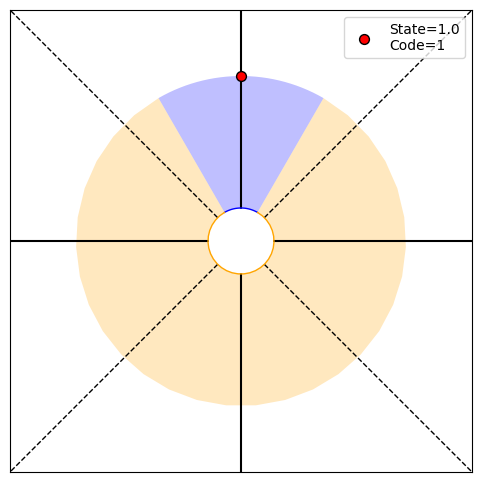

P(O1:50,S50|T)=[0.   0.25 0.   0.  ], P(O1:50|actions,T)=0.25, P(T|O1:50)=[9.9916722e-01 8.3277999e-04], H50=0.01
PRINT 1: 0.00972010071937204, [0.   0.25 0.   0.  ]
PRINT 2: [0.00017265 0.00017265], [9.9916722e-01 8.3277999e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


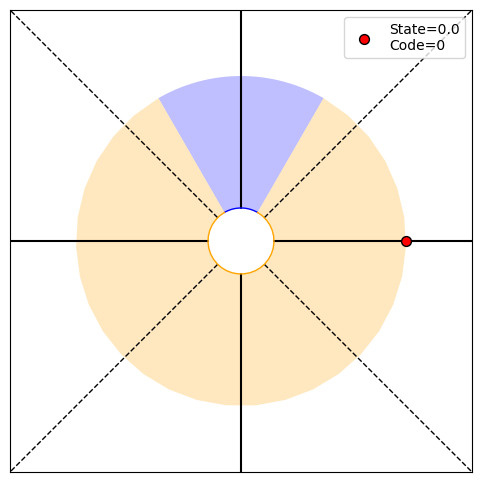

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.04730118 0.04730118], [0.6 0.4]
Choosing randomly
Current angle: 90.0, Code received: 1.0


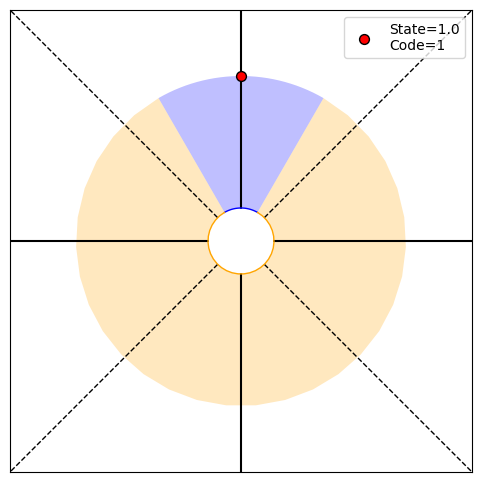

P(O1:2,S2|T)=[0.   0.25 0.   0.  ], P(O1:2|actions,T)=0.25, P(T|O1:2)=[0.42857143 0.57142857], H2=0.99
PRINT 1: 0.9852281360342514, [0.   0.25 0.   0.  ]
PRINT 2: [0.04749944 0.04749944], [0.42857143 0.57142857]
Choosing randomly
Current angle: 180.0, Code received: 0.0


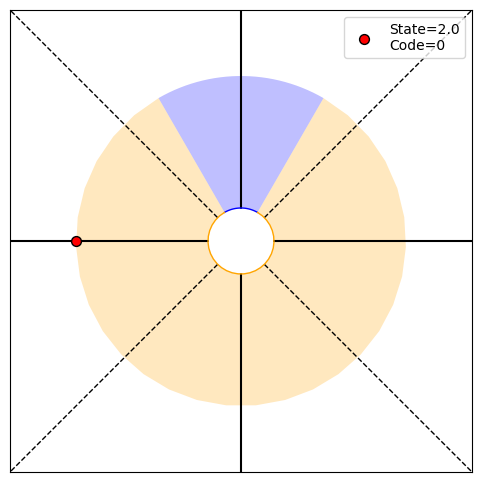

P(O1:3,S3|T)=[0.25 0.   0.25 0.25], P(O1:3|actions,T)=0.75, P(T|O1:3)=[0.52941176 0.47058824], H3=1.00
PRINT 1: 0.9975025463691152, [0.25 0.   0.25 0.25]
PRINT 2: [0.04875988 0.04875988], [0.52941176 0.47058824]
Choosing randomly
Current angle: 90.0, Code received: 1.0


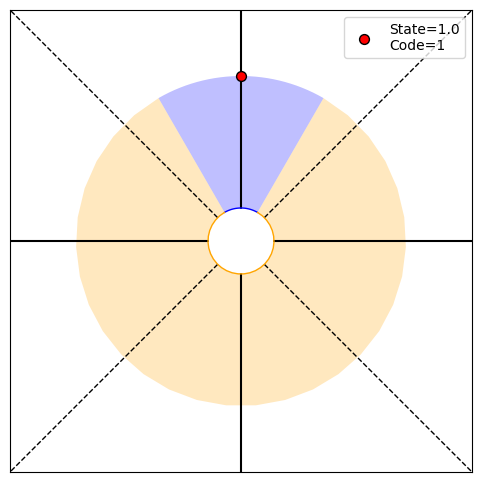

P(O1:4,S4|T)=[0.   0.25 0.   0.  ], P(O1:4|actions,T)=0.25, P(T|O1:4)=[0.36 0.64], H4=0.94
PRINT 1: 0.9426831892554923, [0.   0.25 0.   0.  ]
PRINT 2: [0.04444034 0.04444034], [0.36 0.64]
Choosing randomly
Current angle: 180.0, Code received: 0.0


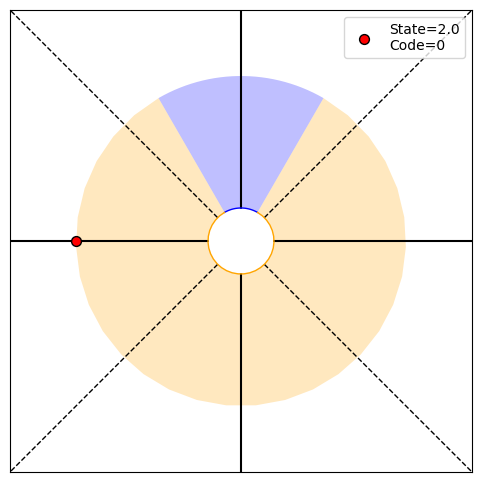

P(O1:5,S5|T)=[0.25 0.   0.25 0.25], P(O1:5|actions,T)=0.75, P(T|O1:5)=[0.45762712 0.54237288], H5=0.99
PRINT 1: 0.9948131754904235, [0.25 0.   0.25 0.25]
PRINT 2: [0.04826098 0.04826098], [0.45762712 0.54237288]
Choosing randomly
Current angle: 270.0, Code received: 0.0


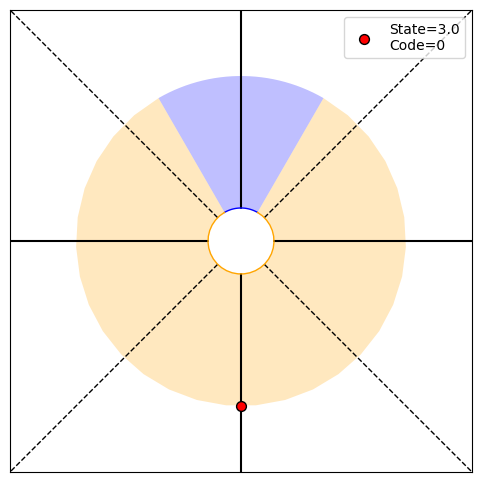

P(O1:6,S6|T)=[0.25 0.   0.25 0.25], P(O1:6|actions,T)=0.75, P(T|O1:6)=[0.55862069 0.44137931], H6=0.99
PRINT 1: 0.9900618470242131, [0.25 0.   0.25 0.25]
PRINT 2: [0.04839299 0.04839299], [0.55862069 0.44137931]
Choosing randomly
Current angle: 180.0, Code received: 0.0


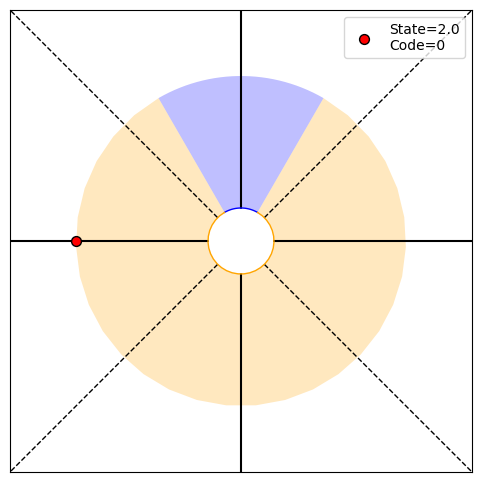

P(O1:7,S7|T)=[0.25 0.   0.25 0.25], P(O1:7|actions,T)=0.75, P(T|O1:7)=[0.65498652 0.34501348], H7=0.93
PRINT 1: 0.9295356505393888, [0.25 0.   0.25 0.25]
PRINT 2: [0.04479852 0.04479852], [0.65498652 0.34501348]
Choosing randomly
Current angle: 90.0, Code received: 1.0


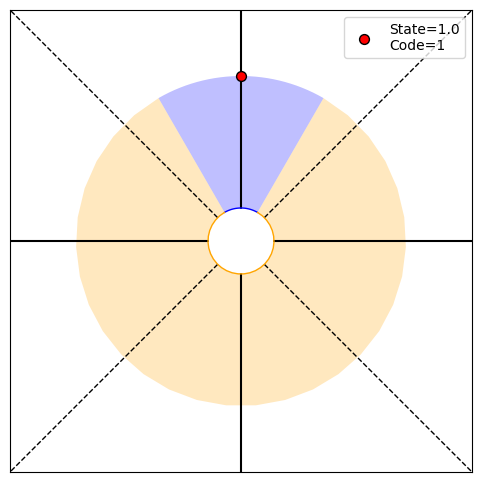

P(O1:8,S8|T)=[0.   0.25 0.   0.  ], P(O1:8|actions,T)=0.25, P(T|O1:8)=[0.48697395 0.51302605], H8=1.00
PRINT 1: 0.999510357288754, [0.   0.25 0.   0.  ]
PRINT 2: [0.04870398 0.04870398], [0.48697395 0.51302605]
Choosing randomly
Current angle: 180.0, Code received: 0.0


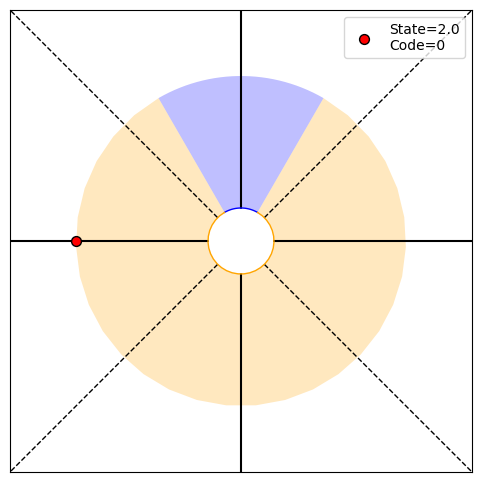

P(O1:9,S9|T)=[0.25 0.   0.25 0.25], P(O1:9|actions,T)=0.75, P(T|O1:9)=[0.58742949 0.41257051], H9=0.98
PRINT 1: 0.9778305281284734, [0.25 0.   0.25 0.25]
PRINT 2: [0.04770421 0.04770421], [0.58742949 0.41257051]
Choosing randomly
Current angle: 90.0, Code received: 1.0


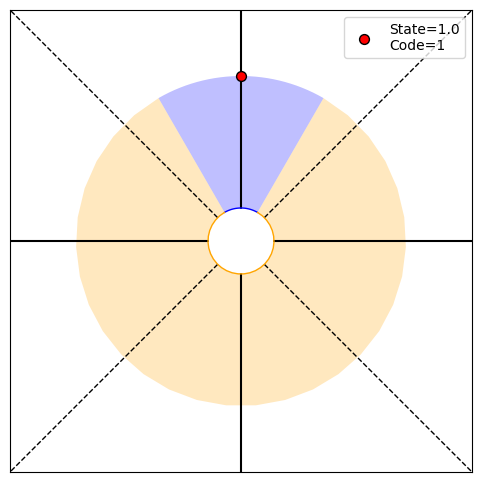

P(O1:10,S10|T)=[0.   0.25 0.   0.  ], P(O1:10|actions,T)=0.25, P(T|O1:10)=[0.41585853 0.58414147], H10=0.98
PRINT 1: 0.9794745259652784, [0.   0.25 0.   0.  ]
PRINT 2: [0.04706574 0.04706574], [0.41585853 0.58414147]
Choosing randomly
Current angle: 0.0, Code received: 0.0


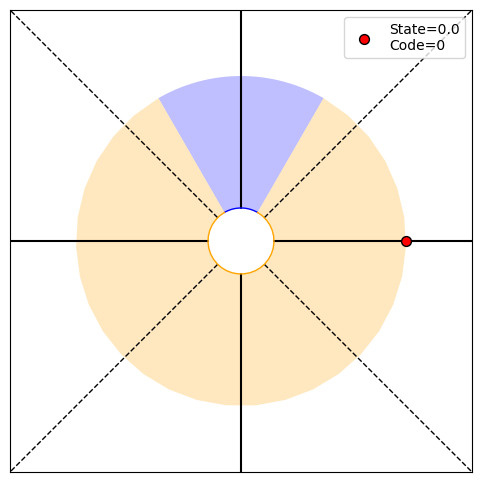

P(O1:11,S11|T)=[0.25 0.   0.25 0.25], P(O1:11|actions,T)=0.75, P(T|O1:11)=[0.51641086 0.48358914], H11=1.00
PRINT 1: 0.9992227775866968, [0.25 0.   0.25 0.25]
PRINT 2: [0.04881659 0.04881659], [0.51641086 0.48358914]
Choosing randomly
Current angle: -90.0, Code received: 0.0


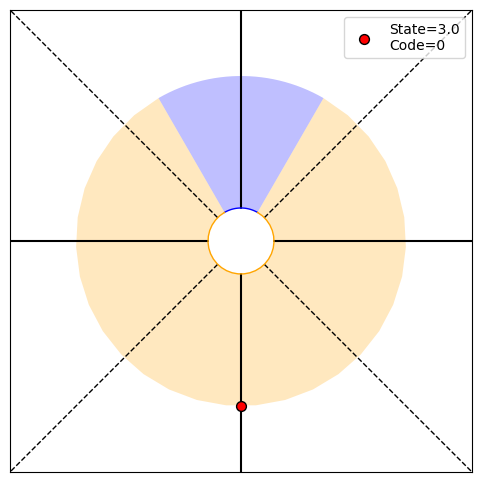

P(O1:12,S12|T)=[0.25 0.   0.25 0.25], P(O1:12|actions,T)=0.75, P(T|O1:12)=[0.61565168 0.38434832], H12=0.96
PRINT 1: 0.9610552953701034, [0.25 0.   0.25 0.25]
PRINT 2: [0.04671179 0.04671179], [0.61565168 0.38434832]
Choosing randomly
Current angle: 0.0, Code received: 0.0


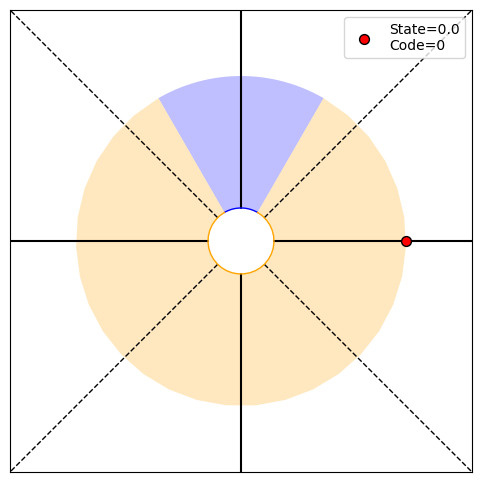

P(O1:13,S13|T)=[0.25 0.   0.25 0.25], P(O1:13|actions,T)=0.75, P(T|O1:13)=[0.70611659 0.29388341], H13=0.87
PRINT 1: 0.8736850055599468, [0.25 0.   0.25 0.25]
PRINT 2: [0.04137567 0.04137567], [0.70611659 0.29388341]
Choosing randomly
Current angle: -90.0, Code received: 0.0


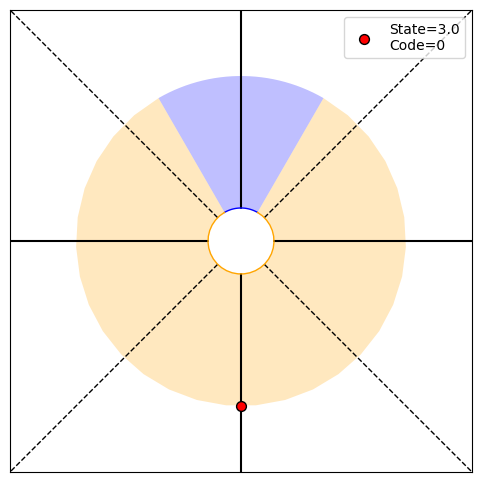

P(O1:14,S14|T)=[0.25 0.   0.25 0.25], P(O1:14|actions,T)=0.75, P(T|O1:14)=[0.78280063 0.21719937], H14=0.76
PRINT 1: 0.7550205603604176, [0.25 0.   0.25 0.25]
PRINT 2: [0.03421526 0.03421526], [0.78280063 0.21719937]
Choosing randomly
Current angle: -180.0, Code received: 0.0


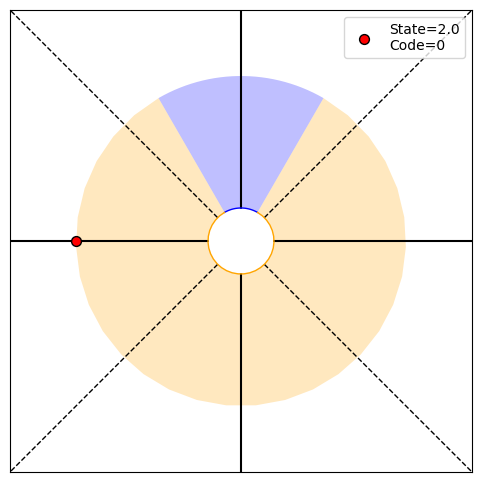

P(O1:15,S15|T)=[0.25 0.   0.25 0.25], P(O1:15|actions,T)=0.75, P(T|O1:15)=[0.84389872 0.15610128], H15=0.62
PRINT 1: 0.6249004522336764, [0.25 0.   0.25 0.25]
PRINT 2: [0.02672101 0.02672101], [0.84389872 0.15610128]
Choosing randomly
Current angle: -270.0, Code received: 1.0


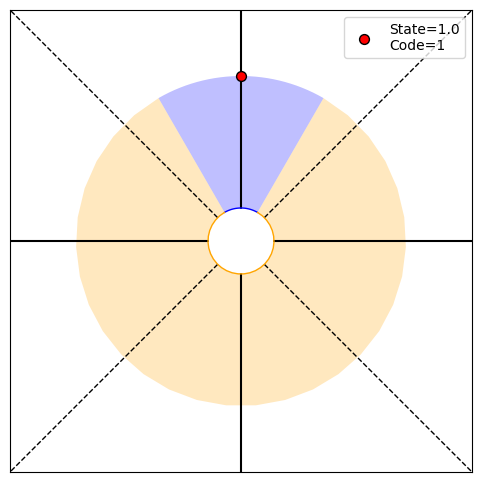

P(O1:16,S16|T)=[0.   0.25 0.   0.  ], P(O1:16|actions,T)=0.25, P(T|O1:16)=[0.72995224 0.27004776], H16=0.84
PRINT 1: 0.8415331572616258, [0.   0.25 0.   0.  ]
PRINT 2: [0.03941319 0.03941319], [0.72995224 0.27004776]
Choosing randomly
Current angle: -360.0, Code received: 0.0


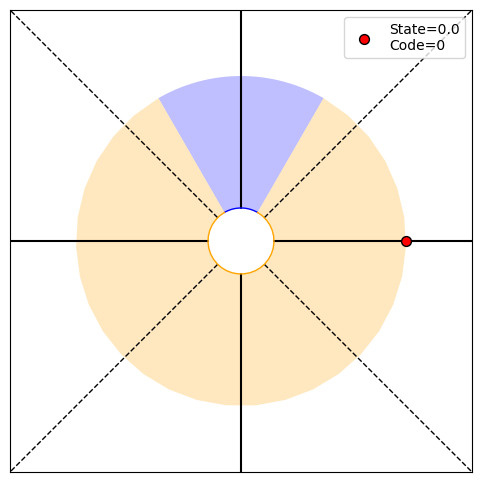

P(O1:17,S17|T)=[0.25 0.   0.25 0.25], P(O1:17|actions,T)=0.75, P(T|O1:17)=[0.80215935 0.19784065], H17=0.72
PRINT 1: 0.7175883081918432, [0.25 0.   0.25 0.25]
PRINT 2: [0.03201502 0.03201502], [0.80215935 0.19784065]
Choosing randomly
Current angle: -450.0, Code received: 0.0


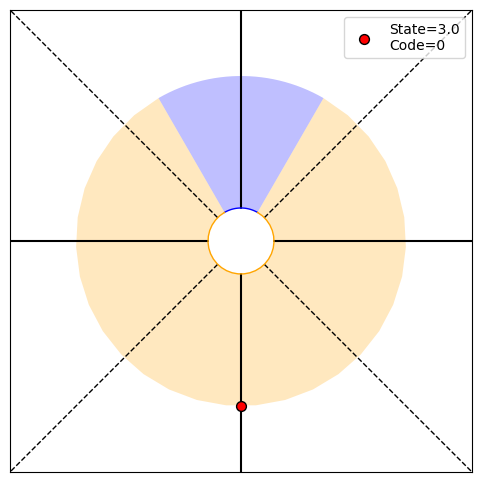

P(O1:18,S18|T)=[0.25 0.   0.25 0.25], P(O1:18|actions,T)=0.75, P(T|O1:18)=[0.85879415 0.14120585], H18=0.59
PRINT 1: 0.5873881321508871, [0.25 0.   0.25 0.25]
PRINT 2: [0.02464749 0.02464749], [0.85879415 0.14120585]
Choosing randomly
Current angle: -360.0, Code received: 0.0


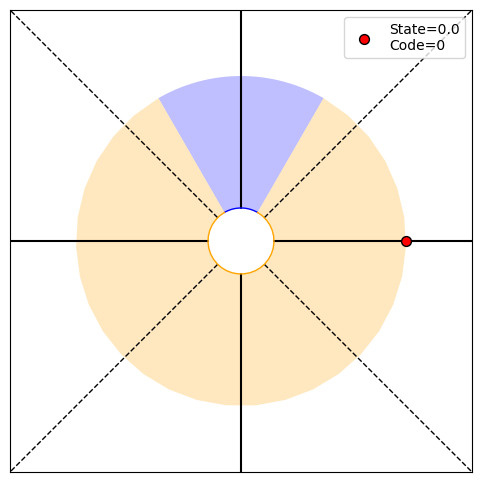

P(O1:19,S19|T)=[0.25 0.   0.25 0.25], P(O1:19|actions,T)=0.75, P(T|O1:19)=[0.901213 0.098787], H19=0.47
PRINT 1: 0.4651386405803837, [0.25 0.   0.25 0.25]
PRINT 2: [0.01820234 0.01820234], [0.901213 0.098787]
Choosing randomly
Current angle: -270.0, Code received: 1.0


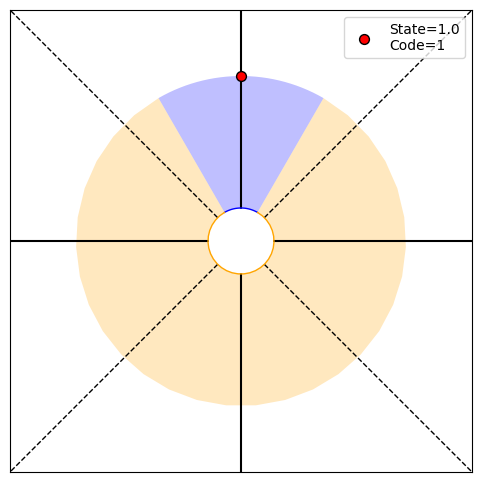

P(O1:20,S20|T)=[0.   0.25 0.   0.  ], P(O1:20|actions,T)=0.25, P(T|O1:20)=[0.82018899 0.17981101], H20=0.68
PRINT 1: 0.6796634328820731, [0.   0.25 0.   0.  ]
PRINT 2: [0.029821 0.029821], [0.82018899 0.17981101]
Choosing randomly
Current angle: -180.0, Code received: 0.0


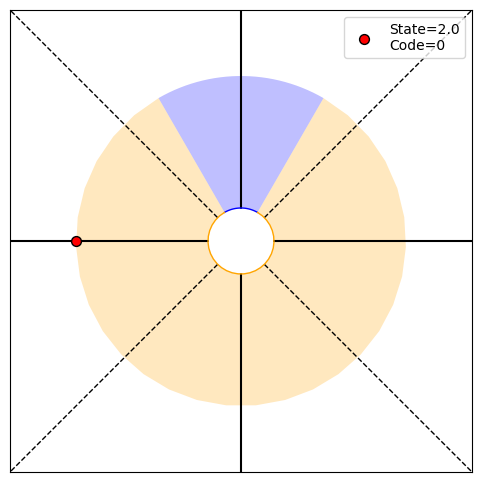

P(O1:21,S21|T)=[0.25 0.   0.25 0.25], P(O1:21|actions,T)=0.75, P(T|O1:21)=[0.87248301 0.12751699], H21=0.55
PRINT 1: 0.550588993317278, [0.25 0.   0.25 0.25]
PRINT 2: [0.02265543 0.02265543], [0.87248301 0.12751699]
Choosing randomly
Current angle: -270.0, Code received: 1.0


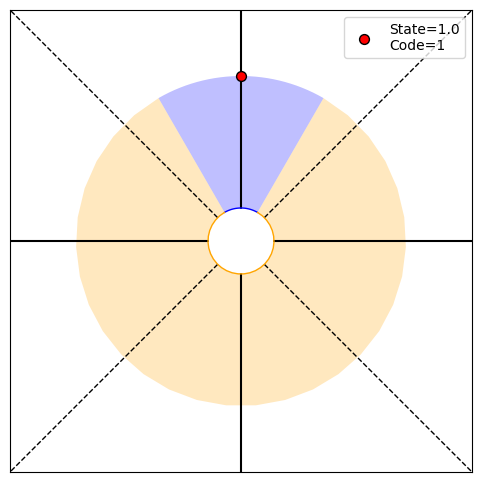

P(O1:22,S22|T)=[0.   0.25 0.   0.  ], P(O1:22|actions,T)=0.25, P(T|O1:22)=[0.77380919 0.22619081], H22=0.77
PRINT 1: 0.7713117064390218, [0.   0.25 0.   0.  ]
PRINT 2: [0.03518282 0.03518282], [0.77380919 0.22619081]
Choosing randomly
Current angle: -180.0, Code received: 0.0


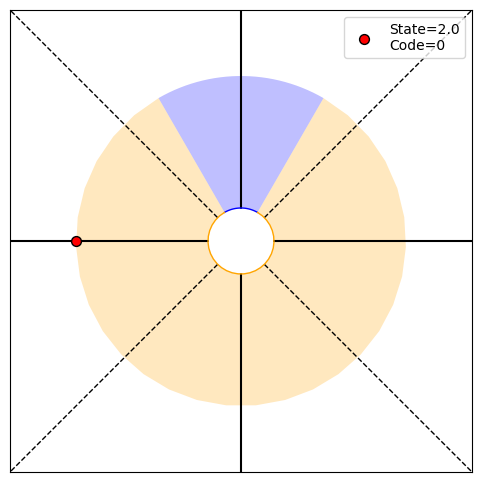

P(O1:23,S23|T)=[0.25 0.   0.25 0.25], P(O1:23|actions,T)=0.75, P(T|O1:23)=[0.83690961 0.16309039], H23=0.64
PRINT 1: 0.6416517599022384, [0.25 0.   0.25 0.25]
PRINT 2: [0.02766032 0.02766032], [0.83690961 0.16309039]
Choosing randomly
Current angle: -90.0, Code received: 0.0


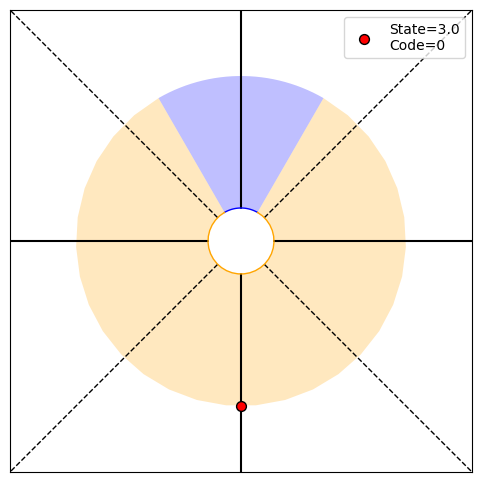

P(O1:24,S24|T)=[0.25 0.   0.25 0.25], P(O1:24|actions,T)=0.75, P(T|O1:24)=[0.8850225 0.1149775], H24=0.51
PRINT 1: 0.5147494196551952, [0.25 0.   0.25 0.25]
PRINT 2: [0.02075739 0.02075739], [0.8850225 0.1149775]
Choosing randomly
Current angle: 0.0, Code received: 0.0


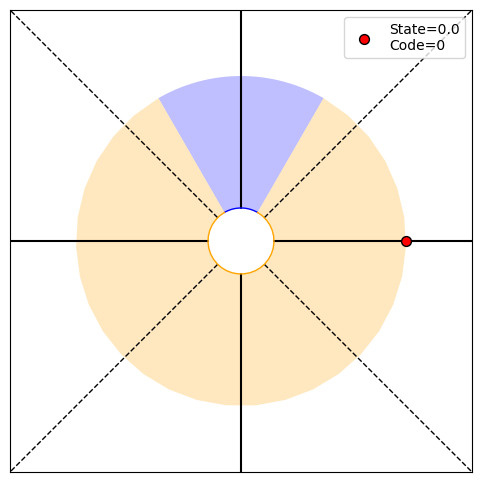

P(O1:25,S25|T)=[0.25 0.   0.25 0.25], P(O1:25|actions,T)=0.75, P(T|O1:25)=[0.92029351 0.07970649], H25=0.40
PRINT 1: 0.4011441330992311, [0.25 0.   0.25 0.25]
PRINT 2: [0.01503884 0.01503884], [0.92029351 0.07970649]
Choosing randomly
Current angle: -90.0, Code received: 0.0


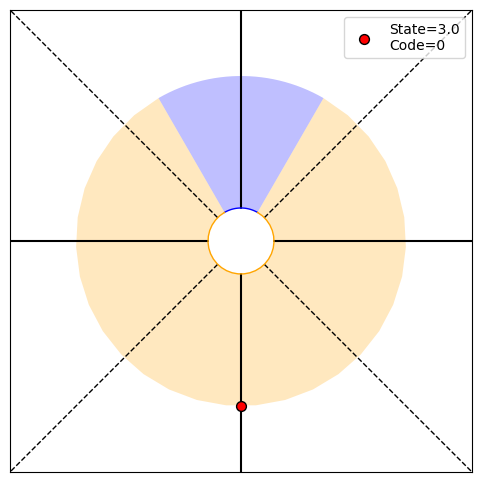

P(O1:26,S26|T)=[0.25 0.   0.25 0.25], P(O1:26|actions,T)=0.75, P(T|O1:26)=[0.945412 0.054588], H26=0.31
PRINT 1: 0.3055756282711969, [0.25 0.   0.25 0.25]
PRINT 2: [0.01061995 0.01061995], [0.945412 0.054588]
Choosing randomly
Current angle: -180.0, Code received: 0.0


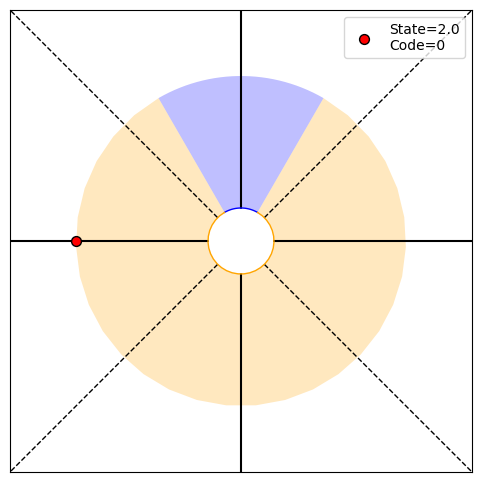

P(O1:27,S27|T)=[0.25 0.   0.25 0.25], P(O1:27|actions,T)=0.75, P(T|O1:27)=[0.96293354 0.03706646], H27=0.23
PRINT 1: 0.22867642397119406, [0.25 0.   0.25 0.25]
PRINT 2: [0.00736429 0.00736429], [0.96293354 0.03706646]
Choosing randomly
Current angle: -90.0, Code received: 0.0


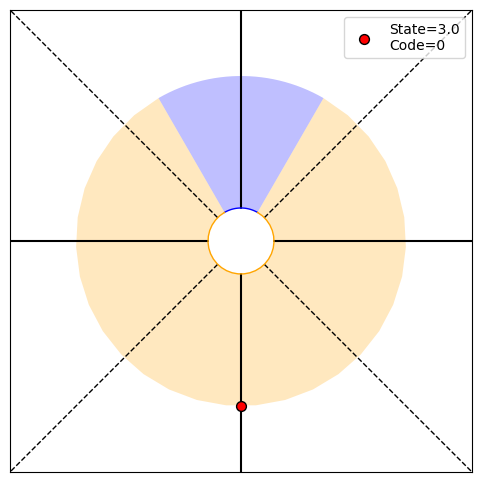

P(O1:28,S28|T)=[0.25 0.   0.25 0.25], P(O1:28|actions,T)=0.75, P(T|O1:28)=[0.97497989 0.02502011], H28=0.17
PRINT 1: 0.16876720088555988, [0.25 0.   0.25 0.25]
PRINT 2: [0.00504244 0.00504244], [0.97497989 0.02502011]
Choosing randomly
Current angle: -180.0, Code received: 0.0


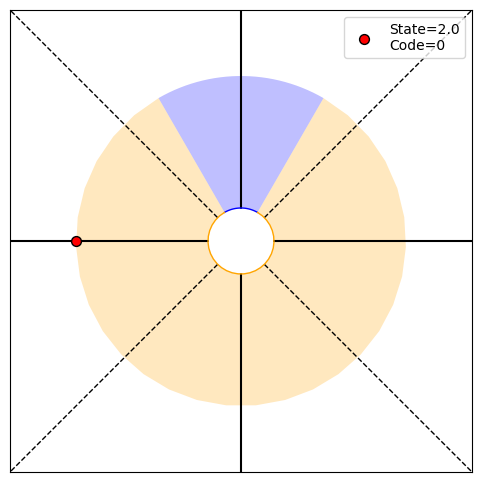

P(O1:29,S29|T)=[0.25 0.   0.25 0.25], P(O1:29|actions,T)=0.75, P(T|O1:29)=[0.98317965 0.01682035], H29=0.12
PRINT 1: 0.12319465229607336, [0.25 0.   0.25 0.25]
PRINT 2: [0.00342276 0.00342276], [0.98317965 0.01682035]
Choosing randomly
Current angle: -90.0, Code received: 0.0


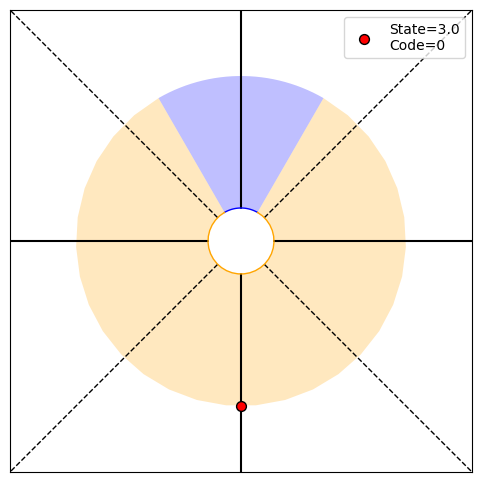

P(O1:30,S30|T)=[0.25 0.   0.25 0.25], P(O1:30|actions,T)=0.75, P(T|O1:30)=[0.9887232 0.0112768], H30=0.09
PRINT 1: 0.0891433991060945, [0.25 0.   0.25 0.25]
PRINT 2: [0.00230965 0.00230965], [0.9887232 0.0112768]
Choosing randomly
Current angle: 0.0, Code received: 0.0


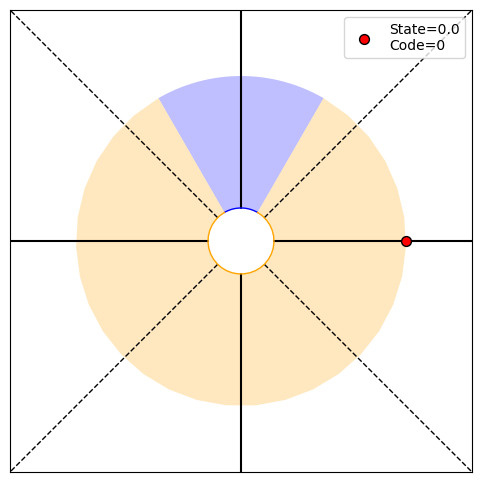

P(O1:31,S31|T)=[0.25 0.   0.25 0.25], P(O1:31|actions,T)=0.75, P(T|O1:31)=[0.99245377 0.00754623], H31=0.06
PRINT 1: 0.06404686175219168, [0.25 0.   0.25 0.25]
PRINT 2: [0.00155231 0.00155231], [0.99245377 0.00754623]
Choosing randomly
Current angle: 90.0, Code received: 1.0


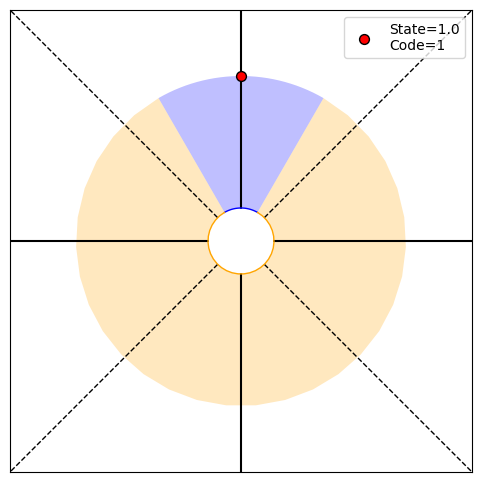

P(O1:32,S32|T)=[0.   0.25 0.   0.  ], P(O1:32|actions,T)=0.25, P(T|O1:32)=[0.98502058 0.01497942], H32=0.11
PRINT 1: 0.11223645726923831, [0.   0.25 0.   0.  ]
PRINT 2: [0.00305474 0.00305474], [0.98502058 0.01497942]
Choosing randomly
Current angle: 0.0, Code received: 0.0


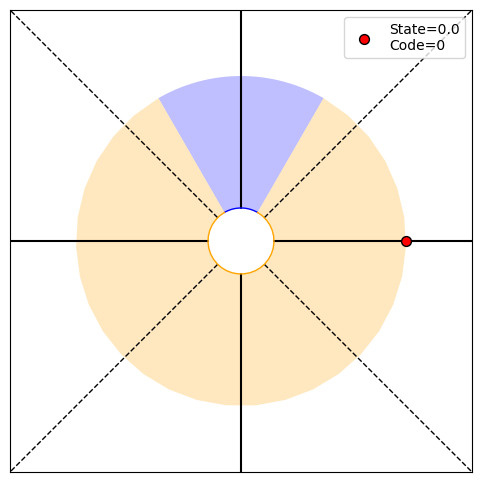

P(O1:33,S33|T)=[0.25 0.   0.25 0.25], P(O1:33|actions,T)=0.75, P(T|O1:33)=[0.98996361 0.01003639], H33=0.08
PRINT 1: 0.08103431069031111, [0.25 0.   0.25 0.25]
PRINT 2: [0.00205857 0.00205857], [0.98996361 0.01003639]
Choosing randomly
Current angle: -90.0, Code received: 0.0


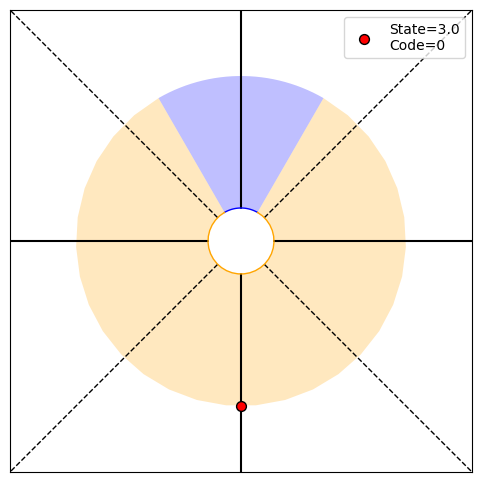

P(O1:34,S34|T)=[0.25 0.   0.25 0.25], P(O1:34|actions,T)=0.75, P(T|O1:34)=[0.99328661 0.00671339], H34=0.06
PRINT 1: 0.058115019183036375, [0.25 0.   0.25 0.25]
PRINT 2: [0.00138233 0.00138233], [0.99328661 0.00671339]
Choosing randomly
Current angle: -180.0, Code received: 0.0


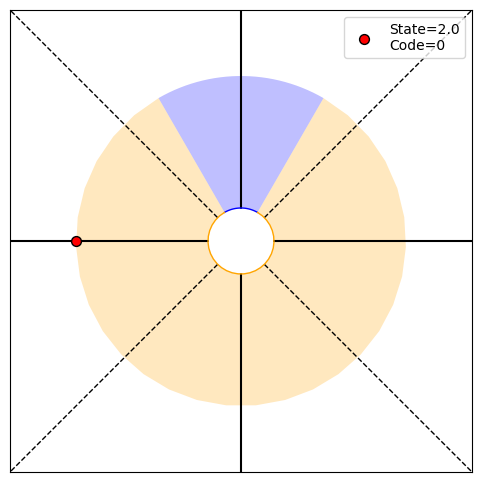

P(O1:35,S35|T)=[0.25 0.   0.25 0.25], P(O1:35|actions,T)=0.75, P(T|O1:35)=[0.99551437 0.00448563], H35=0.04
PRINT 1: 0.04144690345512569, [0.25 0.   0.25 0.25]
PRINT 2: [0.00092602 0.00092602], [0.99551437 0.00448563]
Choosing randomly
Current angle: -90.0, Code received: 0.0


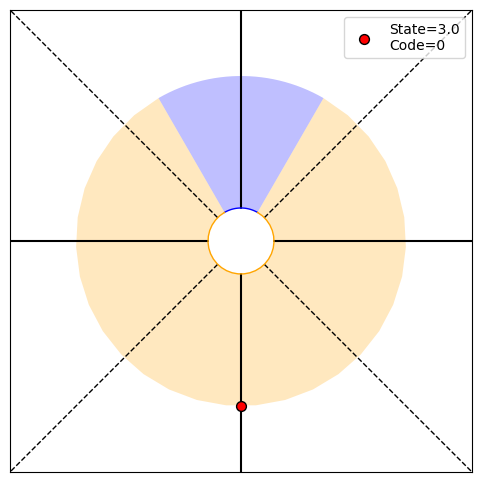

P(O1:36,S36|T)=[0.25 0.   0.25 0.25], P(O1:36|actions,T)=0.75, P(T|O1:36)=[0.9970051 0.0029949], H36=0.03
PRINT 1: 0.029421311991498576, [0.25 0.   0.25 0.25]
PRINT 2: [0.00061934 0.00061934], [0.9970051 0.0029949]
Choosing randomly
Current angle: 0.0, Code received: 0.0


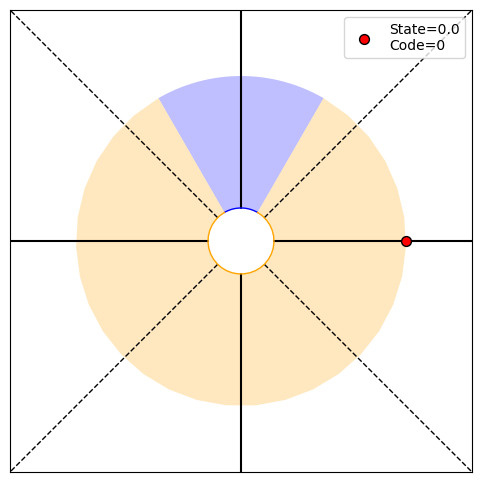

P(O1:37,S37|T)=[0.25 0.   0.25 0.25], P(O1:37|actions,T)=0.75, P(T|O1:37)=[0.99800141 0.00199859], H37=0.02
PRINT 1: 0.020801469882121275, [0.25 0.   0.25 0.25]
PRINT 2: [0.00041379 0.00041379], [0.99800141 0.00199859]
Choosing randomly
Current angle: -90.0, Code received: 0.0


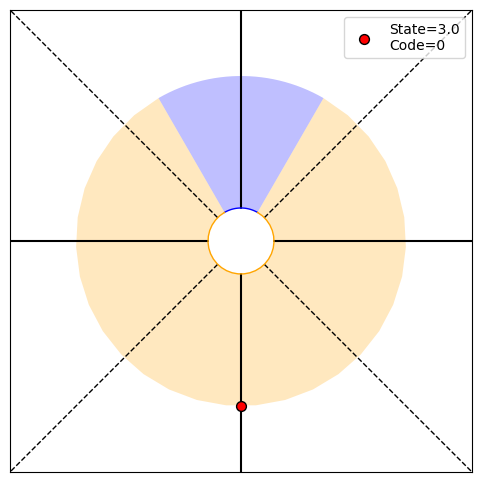

P(O1:38,S38|T)=[0.25 0.   0.25 0.25], P(O1:38|actions,T)=0.75, P(T|O1:38)=[0.99866672 0.00133328], H38=0.01
PRINT 1: 0.01465617137836206, [0.25 0.   0.25 0.25]
PRINT 2: [0.00027625 0.00027625], [0.99866672 0.00133328]
Choosing randomly
Current angle: 0.0, Code received: 0.0


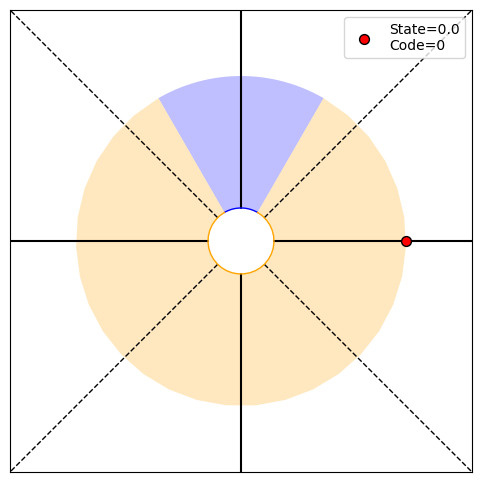

P(O1:39,S39|T)=[0.25 0.   0.25 0.25], P(O1:39|actions,T)=0.75, P(T|O1:39)=[9.99110749e-01 8.89251417e-04], H39=0.01
PRINT 1: 0.010295018740227473, [0.25 0.   0.25 0.25]
PRINT 2: [0.00018435 0.00018435], [9.99110749e-01 8.89251417e-04]
Choosing randomly
Current angle: -90.0, Code received: 0.0


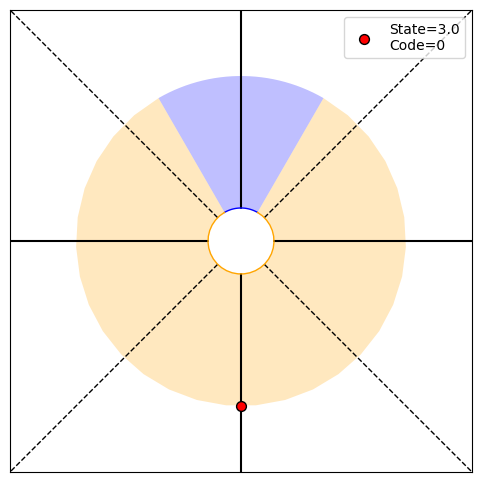

P(O1:40,S40|T)=[0.25 0.   0.25 0.25], P(O1:40|actions,T)=0.75, P(T|O1:40)=[9.99406990e-01 5.93010056e-04], H40=0.01
PRINT 1: 0.007212142641380769, [0.25 0.   0.25 0.25]
PRINT 2: [0.00012298 0.00012298], [9.99406990e-01 5.93010056e-04]
Choosing randomly
Current angle: -180.0, Code received: 0.0


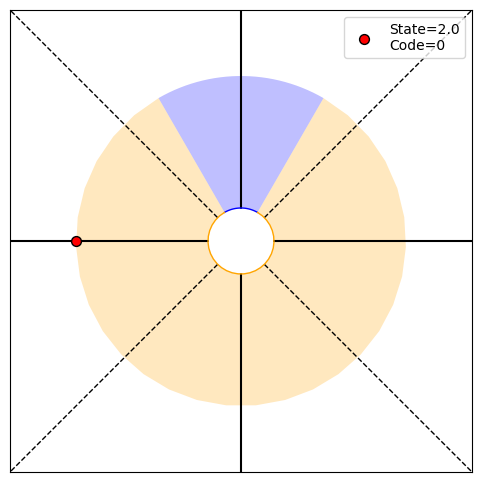

P(O1:41,S41|T)=[0.25 0.   0.25 0.25], P(O1:41|actions,T)=0.75, P(T|O1:41)=[9.99604582e-01 3.95418200e-04], H41=0.01
PRINT 1: 0.005040294120322526, [0.25 0.   0.25 0.25]
PRINT 2: [8.20190981e-05 8.20190981e-05], [9.99604582e-01 3.95418200e-04]
Choosing randomly
Current angle: -90.0, Code received: 0.0


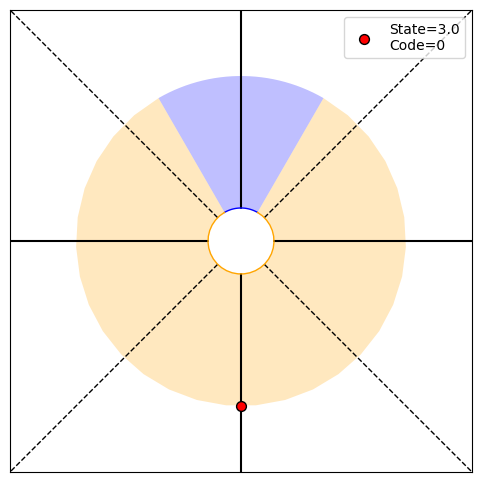

P(O1:42,S42|T)=[0.25 0.   0.25 0.25], P(O1:42|actions,T)=0.75, P(T|O1:42)=[9.99736353e-01 2.63646883e-04], H42=0.00
PRINT 1: 0.003514837501658451, [0.25 0.   0.25 0.25]
PRINT 2: [5.4694959e-05 5.4694959e-05], [9.99736353e-01 2.63646883e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


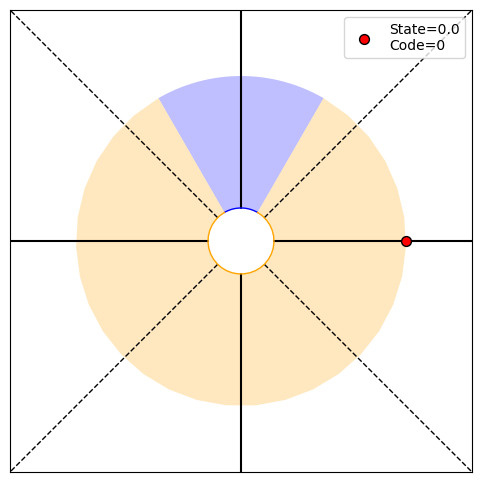

P(O1:43,S43|T)=[0.25 0.   0.25 0.25], P(O1:43|actions,T)=0.75, P(T|O1:43)=[9.99824220e-01 1.75780037e-04], H43=0.00
PRINT 1: 0.0024462445325190204, [0.25 0.   0.25 0.25]
PRINT 2: [3.64702242e-05 3.64702242e-05], [9.99824220e-01 1.75780037e-04]
Choosing randomly
Current angle: -90.0, Code received: 0.0


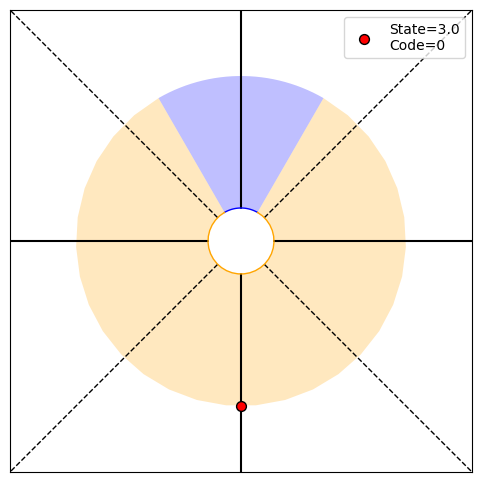

P(O1:44,S44|T)=[0.25 0.   0.25 0.25], P(O1:44|actions,T)=0.75, P(T|O1:44)=[9.99882806e-01 1.17193558e-04], H44=0.00
PRINT 1: 0.0016994741327847217, [0.25 0.   0.25 0.25]
PRINT 2: [2.43165583e-05 2.43165583e-05], [9.99882806e-01 1.17193558e-04]
Choosing randomly
Current angle: -180.0, Code received: 0.0


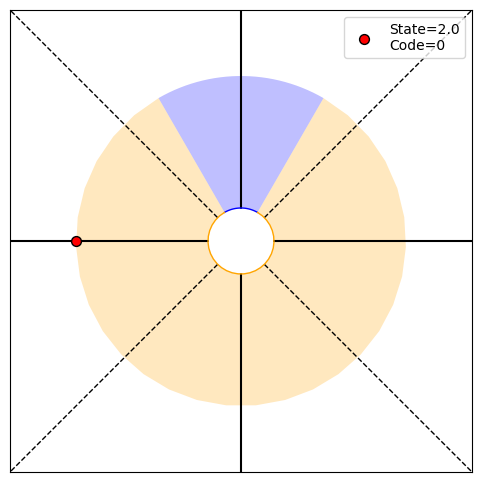

P(O1:45,S45|T)=[0.25 0.   0.25 0.25], P(O1:45|actions,T)=0.75, P(T|O1:45)=[9.99921868e-01 7.81320909e-05], H45=0.00
PRINT 1: 0.0011787291578113702, [0.25 0.   0.25 0.25]
PRINT 2: [1.6212406e-05 1.6212406e-05], [9.99921868e-01 7.81320909e-05]
Choosing randomly
Current angle: -270.0, Code received: 1.0


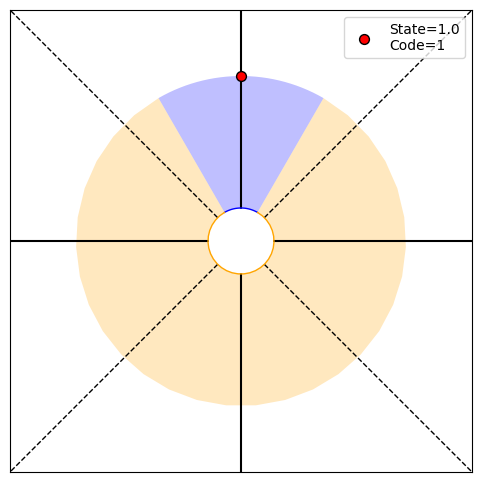

P(O1:46,S46|T)=[0.   0.25 0.   0.  ], P(O1:46|actions,T)=0.25, P(T|O1:46)=[9.99843748e-01 1.56251973e-04], H46=0.00
PRINT 1: 0.0022010309698062974, [0.   0.25 0.   0.  ]
PRINT 2: [3.24193439e-05 3.24193439e-05], [9.99843748e-01 1.56251973e-04]
Choosing randomly
Current angle: -360.0, Code received: 0.0


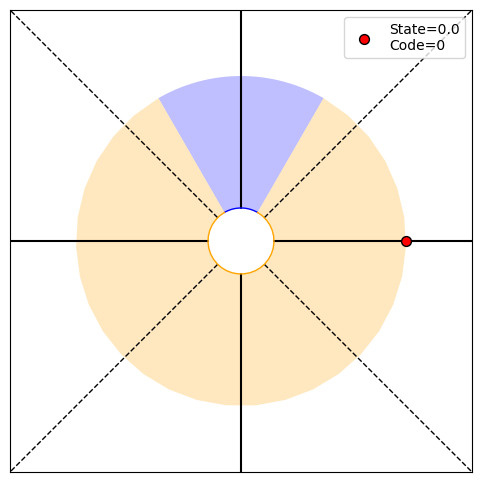

P(O1:47,S47|T)=[0.25 0.   0.25 0.25], P(O1:47|actions,T)=0.75, P(T|O1:47)=[9.99895827e-01 1.04173408e-04], H47=0.00
PRINT 1: 0.0015283640326718545, [0.25 0.   0.25 0.25]
PRINT 2: [2.16153261e-05 2.16153261e-05], [9.99895827e-01 1.04173408e-04]
Choosing randomly
Current angle: -270.0, Code received: 1.0


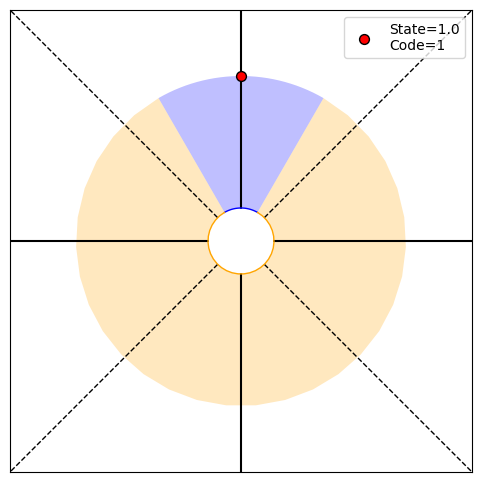

P(O1:48,S48|T)=[0.   0.25 0.   0.  ], P(O1:48|actions,T)=0.25, P(T|O1:48)=[9.99791675e-01 2.08325114e-04], H48=0.00
PRINT 1: 0.0028481002091317307, [0.   0.25 0.   0.  ]
PRINT 2: [4.32209324e-05 4.32209324e-05], [9.99791675e-01 2.08325114e-04]
Choosing randomly
Current angle: -360.0, Code received: 0.0


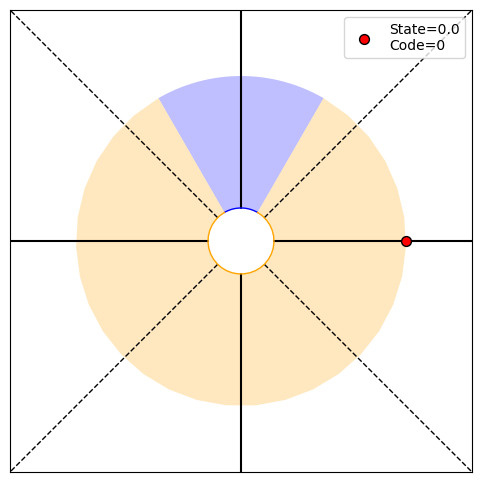

P(O1:49,S49|T)=[0.25 0.   0.25 0.25], P(O1:49|actions,T)=0.75, P(T|O1:49)=[9.99861107e-01 1.38893054e-04], H49=0.00
PRINT 1: 0.0019801056036519845, [0.25 0.   0.25 0.25]
PRINT 2: [2.88182746e-05 2.88182746e-05], [9.99861107e-01 1.38893054e-04]
Choosing randomly
Current angle: -270.0, Code received: 1.0


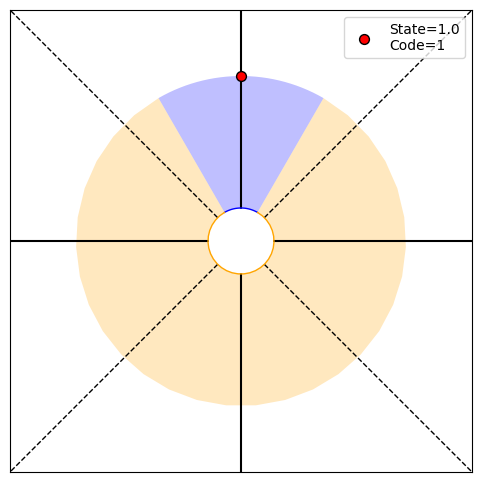

P(O1:50,S50|T)=[0.   0.25 0.   0.  ], P(O1:50|actions,T)=0.25, P(T|O1:50)=[9.99722252e-01 2.77747532e-04], H50=0.00
PRINT 1: 0.003681941533706744, [0.   0.25 0.   0.  ]
PRINT 2: [5.76192725e-05 5.76192725e-05], [9.99722252e-01 2.77747532e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


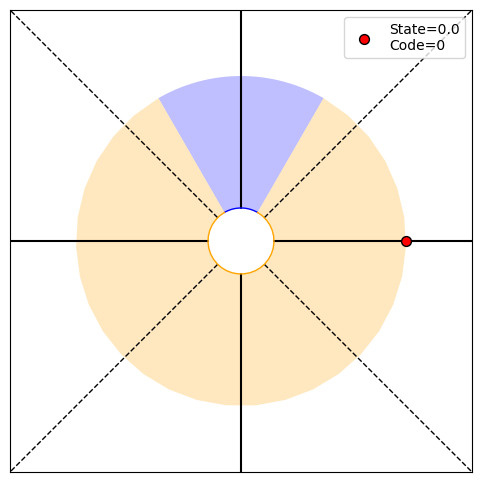

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.04730118 0.04730118], [0.6 0.4]
Choosing randomly
Current angle: 90.0, Code received: 1.0


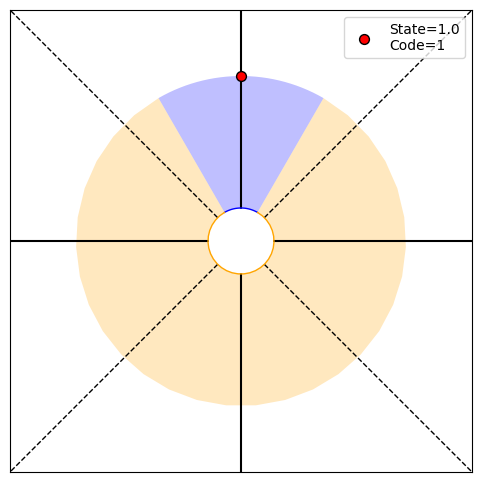

P(O1:2,S2|T)=[0.   0.25 0.   0.  ], P(O1:2|actions,T)=0.25, P(T|O1:2)=[0.42857143 0.57142857], H2=0.99
PRINT 1: 0.9852281360342514, [0.   0.25 0.   0.  ]
PRINT 2: [0.04749944 0.04749944], [0.42857143 0.57142857]
Choosing randomly
Current angle: 180.0, Code received: 0.0


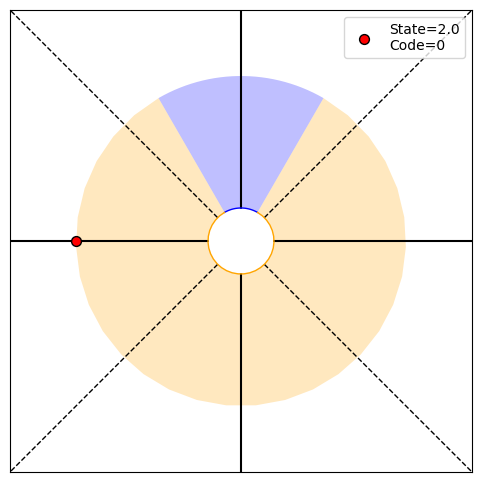

P(O1:3,S3|T)=[0.25 0.   0.25 0.25], P(O1:3|actions,T)=0.75, P(T|O1:3)=[0.52941176 0.47058824], H3=1.00
PRINT 1: 0.9975025463691152, [0.25 0.   0.25 0.25]
PRINT 2: [0.04875988 0.04875988], [0.52941176 0.47058824]
Choosing randomly
Current angle: 90.0, Code received: 1.0


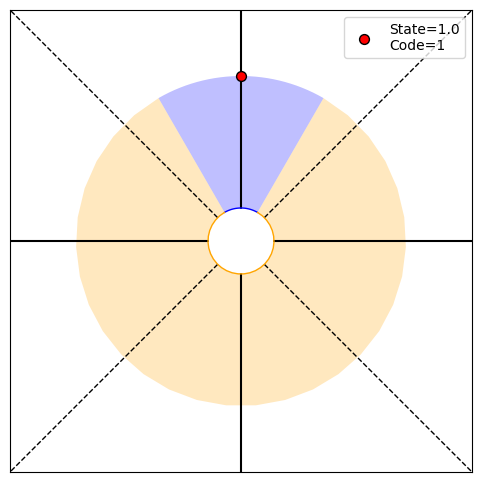

P(O1:4,S4|T)=[0.   0.25 0.   0.  ], P(O1:4|actions,T)=0.25, P(T|O1:4)=[0.36 0.64], H4=0.94
PRINT 1: 0.9426831892554923, [0.   0.25 0.   0.  ]
PRINT 2: [0.04444034 0.04444034], [0.36 0.64]
Choosing randomly
Current angle: 180.0, Code received: 0.0


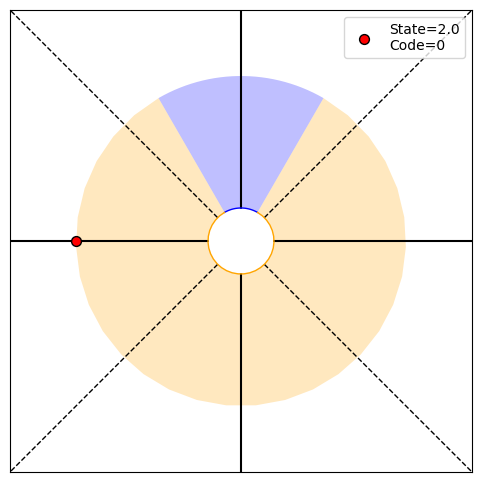

P(O1:5,S5|T)=[0.25 0.   0.25 0.25], P(O1:5|actions,T)=0.75, P(T|O1:5)=[0.45762712 0.54237288], H5=0.99
PRINT 1: 0.9948131754904235, [0.25 0.   0.25 0.25]
PRINT 2: [0.04826098 0.04826098], [0.45762712 0.54237288]
Choosing randomly
Current angle: 90.0, Code received: 1.0


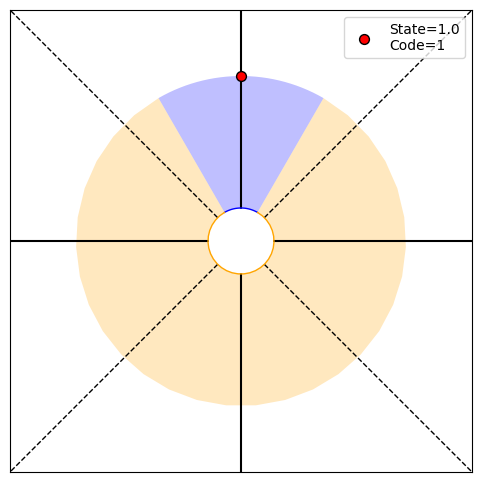

P(O1:6,S6|T)=[0.   0.25 0.   0.  ], P(O1:6|actions,T)=0.25, P(T|O1:6)=[0.2967033 0.7032967], H6=0.88
PRINT 1: 0.8772236230732715, [0.   0.25 0.   0.  ]
PRINT 2: [0.04006008 0.04006008], [0.2967033 0.7032967]
Choosing randomly
Current angle: 180.0, Code received: 0.0


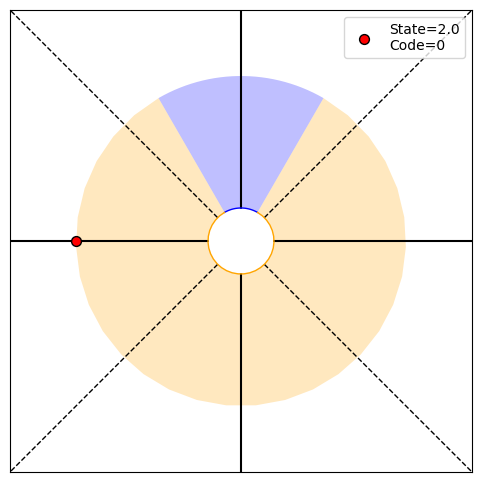

P(O1:7,S7|T)=[0.25 0.   0.25 0.25], P(O1:7|actions,T)=0.75, P(T|O1:7)=[0.38755981 0.61244019], H7=0.96
PRINT 1: 0.9632067386184207, [0.25 0.   0.25 0.25]
PRINT 2: [0.04588182 0.04588182], [0.38755981 0.61244019]
Choosing randomly
Current angle: 90.0, Code received: 1.0


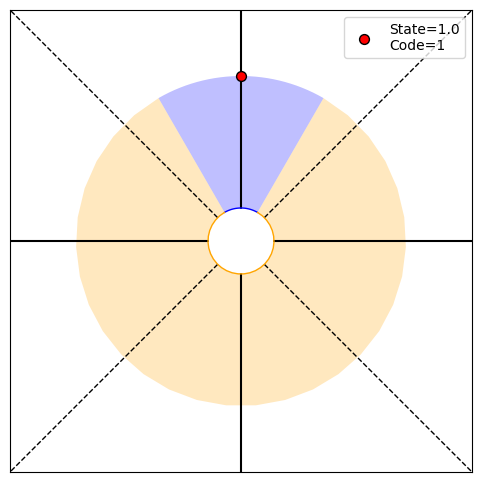

P(O1:8,S8|T)=[0.   0.25 0.   0.  ], P(O1:8|actions,T)=0.25, P(T|O1:8)=[0.24035608 0.75964392], H8=0.80
PRINT 1: 0.795631931823833, [0.   0.25 0.   0.  ]
PRINT 2: [0.03491698 0.03491698], [0.24035608 0.75964392]
Choosing randomly
Current angle: 180.0, Code received: 0.0


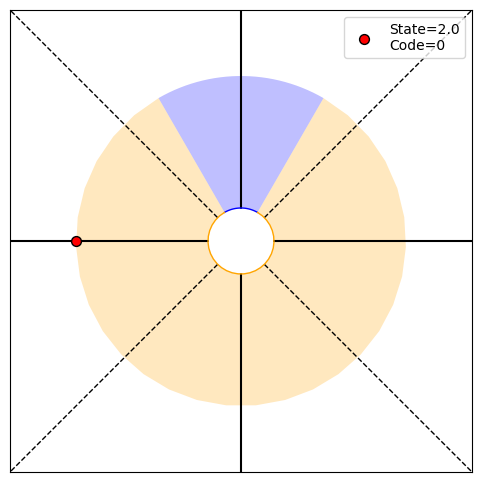

P(O1:9,S9|T)=[0.25 0.   0.25 0.25], P(O1:9|actions,T)=0.75, P(T|O1:9)=[0.3218543 0.6781457], H9=0.91
PRINT 1: 0.9063865582174682, [0.25 0.   0.25 0.25]
PRINT 2: [0.04197834 0.04197834], [0.3218543 0.6781457]
Choosing randomly
Current angle: 90.0, Code received: 1.0


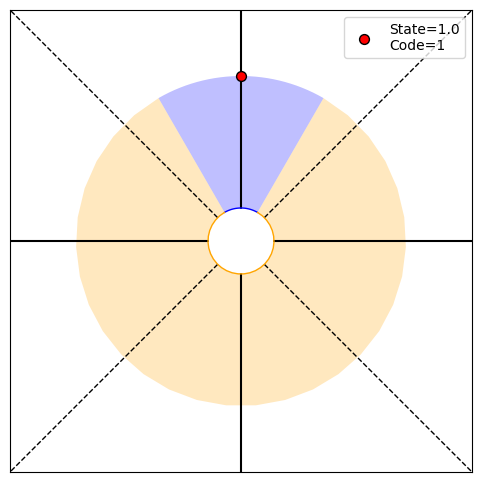

P(O1:10,S10|T)=[0.   0.25 0.   0.  ], P(O1:10|actions,T)=0.25, P(T|O1:10)=[0.19179163 0.80820837], H10=0.71
PRINT 1: 0.7052044094752966, [0.   0.25 0.   0.  ]
PRINT 2: [0.02955155 0.02955155], [0.19179163 0.80820837]
Choosing randomly
Current angle: 0.0, Code received: 0.0


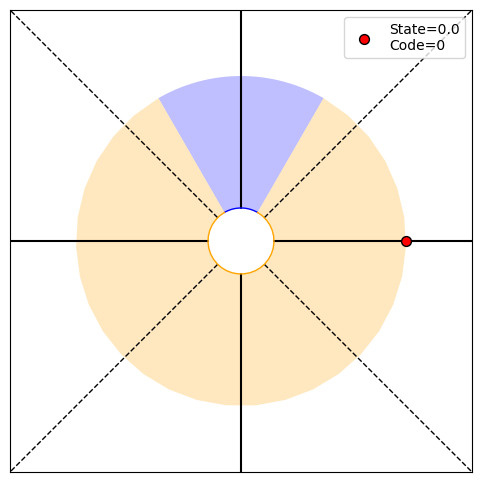

P(O1:11,S11|T)=[0.25 0.   0.25 0.25], P(O1:11|actions,T)=0.75, P(T|O1:11)=[0.2625135 0.7374865], H11=0.83
PRINT 1: 0.8305156468550949, [0.25 0.   0.25 0.25]
PRINT 2: [0.03707849 0.03707849], [0.2625135 0.7374865]
Choosing randomly
Current angle: -90.0, Code received: 0.0


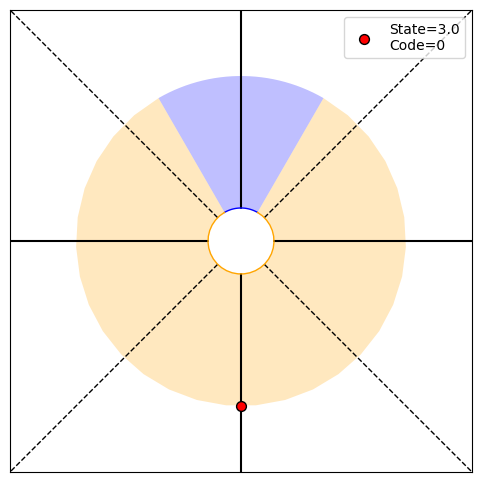

P(O1:12,S12|T)=[0.25 0.   0.25 0.25], P(O1:12|actions,T)=0.75, P(T|O1:12)=[0.34808213 0.65191787], H12=0.93
PRINT 1: 0.932343558914467, [0.25 0.   0.25 0.25]
PRINT 2: [0.04372922 0.04372922], [0.34808213 0.65191787]
Choosing randomly
Current angle: 0.0, Code received: 0.0


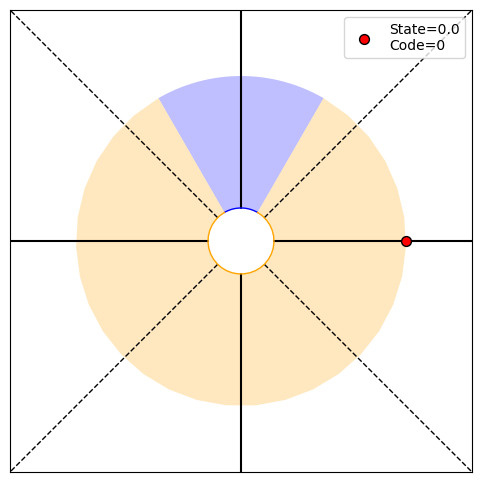

P(O1:13,S13|T)=[0.25 0.   0.25 0.25], P(O1:13|actions,T)=0.75, P(T|O1:13)=[0.44472311 0.55527689], H13=0.99
PRINT 1: 0.9911655423466446, [0.25 0.   0.25 0.25]
PRINT 2: [0.0479623 0.0479623], [0.44472311 0.55527689]
Choosing randomly
Current angle: 90.0, Code received: 1.0


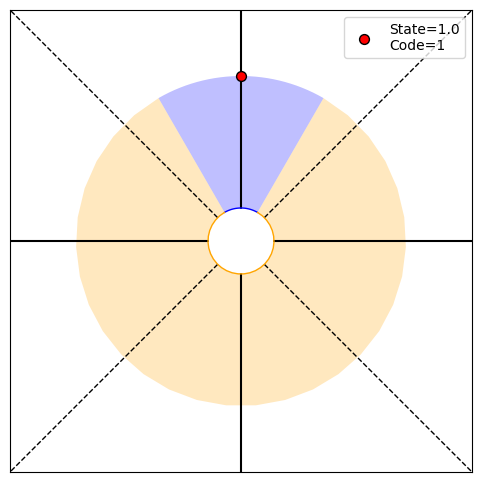

P(O1:14,S14|T)=[0.   0.25 0.   0.  ], P(O1:14|actions,T)=0.25, P(T|O1:14)=[0.28594465 0.71405535], H14=0.86
PRINT 1: 0.863424906375815, [0.   0.25 0.   0.  ]
PRINT 2: [0.03916823 0.03916823], [0.28594465 0.71405535]
Choosing randomly
Current angle: 0.0, Code received: 0.0


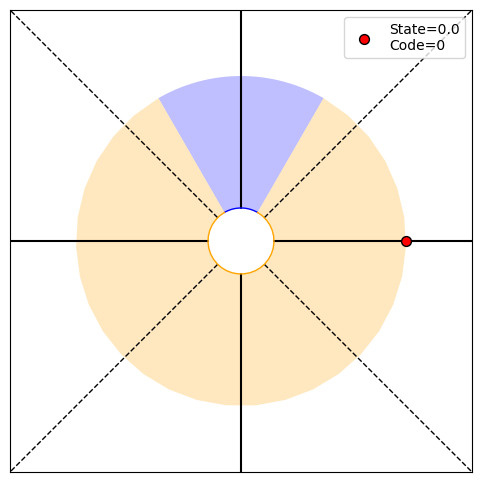

P(O1:15,S15|T)=[0.25 0.   0.25 0.25], P(O1:15|actions,T)=0.75, P(T|O1:15)=[0.37526453 0.62473547], H15=0.95
PRINT 1: 0.95462873900512, [0.25 0.   0.25 0.25]
PRINT 2: [0.04527381 0.04527381], [0.37526453 0.62473547]
Choosing randomly
Current angle: -90.0, Code received: 0.0


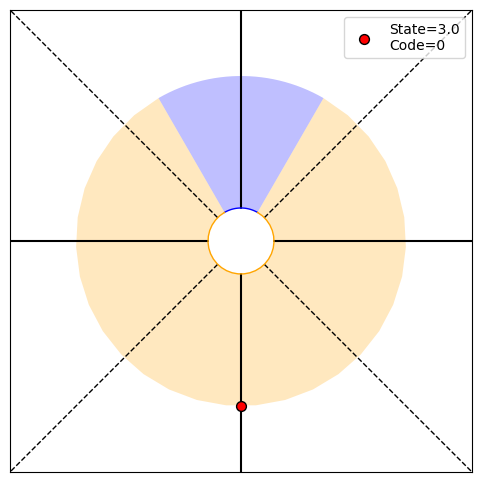

P(O1:16,S16|T)=[0.25 0.   0.25 0.25], P(O1:16|actions,T)=0.75, P(T|O1:16)=[0.47396557 0.52603443], H16=1.00
PRINT 1: 0.9980434216862113, [0.25 0.   0.25 0.25]
PRINT 2: [0.04854821 0.04854821], [0.47396557 0.52603443]
Choosing randomly
Current angle: 0.0, Code received: 0.0


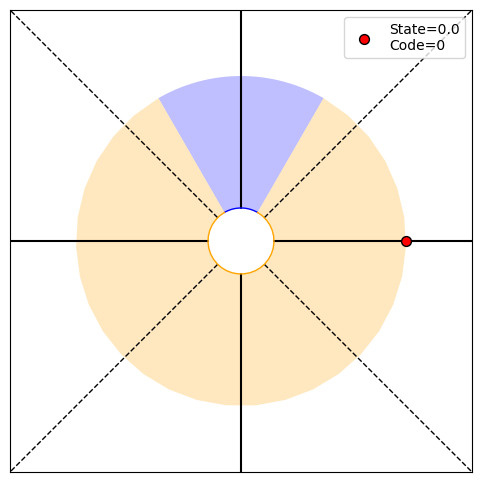

P(O1:17,S17|T)=[0.25 0.   0.25 0.25], P(O1:17|actions,T)=0.75, P(T|O1:17)=[0.57474393 0.42525607], H17=0.98
PRINT 1: 0.9838197400768469, [0.25 0.   0.25 0.25]
PRINT 2: [0.0480477 0.0480477], [0.57474393 0.42525607]
Choosing randomly
Current angle: 90.0, Code received: 1.0


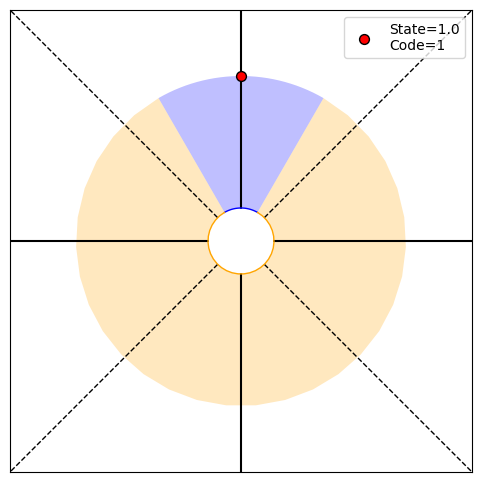

P(O1:18,S18|T)=[0.   0.25 0.   0.  ], P(O1:18|actions,T)=0.25, P(T|O1:18)=[0.40325661 0.59674339], H18=0.97
PRINT 1: 0.9728237423646349, [0.   0.25 0.   0.  ]
PRINT 2: [0.0465757 0.0465757], [0.40325661 0.59674339]
Choosing randomly
Current angle: 0.0, Code received: 0.0


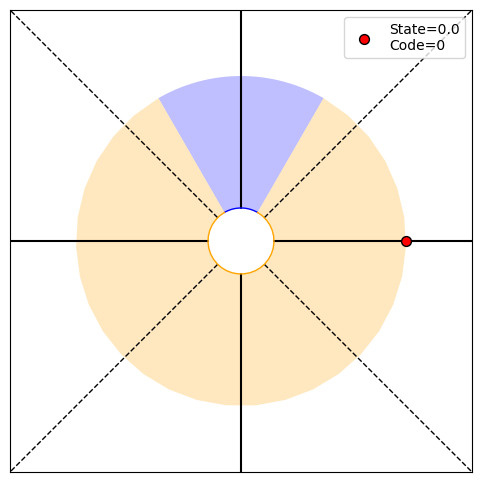

P(O1:19,S19|T)=[0.25 0.   0.25 0.25], P(O1:19|actions,T)=0.75, P(T|O1:19)=[0.50338771 0.49661229], H19=1.00
PRINT 1: 0.9999668854076311, [0.25 0.   0.25 0.25]
PRINT 2: [0.04880791 0.04880791], [0.50338771 0.49661229]
Choosing randomly
Current angle: 90.0, Code received: 1.0


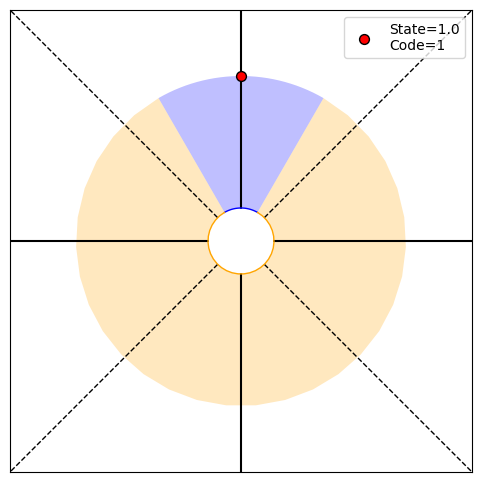

P(O1:20,S20|T)=[0.   0.25 0.   0.  ], P(O1:20|actions,T)=0.25, P(T|O1:20)=[0.33635144 0.66364856], H20=0.92
PRINT 1: 0.9212844209839121, [0.   0.25 0.   0.  ]
PRINT 2: [0.04297767 0.04297767], [0.33635144 0.66364856]
Choosing randomly
Current angle: 0.0, Code received: 0.0


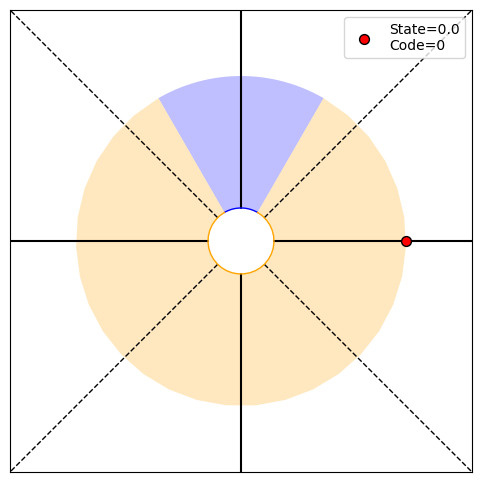

P(O1:21,S21|T)=[0.25 0.   0.25 0.25], P(O1:21|actions,T)=0.75, P(T|O1:21)=[0.43189321 0.56810679], H21=0.99
PRINT 1: 0.9865743206157769, [0.25 0.   0.25 0.25]
PRINT 2: [0.0476027 0.0476027], [0.43189321 0.56810679]
Choosing randomly
Current angle: -90.0, Code received: 0.0


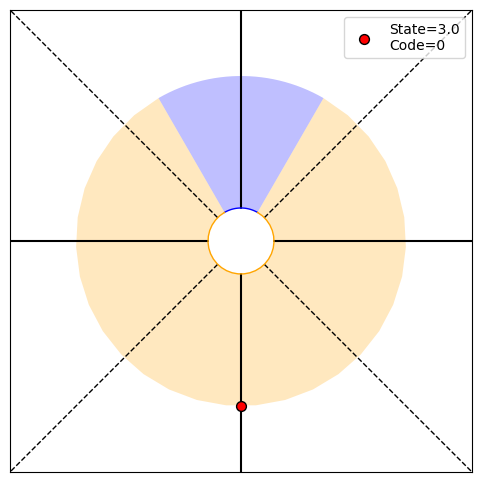

P(O1:22,S22|T)=[0.25 0.   0.25 0.25], P(O1:22|actions,T)=0.75, P(T|O1:22)=[0.5327864 0.4672136], H22=1.00
PRINT 1: 0.9968961282902988, [0.25 0.   0.25 0.25]
PRINT 2: [0.04873445 0.04873445], [0.5327864 0.4672136]
Choosing randomly
Current angle: -180.0, Code received: 0.0


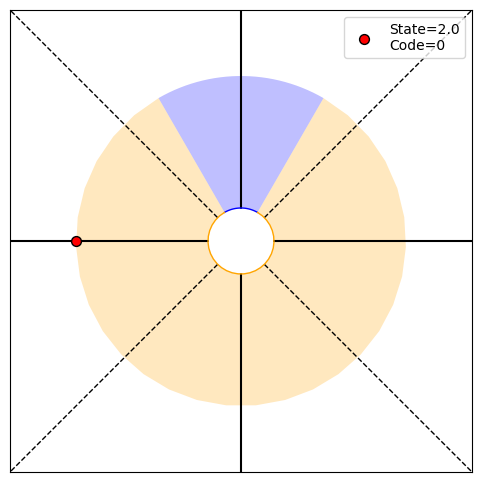

P(O1:23,S23|T)=[0.25 0.   0.25 0.25], P(O1:23|actions,T)=0.75, P(T|O1:23)=[0.63106751 0.36893249], H23=0.95
PRINT 1: 0.9498489013724856, [0.25 0.   0.25 0.25]
PRINT 2: [0.04603588 0.04603588], [0.63106751 0.36893249]
Choosing randomly
Current angle: -270.0, Code received: 1.0


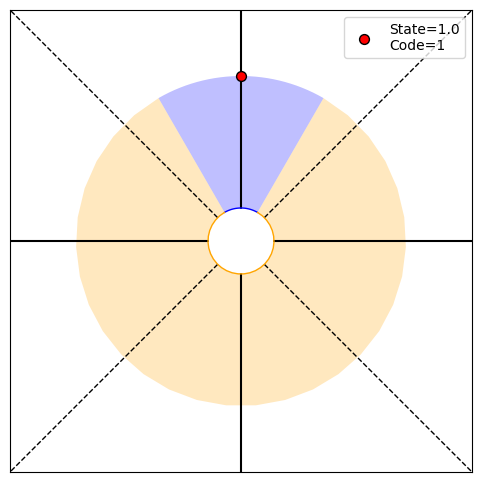

P(O1:24,S24|T)=[0.   0.25 0.   0.  ], P(O1:24|actions,T)=0.25, P(T|O1:24)=[0.46099243 0.53900757], H24=1.00
PRINT 1: 0.9956051527919403, [0.   0.25 0.   0.  ]
PRINT 2: [0.04832847 0.04832847], [0.46099243 0.53900757]
Choosing randomly
Current angle: -360.0, Code received: 0.0


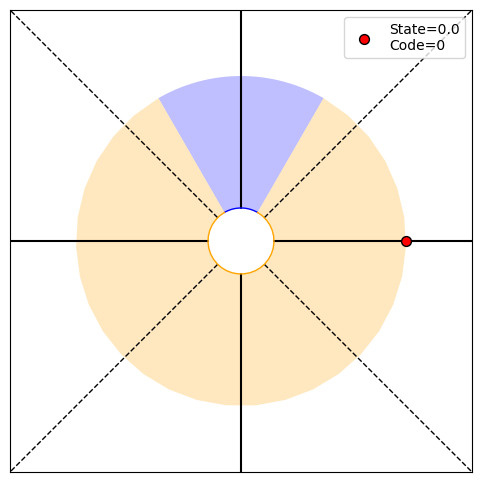

P(O1:25,S25|T)=[0.25 0.   0.25 0.25], P(O1:25|actions,T)=0.75, P(T|O1:25)=[0.56195918 0.43804082], H25=0.99
PRINT 1: 0.9888946367798948, [0.25 0.   0.25 0.25]
PRINT 2: [0.04832986 0.04832986], [0.56195918 0.43804082]
Choosing randomly
Current angle: -270.0, Code received: 1.0


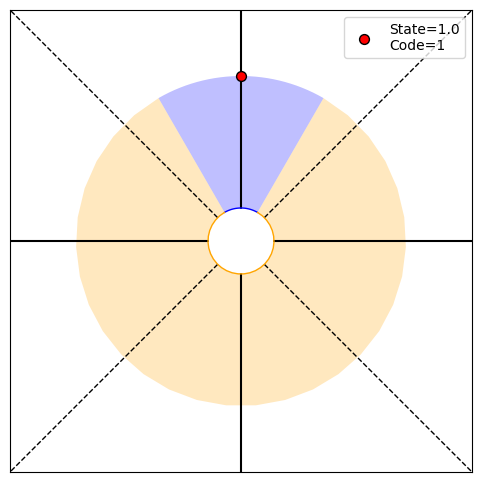

P(O1:26,S26|T)=[0.   0.25 0.   0.  ], P(O1:26|actions,T)=0.25, P(T|O1:26)=[0.3907811 0.6092189], H26=0.97
PRINT 1: 0.9653017721221548, [0.   0.25 0.   0.  ]
PRINT 2: [0.04603176 0.04603176], [0.3907811 0.6092189]
Choosing randomly
Current angle: -360.0, Code received: 0.0


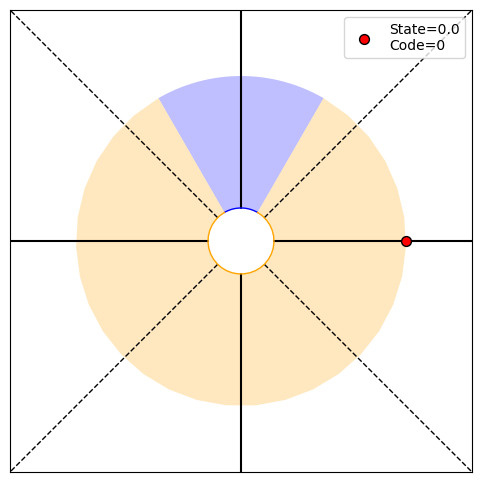

P(O1:27,S27|T)=[0.25 0.   0.25 0.25], P(O1:27|actions,T)=0.75, P(T|O1:27)=[0.49035995 0.50964005], H27=1.00
PRINT 1: 0.9997318426132659, [0.25 0.   0.25 0.25]
PRINT 2: [0.04873389 0.04873389], [0.49035995 0.50964005]
Choosing randomly
Current angle: -450.0, Code received: 0.0


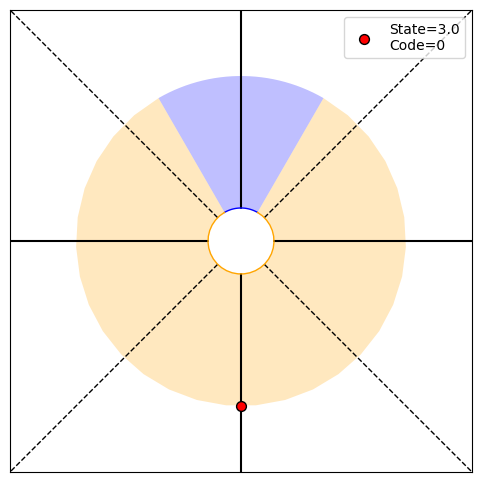

P(O1:28,S28|T)=[0.25 0.   0.25 0.25], P(O1:28|actions,T)=0.75, P(T|O1:28)=[0.59070973 0.40929027], H28=0.98
PRINT 1: 0.9761262928850637, [0.25 0.   0.25 0.25]
PRINT 2: [0.04760507 0.04760507], [0.59070973 0.40929027]
Choosing randomly
Current angle: -360.0, Code received: 0.0


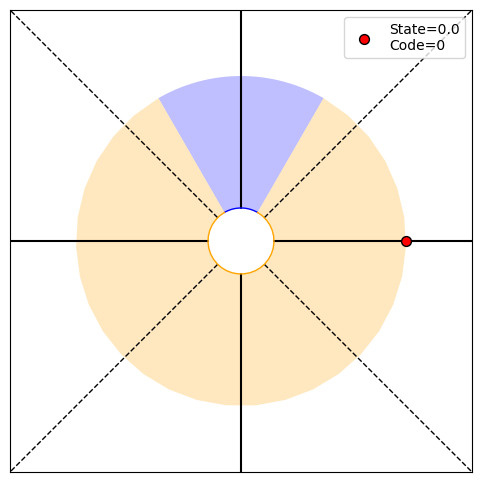

P(O1:29,S29|T)=[0.25 0.   0.25 0.25], P(O1:29|actions,T)=0.75, P(T|O1:29)=[0.68403232 0.31596768], H29=0.90
PRINT 1: 0.8999424352748243, [0.25 0.   0.25 0.25]
PRINT 2: [0.04298497 0.04298497], [0.68403232 0.31596768]
Choosing randomly
Current angle: -270.0, Code received: 1.0


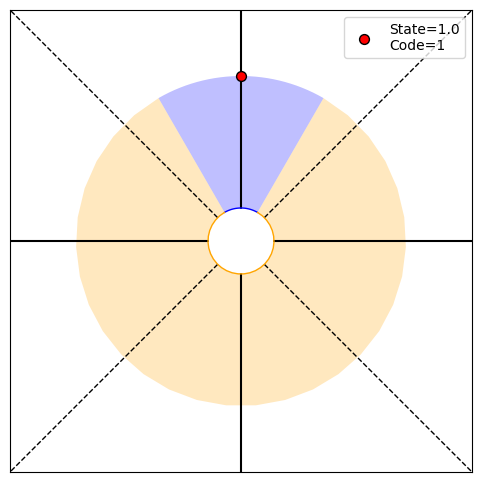

P(O1:30,S30|T)=[0.   0.25 0.   0.  ], P(O1:30|actions,T)=0.25, P(T|O1:30)=[0.51979417 0.48020583], H30=1.00
PRINT 1: 0.9988691826306666, [0.   0.25 0.   0.  ]
PRINT 2: [0.04880813 0.04880813], [0.51979417 0.48020583]
Choosing randomly
Current angle: -180.0, Code received: 0.0


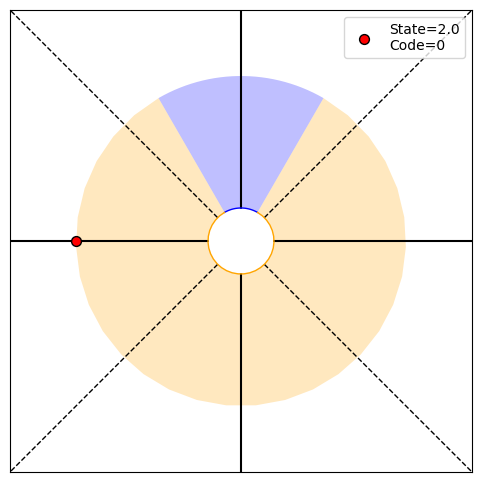

P(O1:31,S31|T)=[0.25 0.   0.25 0.25], P(O1:31|actions,T)=0.75, P(T|O1:31)=[0.61885313 0.38114687], H31=0.96
PRINT 1: 0.9588479971697974, [0.25 0.   0.25 0.25]
PRINT 2: [0.04657923 0.04657923], [0.61885313 0.38114687]
Choosing randomly
Current angle: -90.0, Code received: 0.0


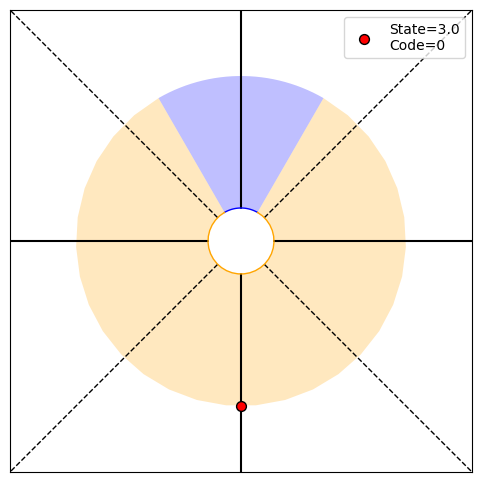

P(O1:32,S32|T)=[0.25 0.   0.25 0.25], P(O1:32|actions,T)=0.75, P(T|O1:32)=[0.70892077 0.29107923], H32=0.87
PRINT 1: 0.8701112786603546, [0.25 0.   0.25 0.25]
PRINT 2: [0.04115698 0.04115698], [0.70892077 0.29107923]
Choosing randomly
Current angle: -180.0, Code received: 0.0


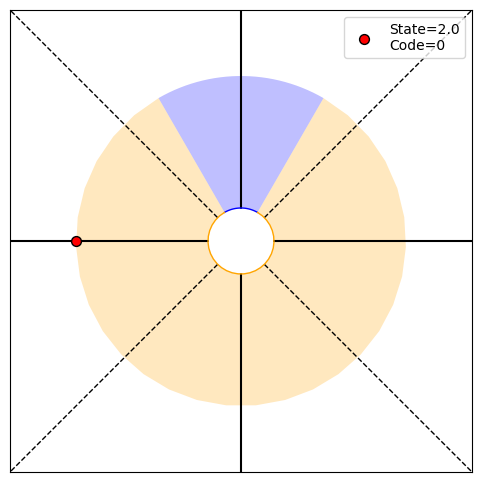

P(O1:33,S33|T)=[0.25 0.   0.25 0.25], P(O1:33|actions,T)=0.75, P(T|O1:33)=[0.7850958 0.2149042], H33=0.75
PRINT 1: 0.7507529547071403, [0.25 0.   0.25 0.25]
PRINT 2: [0.03396277 0.03396277], [0.7850958 0.2149042]
Choosing randomly
Current angle: -90.0, Code received: 0.0


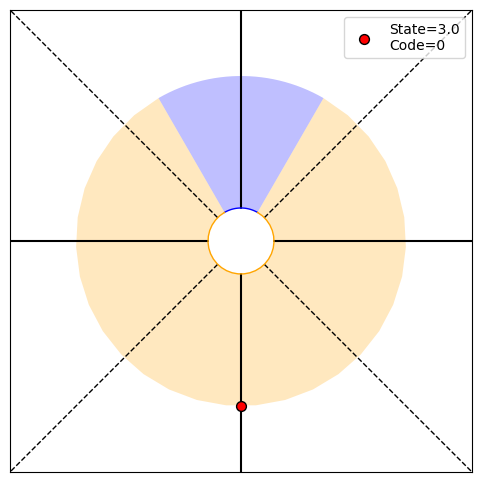

P(O1:34,S34|T)=[0.25 0.   0.25 0.25], P(O1:34|actions,T)=0.75, P(T|O1:34)=[0.84567554 0.15432446], H34=0.62
PRINT 1: 0.6205572874257553, [0.25 0.   0.25 0.25]
PRINT 2: [0.02647879 0.02647879], [0.84567554 0.15432446]
Choosing randomly
Current angle: 0.0, Code received: 0.0


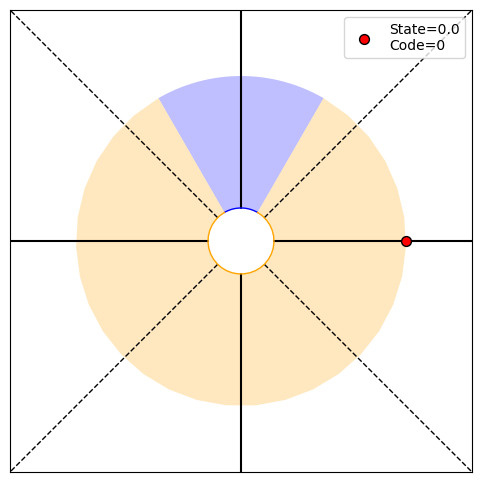

P(O1:35,S35|T)=[0.25 0.   0.25 0.25], P(O1:35|actions,T)=0.75, P(T|O1:35)=[0.89153756 0.10846244], H35=0.50
PRINT 1: 0.4952607286545818, [0.25 0.   0.25 0.25]
PRINT 2: [0.01974344 0.01974344], [0.89153756 0.10846244]
Choosing randomly
Current angle: 90.0, Code received: 1.0


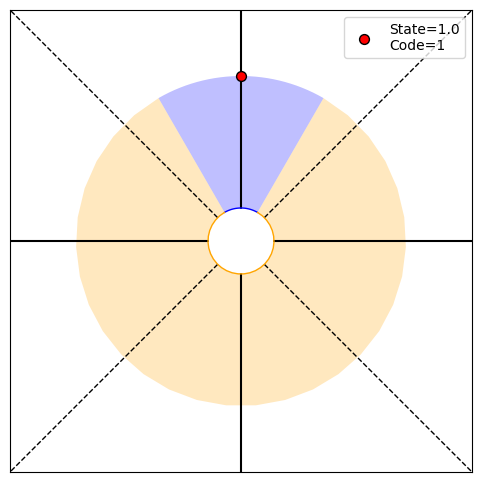

P(O1:36,S36|T)=[0.   0.25 0.   0.  ], P(O1:36|actions,T)=0.25, P(T|O1:36)=[0.8043011 0.1956989], H36=0.71
PRINT 1: 0.7132420442762173, [0.   0.25 0.   0.  ]
PRINT 2: [0.03176173 0.03176173], [0.8043011 0.1956989]
Choosing randomly
Current angle: 0.0, Code received: 0.0


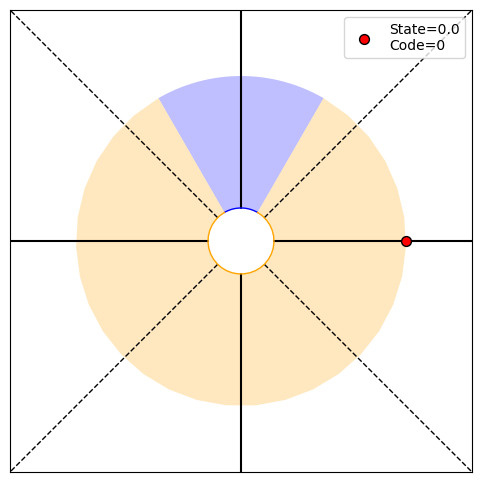

P(O1:37,S37|T)=[0.25 0.   0.25 0.25], P(O1:37|actions,T)=0.75, P(T|O1:37)=[0.86042946 0.13957054], H37=0.58
PRINT 1: 0.5831129773851714, [0.25 0.   0.25 0.25]
PRINT 2: [0.02441388 0.02441388], [0.86042946 0.13957054]
Choosing randomly
Current angle: 90.0, Code received: 1.0


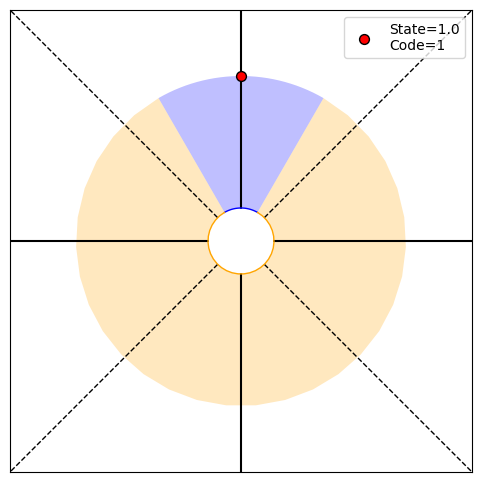

P(O1:38,S38|T)=[0.   0.25 0.   0.  ], P(O1:38|actions,T)=0.25, P(T|O1:38)=[0.75504713 0.24495287], H38=0.80
PRINT 1: 0.8031801636770234, [0.   0.25 0.   0.  ]
PRINT 2: [0.03709151 0.03709151], [0.75504713 0.24495287]
Choosing randomly
Current angle: 0.0, Code received: 0.0


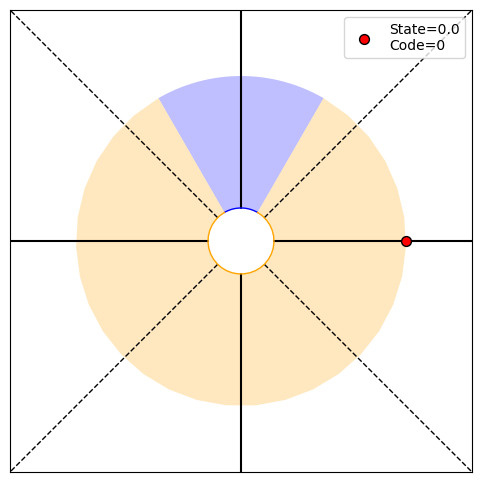

P(O1:39,S39|T)=[0.25 0.   0.25 0.25], P(O1:39|actions,T)=0.75, P(T|O1:39)=[0.82217882 0.17782118], H39=0.68
PRINT 1: 0.6752873298628722, [0.25 0.   0.25 0.25]
PRINT 2: [0.02957024 0.02957024], [0.82217882 0.17782118]
Choosing randomly
Current angle: -90.0, Code received: 0.0


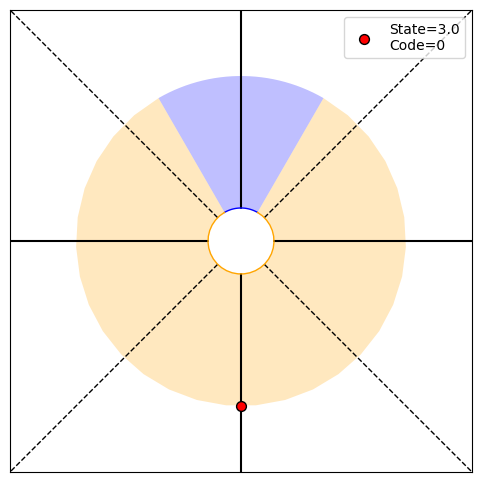

P(O1:40,S40|T)=[0.25 0.   0.25 0.25], P(O1:40|actions,T)=0.75, P(T|O1:40)=[0.87398305 0.12601695], H40=0.55
PRINT 1: 0.5464125743949473, [0.25 0.   0.25 0.25]
PRINT 2: [0.02243207 0.02243207], [0.87398305 0.12601695]
Choosing randomly
Current angle: -180.0, Code received: 0.0


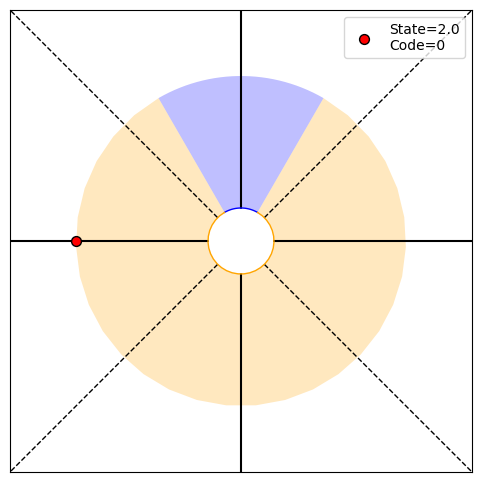

P(O1:41,S41|T)=[0.25 0.   0.25 0.25], P(O1:41|actions,T)=0.75, P(T|O1:41)=[0.91230502 0.08769498], H41=0.43
PRINT 1: 0.42872881317405476, [0.25 0.   0.25 0.25]
PRINT 2: [0.01638348 0.01638348], [0.91230502 0.08769498]
Choosing randomly
Current angle: -90.0, Code received: 0.0


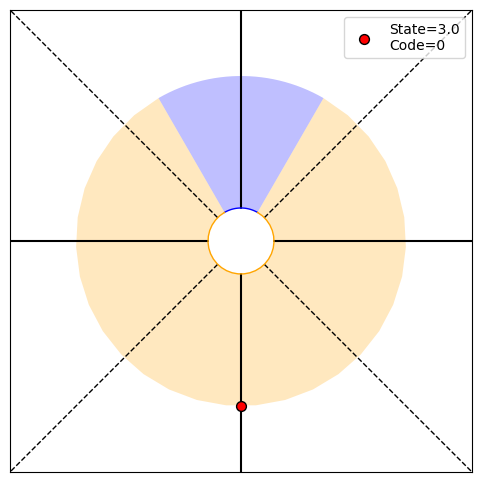

P(O1:42,S42|T)=[0.25 0.   0.25 0.25], P(O1:42|actions,T)=0.75, P(T|O1:42)=[0.93977624 0.06022376], H42=0.33
PRINT 1: 0.3283325360626588, [0.25 0.   0.25 0.25]
PRINT 2: [0.01163675 0.01163675], [0.93977624 0.06022376]
Choosing randomly
Current angle: -180.0, Code received: 0.0


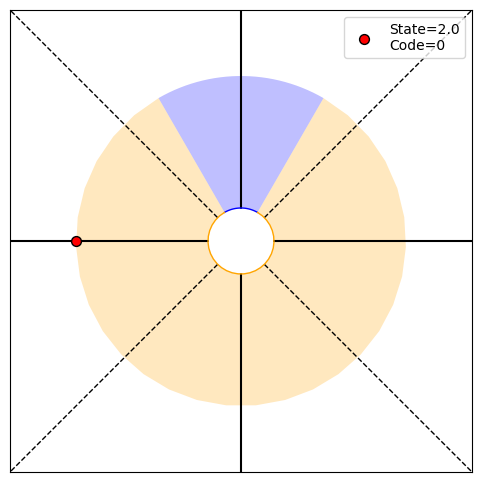

P(O1:43,S43|T)=[0.25 0.   0.25 0.25], P(O1:43|actions,T)=0.75, P(T|O1:43)=[0.95902834 0.04097166], H43=0.25
PRINT 1: 0.24672963606811826, [0.25 0.   0.25 0.25]
PRINT 2: [0.00810234 0.00810234], [0.95902834 0.04097166]
Choosing randomly
Current angle: -270.0, Code received: 1.0


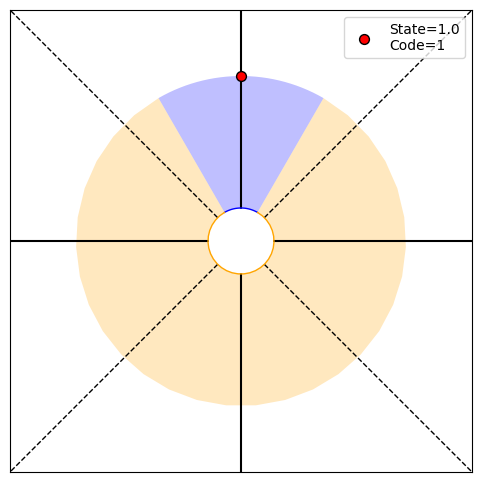

P(O1:44,S44|T)=[0.   0.25 0.   0.  ], P(O1:44|actions,T)=0.25, P(T|O1:44)=[0.92128188 0.07871812], H44=0.40
PRINT 1: 0.397646212693965, [0.   0.25 0.   0.  ]
PRINT 2: [0.01487045 0.01487045], [0.92128188 0.07871812]
Choosing randomly
Current angle: -360.0, Code received: 0.0


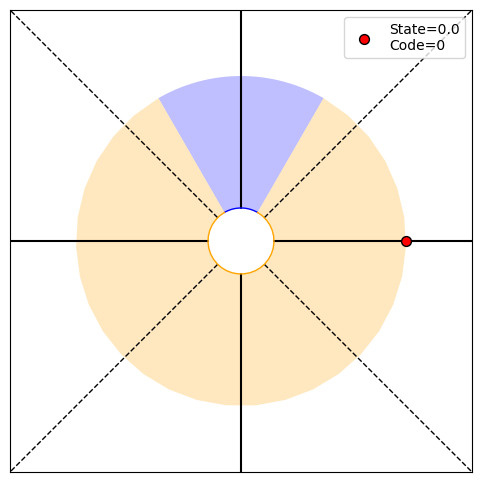

P(O1:45,S45|T)=[0.25 0.   0.25 0.25], P(O1:45|actions,T)=0.75, P(T|O1:45)=[0.94610714 0.05389286], H45=0.30
PRINT 1: 0.3027088519043973, [0.25 0.   0.25 0.25]
PRINT 2: [0.01049352 0.01049352], [0.94610714 0.05389286]
Choosing randomly
Current angle: -270.0, Code received: 1.0


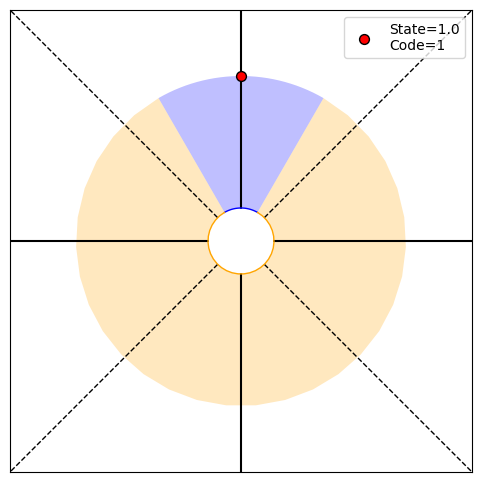

P(O1:46,S46|T)=[0.   0.25 0.   0.  ], P(O1:46|actions,T)=0.25, P(T|O1:46)=[0.89772611 0.10227389], H46=0.48
PRINT 1: 0.4761624792062217, [0.   0.25 0.   0.  ]
PRINT 2: [0.0187626 0.0187626], [0.89772611 0.10227389]
Choosing randomly
Current angle: -360.0, Code received: 0.0


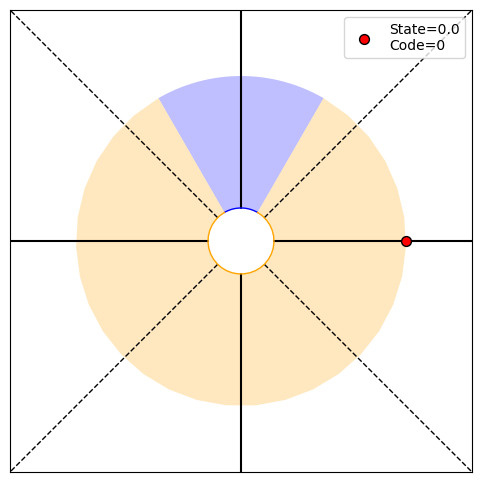

P(O1:47,S47|T)=[0.25 0.   0.25 0.25], P(O1:47|actions,T)=0.75, P(T|O1:47)=[0.92941094 0.07058906], H47=0.37
PRINT 1: 0.36811808737342816, [0.25 0.   0.25 0.25]
PRINT 2: [0.01346849 0.01346849], [0.92941094 0.07058906]
Choosing randomly
Current angle: -450.0, Code received: 0.0


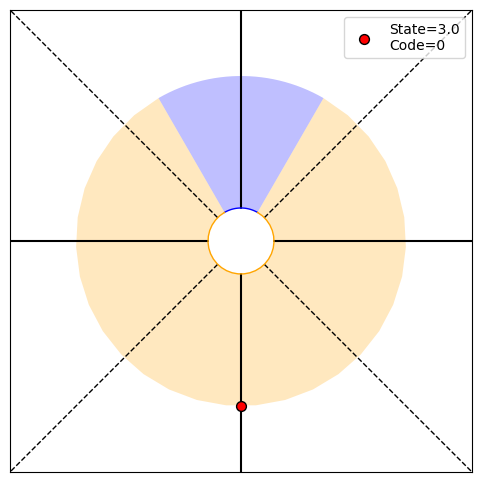

P(O1:48,S48|T)=[0.25 0.   0.25 0.25], P(O1:48|actions,T)=0.75, P(T|O1:48)=[0.95180665 0.04819335], H48=0.28
PRINT 1: 0.278672297359152, [0.25 0.   0.25 0.25]
PRINT 2: [0.00944837 0.00944837], [0.95180665 0.04819335]
Choosing randomly
Current angle: -360.0, Code received: 0.0


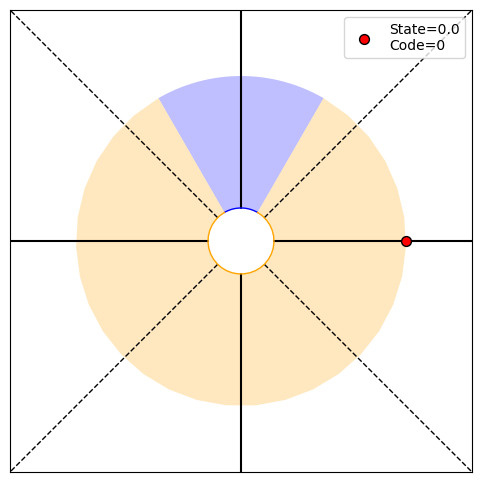

P(O1:49,S49|T)=[0.25 0.   0.25 0.25], P(O1:49|actions,T)=0.75, P(T|O1:49)=[0.96734654 0.03265346], H49=0.21
PRINT 1: 0.20752907338933768, [0.25 0.   0.25 0.25]
PRINT 2: [0.00652165 0.00652165], [0.96734654 0.03265346]
Choosing randomly
Current angle: -270.0, Code received: 1.0


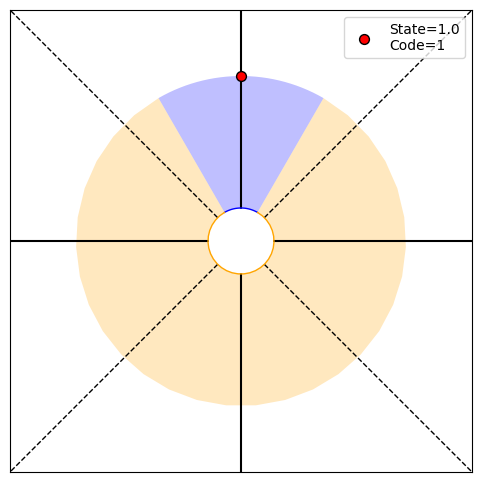

P(O1:50,S50|T)=[0.   0.25 0.   0.  ], P(O1:50|actions,T)=0.25, P(T|O1:50)=[0.93675814 0.06324186], H50=0.34
PRINT 1: 0.340181662758929, [0.   0.25 0.   0.  ]
PRINT 2: [0.01217522 0.01217522], [0.93675814 0.06324186]
Choosing randomly
Current angle: 0.0, Code received: 0.0


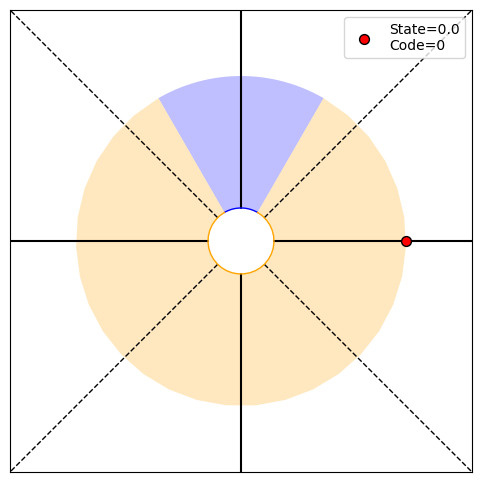

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.04730118 0.04730118], [0.6 0.4]
Choosing randomly
Current angle: -90.0, Code received: 0.0


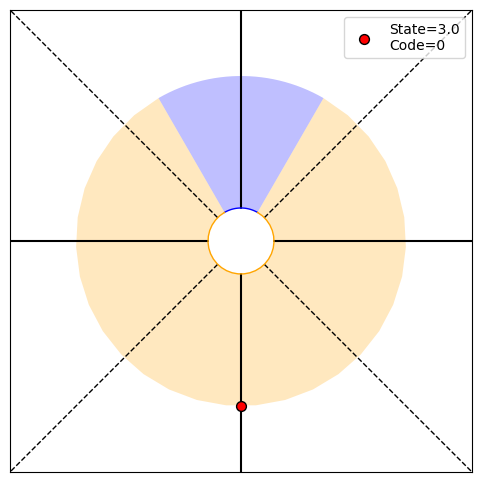

P(O1:2,S2|T)=[0.25 0.   0.25 0.25], P(O1:2|actions,T)=0.75, P(T|O1:2)=[0.69230769 0.30769231], H2=0.89
PRINT 1: 0.8904916402194913, [0.25 0.   0.25 0.25]
PRINT 2: [0.04240536 0.04240536], [0.69230769 0.30769231]
Choosing randomly
Current angle: -180.0, Code received: 0.0


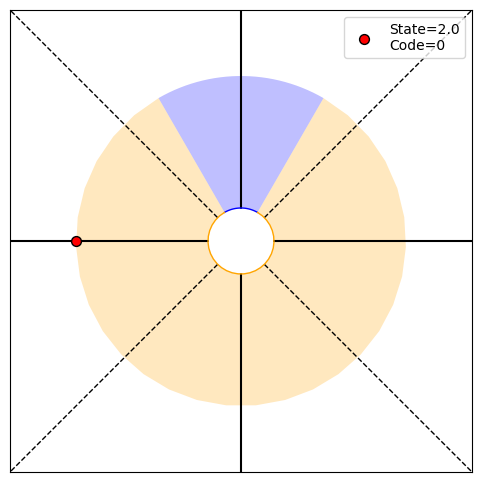

P(O1:3,S3|T)=[0.25 0.   0.25 0.25], P(O1:3|actions,T)=0.75, P(T|O1:3)=[0.77142857 0.22857143], H3=0.78
PRINT 1: 0.775512658133148, [0.25 0.   0.25 0.25]
PRINT 2: [0.03543325 0.03543325], [0.77142857 0.22857143]
Choosing randomly
Current angle: -270.0, Code received: 1.0


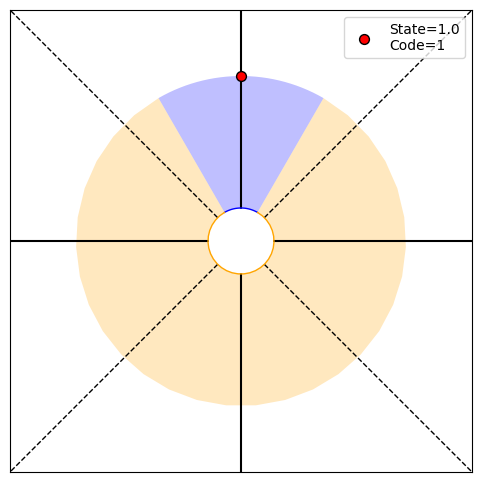

P(O1:4,S4|T)=[0.   0.25 0.   0.  ], P(O1:4|actions,T)=0.25, P(T|O1:4)=[0.62790698 0.37209302], H4=0.95
PRINT 1: 0.9522656254366644, [0.   0.25 0.   0.  ]
PRINT 2: [0.0461822 0.0461822], [0.62790698 0.37209302]
Choosing randomly
Current angle: -180.0, Code received: 0.0


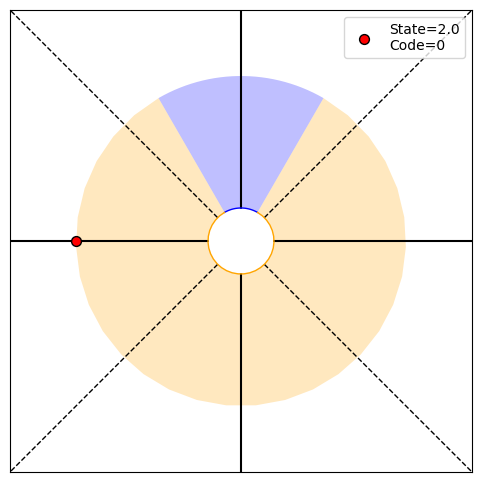

P(O1:5,S5|T)=[0.25 0.   0.25 0.25], P(O1:5|actions,T)=0.75, P(T|O1:5)=[0.71681416 0.28318584], H5=0.86
PRINT 1: 0.8597555090200143, [0.25 0.   0.25 0.25]
PRINT 2: [0.04052399 0.04052399], [0.71681416 0.28318584]
Choosing randomly
Current angle: -270.0, Code received: 1.0


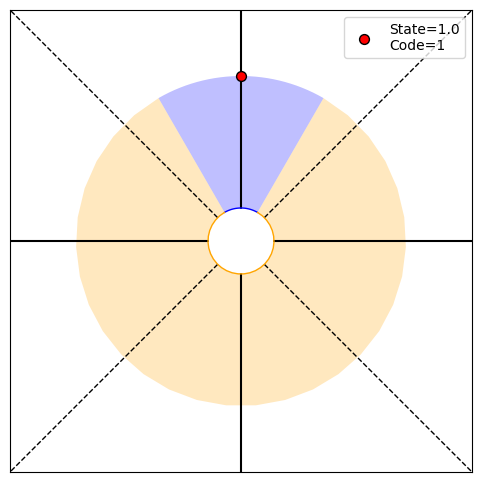

P(O1:6,S6|T)=[0.   0.25 0.   0.  ], P(O1:6|actions,T)=0.25, P(T|O1:6)=[0.55862069 0.44137931], H6=0.99
PRINT 1: 0.9900618470242131, [0.   0.25 0.   0.  ]
PRINT 2: [0.04839299 0.04839299], [0.55862069 0.44137931]
Choosing randomly
Current angle: -180.0, Code received: 0.0


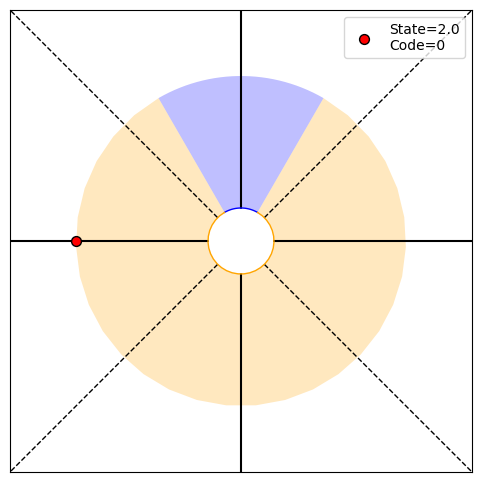

P(O1:7,S7|T)=[0.25 0.   0.25 0.25], P(O1:7|actions,T)=0.75, P(T|O1:7)=[0.65498652 0.34501348], H7=0.93
PRINT 1: 0.9295356505393889, [0.25 0.   0.25 0.25]
PRINT 2: [0.04479852 0.04479852], [0.65498652 0.34501348]
Choosing randomly
Current angle: -90.0, Code received: 0.0


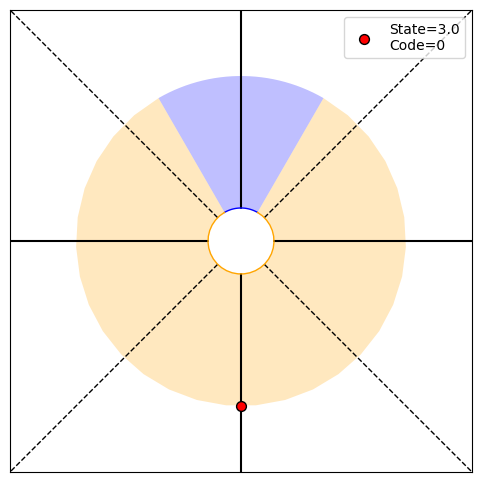

P(O1:8,S8|T)=[0.25 0.   0.25 0.25], P(O1:8|actions,T)=0.75, P(T|O1:8)=[0.74010152 0.25989848], H8=0.83
PRINT 1: 0.8265931344916198, [0.25 0.   0.25 0.25]
PRINT 2: [0.03850594 0.03850594], [0.74010152 0.25989848]
Choosing randomly
Current angle: 0.0, Code received: 0.0


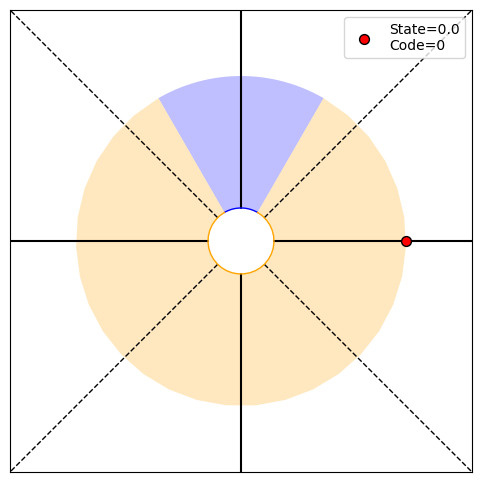

P(O1:9,S9|T)=[0.25 0.   0.25 0.25], P(O1:9|actions,T)=0.75, P(T|O1:9)=[0.81030011 0.18969989], H9=0.70
PRINT 1: 0.700843228291535, [0.25 0.   0.25 0.25]
PRINT 2: [0.03104175 0.03104175], [0.81030011 0.18969989]
Choosing randomly
Current angle: -90.0, Code received: 0.0


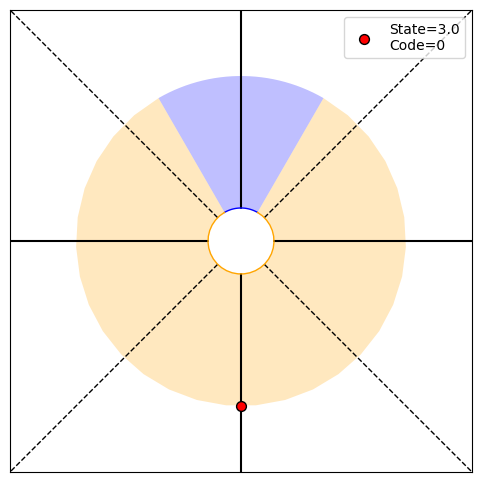

P(O1:10,S10|T)=[0.25 0.   0.25 0.25], P(O1:10|actions,T)=0.75, P(T|O1:10)=[0.8649967 0.1350033], H10=0.57
PRINT 1: 0.5710017923786879, [0.25 0.   0.25 0.25]
PRINT 2: [0.02375517 0.02375517], [0.8649967 0.1350033]
Choosing randomly
Current angle: 0.0, Code received: 0.0


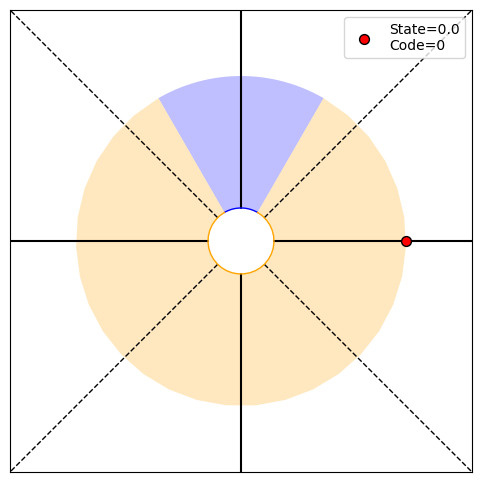

P(O1:11,S11|T)=[0.25 0.   0.25 0.25], P(O1:11|actions,T)=0.75, P(T|O1:11)=[0.90575675 0.09424325], H11=0.45
PRINT 1: 0.4504768327942288, [0.25 0.   0.25 0.25]
PRINT 2: [0.01746401 0.01746401], [0.90575675 0.09424325]
Choosing randomly
Current angle: -90.0, Code received: 0.0


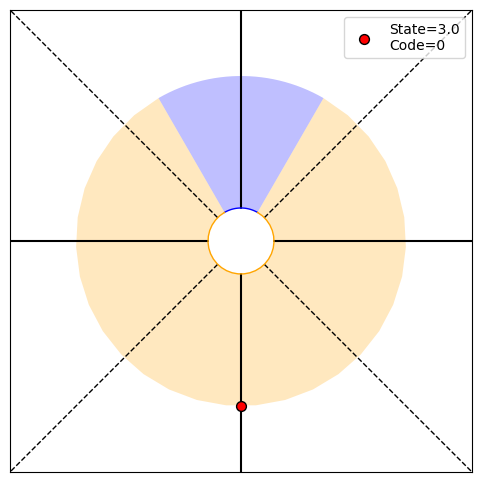

P(O1:12,S12|T)=[0.25 0.   0.25 0.25], P(O1:12|actions,T)=0.75, P(T|O1:12)=[0.93513342 0.06486658], H12=0.35
PRINT 1: 0.34646787085955577, [0.25 0.   0.25 0.25]
PRINT 2: [0.01246335 0.01246335], [0.93513342 0.06486658]
Choosing randomly
Current angle: -180.0, Code received: 0.0


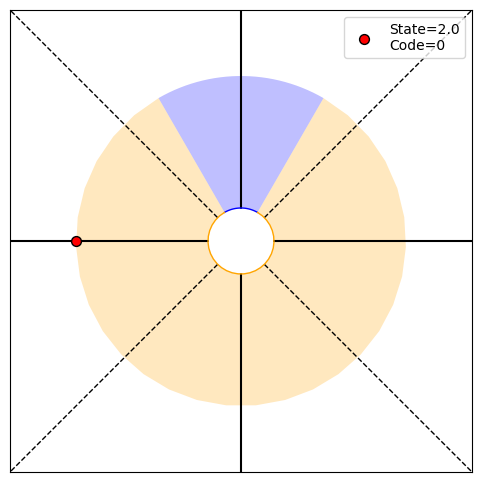

P(O1:13,S13|T)=[0.25 0.   0.25 0.25], P(O1:13|actions,T)=0.75, P(T|O1:13)=[0.95579991 0.04420009], H13=0.26
PRINT 1: 0.26122861470306796, [0.25 0.   0.25 0.25]
PRINT 2: [0.00870709 0.00870709], [0.95579991 0.04420009]
Choosing randomly
Current angle: -270.0, Code received: 1.0


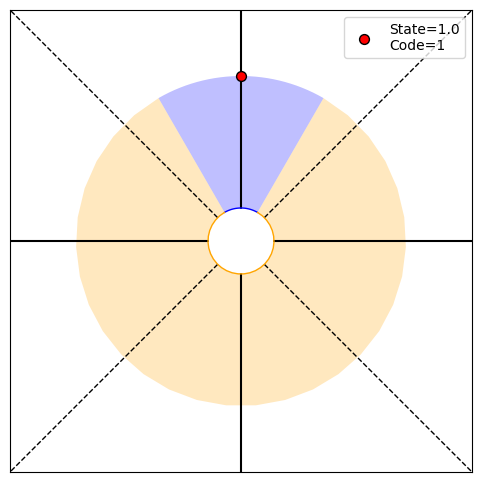

P(O1:14,S14|T)=[0.   0.25 0.   0.  ], P(O1:14|actions,T)=0.25, P(T|O1:14)=[0.91534173 0.08465827], H14=0.42
PRINT 1: 0.41838388657190634, [0.   0.25 0.   0.  ]
PRINT 2: [0.01587577 0.01587577], [0.91534173 0.08465827]
Choosing randomly
Current angle: -360.0, Code received: 0.0


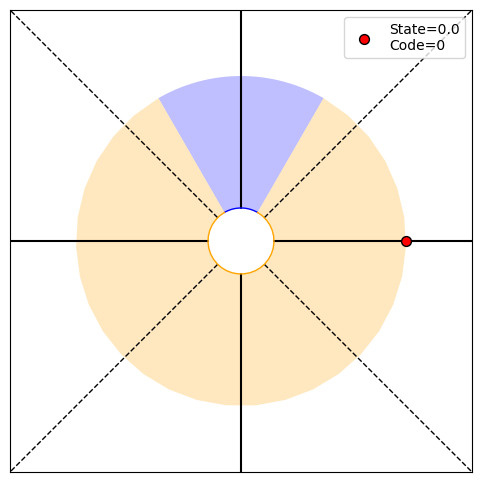

P(O1:15,S15|T)=[0.25 0.   0.25 0.25], P(O1:15|actions,T)=0.75, P(T|O1:15)=[0.94192223 0.05807777], H15=0.32
PRINT 1: 0.3197666421936681, [0.25 0.   0.25 0.25]
PRINT 2: [0.01125131 0.01125131], [0.94192223 0.05807777]
Choosing randomly
Current angle: -270.0, Code received: 1.0


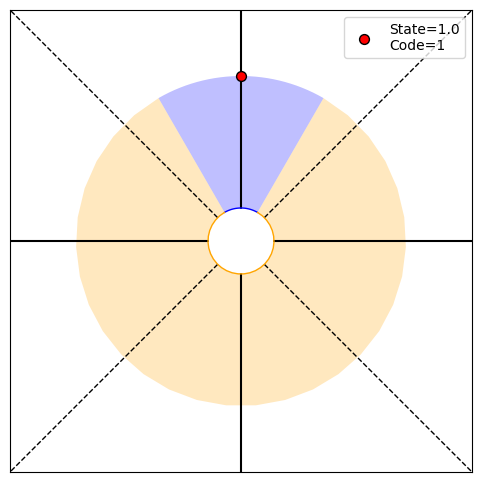

P(O1:16,S16|T)=[0.   0.25 0.   0.  ], P(O1:16|actions,T)=0.25, P(T|O1:16)=[0.89022023 0.10977977], H16=0.50
PRINT 1: 0.4992513317937652, [0.   0.25 0.   0.  ]
PRINT 2: [0.01994999 0.01994999], [0.89022023 0.10977977]
Choosing randomly
Current angle: -360.0, Code received: 0.0


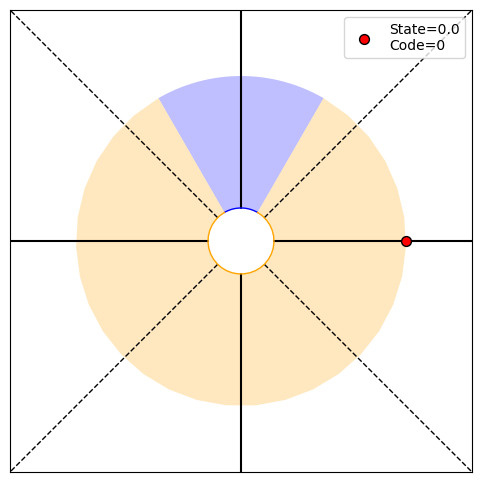

P(O1:17,S17|T)=[0.25 0.   0.25 0.25], P(O1:17|actions,T)=0.75, P(T|O1:17)=[0.92403363 0.07596637], H17=0.39
PRINT 1: 0.3878044817510643, [0.25 0.   0.25 0.25]
PRINT 2: [0.01439927 0.01439927], [0.92403363 0.07596637]
Choosing randomly
Current angle: -450.0, Code received: 0.0


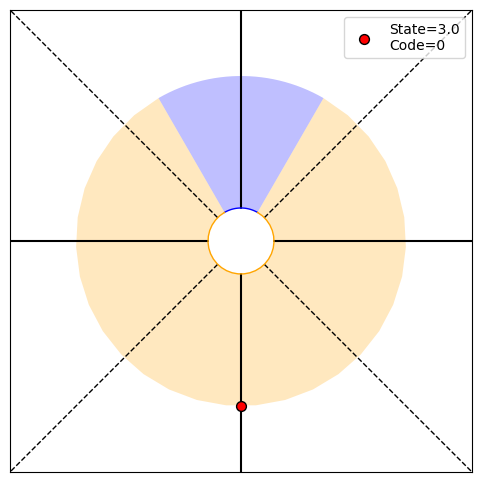

P(O1:18,S18|T)=[0.25 0.   0.25 0.25], P(O1:18|actions,T)=0.75, P(T|O1:18)=[0.94804001 0.05195999], H18=0.29
PRINT 1: 0.29466520444634614, [0.25 0.   0.25 0.25]
PRINT 2: [0.01014077 0.01014077], [0.94804001 0.05195999]
Choosing randomly
Current angle: -540.0, Code received: 0.0


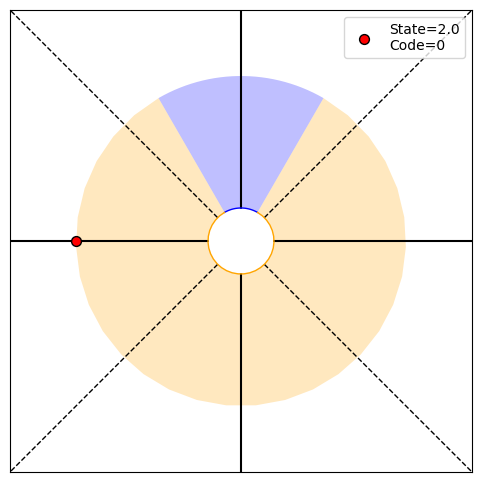

P(O1:19,S19|T)=[0.25 0.   0.25 0.25], P(O1:19|actions,T)=0.75, P(T|O1:19)=[0.96474947 0.03525053], H19=0.22
PRINT 1: 0.22007519863720576, [0.25 0.   0.25 0.25]
PRINT 2: [0.00701866 0.00701866], [0.96474947 0.03525053]
Choosing randomly
Current angle: -450.0, Code received: 0.0


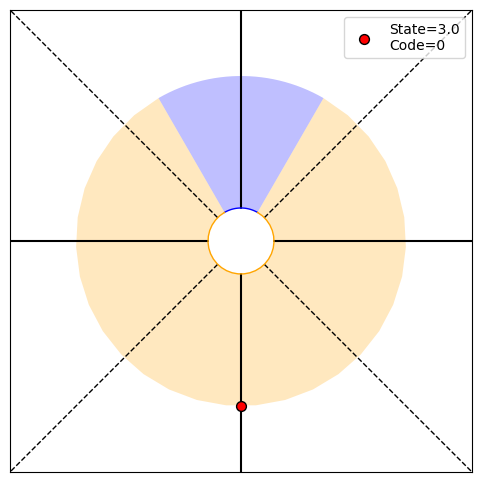

P(O1:20,S20|T)=[0.25 0.   0.25 0.25], P(O1:20|actions,T)=0.75, P(T|O1:20)=[0.97622023 0.02377977], H20=0.16
PRINT 1: 0.16216674258596345, [0.25 0.   0.25 0.25]
PRINT 2: [0.00479949 0.00479949], [0.97622023 0.02377977]
Choosing randomly
Current angle: -360.0, Code received: 0.0


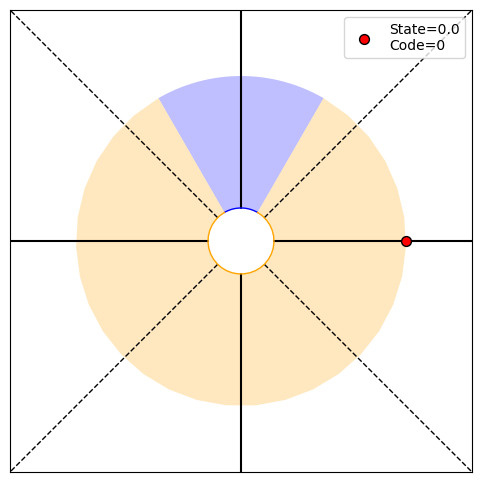

P(O1:21,S21|T)=[0.25 0.   0.25 0.25], P(O1:21|actions,T)=0.75, P(T|O1:21)=[0.98402015 0.01597985], H21=0.12
PRINT 1: 0.11823022358658546, [0.25 0.   0.25 0.25]
PRINT 2: [0.00325493 0.00325493], [0.98402015 0.01597985]
Choosing randomly
Current angle: -450.0, Code received: 0.0


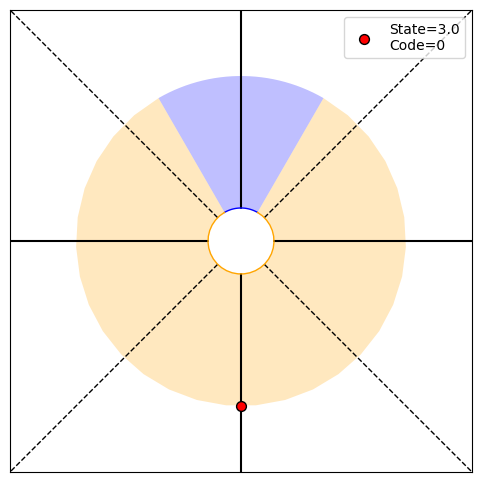

P(O1:22,S22|T)=[0.25 0.   0.25 0.25], P(O1:22|actions,T)=0.75, P(T|O1:22)=[0.98928972 0.01071028], H22=0.09
PRINT 1: 0.08546590665756237, [0.25 0.   0.25 0.25]
PRINT 2: [0.00219507 0.00219507], [0.98928972 0.01071028]
Choosing randomly
Current angle: -360.0, Code received: 0.0


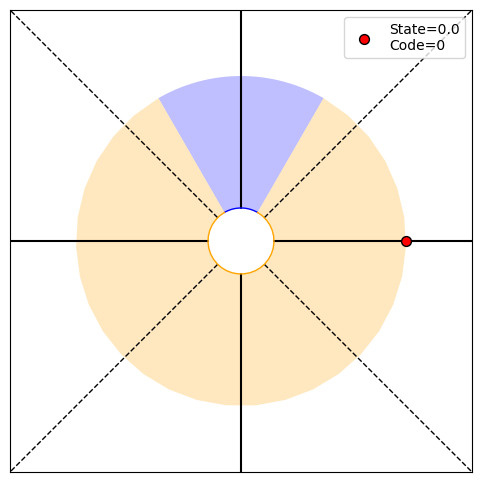

P(O1:23,S23|T)=[0.25 0.   0.25 0.25], P(O1:23|actions,T)=0.75, P(T|O1:23)=[0.99283423 0.00716577], H23=0.06
PRINT 1: 0.06135457802905351, [0.25 0.   0.25 0.25]
PRINT 2: [0.0014747 0.0014747], [0.99283423 0.00716577]
Choosing randomly
Current angle: -270.0, Code received: 1.0


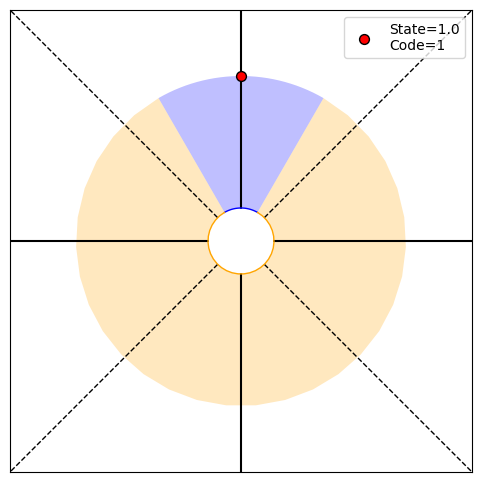

P(O1:24,S24|T)=[0.   0.25 0.   0.  ], P(O1:24|actions,T)=0.25, P(T|O1:24)=[0.98577043 0.01422957], H24=0.11
PRINT 1: 0.10768008794573203, [0.   0.25 0.   0.  ]
PRINT 2: [0.00290437 0.00290437], [0.98577043 0.01422957]
Choosing randomly
Current angle: -360.0, Code received: 0.0


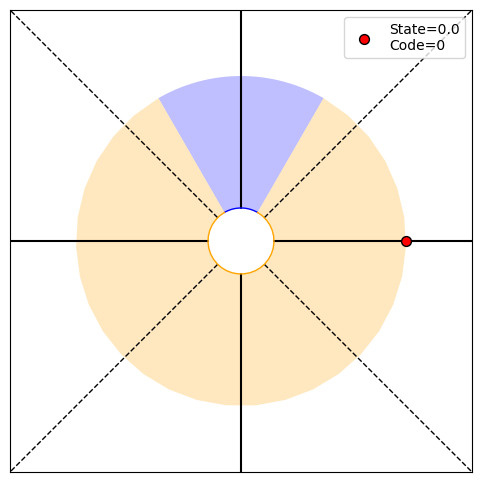

P(O1:25,S25|T)=[0.25 0.   0.25 0.25], P(O1:25|actions,T)=0.75, P(T|O1:25)=[0.99046841 0.00953159], H25=0.08
PRINT 1: 0.07767164973422992, [0.25 0.   0.25 0.25]
PRINT 2: [0.00195618 0.00195618], [0.99046841 0.00953159]
Choosing randomly
Current angle: -450.0, Code received: 0.0


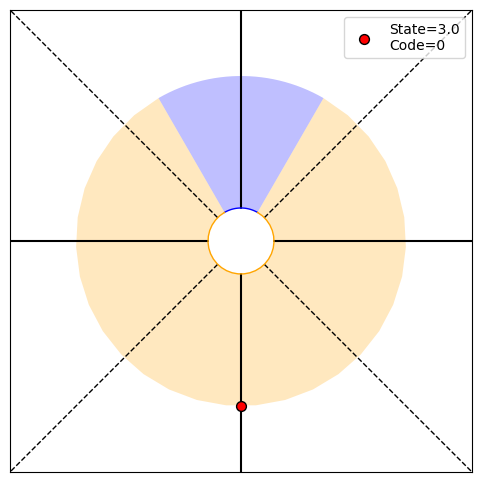

P(O1:26,S26|T)=[0.25 0.   0.25 0.25], P(O1:26|actions,T)=0.75, P(T|O1:26)=[0.99362535 0.00637465], H26=0.06
PRINT 1: 0.0556604009075222, [0.25 0.   0.25 0.25]
PRINT 2: [0.0013131 0.0013131], [0.99362535 0.00637465]
Choosing randomly
Current angle: -360.0, Code received: 0.0


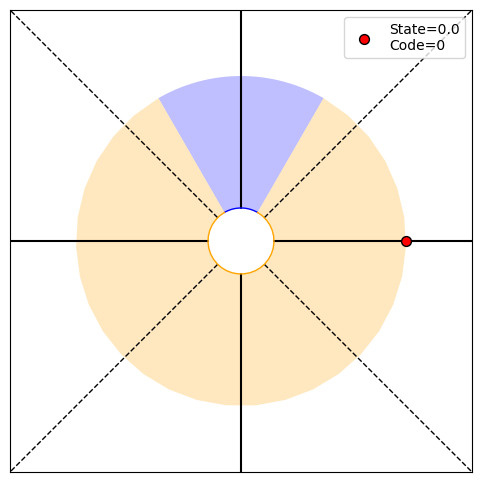

P(O1:27,S27|T)=[0.25 0.   0.25 0.25], P(O1:27|actions,T)=0.75, P(T|O1:27)=[0.99574119 0.00425881], H27=0.04
PRINT 1: 0.03967065026429185, [0.25 0.   0.25 0.25]
PRINT 2: [0.00087943 0.00087943], [0.99574119 0.00425881]
Choosing randomly
Current angle: -450.0, Code received: 0.0


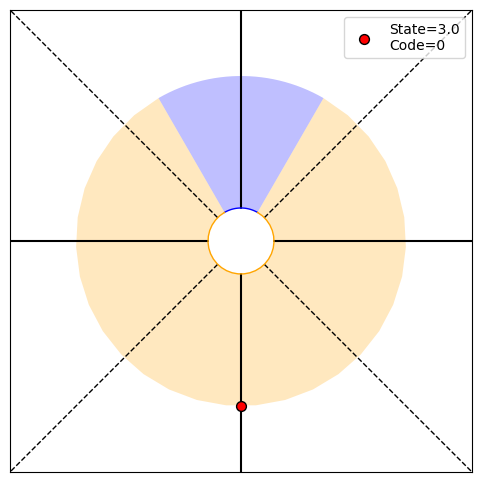

P(O1:28,S28|T)=[0.25 0.   0.25 0.25], P(O1:28|actions,T)=0.75, P(T|O1:28)=[0.99715675 0.00284325], H28=0.03
PRINT 1: 0.02814497325544187, [0.25 0.   0.25 0.25]
PRINT 2: [0.00058808 0.00058808], [0.99715675 0.00284325]
Choosing randomly
Current angle: -360.0, Code received: 0.0


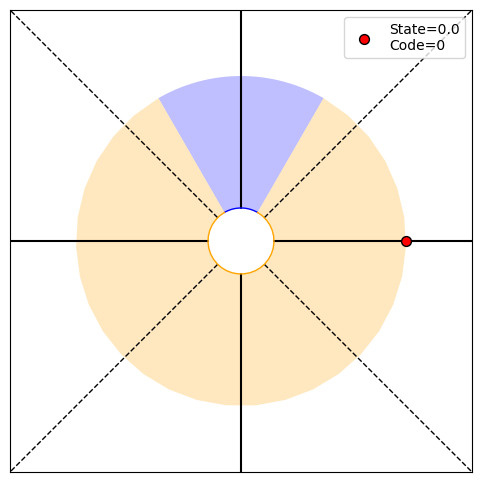

P(O1:29,S29|T)=[0.25 0.   0.25 0.25], P(O1:29|actions,T)=0.75, P(T|O1:29)=[0.9981027 0.0018973], H29=0.02
PRINT 1: 0.019889663304754057, [0.25 0.   0.25 0.25]
PRINT 2: [0.00039286 0.00039286], [0.9981027 0.0018973]
Choosing randomly
Current angle: -270.0, Code received: 1.0


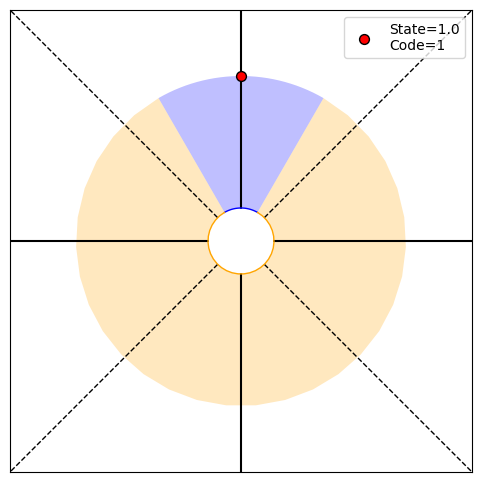

P(O1:30,S30|T)=[0.   0.25 0.   0.  ], P(O1:30|actions,T)=0.25, P(T|O1:30)=[0.99621259 0.00378741], H30=0.04
PRINT 1: 0.03592177455650257, [0.   0.25 0.   0.  ]
PRINT 2: [0.00078251 0.00078251], [0.99621259 0.00378741]
Choosing randomly
Current angle: -360.0, Code received: 0.0


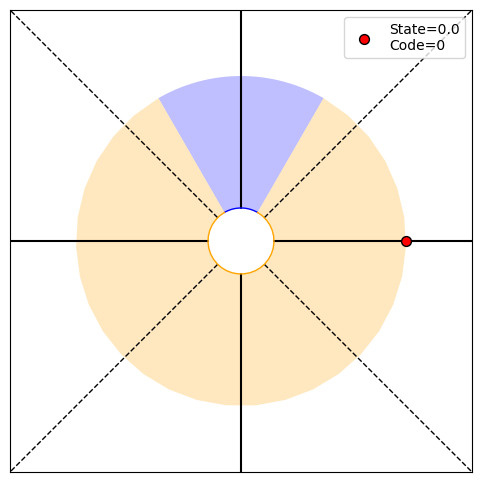

P(O1:31,S31|T)=[0.25 0.   0.25 0.25], P(O1:31|actions,T)=0.75, P(T|O1:31)=[0.99747187 0.00252813], H31=0.03
PRINT 1: 0.02545467553544495, [0.25 0.   0.25 0.25]
PRINT 2: [0.0005231 0.0005231], [0.99747187 0.00252813]
Choosing randomly
Current angle: -450.0, Code received: 0.0


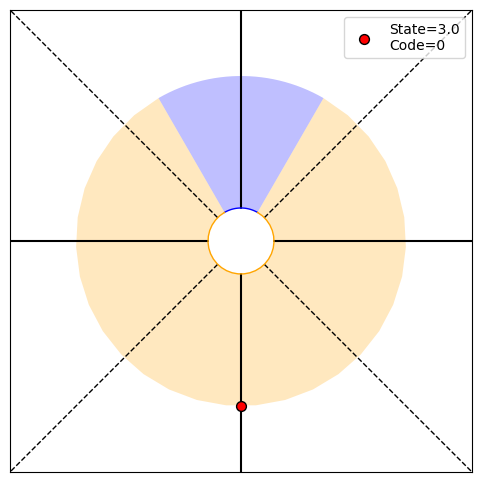

P(O1:32,S32|T)=[0.25 0.   0.25 0.25], P(O1:32|actions,T)=0.75, P(T|O1:32)=[0.99831316 0.00168684], H32=0.02
PRINT 1: 0.017969808259611836, [0.25 0.   0.25 0.25]
PRINT 2: [0.00034937 0.00034937], [0.99831316 0.00168684]
Choosing randomly
Current angle: -360.0, Code received: 0.0


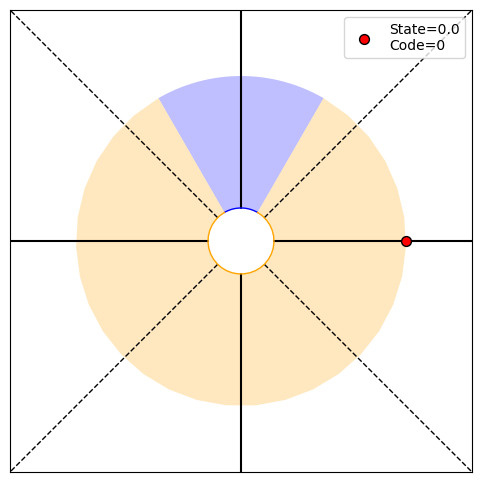

P(O1:33,S33|T)=[0.25 0.   0.25 0.25], P(O1:33|actions,T)=0.75, P(T|O1:33)=[0.99887481 0.00112519], H33=0.01
PRINT 1: 0.012644351025042303, [0.25 0.   0.25 0.25]
PRINT 2: [0.00023319 0.00023319], [0.99887481 0.00112519]
Choosing randomly
Current angle: -450.0, Code received: 0.0


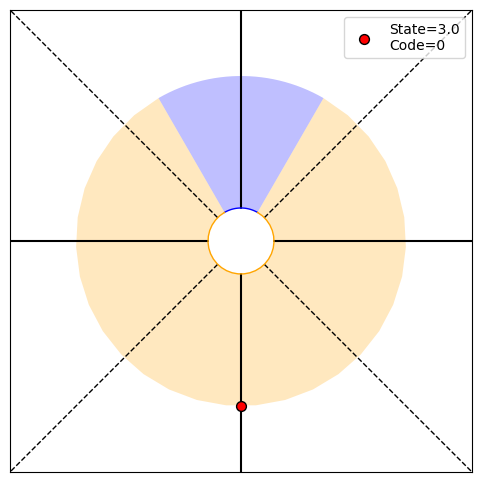

P(O1:34,S34|T)=[0.25 0.   0.25 0.25], P(O1:34|actions,T)=0.75, P(T|O1:34)=[9.99249590e-01 7.50410149e-04], H34=0.01
PRINT 1: 0.008871488837464461, [0.25 0.   0.25 0.25]
PRINT 2: [0.00015559 0.00015559], [9.99249590e-01 7.50410149e-04]
Choosing randomly
Current angle: -540.0, Code received: 0.0


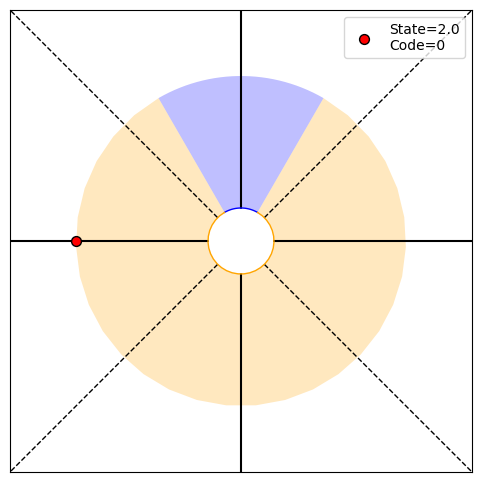

P(O1:35,S35|T)=[0.25 0.   0.25 0.25], P(O1:35|actions,T)=0.75, P(T|O1:35)=[9.99499601e-01 5.00398601e-04], H35=0.01
PRINT 1: 0.006208429748903923, [0.25 0.   0.25 0.25]
PRINT 2: [0.00010378 0.00010378], [9.99499601e-01 5.00398601e-04]
Choosing randomly
Current angle: -630.0, Code received: 1.0


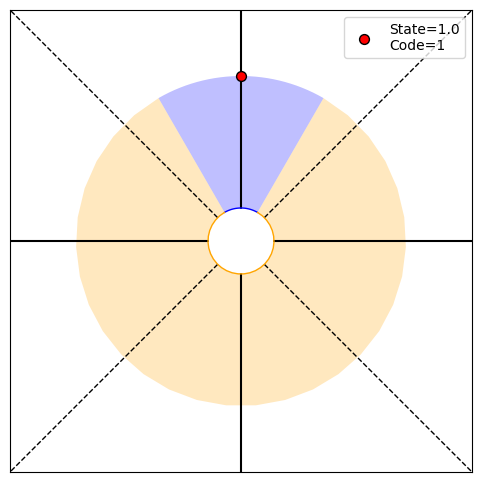

P(O1:36,S36|T)=[0.   0.25 0.   0.  ], P(O1:36|actions,T)=0.25, P(T|O1:36)=[0.9989997 0.0010003], H36=0.01
PRINT 1: 0.011410713640213035, [0.   0.25 0.   0.  ]
PRINT 2: [0.00020734 0.00020734], [0.9989997 0.0010003]
Choosing randomly
Current angle: -720.0, Code received: 0.0


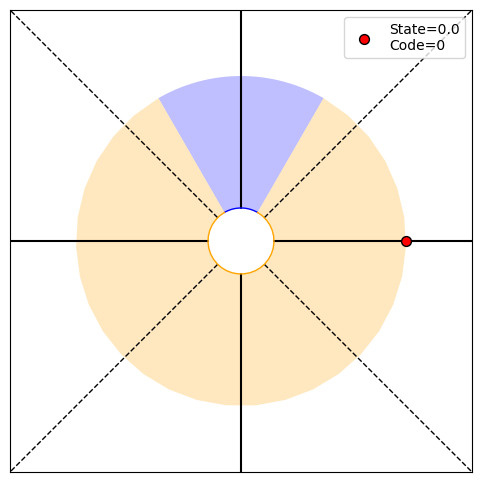

P(O1:37,S37|T)=[0.25 0.   0.25 0.25], P(O1:37|actions,T)=0.75, P(T|O1:37)=[9.99332913e-01 6.67086865e-04], H37=0.01
PRINT 1: 0.00799974002026101, [0.25 0.   0.25 0.25]
PRINT 2: [0.00013833 0.00013833], [9.99332913e-01 6.67086865e-04]
Choosing randomly
Current angle: -630.0, Code received: 1.0


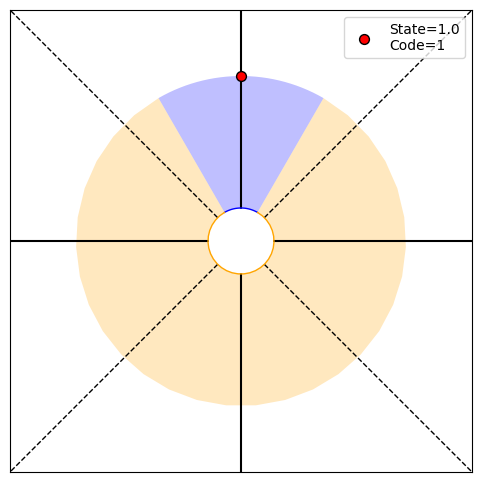

P(O1:38,S38|T)=[0.   0.25 0.   0.  ], P(O1:38|actions,T)=0.25, P(T|O1:38)=[0.99866672 0.00133328], H38=0.01
PRINT 1: 0.014656171378362066, [0.   0.25 0.   0.  ]
PRINT 2: [0.00027625 0.00027625], [0.99866672 0.00133328]
Choosing randomly
Current angle: -540.0, Code received: 0.0


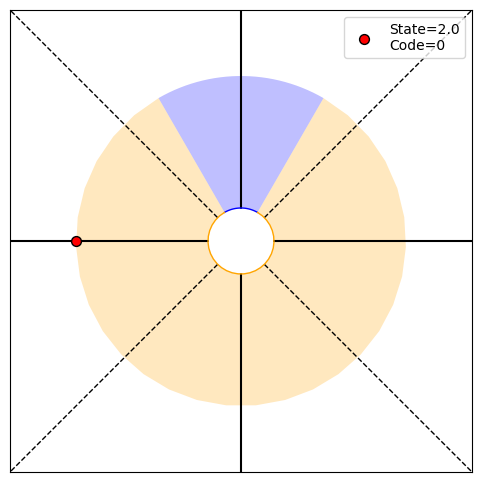

P(O1:39,S39|T)=[0.25 0.   0.25 0.25], P(O1:39|actions,T)=0.75, P(T|O1:39)=[9.99110749e-01 8.89251417e-04], H39=0.01
PRINT 1: 0.010295018740227476, [0.25 0.   0.25 0.25]
PRINT 2: [0.00018435 0.00018435], [9.99110749e-01 8.89251417e-04]
Choosing randomly
Current angle: -630.0, Code received: 1.0


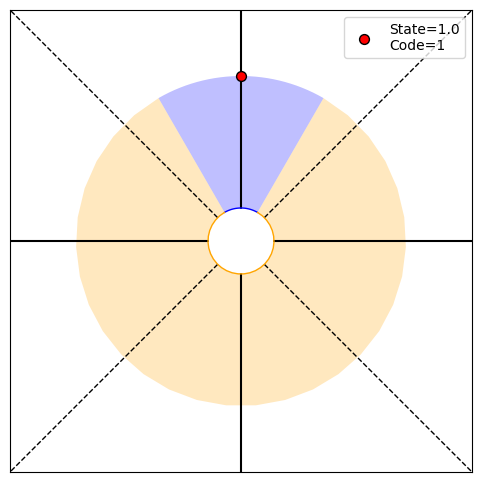

P(O1:40,S40|T)=[0.   0.25 0.   0.  ], P(O1:40|actions,T)=0.25, P(T|O1:40)=[0.99822308 0.00177692], H40=0.02
PRINT 1: 0.018795961149158703, [0.   0.25 0.   0.  ]
PRINT 2: [0.00036799 0.00036799], [0.99822308 0.00177692]
Choosing randomly
Current angle: -540.0, Code received: 0.0


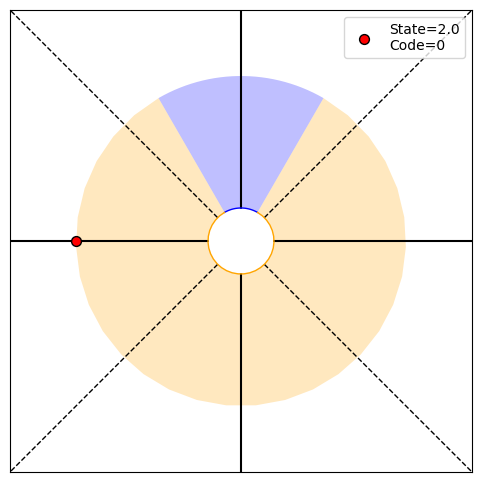

P(O1:41,S41|T)=[0.25 0.   0.25 0.25], P(O1:41|actions,T)=0.75, P(T|O1:41)=[0.99881468 0.00118532], H41=0.01
PRINT 1: 0.013230926437444005, [0.25 0.   0.25 0.25]
PRINT 2: [0.00024564 0.00024564], [0.99881468 0.00118532]
Choosing randomly
Current angle: -450.0, Code received: 0.0


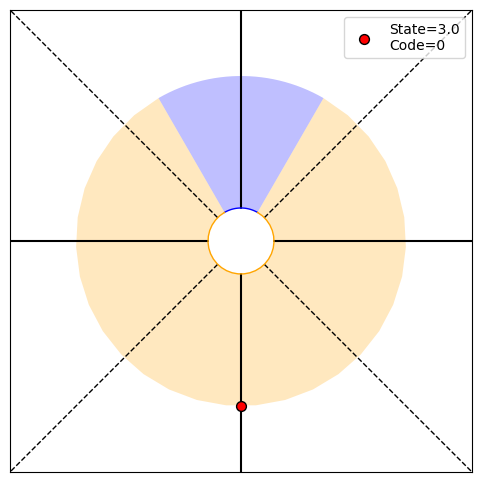

P(O1:42,S42|T)=[0.25 0.   0.25 0.25], P(O1:42|actions,T)=0.75, P(T|O1:42)=[9.99209476e-01 7.90523812e-04], H42=0.01
PRINT 1: 0.009286305440277658, [0.25 0.   0.25 0.25]
PRINT 2: [0.0001639 0.0001639], [9.99209476e-01 7.90523812e-04]
Choosing randomly
Current angle: -360.0, Code received: 0.0


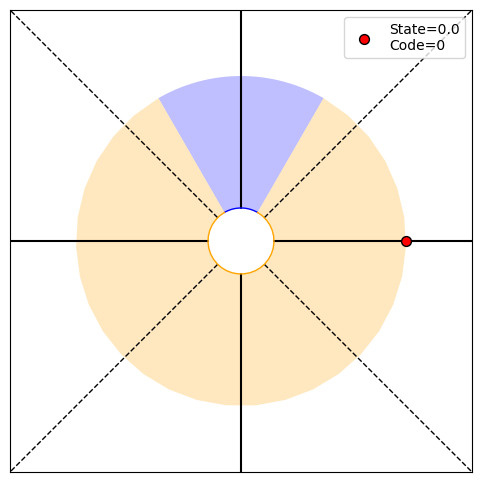

P(O1:43,S43|T)=[0.25 0.   0.25 0.25], P(O1:43|actions,T)=0.75, P(T|O1:43)=[9.99472845e-01 5.27154784e-04], H43=0.01
PRINT 1: 0.006500767610566482, [0.25 0.   0.25 0.25]
PRINT 2: [0.00010933 0.00010933], [9.99472845e-01 5.27154784e-04]
Choosing randomly
Current angle: -270.0, Code received: 1.0


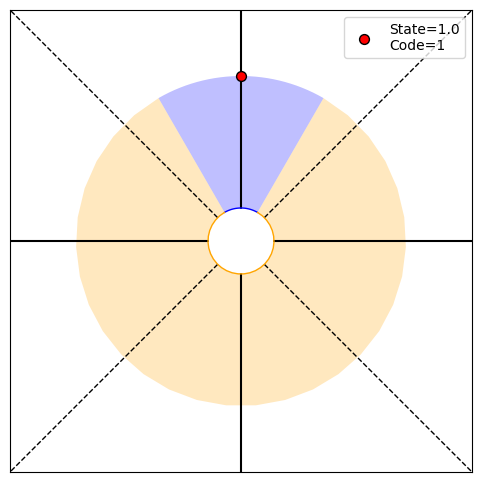

P(O1:44,S44|T)=[0.   0.25 0.   0.  ], P(O1:44|actions,T)=0.25, P(T|O1:44)=[0.99894625 0.00105375], H44=0.01
PRINT 1: 0.011941331636332002, [0.   0.25 0.   0.  ]
PRINT 2: [0.00021841 0.00021841], [0.99894625 0.00105375]
Choosing randomly
Current angle: -360.0, Code received: 0.0


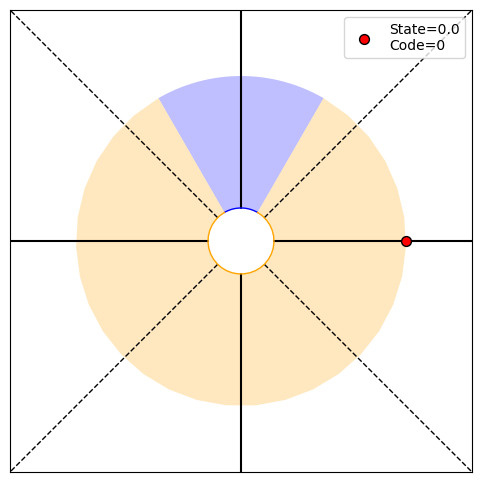

P(O1:45,S45|T)=[0.25 0.   0.25 0.25], P(O1:45|actions,T)=0.75, P(T|O1:45)=[9.9929725e-01 7.0274956e-04], H45=0.01
PRINT 1: 0.008374589010415982, [0.25 0.   0.25 0.25]
PRINT 2: [0.00014571 0.00014571], [9.9929725e-01 7.0274956e-04]
Choosing randomly
Current angle: -270.0, Code received: 1.0


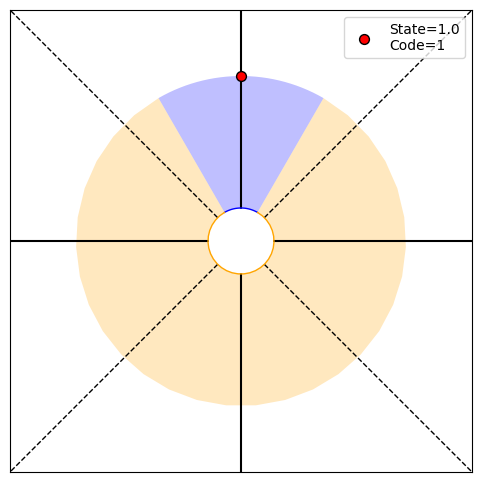

P(O1:46,S46|T)=[0.   0.25 0.   0.  ], P(O1:46|actions,T)=0.25, P(T|O1:46)=[0.99859549 0.00140451], H46=0.02
PRINT 1: 0.015333615694880176, [0.   0.25 0.   0.  ]
PRINT 2: [0.00029099 0.00029099], [0.99859549 0.00140451]
Choosing randomly
Current angle: -360.0, Code received: 0.0


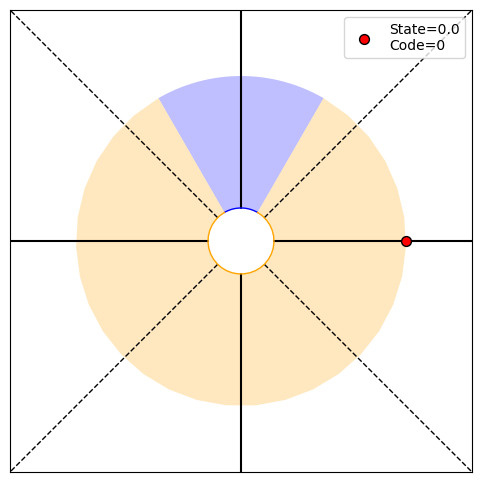

P(O1:47,S47|T)=[0.25 0.   0.25 0.25], P(O1:47|actions,T)=0.75, P(T|O1:47)=[9.99063220e-01 9.36779972e-04], H47=0.01
PRINT 1: 0.010774863132034266, [0.25 0.   0.25 0.25]
PRINT 2: [0.00019419 0.00019419], [9.99063220e-01 9.36779972e-04]
Choosing randomly
Current angle: -270.0, Code received: 1.0


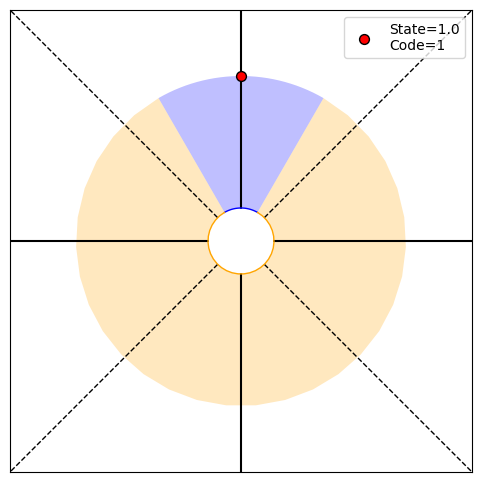

P(O1:48,S48|T)=[0.   0.25 0.   0.  ], P(O1:48|actions,T)=0.25, P(T|O1:48)=[0.99812819 0.00187181], H48=0.02
PRINT 1: 0.019659016193745056, [0.   0.25 0.   0.  ]
PRINT 2: [0.00038759 0.00038759], [0.99812819 0.00187181]
Choosing randomly
Current angle: -180.0, Code received: 0.0


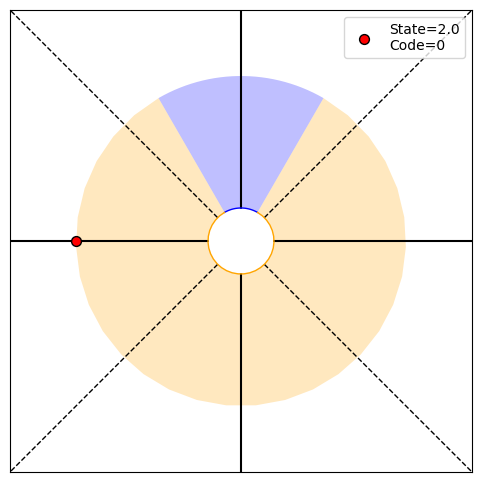

P(O1:49,S49|T)=[0.25 0.   0.25 0.25], P(O1:49|actions,T)=0.75, P(T|O1:49)=[0.99875135 0.00124865], H49=0.01
PRINT 1: 0.013844044214476952, [0.25 0.   0.25 0.25]
PRINT 2: [0.00025874 0.00025874], [0.99875135 0.00124865]
Choosing randomly
Current angle: -90.0, Code received: 0.0


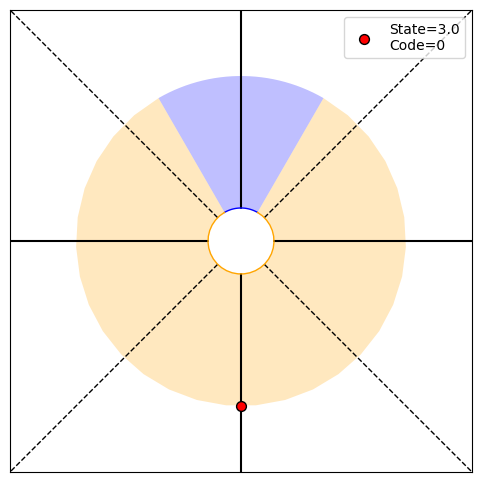

P(O1:50,S50|T)=[0.25 0.   0.25 0.25], P(O1:50|actions,T)=0.75, P(T|O1:50)=[9.9916722e-01 8.3277999e-04], H50=0.01
PRINT 1: 0.009720100719372203, [0.25 0.   0.25 0.25]
PRINT 2: [0.00017265 0.00017265], [9.9916722e-01 8.3277999e-04]
Choosing randomly


In [13]:
while trial_num < 10: 
    joint_prob_obs_state_t = np.zeros((max_iter, EMISSION_MATRIX_B.shape[0], EMISSION_MATRIX_B.shape[1]))
    joint_prob_received_obs_state_t = np.zeros((max_iter, EMISSION_MATRIX_B.shape[1]))
    joint_prob_obs_state_forecast_t = np.zeros((max_iter, EMISSION_MATRIX_B.shape[0], EMISSION_MATRIX_B.shape[1]))
    likelihood_received_obs_from_target_t = np.zeros(max_iter)
    angles_visited = np.zeros(max_iter)
    posterior_t = np.zeros((max_iter, NUM_BELIEFS))
    current_entropyS_t = np.zeros(max_iter)
    candidate_steps = np.array([-STATE_STEP, STATE_STEP])
    expected_forecast_t_S_per_step = np.zeros((max_iter, candidate_steps.shape[0]))
    deltaS_t = np.zeros((max_iter, candidate_steps.shape[0]))
    code_received_t = np.zeros(max_iter)

    time_ind = 0
    initial_angle = 0

    while time_ind<max_iter:
        if time_ind<1:
            angles_visited[time_ind] = initial_angle
        else:
            angles_visited[time_ind] = angles_visited[time_ind-1] + np.rad2deg(step_to_take)

        if (angles_visited[time_ind]%360) >= obs1_bounds[0] and (angles_visited[time_ind]%360) <= obs1_bounds[1]:
            code_received_t[time_ind] = 1
        else:
            code_received_t[time_ind] = 0
        print(f'Current angle: {angles_visited[time_ind]}, Code received: {code_received_t[time_ind]}')
        observe_angle_state_pair((angles_visited[time_ind]%360))

        joint_prob_obs_state_t[time_ind] = PRIOR_STATE_PROB * EMISSION_MATRIX_B

        joint_prob_received_obs_state_t[time_ind] = joint_prob_obs_state_t[time_ind][int(code_received_t[time_ind])]
        likelihood_received_obs_from_target_t[time_ind] = joint_prob_received_obs_state_t[time_ind].sum()

        if time_ind<1:
            likelihood_received_obs = np.array([likelihood_received_obs_from_target_t[time_ind], LIKELIHOOD_OBS_FROM_NONTARGET])
            posterior_t[time_ind] = (PRIOR_TARGET_PROB*likelihood_received_obs) / (PRIOR_TARGET_PROB*likelihood_received_obs).sum()
        else:
            likelihood_received_obs = np.array([likelihood_received_obs_from_target_t[time_ind], LIKELIHOOD_OBS_FROM_NONTARGET])
            posterior_t[time_ind] = (posterior_t[time_ind-1]*likelihood_received_obs) / (posterior_t[time_ind-1]*likelihood_received_obs).sum()

        if 1 in posterior_t[time_ind]:
            current_entropyS_t[time_ind] = 0
        else:
            current_entropyS_t[time_ind] = (-posterior_t[time_ind]*np.log2(posterior_t[time_ind])).sum()

        print(f"P(O1:{int(time_ind+1)},S{int(time_ind+1)}|T)={joint_prob_received_obs_state_t[time_ind].round(2)}, P(O1:{int(time_ind+1)}|actions,T)={likelihood_received_obs_from_target_t[time_ind]}, P(T|O1:{int(time_ind+1)})={posterior_t[time_ind]}, H{int(time_ind+1)}={current_entropyS_t[time_ind]:.2f}")

        for i, forecast_t_candidate_step in enumerate(candidate_steps):
            state_transition_matrix = np.round(get_state_transition_matrix(forecast_t_candidate_step))

            joint_prob_obs_state_forecast_t[time_ind] = PRIOR_STATE_PROB * EMISSION_MATRIX_B
            likelihood_obs_from_target_forecast_t = joint_prob_obs_state_forecast_t[time_ind].sum(axis=1)

            likelihood_obs0_forecast_t_given_received_obs = np.array([likelihood_obs_from_target_forecast_t[0], LIKELIHOOD_OBS_FROM_NONTARGET])
            posterior_forecast_given_received_obs0 = (posterior_t[time_ind] * likelihood_obs0_forecast_t_given_received_obs) / (posterior_t[time_ind] * likelihood_obs0_forecast_t_given_received_obs).sum()

            likelihood_obs1_forecast_t_given_received_obs = np.array([likelihood_obs_from_target_forecast_t[1], LIKELIHOOD_OBS_FROM_NONTARGET])
            posterior_forecast_given_received_obs1 = (posterior_t[time_ind] * likelihood_obs1_forecast_t_given_received_obs) / (posterior_t[time_ind] * likelihood_obs1_forecast_t_given_received_obs).sum()

            if 1 in posterior_forecast_given_received_obs0:
                forecasted_S0 = 0
            else:
                forecasted_S0 = (-posterior_forecast_given_received_obs0 * np.log2(posterior_forecast_given_received_obs0)).sum()

            if 1 in posterior_forecast_given_received_obs1:
                forecasted_S1 = 0
            else:
                forecasted_S1 = (-posterior_forecast_given_received_obs1 * np.log2(posterior_forecast_given_received_obs1)).sum()

            prob_obs0_at_forecast_t2_given_obs0_at_t1 = (posterior_t[time_ind] * np.array([likelihood_obs_from_target_forecast_t[0], LIKELIHOOD_OBS_FROM_NONTARGET])).sum()
            prob_obs1_at_forecast_t2_given_obs0_at_t1 = (posterior_t[time_ind] * np.array([likelihood_obs_from_target_forecast_t[1], LIKELIHOOD_OBS_FROM_NONTARGET])).sum()

            expected_forecast_t_S = (forecasted_S0 * prob_obs0_at_forecast_t2_given_obs0_at_t1) + (forecasted_S1 * prob_obs1_at_forecast_t2_given_obs0_at_t1)
            expected_forecast_t_S_per_step[time_ind, i] = expected_forecast_t_S

        deltaS_t[time_ind] = current_entropyS_t[time_ind] - expected_forecast_t_S_per_step[time_ind]
        print(f'PRINT 1: {current_entropyS_t[time_ind]}, {joint_prob_received_obs_state_t[time_ind]}')
        print(f'PRINT 2: {deltaS_t[time_ind]}, {posterior_t[time_ind]}')

        if (deltaS_t[time_ind]==deltaS_t[time_ind][0]).all():
            print('Choosing randomly')
            step_to_take = candidate_steps[np.random.choice(np.arange(0, len(deltaS_t[time_ind])))]
        else:
            print('Choosing according to max ΔS')
            step_to_take = candidate_steps[deltaS_t[time_ind].argmax()]

        time_ind+=1

    posterior_across_trials[trial_num,:,:] = np.vstack([PRIOR_TARGET_PROB, posterior_t[:time_ind]])
    trial_num+=1

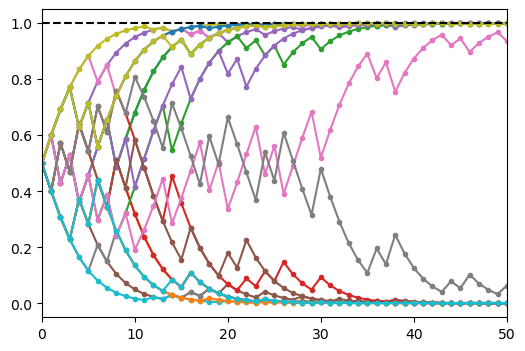

In [14]:
plt.figure(figsize=(6,4))
for trial_i in range(num_trials): 
    plt.plot(posterior_across_trials[trial_i], marker='.')
plt.axhline(y=1.0, linestyle='dashed', color='k')
plt.xlim(0, time_ind)
plt.show()